In [1]:
!pip install tf-levenberg-marquardt

/tmp/ipykernel_8658/2881501840.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


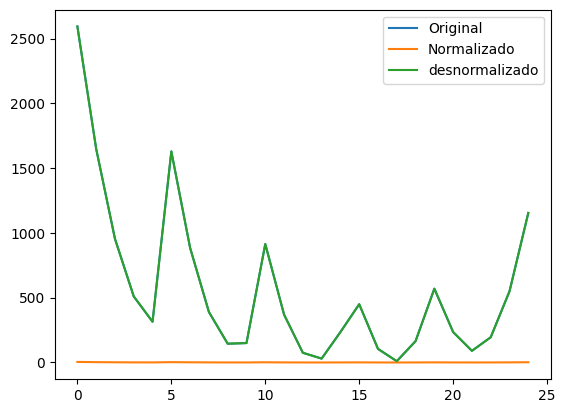

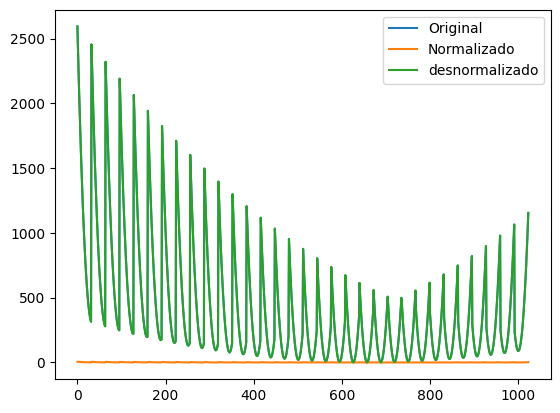

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def function(grid):
    x = np.linspace(-10, 10, grid)
    y = np.linspace(-10, 10, grid)
    x, y = np.meshgrid(x, y)
    z = (x + 2 * y - 7)**2 + (2 * x + y - 5)**2
    return x, y, z

def create_dataframe(grid):
   x, y, z = function(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="function", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [3]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [4]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import tf_levenberg_marquardt as lm


# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())

        self.lm_model = lm.model.ModelWrapper(
            tf.keras.models.clone_model(self.model))
  

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())
        return(self.lm_model)


2025-01-23 11:36:15.646093: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-23 11:36:15.650587: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-23 11:36:15.671720: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737632175.722035    8658 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1737632175.739638    8658 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-23 11:36:15.797382: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [5]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [6]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

 
  def SaveModelWeights(self, model, fileName):
    if not fileName.endswith(".keras"):
        fileName += ".keras"
    path = f"content/models/{fileName}"
    open(path,'w').close()
    model.save(path)

  def SaveDataset(self, trainer, fileName):
    path = f"content/dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] >= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'content/results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

In [ ]:
import os
print(os.getcwd())

/workspaces/Ic-Rna-2024/fuction_ensemble_3/redes-ensemble-s/Teste01


# Treinando com 25 dados


In [8]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='r2',
            boundarie = 0.7, 
            hidden_sizes = [[5], [6], [7], [8], [9], [10], [11], [12], [13], [14]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[5], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  86
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [1_0] | 5

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_0_22,0.787464,0.770890,0.537912,0.721734,0.745029,47407.723326,51104.553813,14003.481779,170679.440154,92341.460966,2.324646,217.733147,-0.700289,227.002498,20.466919,46.063311
model_1_0_21,0.784284,0.767716,0.531431,0.718525,0.742041,48116.984313,51812.741300,14199.889914,172647.439104,93423.664509,2.349692,219.355839,-0.725726,228.694272,20.437219,46.033611
model_1_0_20,0.781046,0.764482,0.524812,0.715265,0.739003,48839.340920,52534.010719,14400.460525,174646.970913,94523.715719,2.374999,220.996246,-0.751634,230.404514,20.407417,46.003809
model_1_0_19,0.777746,0.761187,0.518060,0.711949,0.735913,49575.403745,53268.918634,14605.071911,176681.060780,95643.066345,2.400572,222.655347,-0.778033,232.134247,20.377500,45.973892
model_1_0_18,0.774384,0.757831,0.511170,0.708576,0.732768,50325.335284,54017.649111,14813.877638,178749.639067,96781.758352,2.426415,224.333090,-0.804929,233.883414,20.347472,45.943864
model_1_0_17,0.770958,0.754411,0.504136,0.705147,0.729570,51089.432828,54780.472380,15027.057878,180853.163261,97940.110569,2.452530,226.029717,-0.832334,235.652270,20.317334,45.913726
model_1_0_16,0.767468,0.750926,0.496956,0.701658,0.726315,51868.051757,55557.757516,15244.627297,182993.211408,99118.919352,2.478921,227.745586,-0.860259,237.441187,20.287083,45.883476
model_1_0_15,0.763911,0.747376,0.489628,0.698109,0.723004,52661.387525,56349.690627,15466.693731,185169.794209,100318.243970,2.505586,229.480691,-0.888712,239.250159,20.256724,45.853117
model_1_0_14,0.760286,0.743757,0.482151,0.694497,0.719632,53470.024001,57156.863848,15693.291368,187385.253702,101539.272535,2.532530,231.235862,-0.917714,241.080052,20.226247,45.822639
model_1_0_13,0.756592,0.740070,0.474516,0.690825,0.716203,54293.858519,57979.187665,15924.678641,189637.877381,102781.278011,2.559763,233.010426,-0.947261,242.930162,20.195667,45.792060


DataFrame salvo em content/results/metrics_1_0
+++++++++++ [1_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_24,0.871217,0.858365,-7.525288,0.625258,0.167692,28725.947433,31592.756964,11176.785725,7308.148457,9242.467091,1.802389,169.487308,-0.030263,176.702733,21.468888,47.065280
model_1_1_23,0.868567,0.855582,-7.738530,0.615455,0.146496,29317.004330,32213.580394,11456.348931,7499.328738,9477.838835,1.822453,171.222091,-0.051461,178.511370,21.428154,47.024546
model_1_1_22,0.865868,0.852746,-7.954532,0.605619,0.125109,29919.157053,32846.105050,11739.530436,7691.145623,9715.338029,1.842512,172.971550,-0.073057,180.335307,21.387491,46.983884
model_1_1_21,0.863118,0.849857,-8.173085,0.595751,0.103543,30532.618676,33490.499443,12026.057235,7883.583382,9954.820309,1.862574,174.735854,-0.095059,182.174721,21.346898,46.943291
model_1_1_20,0.860316,0.846915,-8.393963,0.585844,0.081805,31157.428071,34146.727755,12315.631670,8076.794062,10196.212866,1.882650,176.514668,-0.117468,184.029263,21.306384,46.902776
model_1_1_19,0.857462,0.843918,-8.617041,0.575890,0.059896,31794.047344,34815.219680,12608.090788,8270.916273,10439.503530,1.902747,178.308854,-0.140301,185.899831,21.265931,46.862324
model_1_1_18,0.854555,0.840866,-8.842184,0.565875,0.037812,32442.547873,35495.984768,12903.256681,8466.217922,10684.737301,1.922881,180.118150,-0.163559,187.786152,21.225548,46.821940
model_1_1_17,0.851593,0.837758,-9.069305,0.555790,0.015549,33103.274937,36189.324445,13201.015991,8662.900566,10931.958278,1.943067,181.943054,-0.187256,189.688747,21.185225,46.781617
model_1_1_16,0.848575,0.834593,-9.298162,0.545626,-0.006885,33776.361864,36895.342623,13501.050411,8861.111669,11181.081040,1.963311,183.783465,-0.211397,191.607507,21.144967,46.741359
model_1_1_15,0.845501,0.831369,-9.528823,0.535363,-0.029513,34462.184248,37614.372879,13803.451110,9061.264599,11432.357854,1.983633,185.639932,-0.235994,193.543008,21.104764,46.701157


DataFrame salvo em content/results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_24,0.921007,0.909998,0.931057,0.657542,0.914594,17619.877062,20075.518873,4686.477298,1602.057775,3144.267536,1.410270,132.739885,0.368059,138.390897,22.446434,48.042826
model_1_2_23,0.919457,0.908379,0.929956,0.656193,0.913492,17965.754441,20436.674990,4761.328529,1608.367301,3184.847915,1.424054,134.036392,0.355654,139.742599,22.407555,48.003947
model_1_2_22,0.917876,0.906729,0.928838,0.654966,0.912381,18318.329964,20804.813573,4837.338885,1614.106435,3225.722660,1.437966,135.345225,0.343009,141.107152,22.368685,47.965077
model_1_2_21,0.916265,0.905047,0.927701,0.653824,0.911259,18677.808956,21180.058965,4914.638797,1619.451641,3267.045219,1.452010,136.666781,0.330116,142.484969,22.329817,47.926209
model_1_2_20,0.914621,0.903331,0.926544,0.652741,0.910122,19044.356730,21562.621913,4993.260158,1624.517699,3308.888929,1.466186,138.001292,0.316970,143.876293,22.290948,47.887340
model_1_2_19,0.912946,0.901583,0.925368,0.651673,0.908969,19418.129972,21952.631599,5073.176475,1629.510341,3351.343408,1.480508,139.348950,0.303564,145.281324,22.252075,47.848467
model_1_2_18,0.911237,0.899800,0.924171,0.650564,0.907794,19799.336301,22350.257895,5154.560980,1634.698784,3394.629882,1.494973,140.710114,0.289892,146.700435,22.213193,47.809585
model_1_2_17,0.909493,0.897983,0.922952,0.649383,0.906594,20188.144307,22755.678402,5237.393420,1640.223652,3438.808536,1.509585,142.084990,0.275948,148.133842,22.174298,47.770691
model_1_2_16,0.907716,0.896130,0.921712,0.648076,0.905365,20584.708331,23169.015105,5321.733397,1646.338407,3484.035902,1.524342,143.473720,0.261725,149.581693,22.135392,47.731785
model_1_2_15,0.905902,0.894240,0.920447,0.646597,0.904103,20989.256435,23590.468463,5407.704029,1653.259365,3530.481697,1.539254,144.876694,0.247216,151.044395,22.096468,47.692860


DataFrame salvo em content/results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_24,0.943545,0.932500,0.895265,0.669576,0.930436,12592.635349,15056.350795,58671.128709,2863.636072,30767.382391,1.069822,112.216912,0.548362,116.994218,23.118265,48.714657
model_1_3_23,0.942902,0.931855,0.894373,0.664261,0.929818,12736.066815,15200.298502,59171.085831,2909.698913,31040.392372,1.080372,112.854184,0.543218,117.658620,23.095614,48.692006
model_1_3_22,0.942252,0.931202,0.893476,0.658835,0.929197,12881.187749,15345.830819,59673.542511,2956.723350,31315.132931,1.091029,113.495320,0.538013,118.327051,23.072954,48.669346
model_1_3_21,0.941593,0.930542,0.892574,0.653292,0.928572,13028.079604,15493.026675,60178.779823,3004.764597,31591.772210,1.101792,114.140613,0.532745,118.999816,23.050275,48.646668
model_1_3_20,0.940926,0.929875,0.891666,0.647630,0.927942,13176.813124,15641.970424,60687.134770,3053.834583,31870.484677,1.112664,114.790301,0.527411,119.677161,23.027572,48.623964
model_1_3_19,0.940251,0.929199,0.890753,0.641844,0.927306,13327.467824,15792.736667,61198.837725,3103.979764,32151.408744,1.123646,115.444653,0.522007,120.359371,23.004835,48.601227
model_1_3_18,0.939567,0.928514,0.889833,0.635932,0.926666,13480.101377,15945.375164,61714.210348,3155.214051,32434.712199,1.134736,116.103839,0.516533,121.046620,22.982060,48.578453
model_1_3_17,0.938873,0.927821,0.888905,0.629888,0.926019,13634.870224,16100.081739,62233.960644,3207.592509,32720.776576,1.145939,116.768447,0.510982,121.739522,22.959228,48.555621
model_1_3_16,0.938169,0.927118,0.887969,0.623709,0.925366,13791.862290,16256.906639,62758.454258,3261.146008,33009.800133,1.157258,117.438760,0.505352,122.438371,22.936332,48.532724
model_1_3_15,0.937455,0.926404,0.887023,0.617391,0.924705,13951.216380,16416.026928,63288.218775,3315.903194,33302.060984,1.168695,118.115267,0.499636,123.143679,22.913356,48.509748


DataFrame salvo em content/results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_24,0.961668,0.951402,0.979956,0.889894,0.943807,8550.165073,10840.047048,1578.249647,42132.896867,21855.573257,0.800191,92.467103,0.693346,96.403619,23.892588,49.488981
model_1_4_23,0.961188,0.950886,0.979492,0.888748,0.943197,8657.360599,10955.286334,1614.792385,42571.365004,22093.078695,0.807880,93.044939,0.689502,97.006054,23.867670,49.464062
model_1_4_22,0.960708,0.950370,0.979015,0.887616,0.942592,8764.417249,11070.246243,1652.353526,43004.472866,22328.413196,0.815611,93.618466,0.685662,97.603998,23.843089,49.439482
model_1_4_21,0.960228,0.949856,0.978528,0.886495,0.941991,8871.486208,11184.988233,1690.668410,43433.458852,22562.063631,0.823374,94.188567,0.681822,98.198370,23.818805,49.415197
model_1_4_20,0.959749,0.949344,0.978027,0.885393,0.941398,8978.218206,11299.285530,1730.154345,43855.126676,22792.640510,0.831183,94.753460,0.677994,98.787311,23.794887,49.391279
model_1_4_19,0.959270,0.948831,0.977515,0.884300,0.940808,9085.153812,11413.577669,1770.446072,44273.398503,23021.922288,0.839016,95.316073,0.674159,99.373876,23.771206,49.367599
model_1_4_18,0.958793,0.948322,0.976989,0.883229,0.940228,9191.564599,11527.144043,1811.854066,44683.302817,23247.578442,0.846883,95.872648,0.670342,99.954145,23.747917,49.344309
model_1_4_17,0.958316,0.947814,0.976450,0.882172,0.939653,9297.937753,11640.473338,1854.312626,45087.982394,23471.147510,0.854783,96.425815,0.666527,100.530861,23.724904,49.321297
model_1_4_16,0.957837,0.947304,0.975901,0.881118,0.939080,9404.866944,11754.150858,1897.495044,45491.055367,23694.275205,0.862698,96.978693,0.662692,101.107277,23.702035,49.298427
model_1_4_15,0.957355,0.946794,0.975342,0.880071,0.938508,9512.265678,11868.096136,1941.532711,45891.708443,23916.620577,0.870638,97.530845,0.658840,101.682935,23.679325,49.275718


DataFrame salvo em content/results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_24,0.976243,0.967832,0.950920,0.984230,0.985957,5299.262527,7175.253896,1145.152344,3891.798763,2518.475554,0.620819,72.796034,0.809941,75.895112,24.849354,50.445746
model_1_5_23,0.975788,0.967315,0.950497,0.983965,0.985747,5400.557203,7290.637796,1155.018032,3957.083865,2556.050948,0.627144,73.488483,0.806308,76.617040,24.811485,50.407877
model_1_5_22,0.975325,0.966791,0.950090,0.983688,0.985530,5503.915900,7407.547213,1164.520845,4025.510579,2595.015712,0.633510,74.188381,0.802601,77.346734,24.773570,50.369962
model_1_5_21,0.974853,0.966260,0.949685,0.983400,0.985306,5609.283015,7526.018415,1173.978015,4096.564846,2635.271431,0.639916,74.895147,0.798822,78.083588,24.735644,50.332036
model_1_5_20,0.974371,0.965720,0.949267,0.983104,0.985074,5716.796557,7646.394146,1183.729716,4169.729418,2676.729567,0.646401,75.609500,0.794966,78.828353,24.697672,50.294065
model_1_5_19,0.973879,0.965173,0.948856,0.982795,0.984835,5826.515344,7768.435834,1193.312510,4245.933555,2719.623033,0.652931,76.331614,0.791031,79.581209,24.659651,50.256044
model_1_5_18,0.973377,0.964616,0.948399,0.982481,0.984590,5938.370445,7892.664406,1203.972877,4323.348800,2763.660838,0.659565,77.060823,0.787019,80.341462,24.621620,50.218012
model_1_5_17,0.972867,0.964052,0.947930,0.982161,0.984339,6052.141178,8018.534835,1214.907198,4402.470647,2808.688922,0.666213,77.795509,0.782939,81.107425,24.583665,50.180058
model_1_5_16,0.972346,0.963474,0.947404,0.981836,0.984081,6168.398972,8147.291986,1227.185008,4482.615653,2854.900330,0.672942,78.539156,0.778769,81.882730,24.545611,50.142003
model_1_5_15,0.971816,0.962887,0.946826,0.981510,0.983819,6286.632820,8278.297332,1240.678759,4563.129977,2901.904368,0.679728,79.288289,0.774529,82.663756,24.507638,50.104031


DataFrame salvo em content/results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_24,0.985638,0.978138,0.982461,0.985276,0.990290,3203.529209,4876.467991,473.356021,685.506668,579.431344,0.466731,56.599728,0.885105,59.009296,25.855983,51.452376
model_1_6_23,0.985348,0.977824,0.981985,0.985107,0.990117,3268.226600,4946.520685,486.190608,693.376836,589.783722,0.472273,57.168406,0.882784,59.602183,25.815994,51.412387
model_1_6_22,0.985052,0.977504,0.981496,0.984934,0.989938,3334.254039,5018.004057,499.399060,701.443924,600.421492,0.477926,57.743000,0.880416,60.201239,25.775991,51.372384
model_1_6_21,0.984750,0.977176,0.980991,0.984756,0.989755,3401.667227,5091.068471,513.023063,709.704408,611.363735,0.483649,58.323814,0.877998,60.806779,25.735958,51.332350
model_1_6_20,0.984441,0.976839,0.980461,0.984575,0.989565,3470.607138,5166.121613,527.314383,718.150967,622.732675,0.489457,58.911859,0.875526,61.419859,25.695830,51.292223
model_1_6_19,0.984125,0.976496,0.979918,0.984390,0.989370,3540.984066,5242.810321,541.977039,726.746790,634.361915,0.495342,59.506168,0.873002,62.039469,25.655680,51.252072
model_1_6_18,0.983802,0.976143,0.979355,0.984198,0.989167,3613.002112,5321.420071,557.175774,735.708519,646.442146,0.501242,60.108253,0.870419,62.667186,25.615411,51.211804
model_1_6_17,0.983473,0.975783,0.978774,0.984000,0.988959,3686.547045,5401.724992,572.860851,744.897481,658.879166,0.507197,60.716942,0.867781,63.301788,25.575109,51.171501
model_1_6_16,0.983136,0.975415,0.978175,0.983800,0.988745,3761.581057,5483.783251,589.017523,754.221287,671.619405,0.513202,61.331730,0.865090,63.942748,25.534811,51.131203
model_1_6_15,0.982793,0.975039,0.977557,0.983597,0.988526,3838.226426,5567.742185,605.696896,763.686178,684.691537,0.519303,61.953421,0.862341,64.590907,25.494469,51.090861


DataFrame salvo em content/results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_24,0.991217,0.984064,0.994012,0.995603,0.995503,1959.188410,3554.713713,373.861964,1037.412706,705.637335,0.361043,44.262720,0.929733,46.147076,26.839429,52.435821
model_1_7_23,0.991040,0.983878,0.993875,0.995501,0.995399,1998.703020,3596.184117,382.411002,1061.406887,721.908945,0.364747,44.706857,0.928316,46.610120,26.799492,52.395885
model_1_7_22,0.990859,0.983688,0.993733,0.995397,0.995293,2039.015499,3638.452054,391.248175,1085.985532,738.616853,0.368520,45.155459,0.926870,47.077821,26.759555,52.355948
model_1_7_21,0.990675,0.983496,0.993587,0.995291,0.995184,2079.992273,3681.360663,400.386326,1111.033308,755.709817,0.372382,45.606932,0.925401,47.548514,26.719761,52.316153
model_1_7_20,0.990489,0.983301,0.993438,0.995186,0.995075,2121.420004,3724.876303,409.655362,1135.838280,772.746821,0.376240,46.058875,0.923915,48.019697,26.680318,52.276710
model_1_7_19,0.990300,0.983101,0.993285,0.995079,0.994964,2163.742837,3769.341310,419.245741,1161.173814,790.209777,0.380170,46.516049,0.922397,48.496334,26.640810,52.237203
model_1_7_18,0.990107,0.982899,0.993127,0.994970,0.994851,2206.636849,3814.497773,429.108369,1186.703080,807.905724,0.384144,46.974853,0.920858,48.974670,26.601550,52.197943
model_1_7_17,0.989911,0.982692,0.992963,0.994859,0.994735,2250.505839,3860.641546,439.317859,1213.018601,826.168230,0.388207,47.439497,0.919285,49.459094,26.562179,52.158572
model_1_7_16,0.989709,0.982480,0.992796,0.994746,0.994617,2295.417149,3908.057567,449.750447,1239.610920,844.680683,0.392272,47.910512,0.917674,49.950162,26.522660,52.119053
model_1_7_15,0.989505,0.982264,0.992622,0.994630,0.994495,2341.074148,3956.193944,460.585814,1266.916840,863.751327,0.396440,48.384648,0.916037,50.444482,26.483270,52.079662


DataFrame salvo em content/results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_24,0.994651,0.987694,0.996394,0.995989,0.996180,1193.071712,2744.941992,238.595720,300.683205,269.639462,0.289213,34.540870,0.957210,36.011347,27.831427,53.427819
model_1_8_23,0.994544,0.987579,0.996362,0.995887,0.996111,1216.994169,2770.560080,240.744910,308.302869,274.523889,0.291894,34.885444,0.956352,36.370589,27.791721,53.388114
model_1_8_22,0.994435,0.987462,0.996329,0.995784,0.996041,1241.368850,2796.726984,242.880427,316.075969,279.478198,0.294577,35.233065,0.955478,36.733009,27.752060,53.348452
model_1_8_21,0.994323,0.987342,0.996296,0.995680,0.995970,1266.262133,2823.398244,245.090367,323.871525,284.480946,0.297291,35.584577,0.954585,37.099486,27.712351,53.308743
model_1_8_20,0.994209,0.987221,0.996262,0.995574,0.995898,1291.646169,2850.412086,247.319410,331.767301,289.543356,0.300017,35.939479,0.953675,37.469497,27.672654,53.269047
model_1_8_19,0.994093,0.987097,0.996228,0.995468,0.995826,1317.587265,2878.059352,249.599686,339.716085,294.657886,0.302753,36.298585,0.952744,37.843891,27.632885,53.229277
model_1_8_18,0.993974,0.986971,0.996193,0.995361,0.995753,1344.074931,2906.225381,251.887584,347.754872,299.821228,0.305494,36.661628,0.951794,38.222389,27.593077,53.189470
model_1_8_17,0.993853,0.986842,0.996157,0.995253,0.995679,1371.045836,2934.896194,254.259672,355.855290,305.057481,0.308271,37.027636,0.950827,38.603979,27.553342,53.149734
model_1_8_16,0.993730,0.986712,0.996121,0.995145,0.995604,1398.552832,2964.092179,256.672158,363.985809,310.328984,0.311051,37.397230,0.949841,38.989308,27.513613,53.110006
model_1_8_15,0.993604,0.986578,0.996083,0.995035,0.995528,1426.658301,2993.904459,259.141870,372.221781,315.681825,0.313855,37.771131,0.948833,39.379126,27.473820,53.070212


DataFrame salvo em content/results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_24,0.997038,0.989887,0.994024,0.998825,0.998093,660.674908,2255.830614,259.138369,239.628889,249.383629,0.226489,25.703597,0.976305,26.797853,29.013476,54.609869
model_1_9_23,0.996979,0.989835,0.994074,0.998787,0.998072,673.854289,2267.298880,257.002170,247.276632,252.139401,0.228189,25.958704,0.975832,27.063819,28.973972,54.570365
model_1_9_22,0.996918,0.989782,0.994121,0.998748,0.998049,687.481656,2279.254555,254.950687,255.386640,255.168664,0.229902,26.219871,0.975343,27.336106,28.933930,54.530322
model_1_9_21,0.996854,0.989725,0.994159,0.998705,0.998022,701.631104,2291.837626,253.303313,264.084255,258.693784,0.231699,26.488320,0.974836,27.615983,28.893184,54.489577
model_1_9_20,0.996789,0.989668,0.994198,0.998659,0.997993,716.166408,2304.633962,251.597533,273.549459,262.573496,0.233507,26.761286,0.974315,27.900569,28.852175,54.448567
model_1_9_19,0.996722,0.989609,0.994232,0.998609,0.997960,731.161544,2317.784751,250.153183,283.636364,266.894773,0.235388,27.039999,0.973777,28.191148,28.810731,54.407123
model_1_9_18,0.996653,0.989547,0.994253,0.998558,0.997923,746.626750,2331.691777,249.218638,294.173708,271.696173,0.237298,27.324472,0.973222,28.487731,28.768869,54.365262
model_1_9_17,0.996581,0.989482,0.994270,0.998501,0.997882,762.620529,2346.083917,248.497317,305.602485,277.049901,0.239260,27.615585,0.972648,28.791238,28.726479,54.322871
model_1_9_16,0.996507,0.989416,0.994274,0.998444,0.997838,779.028140,2360.928148,248.298278,317.366892,282.832585,0.241302,27.911076,0.972060,29.099308,28.683906,54.280298
model_1_9_15,0.996431,0.989346,0.994274,0.998381,0.997789,796.053214,2376.398551,248.324463,330.123912,289.224188,0.243362,28.214415,0.971449,29.415561,28.640668,54.237060


DataFrame salvo em content/results/metrics_1_9
Testando combinacao2: Hidden Size=[5], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_0_21,0.998669,0.989869,0.997702,0.993969,0.996049,296.827095,2259.749882,50.583937,1676.710640,863.647289,0.115248,17.228671,0.989354,17.962131,30.613700,56.210093
model_2_0_20,0.998662,0.989798,0.997244,0.994078,0.996095,298.384821,2275.573608,60.677985,1646.379754,853.528870,0.126207,17.273819,0.989298,18.009201,30.603232,56.199624
model_2_0_19,0.998650,0.989714,0.996670,0.994194,0.996140,301.155730,2294.260599,73.298419,1614.044881,843.671650,0.138615,17.353839,0.989199,18.092628,30.584745,56.181137
model_2_0_18,0.998630,0.989615,0.995955,0.994316,0.996182,305.540823,2316.362805,89.050959,1580.005641,834.528300,0.152394,17.479726,0.989042,18.223874,30.555833,56.152226
model_2_0_17,0.998602,0.989499,0.995062,0.994448,0.996221,311.840796,2342.291224,108.694602,1543.324564,826.009583,0.167713,17.659015,0.988816,18.410795,30.515014,56.111407
model_2_0_16,0.998564,0.989364,0.993952,0.994596,0.996259,320.310280,2372.411300,133.143664,1502.173351,817.658508,0.184719,17.897214,0.988512,18.659136,30.461420,56.057812
model_2_0_15,0.998512,0.989204,0.992570,0.994754,0.996290,331.918117,2408.024611,163.567416,1458.374341,810.970878,0.203612,18.218620,0.988096,18.994224,30.390223,55.986616
model_2_0_14,0.998442,0.989015,0.990852,0.994919,0.996308,347.590061,2450.349223,201.387795,1412.416826,806.902311,0.224607,18.643767,0.987534,19.437471,30.297952,55.894345
model_2_0_13,0.998347,0.988786,0.988719,0.995082,0.996304,368.824934,2501.407765,248.344022,1367.255559,807.799790,0.247928,19.204815,0.986772,20.022404,30.179356,55.775748
model_2_0_12,0.998221,0.988512,0.986070,0.995245,0.996274,396.767508,2562.542559,306.650802,1321.902238,814.276520,0.273851,19.919024,0.985770,20.767018,30.033299,55.629691


DataFrame salvo em content/results/metrics_2_0
+++++++++++ [2_1] | 1 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_1_24,0.999919,0.993834,0.999946,0.999606,0.999701,18.154631,1375.260107,3.221441,108.169591,55.695516,0.011329,4.260825,0.999349,4.442217,36.202149,61.798541
model_2_1_23,0.999919,0.993826,0.999944,0.999608,0.999703,18.141344,1377.216558,3.331776,107.482154,55.406965,0.011376,4.259266,0.999349,4.440591,36.203613,61.800005
model_2_1_22,0.999931,0.993716,0.999945,0.999680,0.999755,15.421810,1401.687957,3.262369,87.913809,45.588089,0.010232,3.927061,0.999447,4.094244,36.528435,62.124827
model_2_1_21,0.999931,0.993701,0.999941,0.999684,0.999758,15.459099,1405.033057,3.537880,86.694978,45.116429,0.010345,3.931806,0.999446,4.099191,36.523605,62.119997
model_2_1_20,0.999938,0.993645,0.999941,0.999719,0.999784,13.923175,1417.435712,3.527742,77.093804,40.310773,0.009304,3.731377,0.999501,3.890229,36.732891,62.329283
model_2_1_19,0.999940,0.993616,0.999938,0.999735,0.999795,13.344339,1423.936862,3.715731,72.686997,38.201364,0.009149,3.652990,0.999521,3.808506,36.817816,62.414208
model_2_1_18,0.999936,0.993561,0.999919,0.999740,0.999796,14.380224,1436.261005,4.822147,71.266250,38.044198,0.009764,3.792127,0.999484,3.953565,36.668292,62.264684
model_2_1_17,0.999937,0.993519,0.999913,0.999759,0.999808,13.961114,1445.574384,5.215090,66.282388,35.748739,0.009815,3.736457,0.999499,3.895526,36.727448,62.323841
model_2_1_16,0.999937,0.993489,0.999903,0.999767,0.999813,14.095984,1452.283951,5.775731,63.923225,34.849478,0.010004,3.754462,0.999494,3.914297,36.708220,62.304612
model_2_1_15,0.999937,0.993453,0.999895,0.999780,0.999821,14.053676,1460.403666,6.280411,60.439779,33.360095,0.010206,3.748823,0.999496,3.908418,36.714232,62.310624


DataFrame salvo em content/results/metrics_2_1
+++++++++++ [2_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_0,0.999935,0.993791,0.999975,0.999989,0.999989,14.560820,1384.967910,1.032160,6.693955,3.863058,0.011208,3.815864,0.999478,3.978313,36.643331,62.239724
model_2_2_1,0.999940,0.993748,0.999990,0.999977,0.999979,13.404086,1394.587570,0.416150,14.314127,7.365138,0.010595,3.661159,0.999519,3.817022,36.808881,62.405273
model_2_2_2,0.999943,0.993695,0.999991,0.999964,0.999968,12.615990,1406.301982,0.374143,22.219348,11.296746,0.010186,3.551899,0.999548,3.703111,36.930070,62.526462
model_2_2_3,0.999949,0.993598,0.999952,0.999963,0.999965,11.377238,1428.090265,1.968285,23.016492,12.492388,0.009868,3.373016,0.999592,3.516612,37.136771,62.733163
model_2_2_4,0.999950,0.993492,0.999862,0.999958,0.999955,11.064509,1451.627551,5.644943,26.312194,15.978569,0.009294,3.326336,0.999603,3.467945,37.192515,62.788907
model_2_2_5,0.999947,0.993394,0.999741,0.999947,0.999939,11.772614,1473.508767,10.572829,32.994245,21.783537,0.008990,3.431124,0.999578,3.577194,37.068448,62.664840
model_2_2_6,0.999941,0.993291,0.999539,0.999937,0.999918,13.200464,1496.548301,18.807139,39.380003,29.093571,0.008813,3.633244,0.999527,3.787919,36.839496,62.435888
model_2_2_7,0.999932,0.993194,0.999311,0.999924,0.999894,15.243594,1518.139980,28.079200,47.483318,37.781259,0.008983,3.904305,0.999453,4.070519,36.551681,62.148074
model_2_2_8,0.999921,0.993110,0.999108,0.999907,0.999868,17.622863,1536.833943,36.357622,57.878702,47.118162,0.009194,4.197959,0.999368,4.376675,36.261606,61.857998
model_2_2_9,0.999909,0.993031,0.998896,0.999889,0.999839,20.356641,1554.518532,45.030936,69.325748,57.178342,0.009359,4.511833,0.999270,4.703912,35.973186,61.569578


DataFrame salvo em content/results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_24,0.999979,0.992922,0.999917,0.999859,0.999908,4.646361,1578.877438,19.700795,9.079297,14.390046,0.012809,2.155542,0.999833,2.247308,38.927831,64.524224
model_2_3_23,0.999979,0.992919,0.999917,0.999860,0.999909,4.631234,1579.374766,19.626570,8.997326,14.311948,0.012950,2.152030,0.999834,2.243647,38.934353,64.530746
model_2_3_22,0.999979,0.992917,0.999917,0.999861,0.999909,4.618345,1579.850788,19.548169,8.919497,14.233833,0.013102,2.149034,0.999834,2.240522,38.939927,64.536319
model_2_3_21,0.999979,0.992915,0.999918,0.999863,0.999910,4.605153,1580.421881,19.463225,8.828489,14.145857,0.013280,2.145962,0.999835,2.237320,38.945648,64.542041
model_2_3_20,0.999979,0.992912,0.999918,0.999865,0.999911,4.576727,1581.094663,19.303950,8.694087,13.999018,0.013471,2.139329,0.999836,2.230404,38.958032,64.554424
model_2_3_19,0.999980,0.992908,0.999919,0.999867,0.999912,4.543036,1581.930777,19.112773,8.529849,13.821311,0.013664,2.131440,0.999837,2.222180,38.972809,64.569201
model_2_3_18,0.999980,0.992905,0.999920,0.999869,0.999913,4.528595,1582.694839,18.970773,8.404381,13.687577,0.013899,2.128050,0.999838,2.218645,38.979177,64.575569
model_2_3_17,0.999980,0.992901,0.999920,0.999871,0.999914,4.515809,1583.517834,18.810661,8.266823,13.538742,0.014132,2.125043,0.999838,2.215511,38.984831,64.581223
model_2_3_16,0.999980,0.992897,0.999921,0.999875,0.999915,4.483146,1584.453142,18.547980,8.053753,13.300867,0.014391,2.117344,0.999839,2.207484,38.999350,64.595742
model_2_3_15,0.999980,0.992892,0.999922,0.999878,0.999916,4.474915,1585.489194,18.338400,7.876760,13.107580,0.014706,2.115399,0.999840,2.205456,39.003025,64.599418


DataFrame salvo em content/results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_8,0.999794,0.992944,0.999367,0.999980,0.999645,46.030845,1573.863137,283.949035,1.373213,142.661124,0.010486,6.784604,0.998349,7.073438,34.341377,59.937769
model_2_4_0,0.999912,0.992927,0.999758,0.999983,0.999863,19.726466,1577.624786,108.849143,1.151694,55.000418,0.014079,4.441449,0.999293,4.630530,36.036078,61.632470
model_2_4_1,0.999886,0.992917,0.999674,0.999976,0.999816,25.398370,1580.022479,146.247123,1.622417,73.934770,0.013694,5.039680,0.999089,5.254229,35.530630,61.127022
model_2_4_2,0.999872,0.992916,0.999627,0.999969,0.999789,28.507519,1580.179725,167.448023,2.125666,84.786845,0.013263,5.339243,0.998978,5.566546,35.299664,60.896057
model_2_4_3,0.999865,0.992915,0.999601,0.999969,0.999775,30.113249,1580.469512,178.929561,2.108212,90.518886,0.012845,5.487554,0.998920,5.721171,35.190070,60.786462
model_2_4_5,0.999852,0.992913,0.999557,0.999970,0.999750,32.917319,1580.915953,198.657459,2.043702,100.350581,0.011887,5.737362,0.998819,5.981613,35.012002,60.608394
model_2_4_4,0.999852,0.992911,0.999558,0.999966,0.999750,33.073298,1581.171635,198.401978,2.318903,100.360441,0.012696,5.750939,0.998814,5.995768,35.002547,60.598940
model_2_4_6,0.999847,0.992911,0.999539,0.999970,0.999740,34.135378,1581.184970,207.092693,1.994308,104.543500,0.011161,5.842549,0.998776,6.091278,34.939331,60.535724
model_2_4_7,0.999822,0.992906,0.999461,0.999970,0.999697,39.633737,1582.352833,241.922901,2.007673,121.965287,0.010419,6.295533,0.998579,6.563547,34.640639,60.237031
model_2_4_10,0.999775,0.992892,0.999304,0.999993,0.999611,50.193572,1585.548212,312.385846,0.462657,156.424251,0.008178,7.084742,0.998200,7.386354,34.168226,59.764618


DataFrame salvo em content/results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_24,0.999981,0.993436,0.999748,0.999873,0.999910,4.191031,1464.179390,2.847609,23.344548,13.096078,0.002167,2.047201,0.999850,2.134354,39.134106,64.730499
model_2_5_23,0.999981,0.993434,0.999750,0.999874,0.999911,4.174947,1464.546462,2.835102,23.258744,13.046923,0.002165,2.043269,0.999850,2.130255,39.141797,64.738189
model_2_5_22,0.999982,0.993425,0.999756,0.999878,0.999913,4.044939,1466.606161,2.758372,22.521780,12.640076,0.002195,2.011203,0.999855,2.096824,39.205067,64.801459
model_2_5_21,0.999982,0.993423,0.999758,0.999879,0.999914,4.016762,1467.067634,2.742260,22.361760,12.552010,0.002211,2.004186,0.999856,2.089508,39.219048,64.815440
model_2_5_20,0.999982,0.993417,0.999762,0.999881,0.999916,3.946745,1468.468239,2.690109,21.976131,12.333120,0.002244,1.986642,0.999858,2.071217,39.254218,64.850610
model_2_5_19,0.999982,0.993415,0.999763,0.999881,0.999916,3.933841,1468.735290,2.681161,21.904370,12.292765,0.002259,1.983391,0.999859,2.067828,39.260767,64.857160
model_2_5_18,0.999982,0.993413,0.999764,0.999882,0.999916,3.904405,1469.353559,2.675104,21.726419,12.200761,0.002230,1.975957,0.999860,2.060077,39.275789,64.872181
model_2_5_17,0.999983,0.993410,0.999764,0.999883,0.999917,3.865459,1469.936363,2.670698,21.488110,12.079404,0.002238,1.966077,0.999861,2.049777,39.295839,64.892232
model_2_5_16,0.999983,0.993405,0.999765,0.999884,0.999918,3.838322,1471.032636,2.656423,21.332194,11.994309,0.002263,1.959164,0.999862,2.042569,39.309930,64.906322
model_2_5_15,0.999983,0.993402,0.999773,0.999884,0.999918,3.845388,1471.822542,2.570200,21.456851,12.013525,0.002313,1.960966,0.999862,2.044448,39.306251,64.902643


DataFrame salvo em content/results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_0,0.999992,0.993009,0.999964,0.999980,0.999985,1.825771,1559.384441,1.065505,10.284319,5.674912,0.001827,1.351211,0.999935,1.408735,40.795995,66.392387
model_2_6_1,0.999991,0.993007,0.999963,0.999979,0.999984,1.925469,1559.830472,1.083837,10.905918,5.994878,0.001529,1.387613,0.999931,1.446686,40.689661,66.286053
model_2_6_2,0.999991,0.992999,0.999963,0.999979,0.999985,1.897433,1561.677761,1.077170,10.763374,5.920272,0.001332,1.377473,0.999932,1.436115,40.718997,66.315389
model_2_6_5,0.999993,0.992985,0.999962,0.999982,0.999987,1.645534,1564.725389,1.129971,9.152860,5.141416,0.000814,1.282784,0.999941,1.337394,41.003870,66.600263
model_2_6_4,0.999993,0.992985,0.999962,0.999982,0.999987,1.635979,1564.748980,1.128131,9.094963,5.111547,0.000848,1.279054,0.999941,1.333506,41.015517,66.611909
model_2_6_3,0.999993,0.992985,0.999961,0.999983,0.999987,1.602137,1564.815663,1.140069,8.871115,5.005592,0.000849,1.265755,0.999943,1.319641,41.057324,66.653716
model_2_6_6,0.999993,0.992985,0.999962,0.999982,0.999987,1.638269,1564.854515,1.121134,9.117050,5.119092,0.000785,1.279949,0.999941,1.334439,41.012720,66.609112
model_2_6_22,0.999992,0.992982,0.999961,0.999981,0.999986,1.742589,1565.336388,1.152773,9.738079,5.445426,0.000818,1.320072,0.999938,1.376270,40.889256,66.485648
model_2_6_21,0.999992,0.992982,0.999961,0.999981,0.999986,1.742589,1565.336388,1.152773,9.738079,5.445426,0.000818,1.320072,0.999938,1.376270,40.889256,66.485648
model_2_6_20,0.999992,0.992982,0.999961,0.999981,0.999986,1.742589,1565.336388,1.152773,9.738079,5.445426,0.000818,1.320072,0.999938,1.376270,40.889256,66.485648


DataFrame salvo em content/results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_0,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_22,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_21,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_20,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_19,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_18,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_17,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_16,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_15,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_7_14,0.999992,0.992982,1.0,0.999982,0.99999,1.742589,1565.336388,0.008917,9.727813,4.868365,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648


DataFrame salvo em content/results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_0,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_22,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_21,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_20,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_19,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_18,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_17,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_16,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_15,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_8_14,0.999992,0.992982,1.0,1.0,1.0,1.742589,1565.336388,0.005005,0.008973,0.006989,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648


DataFrame salvo em content/results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_0,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_22,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_21,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_20,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_19,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_18,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_17,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_16,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_15,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648
model_2_9_14,0.999992,0.992982,1.0,0.99997,0.999996,1.742589,1565.336388,0.000103,0.617299,0.308701,0.000818,1.320072,0.999938,1.37627,40.889256,66.485648


DataFrame salvo em content/results/metrics_2_9
Testando combinacao3: Hidden Size=[5], regularizer=0.05, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  63
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_1_0,0.700853,0.717971,0.575983,0.224398,0.472142,66726.842221,62908.732875,49627.580313,104887.104101,77257.342207,2.387897,258.315393,-1.393173,269.312414,19.783275,45.379667


DataFrame salvo em content/results/metrics_3_1
+++++++++++ [3_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_2_17,0.790933,0.781344,0.666723,0.889209,0.880094,46633.928901,48772.852348,5746.265192,26400.007193,16073.136193,2.523341,215.948903,-0.672536,225.142295,20.499833,46.096225
model_3_2_18,0.793839,0.781076,0.627493,0.891283,0.879414,45985.628438,48832.562550,6422.652803,25905.927841,16164.290322,2.546568,214.442599,-0.649285,223.571865,20.527832,46.124224
model_3_2_19,0.796620,0.780843,0.581494,0.892749,0.877760,45365.483812,48884.579201,7215.747780,25556.514224,16386.131002,2.561816,212.991746,-0.627043,222.059245,20.554986,46.151379
model_3_2_16,0.787547,0.780781,0.691260,0.886204,0.879001,47389.216494,48898.421960,5323.207373,27116.177639,16219.692506,2.506996,217.690644,-0.699625,226.958185,20.467700,46.064092
model_3_2_20,0.799105,0.780267,0.525145,0.893389,0.874704,44811.118281,49013.050424,8187.308377,25404.006791,16795.657584,2.577838,211.686368,-0.607161,220.698295,20.579577,46.175969
model_3_2_15,0.784052,0.780180,0.708416,0.882678,0.876970,48168.754899,49032.504377,5027.400306,27956.441805,16491.921055,2.481758,219.473814,-0.727583,228.817268,20.435068,46.031461
model_3_2_14,0.780113,0.778747,0.714161,0.878422,0.873557,49047.305579,49352.087298,4928.356660,28970.547723,16949.452192,2.467300,221.466263,-0.759093,230.894540,20.398919,45.995311
model_3_2_13,0.775951,0.776937,0.712725,0.873716,0.869282,49975.862971,49755.933390,4953.105177,30091.826818,17522.465997,2.454630,223.552819,-0.792396,233.069926,20.361409,45.957801
model_3_2_21,0.799711,0.776185,0.412553,0.890496,0.864892,44675.983914,49923.503165,10128.592407,26093.512150,18111.052278,2.640686,211.366941,-0.602314,220.365270,20.585617,46.182010
model_3_2_22,0.801574,0.774969,0.332859,0.889299,0.858703,44260.425188,50194.774882,11502.645963,26378.623819,18940.634891,2.649439,210.381618,-0.587410,219.337999,20.604308,46.200700


DataFrame salvo em content/results/metrics_3_2
+++++++++++ [3_3] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_3_18,0.965676,0.921177,0.900945,0.882857,0.892115,7656.314746,17582.005595,21334.078843,25831.444361,23582.761602,0.646323,87.500370,0.725405,91.225442,24.113428,49.709820
model_3_3_19,0.965617,0.921111,0.900757,0.882611,0.891899,7669.297971,17596.673596,21374.517415,25885.766977,23630.142196,0.644975,87.574528,0.724939,91.302757,24.110039,49.706432
model_3_3_20,0.965559,0.921046,0.900570,0.882366,0.891683,7682.231705,17611.296651,21414.814534,25939.660364,23677.237449,0.643644,87.648341,0.724475,91.379712,24.106669,49.703062
model_3_3_21,0.965501,0.920980,0.900384,0.882123,0.891469,7695.142682,17625.905211,21454.946332,25993.306658,23724.126495,0.642321,87.721962,0.724012,91.456468,24.103311,49.699703
model_3_3_22,0.965444,0.920915,0.900199,0.881882,0.891256,7707.955219,17640.407865,21494.732583,26046.442226,23770.587405,0.641011,87.794961,0.723552,91.532575,24.099984,49.696376
model_3_3_23,0.965387,0.920850,0.900015,0.881642,0.891044,7720.754232,17654.913365,21534.414861,26099.351070,23816.882966,0.639708,87.867823,0.723093,91.608538,24.096665,49.693058
model_3_3_24,0.965329,0.920785,0.899832,0.881403,0.890834,7733.513420,17669.376546,21573.816513,26152.018292,23862.917402,0.638418,87.940397,0.722636,91.684202,24.093363,49.689755
model_3_3_0,0.815341,0.749820,0.821392,0.898704,0.860917,41189.467978,55804.521450,38467.816773,22336.986419,30402.401596,2.699101,202.951886,-0.477269,211.591968,20.748124,46.344517
model_3_3_1,0.819930,0.744082,0.830010,0.907663,0.869682,40165.905865,57084.463056,36611.793587,20361.391728,28486.592658,2.653585,200.414335,-0.440559,208.946389,20.798452,46.394845
model_3_3_2,0.824557,0.738985,0.837264,0.914195,0.876550,39133.735753,58221.201948,35049.304960,18920.956731,26985.130845,2.614549,197.822485,-0.403540,206.244198,20.850520,46.446912


DataFrame salvo em content/results/metrics_3_3
+++++++++++ [3_4] | 1 ++++++++++++++++++
Stopped at epoch:  66
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_4_24,0.975893,0.974016,0.396898,0.776844,0.709570,5377.240154,5795.833755,10646.292046,15019.490720,12832.891383,0.383195,73.329668,0.807144,76.451463,24.820139,50.416531
model_3_4_23,0.975545,0.973715,0.391622,0.773468,0.705945,5454.762045,5863.107525,10739.426852,15246.739910,12993.083381,0.383240,73.856361,0.804364,77.000579,24.791511,50.387904
model_3_4_22,0.975192,0.973408,0.386297,0.770029,0.702262,5533.609884,5931.487454,10833.426877,15478.203235,13155.815056,0.383291,74.388238,0.801536,77.555099,24.762809,50.359201
model_3_4_21,0.974832,0.973096,0.380918,0.766523,0.698517,5613.885360,6001.100625,10928.367674,15714.184921,13321.276298,0.383352,74.925866,0.798657,78.115615,24.734003,50.330396
model_3_4_20,0.974466,0.972779,0.375509,0.762959,0.694722,5695.441124,6071.792340,11023.852755,15954.055994,13488.954375,0.383417,75.468146,0.795732,78.680982,24.705157,50.301550
model_3_4_19,0.974094,0.972457,0.370044,0.759323,0.690862,5778.489774,6143.777967,11120.335979,16198.742409,13659.539194,0.383494,76.016378,0.792753,79.252553,24.676205,50.272597
model_3_4_18,0.973715,0.972128,0.364514,0.755616,0.686934,5863.083977,6217.119290,11217.949429,16448.244764,13833.097096,0.383597,76.570778,0.789719,79.830554,24.647138,50.243530
model_3_4_17,0.973330,0.971794,0.358985,0.751856,0.682966,5948.828676,6291.480717,11315.551264,16701.297693,14008.424478,0.383696,77.128650,0.786644,80.412176,24.618101,50.214493
model_3_4_16,0.972939,0.971454,0.353388,0.748015,0.678922,6036.255262,6367.317853,11414.341420,16959.866246,14187.103833,0.383825,77.693341,0.783508,81.000908,24.588922,50.185314
model_3_4_15,0.972542,0.971110,0.347840,0.744130,0.674855,6124.617287,6444.035654,11512.293921,17221.288490,14366.791205,0.383936,78.259934,0.780339,81.591622,24.559857,50.156249


DataFrame salvo em content/results/metrics_3_4
+++++++++++ [3_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_5_24,0.985559,0.984196,0.952662,0.981643,0.967912,3221.113999,3525.167367,4123.280743,1376.530399,2749.905571,0.320598,56.754859,0.884474,59.171031,25.845035,51.441427
model_3_5_23,0.985294,0.983967,0.952246,0.981058,0.967445,3280.301754,3576.362145,4159.530762,1420.361813,2789.946287,0.320816,57.273919,0.882351,59.712188,25.808619,51.405011
model_3_5_22,0.985020,0.983716,0.951813,0.980515,0.966987,3341.293122,3632.365928,4197.242863,1461.103413,2829.173138,0.321837,57.803920,0.880164,60.264752,25.771774,51.368166
model_3_5_21,0.984735,0.983450,0.951309,0.979952,0.966484,3404.945904,3691.687490,4241.180281,1503.331492,2872.255886,0.323308,58.351914,0.877881,60.836076,25.734031,51.330424
model_3_5_20,0.984438,0.983167,0.950719,0.979332,0.965913,3471.192603,3754.832179,4292.552164,1549.836419,2921.194291,0.325035,58.916828,0.875505,61.425039,25.695493,51.291885
model_3_5_19,0.984136,0.982873,0.950096,0.978766,0.965349,3538.587935,3820.366661,4346.815472,1592.227616,2969.521544,0.327066,59.486031,0.873088,62.018475,25.657034,51.253426
model_3_5_18,0.983823,0.982561,0.949397,0.978149,0.964724,3608.340041,3889.845712,4407.683753,1638.502865,3023.093309,0.329086,60.069460,0.870586,62.626741,25.617994,51.214386
model_3_5_17,0.983498,0.982234,0.948624,0.977504,0.964049,3680.796764,3962.812686,4475.030280,1686.924530,3080.977405,0.331297,60.669570,0.867987,63.252400,25.578231,51.174623
model_3_5_16,0.983165,0.981894,0.947789,0.976852,0.963340,3755.247955,4038.748424,4547.711464,1735.762801,3141.737133,0.333598,61.280078,0.865317,63.888898,25.538181,51.134573
model_3_5_15,0.982820,0.981539,0.946894,0.976202,0.962600,3832.063907,4117.875873,4625.710984,1784.531590,3205.121287,0.336004,61.903666,0.862562,64.539034,25.497682,51.094075


DataFrame salvo em content/results/metrics_3_5
+++++++++++ [3_6] | 1 ++++++++++++++++++
Stopped at epoch:  36
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_6_0,0.989987,0.986899,0.992024,0.998053,0.993943,2233.566711,2922.285354,4759.124556,536.905897,2648.015227,0.238407,47.260625,0.919893,49.272608,26.577290,52.173682
model_3_6_1,0.989887,0.986735,0.991377,0.998341,0.993592,2255.784078,2958.793938,5145.503686,457.409872,2801.456779,0.236273,47.495095,0.919096,49.517060,26.557494,52.153887
model_3_6_2,0.989760,0.986544,0.990679,0.998614,0.993202,2284.124258,3001.558880,5561.684147,382.232952,2971.958550,0.234215,47.792513,0.918079,49.827139,26.532524,52.128916
model_3_6_3,0.989583,0.986299,0.989871,0.998885,0.992736,2323.574093,3056.008989,6043.855175,307.368380,3175.611777,0.232322,48.203466,0.916664,50.255587,26.498276,52.094669
model_3_6_4,0.989371,0.986019,0.988999,0.999132,0.992219,2370.866201,3118.617244,6564.187210,239.275672,3401.731441,0.230575,48.691541,0.914968,50.764441,26.457979,52.054371
model_3_6_5,0.989135,0.985714,0.988093,0.999343,0.991667,2423.487587,3186.535117,7104.870740,181.168658,3643.019699,0.228814,49.228930,0.913081,51.324708,26.414074,52.010466
model_3_6_6,0.988884,0.985395,0.987176,0.999514,0.991095,2479.442449,3257.681035,7652.165554,134.004828,3893.085191,0.227020,49.794000,0.911074,51.913834,26.368422,51.964814
model_3_6_7,0.988587,0.985027,0.986166,0.999660,0.990452,2545.828719,3339.755815,8254.537493,93.614830,4174.076161,0.225381,50.456206,0.908693,52.604231,26.315577,51.911969
model_3_6_8,0.988257,0.984626,0.985104,0.999770,0.989762,2619.399305,3429.184575,8888.225409,63.517190,4475.871299,0.223743,51.180067,0.906055,53.358909,26.258599,51.854992
model_3_6_9,0.987898,0.984197,0.983997,0.999840,0.989028,2699.530632,3525.017928,9548.930395,44.063933,4796.497164,0.222222,51.957008,0.903181,54.168925,26.198334,51.794726


DataFrame salvo em content/results/metrics_3_6
+++++++++++ [3_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_7_24,0.987242,0.978693,0.973904,0.745642,0.980068,2845.837002,4752.697010,14736.070090,2407.308282,8571.689186,0.197727,53.346387,0.897933,55.617453,26.092775,51.689167
model_3_7_23,0.987159,0.978638,0.973672,0.748675,0.979949,2864.303033,4764.985457,14867.190745,2378.604004,8622.897375,0.198521,53.519184,0.897271,55.797606,26.079839,51.676232
model_3_7_22,0.986966,0.978503,0.973148,0.754470,0.979668,2907.298498,4795.098627,15163.506337,2323.757997,8743.632167,0.200159,53.919370,0.895729,56.214830,26.050041,51.646433
model_3_7_21,0.983115,0.976356,0.962618,0.871354,0.974041,3766.325561,5274.060294,21109.342503,1217.539718,11163.441110,0.200683,61.370396,0.864920,63.983061,25.532290,51.128682
model_3_7_20,0.982892,0.976265,0.962002,0.877784,0.973707,3816.109220,5294.255871,21457.183323,1156.678662,11306.930993,0.198135,61.774665,0.863134,64.404540,25.506027,51.102419
model_3_7_19,0.982658,0.976158,0.961368,0.883723,0.973356,3868.370780,5318.240979,21815.556485,1100.476689,11458.016587,0.195935,62.196228,0.861260,64.844050,25.478823,51.075215
model_3_7_18,0.982418,0.976056,0.960734,0.888773,0.972996,3921.882600,5340.965529,22173.219259,1052.678186,11612.948722,0.193036,62.624936,0.859341,65.291009,25.451346,51.047738
model_3_7_17,0.982198,0.975963,0.960163,0.893140,0.972668,3970.872414,5361.598065,22495.893262,1011.345951,11753.619607,0.191864,63.014859,0.857584,65.697532,25.426518,51.022910
model_3_7_16,0.981948,0.975822,0.959542,0.895995,0.972292,4026.653599,5392.969635,22846.390782,984.331535,11915.361159,0.191638,63.455919,0.855583,66.157368,25.398618,50.995010
model_3_7_15,0.981703,0.975688,0.958946,0.898079,0.971924,4081.290729,5422.908508,23182.930213,964.605570,12073.767891,0.191333,63.884980,0.853624,66.604696,25.371663,50.968055


DataFrame salvo em content/results/metrics_3_7
+++++++++++ [3_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_8] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_8_24,0.993597,0.987830,0.999619,0.995388,0.998662,1428.265292,2714.648587,83.192320,294.214640,188.703480,0.177528,37.792397,0.948775,39.401298,27.471568,53.067961
model_3_8_23,0.993494,0.987734,0.999606,0.995706,0.998724,1451.121852,2736.102051,86.021674,273.897517,179.959596,0.178288,38.093593,0.947955,39.715316,27.439816,53.036208
model_3_8_22,0.992795,0.986821,0.999477,0.995362,0.998546,1607.170007,2939.708360,114.178457,295.901516,205.039986,0.195225,40.089525,0.942358,41.796219,27.235540,52.831932
model_3_8_21,0.992677,0.986721,0.999458,0.995783,0.998627,1633.483738,2961.875423,118.272641,268.999778,193.636210,0.196486,40.416380,0.941415,42.136989,27.203059,52.799452
model_3_8_20,0.992549,0.986613,0.999440,0.995928,0.998646,1661.962049,2985.962804,122.249652,259.756582,191.003117,0.198323,40.767169,0.940393,42.502712,27.168492,52.764884
model_3_8_19,0.992420,0.986519,0.999529,0.996095,0.998752,1690.790282,3007.031439,102.859283,249.124466,175.991874,0.158796,41.119220,0.939359,42.869751,27.134097,52.730490
model_3_8_18,0.992268,0.986366,0.999497,0.996146,0.998739,1724.649255,3041.068096,109.869223,245.868635,177.868929,0.160253,41.528897,0.938145,43.296868,27.094442,52.690834
model_3_8_17,0.992130,0.986229,0.999488,0.996349,0.998778,1755.447031,3071.682700,111.663310,232.895152,172.279231,0.160683,41.898055,0.937040,43.681742,27.059042,52.655435
model_3_8_16,0.991988,0.986084,0.999481,0.996521,0.998812,1787.116427,3104.011003,113.306467,221.920792,167.613629,0.161304,42.274300,0.935905,44.074004,27.023283,52.619675
model_3_8_15,0.991837,0.985937,0.999457,0.996550,0.998799,1820.836031,3136.915067,118.603197,220.071123,169.337160,0.162710,42.671255,0.934695,44.487859,26.985898,52.582290


DataFrame salvo em content/results/metrics_3_8
+++++++++++ [3_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [3_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_9_24,0.996074,0.992122,0.993465,0.991870,0.994328,875.750333,1757.344204,3852.292878,843.310740,2347.801809,0.221402,29.593079,0.968591,30.852918,28.449838,54.046230
model_3_9_23,0.996017,0.992063,0.993351,0.991900,0.994250,888.465544,1770.420775,3919.768052,840.165080,2379.966566,0.223842,29.807139,0.968135,31.076091,28.421008,54.017401
model_3_9_22,0.996024,0.991961,0.993295,0.992602,0.994298,886.862651,1793.097225,3952.700185,767.362662,2360.031424,0.227127,29.780239,0.968192,31.048046,28.424620,54.021012
model_3_9_21,0.996604,0.991510,0.994167,0.996964,0.995466,757.575000,1893.735916,3438.304225,314.870808,1876.587517,0.217354,27.524080,0.972829,28.695837,28.739755,54.336147
model_3_9_20,0.996537,0.991394,0.994031,0.997033,0.995378,772.364448,1919.571400,3518.851847,307.708451,1913.280149,0.220659,27.791446,0.972299,28.974585,28.701087,54.297479
model_3_9_19,0.996217,0.991009,0.993376,0.996541,0.994850,843.890156,2005.595765,3904.556597,358.781723,2131.669160,0.206383,29.049788,0.969734,30.286497,28.523955,54.120348
model_3_9_18,0.996166,0.990937,0.993275,0.996613,0.994787,855.154186,2021.524617,3964.423535,351.347643,2157.885589,0.208001,29.243019,0.969330,30.487955,28.497436,54.093829
model_3_9_17,0.995947,0.990713,0.992839,0.996335,0.994442,904.136097,2071.600728,4221.171034,380.161450,2300.666242,0.204930,30.068856,0.967573,31.348949,28.386040,53.982433
model_3_9_16,0.995838,0.990581,0.992622,0.996326,0.994286,928.257939,2100.873099,4349.440707,381.046660,2365.243684,0.207269,30.467326,0.966708,31.764383,28.333381,53.929773
model_3_9_15,0.995737,0.990466,0.992416,0.996319,0.994138,950.955067,2126.663666,4470.956277,381.785013,2426.370645,0.209915,30.837559,0.965894,32.150378,28.285066,53.881459


DataFrame salvo em content/results/metrics_3_9
Testando combinacao4: Hidden Size=[5], regularizer=0.05, learning_rate=0.1
+++++++++++ [4_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_0_11,0.994741,0.993513,0.994625,0.992822,0.993867,1173.106081,1447.078453,301.917145,4179.211772,2240.564459,0.416876,34.250636,0.957926,35.708757,27.865179,53.461572
model_4_0_10,0.994055,0.993458,0.993830,0.992353,0.993432,1326.037980,1459.219586,346.595918,4451.853374,2399.224646,0.459237,36.414804,0.952441,37.965058,27.620098,53.216491
model_4_0_13,0.996950,0.993057,0.997591,0.994447,0.995390,680.247767,1548.783792,135.291504,3232.767703,1684.029603,0.191325,26.081560,0.975603,27.191906,28.955086,54.551478
model_4_0_14,0.997183,0.992988,0.997058,0.994704,0.995553,628.361814,1564.136557,165.252180,3083.577181,1624.414681,0.158767,25.067146,0.977464,26.134306,29.113768,54.710160
model_4_0_15,0.997256,0.992197,0.992767,0.994799,0.995300,612.102367,1740.410478,406.272239,3027.789215,1717.030727,0.082305,24.740703,0.978047,25.793966,29.166201,54.762593
model_4_0_16,0.997183,0.991962,0.991471,0.994696,0.995118,628.253515,1792.902320,479.063934,3087.723419,1783.393677,0.077482,25.064986,0.977468,26.132054,29.114112,54.710505
model_4_0_17,0.997229,0.991794,0.991099,0.994732,0.995118,618.044216,1830.399723,499.958619,3066.885255,1783.421937,0.072862,24.860495,0.977834,25.918858,29.146880,54.743272
model_4_0_18,0.997191,0.991546,0.990239,0.994644,0.994982,626.469784,1885.627334,548.260520,3118.190509,1833.225514,0.069724,25.029378,0.977532,26.094931,29.119799,54.716191
model_4_0_12,0.995298,0.991447,0.996789,0.992278,0.993600,1048.884630,1907.913918,180.389304,4495.618894,2338.004099,0.403040,32.386488,0.962382,33.765248,28.089035,53.685427
model_4_0_19,0.997117,0.991099,0.988262,0.994535,0.994743,643.075059,1985.501756,659.351709,3181.637791,1920.494750,0.065092,25.358925,0.976936,26.438507,29.067477,54.663869


DataFrame salvo em content/results/metrics_4_0
+++++++++++ [4_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_5,0.998085,0.996983,0.999934,0.987350,0.999501,427.151306,672.908944,18.446956,155.566432,87.006694,0.103247,20.667639,0.984680,21.547503,29.885723,55.482116
model_4_1_6,0.998747,0.996902,0.999412,0.984436,0.998981,279.587396,691.036002,163.803848,191.400379,177.602114,0.171178,16.720867,0.989973,17.432709,30.733370,56.329762
model_4_1_4,0.998102,0.996487,0.999929,0.990618,0.999612,423.272628,783.498917,19.825884,115.377411,67.601648,0.097357,20.573591,0.984819,21.449451,29.903967,55.500359
model_4_1_3,0.997644,0.996070,0.999917,0.985267,0.999414,525.507646,876.645202,23.069130,181.183646,102.126388,0.079835,22.923954,0.981153,23.899874,29.471271,55.067663
model_4_1_2,0.997316,0.995734,0.999857,0.981348,0.999228,598.777389,951.495364,39.735012,229.372372,134.553692,0.080910,24.469928,0.978525,25.511664,29.210220,54.806613
model_4_1_1,0.997066,0.995174,0.999728,0.981249,0.999121,654.498409,1076.441396,75.664826,230.597467,153.131147,0.088388,25.583167,0.976526,26.672295,29.032262,54.628654
model_4_1_7,0.999656,0.994925,0.999608,0.993468,0.999456,76.753195,1132.081715,109.123743,80.334002,94.728873,0.147542,8.760890,0.997247,9.133859,33.318810,58.915202
model_4_1_8,0.999659,0.994556,0.999538,0.993003,0.999384,76.101989,1214.266464,128.793646,86.048789,107.421217,0.165567,8.723645,0.997271,9.095029,33.335851,58.932244
model_4_1_9,0.999669,0.994381,0.999519,0.992903,0.999365,73.911380,1253.300190,134.086603,87.275114,110.680859,0.167267,8.597173,0.997349,8.963172,33.394266,58.990659
model_4_1_11,0.999723,0.994258,0.999458,0.990244,0.999223,61.854907,1280.684288,150.982471,119.972628,135.477550,0.104128,7.864789,0.997782,8.199609,33.750417,59.346809


DataFrame salvo em content/results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_0,0.999818,0.993448,0.999987,0.995810,0.998947,40.519415,1461.411017,0.739144,93.864951,47.302047,0.110006,6.365486,0.998547,6.636478,34.596438,60.192830
model_4_2_1,0.999839,0.993361,0.999931,0.996209,0.999011,35.940081,1480.981561,3.955056,84.932528,44.443792,0.103944,5.995005,0.998711,6.250224,34.836294,60.432686
model_4_2_2,0.999842,0.993304,0.999872,0.996355,0.999009,35.187402,1493.532761,7.356171,81.670867,44.513519,0.099773,5.931897,0.998738,6.184430,34.878624,60.475016
model_4_2_5,0.999919,0.992798,0.999530,0.998105,0.999227,17.984194,1606.410929,26.964690,42.463034,34.713862,0.054964,4.240777,0.999355,4.421316,36.221014,61.817406
model_4_2_4,0.999915,0.992791,0.999557,0.997967,0.999210,18.923555,1608.080203,25.397328,45.547317,35.472323,0.058887,4.350121,0.999321,4.535315,36.119185,61.715577
model_4_2_3,0.999889,0.992762,0.999479,0.997342,0.999005,24.833335,1614.464590,29.839715,59.543028,44.691371,0.067624,4.983306,0.999109,5.195455,35.575626,61.172019
model_4_2_13,0.999973,0.992727,0.999639,0.999363,0.999611,5.945486,1622.379133,20.709779,14.264062,17.486921,0.016516,2.438337,0.999787,2.542142,38.434735,64.031128
model_4_2_20,0.999980,0.992723,0.999745,0.999483,0.999708,4.429535,1623.234604,14.641097,11.589516,13.115307,0.014603,2.104646,0.999841,2.194245,39.023411,64.619803
model_4_2_21,0.999981,0.992721,0.999754,0.999522,0.999724,4.194809,1623.582257,14.124982,10.709173,12.417078,0.013790,2.048123,0.999850,2.135316,39.132304,64.728697
model_4_2_14,0.999975,0.992720,0.999661,0.999374,0.999628,5.660084,1623.888698,19.408915,14.028838,16.718876,0.016684,2.379093,0.999797,2.480376,38.533123,64.129515


DataFrame salvo em content/results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_5,0.999830,0.994387,0.999978,0.998411,0.999472,37.907475,1251.937954,5.444124,231.101679,118.272901,0.004175,6.156905,0.998640,6.419017,34.729703,60.326096
model_4_3_6,0.999830,0.994385,0.999978,0.998412,0.999473,37.848047,1252.386639,5.282943,230.929302,118.106122,0.004060,6.152077,0.998643,6.413983,34.732841,60.329234
model_4_3_7,0.999834,0.994360,0.999979,0.998449,0.999485,36.942329,1257.942609,5.103766,225.557188,115.330477,0.005398,6.078020,0.998675,6.336774,34.781284,60.377676
model_4_3_11,0.999838,0.994340,0.999983,0.998479,0.999497,36.079323,1262.559669,4.192065,221.184346,112.688206,0.005801,6.006607,0.998706,6.262320,34.828560,60.424952
model_4_3_12,0.999838,0.994339,0.999983,0.998478,0.999496,36.121657,1262.781302,4.267686,221.366098,112.816892,0.005727,6.010130,0.998704,6.265993,34.826215,60.422607
model_4_3_13,0.999840,0.994333,0.999982,0.998497,0.999502,35.694082,1264.157575,4.357333,218.620721,111.489027,0.006146,5.974452,0.998720,6.228797,34.850030,60.446423
model_4_3_14,0.999840,0.994332,0.999982,0.998497,0.999502,35.691400,1264.202195,4.343159,218.618497,111.480828,0.006129,5.974228,0.998720,6.228563,34.850180,60.446573
model_4_3_15,0.999840,0.994331,0.999982,0.998498,0.999503,35.656998,1264.405549,4.316975,218.429986,111.373481,0.006143,5.971348,0.998721,6.225561,34.852109,60.448501
model_4_3_9,0.999842,0.994331,0.999982,0.998514,0.999508,35.319898,1264.477240,4.439363,216.165649,110.302506,0.005839,5.943055,0.998733,6.196063,34.871107,60.467499
model_4_3_22,0.999840,0.994330,0.999983,0.998500,0.999503,35.604893,1264.763668,4.261133,218.161551,111.211342,0.006185,5.966984,0.998723,6.221010,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_0,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_22,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_21,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_20,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_19,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_18,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_17,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_16,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_15,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_4_14,0.99984,0.99433,0.999991,0.999504,0.999716,35.604893,1264.763668,2.028429,217.948679,109.988554,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_0,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_22,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_21,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_20,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_19,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_18,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_17,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_16,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_15,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_5_14,0.99984,0.99433,0.999998,0.999996,0.999997,35.604893,1264.763668,0.079649,0.864146,0.471898,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_0,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_22,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_21,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_20,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_19,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_18,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_17,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_16,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_15,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_6_14,0.99984,0.99433,0.999995,0.998149,0.999314,35.604893,1264.763668,0.856452,218.030647,109.443549,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_0,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_22,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_21,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_20,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_19,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_18,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_17,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_16,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_15,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_7_14,0.99984,0.99433,0.999989,0.999998,0.999996,35.604893,1264.763668,2.167946,1.342302,1.755124,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_0,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_22,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_21,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_20,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_19,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_18,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_17,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_16,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_15,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_8_14,0.99984,0.99433,0.999918,0.999996,0.999992,35.604893,1264.763668,1.353486,0.995277,1.174381,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_0,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_22,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_21,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_20,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_19,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_18,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_17,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_16,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_15,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426
model_4_9_14,0.99984,0.99433,0.999999,0.999009,0.999296,35.604893,1264.763668,0.097644,219.977156,110.0374,0.006185,5.966984,0.998723,6.22101,34.855034,60.451426


DataFrame salvo em content/results/metrics_4_9
Testando combinacao5: Hidden Size=[6], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_8,0.745694,0.715997,0.810270,-0.276703,0.702787,56724.845139,63348.964335,47682.782925,41462.537814,44572.660370,3.092240,238.169782,7.103348,248.309163,28.108065,58.579960
model_5_3_7,0.740469,0.710546,0.805432,-0.298223,0.696404,57890.271282,64564.880546,48898.559475,42161.418902,45529.989189,3.122410,240.603972,7.228743,250.846981,28.067391,58.539286
model_5_3_6,0.735131,0.704976,0.800472,-0.320253,0.689862,59080.943796,65807.157622,50145.140969,42876.871019,46511.005994,3.152926,243.065719,7.356854,253.413530,28.026673,58.498568
model_5_3_5,0.729675,0.699284,0.795383,-0.342854,0.683151,60297.860375,67076.954521,51424.033495,43610.885992,47517.459744,3.183795,245.556227,7.487789,256.010063,27.985896,58.457792
model_5_3_4,0.724102,0.693467,0.790167,-0.366000,0.676274,61541.093760,68374.311970,52735.121547,44362.577213,48548.849380,3.215013,248.074775,7.621555,258.635831,27.945079,58.416975
model_5_3_3,0.718407,0.687524,0.784818,-0.389739,0.669222,62811.396873,69700.152795,54079.409391,45133.512464,49606.460928,3.246599,250.622020,7.758234,261.291518,27.904216,58.376112
model_5_3_2,0.712587,0.681448,0.779332,-0.414071,0.661991,64109.557722,71055.241506,55457.961402,45923.734262,50690.847832,3.278547,253.198653,7.897911,263.977844,27.863303,58.335198
model_5_3_1,0.706638,0.675238,0.773708,-0.439047,0.654574,65436.477629,72440.638008,56871.549138,46734.858172,51803.203655,3.310877,255.805547,8.040682,266.695718,27.822330,58.294225
model_5_3_0,0.700559,0.668889,0.767940,-0.464691,0.646964,66792.540620,73856.704861,58321.183701,47567.673665,52944.428683,3.343589,258.442529,8.186588,269.444962,27.781307,58.253202


DataFrame salvo em content/results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_24,0.833625,0.809323,0.782356,0.748304,0.809189,37111.263883,42531.932406,106649.790299,22024.629170,64337.209734,2.415565,192.642840,4.993011,200.844045,28.956648,59.428544
model_5_4_23,0.830906,0.806422,0.779432,0.745163,0.806657,37717.718122,43178.884424,108082.491411,22299.449480,65190.970445,2.439342,194.210500,5.058263,202.478443,28.924230,59.396125
model_5_4_22,0.828132,0.803464,0.776455,0.741925,0.804074,38336.392389,43838.708047,109541.289977,22582.797716,66062.043847,2.463372,195.796814,5.124830,204.132290,28.891690,59.363586
model_5_4_21,0.825302,0.800447,0.773419,0.738606,0.801437,38967.717773,44511.686798,111029.279850,22873.241911,66951.260880,2.487649,197.402426,5.192758,205.806256,28.859022,59.330918
model_5_4_20,0.822413,0.797368,0.770320,0.735195,0.798743,39612.181608,45198.446628,112547.670596,23171.680278,67859.675437,2.512179,199.028093,5.262099,207.501130,28.826216,59.298112
model_5_4_19,0.819464,0.794228,0.767162,0.731690,0.795993,40269.761967,45898.902229,114095.270380,23478.442333,68786.856357,2.536973,200.673272,5.332852,209.216348,28.793288,59.265183
model_5_4_18,0.816455,0.791025,0.763939,0.728095,0.793184,40940.953513,46613.491414,115674.483626,23792.978383,69733.731005,2.562033,202.338710,5.405069,210.952688,28.760228,59.232123
model_5_4_17,0.813385,0.787756,0.760653,0.724400,0.790317,41625.901127,47342.537779,117284.859406,24116.299740,70700.579573,2.587358,204.024266,5.478767,212.710001,28.727044,59.198940
model_5_4_16,0.810250,0.784422,0.757300,0.720606,0.787389,42325.062755,48086.332271,118927.664275,24448.286562,71687.975418,2.612961,205.730559,5.553994,214.488934,28.693731,59.165626
model_5_4_15,0.807051,0.781019,0.753879,0.716711,0.784397,43038.670150,48845.273613,120604.261326,24789.121610,72696.691468,2.638819,207.457635,5.630775,216.289536,28.660291,59.132187


DataFrame salvo em content/results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_24,0.905702,0.884553,0.323582,0.680157,0.613162,21033.794973,25751.373554,3264.276736,4092.797414,3678.537075,1.566646,145.030324,3.263145,151.204565,30.092229,60.564124
model_5_5_23,0.903728,0.882472,0.287987,0.673600,0.599719,21474.255054,26215.540784,3436.053715,4176.694760,3806.374238,1.598968,146.540967,3.310537,152.779520,30.050780,60.522676
model_5_5_22,0.901702,0.880340,0.248544,0.666838,0.585160,21926.126862,26690.932704,3626.399706,4263.226757,3944.813231,1.634244,148.074734,3.359156,154.378582,30.009132,60.481027
model_5_5_21,0.899623,0.878158,0.205014,0.659759,0.569352,22389.780588,27177.787584,3836.465948,4353.809984,4095.137966,1.670032,149.632151,3.409043,156.002301,29.967280,60.439176
model_5_5_20,0.897490,0.875922,0.157061,0.652447,0.552264,22865.504910,27676.566820,4067.881279,4447.378947,4257.630113,1.706256,151.213442,3.460229,157.650911,29.925231,60.397126
model_5_5_19,0.895302,0.873631,0.104566,0.644799,0.533798,23353.681912,28187.515676,4321.211773,4545.246947,4433.229360,1.742914,152.819115,3.512755,159.324941,29.882980,60.354876
model_5_5_18,0.893055,0.871283,0.047400,0.636765,0.513888,23854.857223,28711.266590,4597.084139,4648.044391,4622.564265,1.779968,154.450177,3.566679,161.025441,29.840514,60.312409
model_5_5_17,0.890749,0.868877,-0.014457,0.628343,0.492525,24369.129152,29247.921156,4895.594573,4755.820374,4825.707473,1.817303,156.106147,3.622013,162.751909,29.797855,60.269751
model_5_5_16,0.888384,0.866412,-0.081080,0.619418,0.469615,24896.841060,29797.786455,5217.107004,4870.027797,5043.567401,1.854935,157.787329,3.678792,164.504662,29.755008,60.226903
model_5_5_15,0.885956,0.863885,-0.152656,0.610058,0.445155,25438.424776,30361.445625,5562.523803,4989.794991,5276.159397,1.892807,159.494278,3.737064,166.284280,29.711968,60.183863


DataFrame salvo em content/results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_24,0.947448,0.930533,0.765917,0.934360,0.929618,11722.211974,15495.063556,4409.431357,42684.168290,23546.799823,1.005599,108.269164,2.261259,112.878407,31.261518,61.733414
model_5_6_23,0.946920,0.929938,0.763181,0.934112,0.929300,11839.904322,15627.845592,4460.980012,42845.207908,23653.093960,1.016417,108.811324,2.273922,113.443648,31.241538,61.713434
model_5_6_22,0.946380,0.929330,0.760349,0.933855,0.928971,11960.371625,15763.492674,4514.325077,43012.106674,23763.215875,1.027263,109.363484,2.286884,114.019314,31.221292,61.693187
model_5_6_21,0.945826,0.928707,0.757408,0.933591,0.928631,12083.845645,15902.315404,4569.728253,43184.192427,23876.960340,1.038128,109.926547,2.300169,114.606347,31.200750,61.672646
model_5_6_20,0.945261,0.928073,0.754365,0.933320,0.928282,12209.938464,16043.848819,4627.046899,43360.064235,23993.555567,1.049048,110.498590,2.313737,115.202744,31.179989,61.651885
model_5_6_19,0.944683,0.927426,0.751209,0.933044,0.927925,12338.820423,16188.217320,4686.486333,43539.649679,24113.068006,1.060004,111.080243,2.327604,115.809159,31.158989,61.630884
model_5_6_18,0.944093,0.926766,0.747939,0.932764,0.927560,12470.391584,16335.452297,4748.086210,43722.016331,24235.051270,1.070991,111.670908,2.341760,116.424969,31.137775,61.609671
model_5_6_17,0.943491,0.926092,0.744553,0.932478,0.927187,12604.840166,16485.632228,4811.870734,43907.885572,24359.878153,1.082033,112.271279,2.356226,117.050900,31.116328,61.588223
model_5_6_16,0.942875,0.925406,0.741042,0.932187,0.926806,12742.056648,16638.682236,4878.008051,44096.882744,24487.445397,1.093095,112.880719,2.370990,117.686285,31.094673,61.566569
model_5_6_15,0.942248,0.924707,0.737406,0.931893,0.926417,12882.059487,16794.614945,4946.501161,44288.484678,24617.492919,1.104188,113.499161,2.386054,118.331055,31.072818,61.544714


DataFrame salvo em content/results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_24,0.966347,0.955868,0.876440,0.965737,0.972580,7506.467774,9844.037050,2530.115129,6433.136992,4481.626060,0.806201,86.639874,1.807663,90.328313,32.152959,62.624855
model_5_7_23,0.965857,0.955156,0.873816,0.966452,0.972827,7615.794069,10002.831787,2583.840646,6298.829100,4441.334873,0.813219,87.268517,1.819426,90.983718,32.124041,62.595937
model_5_7_22,0.965350,0.954423,0.871085,0.967133,0.973047,7728.977765,10166.381617,2639.769213,6171.010552,4405.389883,0.820302,87.914605,1.831605,91.657312,32.094536,62.566432
model_5_7_21,0.964824,0.953667,0.868249,0.967772,0.973236,7846.281946,10334.846192,2697.832765,6051.010377,4374.421571,0.827451,88.579241,1.844226,92.350243,32.064410,62.536305
model_5_7_20,0.964279,0.952890,0.865313,0.968365,0.973393,7967.856062,10508.233839,2757.962446,5939.593033,4348.777740,0.834663,89.262848,1.857307,93.062952,32.033659,62.505554
model_5_7_19,0.963714,0.952089,0.862263,0.968912,0.973516,8093.818750,10686.814190,2820.401748,5836.945800,4328.673774,0.841946,89.965653,1.870860,93.795677,32.002288,62.474184
model_5_7_18,0.963129,0.951265,0.859106,0.969406,0.973602,8224.393381,10870.602566,2885.062385,5744.171983,4314.617184,0.849302,90.688441,1.884909,94.549236,31.970280,62.442176
model_5_7_17,0.962522,0.950417,0.855822,0.969850,0.973651,8359.648706,11059.899210,2952.296685,5660.882151,4306.589418,0.856740,91.431115,1.899462,95.323526,31.937657,62.409552
model_5_7_16,0.961894,0.949544,0.852428,0.970237,0.973661,8499.717905,11254.580443,3021.798758,5588.091446,4304.945102,0.864253,92.193915,1.914533,96.118801,31.904423,62.376319
model_5_7_15,0.961244,0.948646,0.848908,0.970567,0.973631,8644.756956,11454.836742,3093.866258,5526.135308,4310.000783,0.871846,92.977185,1.930138,96.935416,31.870583,62.342479


DataFrame salvo em content/results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_24,0.978683,0.971345,0.980955,0.923089,0.972580,4754.909908,6391.680087,1224.688475,1321.882874,1273.285674,0.711843,68.955855,1.511608,71.891448,33.066134,63.538030
model_5_8_23,0.978326,0.970969,0.980748,0.925976,0.972970,4834.591021,6475.466697,1238.005851,1272.264184,1255.135017,0.716234,69.531223,1.520181,72.491311,33.032896,63.504792
model_5_8_22,0.977962,0.970574,0.980556,0.928783,0.973357,4915.753488,6563.703974,1250.350951,1224.021019,1237.185985,0.720398,70.112435,1.528914,73.097266,32.999599,63.471495
model_5_8_21,0.977589,0.970157,0.980370,0.931454,0.973723,4998.834266,6656.701879,1262.285261,1178.108454,1220.196857,0.724459,70.702435,1.537853,73.712384,32.966080,63.437976
model_5_8_20,0.977208,0.969718,0.980196,0.933973,0.974068,5083.822536,6754.543760,1273.486713,1134.829269,1204.157991,0.728350,71.300929,1.546997,74.336358,32.932363,63.404258
model_5_8_19,0.976818,0.969257,0.980027,0.936293,0.974381,5170.926191,6857.532950,1284.343118,1094.942035,1189.642577,0.732115,71.909152,1.556369,74.970474,32.898386,63.370281
model_5_8_18,0.976417,0.968771,0.979865,0.938381,0.974655,5260.337491,6965.843050,1294.785692,1059.057863,1176.921778,0.735751,72.528184,1.565990,75.615859,32.864099,63.335995
model_5_8_17,0.976006,0.968264,0.979710,0.940161,0.974877,5352.019680,7078.895021,1304.775681,1028.462303,1166.618992,0.739319,73.157499,1.575854,76.271965,32.829541,63.301437
model_5_8_16,0.975582,0.967734,0.979556,0.941623,0.975040,5446.515355,7197.194939,1314.683896,1003.334637,1159.009266,0.742829,73.800511,1.586021,76.942351,32.794537,63.266433
model_5_8_15,0.975147,0.967181,0.979405,0.942737,0.975142,5543.740496,7320.587009,1324.366416,984.189447,1154.277931,0.746265,74.456299,1.596482,77.626058,32.759151,63.231046


DataFrame salvo em content/results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_24,0.986158,0.979293,0.994724,0.961204,0.987503,3087.490039,4618.803870,1173.583690,3230.354228,2201.968959,0.637246,55.565187,1.332201,57.930712,33.929772,64.401668
model_5_9_23,0.985920,0.979062,0.994519,0.961383,0.987415,3140.656613,4670.373149,1219.299070,3215.492633,2217.395852,0.642048,56.041561,1.337921,58.427367,33.895626,64.367521
model_5_9_22,0.985678,0.978826,0.994304,0.961592,0.987329,3194.691980,4723.024906,1266.937149,3198.063277,2232.500213,0.646775,56.521606,1.343735,58.927848,33.861508,64.333404
model_5_9_21,0.985432,0.978585,0.994082,0.961835,0.987246,3249.542674,4776.737354,1316.448824,3177.819423,2247.134123,0.651394,57.004760,1.349637,59.431571,33.827461,64.299357
model_5_9_20,0.985182,0.978339,0.993850,0.962110,0.987165,3305.326910,4831.643155,1368.025753,3154.915870,2261.470812,0.655926,57.491973,1.355639,59.939525,33.793419,64.265314
model_5_9_19,0.984928,0.978088,0.993609,0.962424,0.987087,3361.950253,4887.724146,1421.690978,3128.749303,2275.220140,0.660311,57.982327,1.361731,60.450755,33.759447,64.231343
model_5_9_18,0.984670,0.977831,0.993357,0.962774,0.987011,3419.497149,4945.042569,1477.578048,3099.624093,2288.601071,0.664569,58.476467,1.367923,60.965931,33.725502,64.197398
model_5_9_17,0.984408,0.977568,0.993096,0.963168,0.986939,3477.885882,5003.585401,1535.715591,3066.790818,2301.253205,0.668664,58.973603,1.374205,61.484232,33.691640,64.163536
model_5_9_16,0.984142,0.977300,0.992824,0.963600,0.986869,3537.217642,5063.472857,1596.248308,3030.817313,2313.532810,0.672602,59.474513,1.380589,62.006466,33.657809,64.129704
model_5_9_15,0.983872,0.977025,0.992540,0.964077,0.986803,3597.500365,5124.760781,1659.330964,2991.109484,2325.220224,0.676349,59.979166,1.387075,62.532603,33.624011,64.095907


DataFrame salvo em content/results/metrics_5_9
Testando combinacao6: Hidden Size=[6], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_0_23,0.996711,0.987709,0.984766,0.995436,0.993631,733.731617,2741.599587,1401.526565,1351.813190,1376.669877,0.112364,27.087481,1.078946,28.240651,36.803713,67.275609
model_6_0_22,0.996396,0.987285,0.984806,0.995384,0.993604,803.802613,2836.240798,1397.870544,1367.190402,1382.530473,0.117512,28.351413,1.086486,29.558391,36.621293,67.093188
model_6_0_21,0.995982,0.986755,0.984752,0.995215,0.993476,896.350634,2954.500219,1402.816872,1417.453744,1410.135308,0.123178,29.939115,1.096443,31.213686,36.403337,66.875232
model_6_0_20,0.995420,0.986061,0.984489,0.994840,0.993163,1021.597767,3109.228090,1427.046197,1528.452486,1477.749342,0.129390,31.962443,1.109919,33.323150,36.141754,66.613649
model_6_0_19,0.994741,0.985256,0.984205,0.994351,0.992768,1173.121941,3288.784854,1453.214282,1673.157482,1563.185882,0.137308,34.250868,1.126223,35.708998,35.865152,66.337048
model_6_0_18,0.993778,0.984125,0.983396,0.993391,0.991938,1387.959143,3541.097011,1527.592712,1957.704148,1742.648430,0.146010,37.255324,1.149338,38.841360,35.528821,66.000716
model_6_0_17,0.992625,0.982820,0.982491,0.992216,0.990940,1645.152866,3832.020199,1610.874406,2305.807127,1958.340767,0.156555,40.560484,1.177011,42.287228,35.188823,65.660718
model_6_0_16,0.991047,0.981039,0.980850,0.990334,0.989301,1996.921519,4229.377178,1761.841439,2863.140922,2312.491180,0.167562,44.686928,1.214860,46.589343,34.801276,65.273172
model_6_0_15,0.989099,0.978885,0.978802,0.987919,0.987211,2431.535825,4709.796318,1950.256179,3578.371632,2764.313905,0.179956,49.310606,1.261623,51.409860,34.407443,64.879339
model_6_0_14,0.986652,0.976228,0.976094,0.984738,0.984454,2977.378272,5302.516820,2199.384085,4520.751637,3360.067861,0.193744,54.565358,1.320353,56.888318,34.002403,64.474299


DataFrame salvo em content/results/metrics_6_0
+++++++++++ [6_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_24,0.999697,0.992758,0.996638,0.999359,0.998821,67.691314,1615.415789,235.327540,171.407574,203.367557,0.067954,8.227473,1.007283,8.577734,41.570084,72.041980
model_6_1_23,0.999699,0.992754,0.996671,0.999380,0.998843,67.059457,1616.344655,233.004019,165.955030,199.479524,0.067444,8.188984,1.007215,8.537606,41.588841,72.060736
model_6_1_22,0.999702,0.992749,0.996708,0.999402,0.998868,66.460175,1617.475576,230.448275,160.038771,195.243523,0.066861,8.152311,1.007151,8.499372,41.606794,72.078690
model_6_1_21,0.999704,0.992743,0.996747,0.999426,0.998895,65.930028,1618.837400,227.677091,153.668851,190.672971,0.066213,8.119731,1.007094,8.465405,41.622812,72.094708
model_6_1_20,0.999706,0.992735,0.996791,0.999451,0.998923,65.501317,1620.492649,224.646158,146.824998,185.735578,0.065479,8.093288,1.007048,8.437836,41.635860,72.107755
model_6_1_19,0.999708,0.992726,0.996838,0.999479,0.998954,65.224876,1622.485478,221.352795,139.508966,180.430881,0.064650,8.076192,1.007018,8.420012,41.644318,72.116214
model_6_1_18,0.999708,0.992715,0.996888,0.999507,0.998987,65.176574,1624.904000,217.825614,131.774024,174.799819,0.063726,8.073201,1.007013,8.416894,41.645800,72.117695
model_6_1_17,0.999707,0.992702,0.996942,0.999538,0.999021,65.432578,1627.827652,214.032860,123.640443,168.836652,0.062683,8.089041,1.007040,8.433408,41.637959,72.109855
model_6_1_16,0.999704,0.992686,0.997000,0.999569,0.999057,66.102576,1631.367998,209.985202,115.188901,162.587052,0.061502,8.130349,1.007112,8.476475,41.617585,72.089480
model_6_1_15,0.999698,0.992667,0.997062,0.999602,0.999095,67.322390,1635.610838,205.692802,106.500633,156.096718,0.060155,8.205022,1.007244,8.554327,41.581014,72.052910


DataFrame salvo em content/results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_2_24,0.999346,0.995241,0.989256,0.999616,0.994509,145.986243,1061.582101,899.081280,10.754701,454.917991,0.034060,12.082477,1.015707,12.596853,40.032975,70.504871
model_6_2_23,0.999358,0.995225,0.989459,0.999655,0.994618,143.178113,1065.187498,882.065703,9.661632,445.863667,0.033004,11.965706,1.015405,12.475111,40.071821,70.543717
model_6_2_22,0.999372,0.995206,0.989687,0.999694,0.994740,140.054470,1069.437474,862.977224,8.560163,435.768693,0.031867,11.834461,1.015069,12.338279,40.115937,70.587833
model_6_2_21,0.999387,0.995184,0.989939,0.999733,0.994873,136.639199,1074.307417,841.916073,7.478176,424.697125,0.030643,11.689277,1.014702,12.186914,40.165312,70.637208
model_6_2_20,0.999404,0.995159,0.990217,0.999770,0.995020,132.907040,1079.889741,818.673341,6.445182,412.559261,0.029329,11.528532,1.014300,12.019325,40.220700,70.692596
model_6_2_19,0.999423,0.995130,0.990527,0.999805,0.995183,128.770279,1086.396689,792.664348,5.475032,399.069690,0.027938,11.347699,1.013855,11.830794,40.283940,70.755836
model_6_2_18,0.999443,0.995096,0.990872,0.999836,0.995362,124.231783,1093.921812,763.856609,4.596865,384.226737,0.026495,11.145931,1.013367,11.620437,40.355702,70.827598
model_6_2_17,0.999465,0.995058,0.991246,0.999863,0.995556,119.341274,1102.422602,732.505796,3.849990,368.177893,0.025040,10.924343,1.012841,11.389415,40.436026,70.907921
model_6_2_16,0.999488,0.995015,0.991652,0.999884,0.995764,114.104150,1111.981255,698.589265,3.244491,350.916878,0.023573,10.681954,1.012277,11.136707,40.525777,70.997672
model_6_2_15,0.999514,0.994965,0.992095,0.999901,0.995991,108.425537,1122.987430,661.517167,2.775153,332.146160,0.022241,10.412758,1.011666,10.856051,40.627873,71.099768


DataFrame salvo em content/results/metrics_6_2
+++++++++++ [6_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [6_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_3_0,0.999482,0.992426,0.998953,0.995697,0.998967,115.571129,1689.431391,606.402099,115.917459,361.159779,0.025853,10.750401,1.012435,11.208068,40.500228,70.972123
model_6_3_22,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_21,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_20,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_19,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_18,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_17,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_16,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_15,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_3_14,0.999482,0.992426,0.998953,0.995697,0.998967,115.572676,1689.438167,606.411764,115.917459,361.164612,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_3
+++++++++++ [6_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_4_0,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_22,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_21,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_20,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_19,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_18,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_17,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_16,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_15,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_4_14,0.999482,0.992426,0.994559,0.999025,0.997557,115.572676,1689.438167,94.227462,34.441259,64.33436,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_4
+++++++++++ [6_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_5_0,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_22,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_21,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_20,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_19,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_18,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_17,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_16,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_15,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_5_14,0.999482,0.992426,0.999018,0.998683,0.999218,115.572676,1689.438167,21.691947,590.923191,306.307569,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_5
+++++++++++ [6_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_6_0,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_22,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_21,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_20,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_19,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_18,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_17,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_16,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_15,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_6_14,0.999482,0.992426,0.999772,0.998739,0.999376,115.572676,1689.438167,18.412141,77.473254,47.942697,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_6
+++++++++++ [6_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_22,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_21,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_20,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_19,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_18,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_17,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_16,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_15,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_7_14,0.999482,0.992426,0.992866,0.999986,0.999354,115.572676,1689.438167,108.598647,1.657933,55.12829,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_0,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_22,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_21,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_20,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_19,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_18,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_17,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_16,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_15,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_8_14,0.999482,0.992426,0.999072,0.999978,0.999255,115.572676,1689.438167,590.92514,1.657933,296.291537,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_9_0,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_22,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_21,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_20,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_19,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_18,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_17,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_16,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_15,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097
model_6_9_14,0.999482,0.992426,0.999571,1.0,0.999764,115.572676,1689.438167,94.227462,2.957108e-08,47.113731,0.025853,10.750473,1.012435,11.208143,40.500201,70.972097


DataFrame salvo em content/results/metrics_6_9
Testando combinacao7: Hidden Size=[6], regularizer=0.05, learning_rate=0.01
+++++++++++ [7_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 5 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_0_24,0.958428,0.957288,0.820427,0.902108,0.919687,9272.885537,9527.244847,3203.070475,21382.442152,12292.756314,0.997605,96.295823,1.997722,100.395336,31.730300,62.202196
model_7_0_23,0.957776,0.956638,0.818180,0.901232,0.918931,9418.280552,9672.223169,3243.160530,21573.746732,12408.453631,1.007620,97.047826,2.013366,101.179353,31.699184,62.171080
model_7_0_22,0.957110,0.955974,0.815874,0.900334,0.918155,9566.837114,9820.354876,3284.284514,21770.045155,12527.164835,1.017742,97.810210,2.029350,101.974193,31.667884,62.139780
model_7_0_21,0.956430,0.955295,0.813508,0.899411,0.917359,9718.645799,9971.710969,3326.486774,21971.462957,12648.974866,1.027968,98.583192,2.045684,102.780083,31.636397,62.108292
model_7_0_20,0.955734,0.954602,0.811084,0.898465,0.916543,9873.764417,10126.346777,3369.728225,22178.258979,12773.993602,1.038297,99.366817,2.062374,103.597069,31.604727,62.076623
model_7_0_19,0.955024,0.953894,0.808597,0.897495,0.915706,10032.194327,10284.298476,3414.095549,22390.101084,12902.098317,1.048733,100.160842,2.079421,104.424897,31.572891,62.044786
model_7_0_18,0.954298,0.953170,0.806047,0.896499,0.914846,10194.110010,10445.697381,3459.572665,22607.644682,13033.608674,1.059273,100.965885,2.096842,105.264212,31.540869,62.012765
model_7_0_17,0.953557,0.952431,0.803437,0.895478,0.913966,10359.497372,10610.539922,3506.138574,22830.690209,13168.414392,1.069915,101.781616,2.114637,106.114670,31.508682,61.980578
model_7_0_16,0.952799,0.951676,0.800757,0.894430,0.913062,10528.505266,10778.989764,3553.944101,23059.516080,13306.730091,1.080674,102.608505,2.132822,106.976761,31.476317,61.948212
model_7_0_15,0.952025,0.950905,0.798012,0.893356,0.912136,10701.154147,10951.051685,3602.903428,23294.136422,13448.519925,1.091537,103.446383,2.151398,107.850310,31.443786,61.915682


DataFrame salvo em content/results/metrics_7_0
+++++++++++ [7_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_1_24,0.975798,0.972953,0.786954,0.991465,0.987568,5398.454040,6032.921095,2103.063521,1416.755076,1759.909299,0.799278,73.474173,1.580850,76.602120,32.812264,63.284160
model_7_1_23,0.975300,0.972552,0.783610,0.991156,0.987270,5509.513525,6122.423877,2136.070829,1468.036571,1802.053700,0.806559,74.226097,1.592800,77.386056,32.771537,63.243432
model_7_1_22,0.974788,0.972136,0.780006,0.990818,0.986946,5623.692069,6215.292256,2171.649885,1524.188239,1847.919062,0.813853,74.991280,1.605085,78.183814,32.730513,63.202408
model_7_1_21,0.974261,0.971702,0.776092,0.990448,0.986592,5741.189807,6311.967507,2210.281569,1585.696976,1897.989272,0.821143,75.770639,1.617727,78.996352,32.689156,63.161052
model_7_1_20,0.973719,0.971252,0.771858,0.990041,0.986206,5862.117206,6412.496864,2252.076352,1653.243279,1952.659815,0.828444,76.564464,1.630738,79.823972,32.647468,63.119363
model_7_1_19,0.973161,0.970782,0.767274,0.989594,0.985784,5986.736141,6517.350640,2297.333146,1727.384393,2012.358769,0.835746,77.374002,1.644147,80.667973,32.605397,63.077292
model_7_1_18,0.972585,0.970292,0.762343,0.989104,0.985325,6115.151586,6626.596190,2346.006659,1808.676026,2077.341343,0.843071,78.199435,1.657964,81.528547,32.562950,63.034846
model_7_1_17,0.971992,0.969782,0.757053,0.988572,0.984829,6247.402907,6740.324873,2398.224639,1896.979988,2147.602313,0.850418,79.040514,1.672194,82.405433,32.520158,62.992053
model_7_1_16,0.971381,0.969251,0.751410,0.987997,0.984295,6383.634083,6858.790577,2453.928162,1992.520006,2223.224084,0.857806,79.897648,1.686851,83.299056,32.477014,62.948910
model_7_1_15,0.970753,0.968700,0.745450,0.987381,0.983726,6523.714547,6981.735517,2512.763616,2094.744808,2303.754212,0.865255,80.769515,1.701923,84.208040,32.433602,62.905497


DataFrame salvo em content/results/metrics_7_1
+++++++++++ [7_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [7_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_24,0.985583,0.980911,0.989093,0.911016,0.986995,3215.895988,4257.856986,2351.572895,1966.045103,2158.808999,0.648219,56.708870,1.346016,59.123084,33.848277,64.320173
model_7_2_23,0.985279,0.980665,0.988798,0.909147,0.986680,3283.719828,4312.878672,2415.045088,2007.331786,2211.188437,0.653524,57.303751,1.353314,59.743290,33.806536,64.278431
model_7_2_22,0.984968,0.980413,0.988498,0.907234,0.986357,3352.916181,4368.977520,2479.708789,2049.610960,2264.659874,0.658887,57.904371,1.360759,60.369480,33.764829,64.236724
model_7_2_21,0.984652,0.980157,0.988193,0.905274,0.986029,3423.528896,4426.203450,2545.609217,2092.903686,2319.256452,0.664304,58.510930,1.368357,61.001861,33.723146,64.195041
model_7_2_20,0.984329,0.979895,0.987881,0.903266,0.985693,3495.585623,4484.580186,2612.770785,2137.278507,2375.024646,0.669779,59.123478,1.376110,61.640487,33.681488,64.153383
model_7_2_19,0.983999,0.979628,0.987564,0.901210,0.985350,3569.101636,4544.114671,2681.141260,2182.686131,2431.913696,0.675314,59.741959,1.384020,62.285298,33.639862,64.111757
model_7_2_18,0.983663,0.979356,0.987241,0.899106,0.985000,3644.114299,4604.861467,2750.822911,2229.183432,2490.003172,0.680905,60.366500,1.392091,62.936427,33.598263,64.070158
model_7_2_17,0.983320,0.979078,0.986911,0.896951,0.984643,3720.651370,4666.840255,2821.835950,2276.798083,2549.317017,0.686559,60.997142,1.400326,63.593917,33.556692,64.028588
model_7_2_16,0.982970,0.978794,0.986576,0.894745,0.984278,3798.738269,4730.059347,2894.115862,2325.545507,2609.830685,0.692271,61.633905,1.408728,64.257788,33.515151,63.987047
model_7_2_15,0.982612,0.978505,0.986234,0.892485,0.983906,3878.425671,4794.590533,2967.796195,2375.477890,2671.637043,0.698044,62.277008,1.417302,64.928269,33.473631,63.945526


DataFrame salvo em content/results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_24,0.991235,0.984318,0.980332,0.994510,0.993041,1955.207158,3498.025183,989.726544,791.159976,890.443260,0.505547,44.217724,1.210372,46.100165,34.843497,65.315393
model_7_3_23,0.991064,0.984228,0.980079,0.994413,0.992937,1993.201970,3518.091329,1002.459433,805.132188,903.795810,0.510613,44.645291,1.214460,46.545933,34.805005,65.276900
model_7_3_22,0.990890,0.984136,0.979828,0.994311,0.992830,2031.945079,3538.562205,1015.090692,819.711913,917.401302,0.515729,45.077101,1.218628,46.996127,34.766502,65.238398
model_7_3_21,0.990712,0.984039,0.979566,0.994196,0.992714,2071.801427,3560.224286,1028.240088,836.349733,932.294910,0.520892,45.517045,1.222917,47.454800,34.727652,65.199548
model_7_3_20,0.990529,0.983940,0.979306,0.994075,0.992595,2112.473219,3582.375263,1041.342180,853.793392,947.567786,0.526105,45.961649,1.227293,47.918332,34.688771,65.160666
model_7_3_19,0.990343,0.983836,0.979040,0.993943,0.992468,2154.174509,3605.509402,1054.749273,872.840232,963.794752,0.531373,46.413086,1.231780,48.388987,34.649674,65.121570
model_7_3_18,0.990152,0.983730,0.978776,0.993807,0.992340,2196.687015,3629.039282,1068.009905,892.403536,980.206721,0.536689,46.868828,1.236354,48.864131,34.610589,65.082484
model_7_3_17,0.989957,0.983621,0.978510,0.993663,0.992206,2240.160894,3653.359234,1081.412330,913.173670,997.293000,0.542052,47.330338,1.241032,49.345288,34.571394,65.043290
model_7_3_16,0.989757,0.983507,0.978235,0.993505,0.992063,2284.788140,3678.855964,1095.243835,935.972558,1015.608197,0.547475,47.799458,1.245833,49.834379,34.531943,65.003838
model_7_3_15,0.989553,0.983389,0.977959,0.993339,0.991915,2330.387437,3705.124143,1109.137957,959.892235,1034.515096,0.552946,48.274087,1.250740,50.329214,34.492420,64.964316


DataFrame salvo em content/results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_24,0.994080,0.986377,0.934912,0.992086,0.979531,1320.496879,3038.767232,1540.527134,581.340195,1060.933664,0.411099,36.338642,1.142080,37.885653,35.628473,66.100369
model_7_4_23,0.993993,0.986318,0.935251,0.992027,0.979567,1339.827108,3051.934786,1532.517467,585.646508,1059.081987,0.414435,36.603649,1.144160,38.161942,35.599408,66.071304
model_7_4_22,0.993905,0.986257,0.935588,0.991967,0.979601,1359.578032,3065.468593,1524.534128,590.070267,1057.302198,0.417800,36.872456,1.146285,38.442193,35.570141,66.042036
model_7_4_21,0.993814,0.986195,0.935926,0.991905,0.979634,1379.760994,3079.367814,1516.539916,594.630078,1055.584997,0.421199,37.145134,1.148456,38.726479,35.540669,66.012564
model_7_4_20,0.993722,0.986131,0.936261,0.991841,0.979666,1400.398134,3093.653434,1508.599704,599.317053,1053.958378,0.424636,37.421894,1.150677,39.015021,35.510976,65.982872
model_7_4_19,0.993627,0.986065,0.936595,0.991775,0.979695,1421.486553,3108.333645,1500.690082,604.144726,1052.417404,0.428106,37.702607,1.152946,39.307685,35.481083,65.952979
model_7_4_18,0.993531,0.985997,0.936930,0.991708,0.979724,1443.037027,3123.404109,1492.778834,609.111120,1050.944977,0.431612,37.987327,1.155265,39.604526,35.450990,65.922885
model_7_4_17,0.993432,0.985928,0.937262,0.991638,0.979750,1465.065793,3138.885237,1484.919472,614.212484,1049.565978,0.435157,38.276178,1.157635,39.905674,35.420689,65.892585
model_7_4_16,0.993331,0.985857,0.937593,0.991567,0.979775,1487.574035,3154.777469,1477.073325,619.459394,1048.266360,0.438733,38.569081,1.160057,40.211047,35.390196,65.862092
model_7_4_15,0.993228,0.985783,0.937921,0.991494,0.979798,1510.588956,3171.101068,1469.311492,624.856166,1047.083829,0.442350,38.866296,1.162533,40.520915,35.359490,65.831386


DataFrame salvo em content/results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_24,0.995198,0.989049,0.980721,0.957236,0.968851,1071.163730,2442.706167,1085.705210,3198.036607,2141.870909,0.290199,32.728638,1.115253,34.121964,36.046998,66.518894
model_7_5_23,0.995206,0.989027,0.980973,0.957860,0.969294,1069.228933,2447.595872,1071.524366,3151.396957,2111.460662,0.292347,32.699066,1.115044,34.091133,36.050614,66.522510
model_7_5_22,0.995214,0.989004,0.981219,0.958478,0.969731,1067.551923,2452.832776,1057.619676,3105.120669,2081.370173,0.294518,32.673413,1.114864,34.064388,36.053753,66.525649
model_7_5_21,0.995220,0.988978,0.981461,0.959094,0.970165,1066.117202,2458.446310,1044.027079,3059.054560,2051.540820,0.296714,32.651450,1.114710,34.041490,36.056443,66.528339
model_7_5_20,0.995226,0.988952,0.981697,0.959704,0.970593,1064.965751,2464.406721,1030.701280,3013.460362,2022.080821,0.298934,32.633813,1.114586,34.023102,36.058604,66.530500
model_7_5_19,0.995229,0.988923,0.981929,0.960307,0.971016,1064.102436,2470.717399,1017.654184,2968.370880,1993.012532,0.301183,32.620583,1.114493,34.009309,36.060226,66.532122
model_7_5_18,0.995232,0.988893,0.982155,0.960904,0.971433,1063.541116,2477.422666,1004.956684,2923.726401,1964.341542,0.303459,32.611978,1.114432,34.000338,36.061281,66.533177
model_7_5_17,0.995233,0.988861,0.982374,0.961494,0.971843,1063.293426,2484.524055,992.617942,2879.626085,1936.122014,0.305763,32.608180,1.114406,33.996378,36.061747,66.533643
model_7_5_16,0.995233,0.988828,0.982588,0.962074,0.972247,1063.383050,2491.991722,980.561624,2836.238833,1908.400228,0.308095,32.609555,1.114415,33.997811,36.061579,66.533474
model_7_5_15,0.995231,0.988793,0.982795,0.962649,0.972644,1063.777952,2499.875142,968.908410,2793.248957,1881.078684,0.310451,32.615609,1.114458,34.004123,36.060836,66.532732


DataFrame salvo em content/results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_24,0.997549,0.991562,0.976645,0.998706,0.992230,546.822470,1882.211638,2244.978721,248.957740,1246.968231,0.187423,23.384235,1.058836,24.379751,37.391752,67.863647
model_7_6_23,0.997531,0.991547,0.976488,0.998754,0.992212,550.766377,1885.613573,2260.072670,239.793758,1249.933214,0.189062,23.468412,1.059260,24.467511,37.377379,67.849274
model_7_6_22,0.997511,0.991529,0.976315,0.998799,0.992187,555.099562,1889.448918,2276.745052,231.102803,1253.923927,0.190724,23.560551,1.059726,24.563572,37.361705,67.833601
model_7_6_21,0.997490,0.991510,0.976124,0.998842,0.992155,559.835137,1893.732557,2295.042826,222.921319,1258.982073,0.192402,23.660836,1.060236,24.668126,37.344715,67.816611
model_7_6_20,0.997467,0.991489,0.975917,0.998881,0.992117,564.968223,1898.463619,2314.923971,215.248593,1265.086282,0.194099,23.769060,1.060788,24.780958,37.326461,67.798357
model_7_6_19,0.997442,0.991466,0.975693,0.998919,0.992073,570.512376,1903.654902,2336.454739,208.088268,1272.271504,0.195815,23.885401,1.061385,24.902252,37.306930,67.778826
model_7_6_18,0.997416,0.991440,0.975451,0.998953,0.992021,576.483841,1909.314196,2359.707619,201.462753,1280.585186,0.197546,24.010078,1.062027,25.032237,37.286105,67.758001
model_7_6_17,0.997387,0.991413,0.975193,0.998985,0.991962,582.872733,1915.446317,2384.595402,195.394654,1289.995028,0.199301,24.142757,1.062715,25.170565,37.264062,67.735958
model_7_6_16,0.997356,0.991383,0.974916,0.999013,0.991897,589.687400,1922.058245,2411.167076,189.876468,1300.521772,0.201074,24.283480,1.063448,25.317278,37.240815,67.712710
model_7_6_15,0.997324,0.991351,0.974622,0.999039,0.991824,596.933406,1929.162679,2439.423112,184.923776,1312.173444,0.202864,24.432221,1.064227,25.472351,37.216389,67.688285


DataFrame salvo em content/results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_0,0.994879,0.989079,0.986341,0.980999,0.990991,1142.371584,2435.976883,4909.965787,2229.842424,3569.904106,0.022926,33.798988,1.122914,35.237881,35.918277,66.390172
model_7_7_1,0.994877,0.989079,0.986338,0.980990,0.990988,1142.718536,2436.096730,4911.087359,2230.885694,3570.986526,0.022879,33.804120,1.122952,35.243231,35.917669,66.389565
model_7_7_2,0.994877,0.989078,0.986337,0.980988,0.990988,1142.801400,2436.122924,4911.353432,2231.143736,3571.248584,0.022869,33.805346,1.122960,35.244509,35.917524,66.389420
model_7_7_3,0.994874,0.989078,0.986333,0.980975,0.990984,1143.305712,2436.286437,4912.989787,2232.661998,3572.825892,0.022800,33.812804,1.123015,35.252285,35.916642,66.388537
model_7_7_4,0.994874,0.989078,0.986332,0.980974,0.990984,1143.341202,2436.301892,4913.113334,2232.760452,3572.936893,0.022794,33.813329,1.123019,35.252832,35.916580,66.388475
model_7_7_5,0.994871,0.989077,0.986325,0.980953,0.990977,1144.157470,2436.564212,4915.758607,2235.220367,3575.489487,0.022689,33.825397,1.123106,35.265414,35.915152,66.387048
model_7_7_6,0.994870,0.989076,0.986325,0.980952,0.990977,1144.180943,2436.570963,4915.822706,2235.303067,3575.562886,0.022687,33.825744,1.123109,35.265776,35.915111,66.387007
model_7_7_7,0.994870,0.989076,0.986324,0.980951,0.990977,1144.236857,2436.588108,4916.007414,2235.468044,3575.737729,0.022678,33.826570,1.123115,35.266637,35.915014,66.386909
model_7_7_8,0.994870,0.989076,0.986324,0.980950,0.990976,1144.266091,2436.597690,4916.108722,2235.549544,3575.829133,0.022676,33.827002,1.123118,35.267088,35.914963,66.386858
model_7_7_9,0.994870,0.989076,0.986324,0.980949,0.990976,1144.291407,2436.607416,4916.192399,2235.624202,3575.908301,0.022670,33.827377,1.123121,35.267478,35.914918,66.386814


DataFrame salvo em content/results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_24,0.996826,0.989662,0.997618,0.999628,0.998883,707.971366,2306.046839,70.302272,11.020378,40.661325,0.023418,26.607731,1.076175,27.740478,36.875193,67.347088
model_7_8_23,0.996768,0.989651,0.997808,0.999643,0.998966,721.024996,2308.422457,64.708329,10.585317,37.646823,0.023339,26.851909,1.077579,27.995050,36.838652,67.310548
model_7_8_22,0.996708,0.989639,0.997989,0.999657,0.999045,734.403303,2311.010658,59.354730,10.155881,34.755305,0.023264,27.099876,1.079019,28.253574,36.801883,67.273779
model_7_8_21,0.996646,0.989627,0.998163,0.999672,0.999122,748.107916,2313.794389,54.212484,9.737385,31.974935,0.023187,27.351561,1.080493,28.515974,36.764906,67.236801
model_7_8_20,0.996583,0.989613,0.998330,0.999685,0.999195,762.140423,2316.793739,49.303708,9.327287,29.315498,0.023120,27.606891,1.082003,28.782173,36.727738,67.199634
model_7_8_19,0.996519,0.989599,0.998488,0.999699,0.999264,776.506366,2320.013352,44.626959,8.931704,26.779331,0.023054,27.865864,1.083549,29.052171,36.690390,67.162286
model_7_8_18,0.996453,0.989584,0.998638,0.999712,0.999331,791.224294,2323.456625,40.190107,8.544504,24.367305,0.022989,28.128709,1.085132,29.326207,36.652837,67.124733
model_7_8_17,0.996385,0.989567,0.998781,0.999724,0.999394,806.288671,2327.119620,35.989434,8.172071,22.080753,0.022932,28.395223,1.086753,29.604066,36.615116,67.087012
model_7_8_16,0.996316,0.989550,0.998915,0.999736,0.999453,821.711003,2331.006813,32.027695,7.814847,19.921271,0.022879,28.665502,1.088413,29.885852,36.577222,67.049118
model_7_8_15,0.996245,0.989531,0.999041,0.999748,0.999509,837.494058,2335.128075,28.299757,7.474318,17.887038,0.022829,28.939490,1.090111,30.171504,36.539172,67.011067


DataFrame salvo em content/results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_24,0.998059,0.990709,0.999824,0.999837,0.999833,433.000316,2072.533735,43.477488,31.472586,37.475037,0.023276,20.808660,1.046589,21.694527,37.858523,68.330419
model_7_9_23,0.998021,0.990676,0.999822,0.999844,0.999835,441.418520,2079.718080,43.951549,30.171116,37.061332,0.023276,21.009962,1.047495,21.904400,37.820013,68.291909
model_7_9_22,0.997983,0.990643,0.999820,0.999850,0.999837,450.015867,2087.056067,44.451842,28.899963,36.675903,0.023279,21.213577,1.048420,22.116683,37.781434,68.253330
model_7_9_21,0.997943,0.990610,0.999818,0.999857,0.999839,458.800990,2094.559517,44.980726,27.659180,36.319953,0.023279,21.419640,1.049365,22.331519,37.742767,68.214663
model_7_9_20,0.997903,0.990575,0.999816,0.999863,0.999840,467.773348,2102.212170,45.537294,26.444133,35.990714,0.023281,21.628069,1.050330,22.548820,37.704032,68.175928
model_7_9_19,0.997862,0.990540,0.999814,0.999869,0.999841,476.938961,2110.033166,46.121330,25.258933,35.690131,0.023284,21.838932,1.051317,22.768661,37.665223,68.137119
model_7_9_18,0.997820,0.990505,0.999811,0.999875,0.999843,486.305085,2118.030312,46.735503,24.105251,35.420377,0.023284,22.052326,1.052324,22.991139,37.626328,68.098223
model_7_9_17,0.997777,0.990468,0.999809,0.999881,0.999844,495.870002,2126.192386,47.383095,22.980953,35.182024,0.023287,22.268139,1.053353,23.216139,37.587372,68.059268
model_7_9_16,0.997733,0.990431,0.999806,0.999887,0.999845,505.648404,2134.534322,48.065248,21.889040,34.977144,0.023289,22.486627,1.054406,23.443929,37.548317,68.020212
model_7_9_15,0.997688,0.990392,0.999803,0.999892,0.999845,515.633693,2143.054076,48.781568,20.834671,34.808120,0.023290,22.707569,1.055480,23.674277,37.509207,67.981102


DataFrame salvo em content/results/metrics_7_9
Testando combinacao8: Hidden Size=[6], regularizer=0.05, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_22,0.996877,0.987231,0.990921,0.967399,0.987383,696.648705,2848.280253,1497.086337,2280.922849,1889.004593,0.200915,26.394104,1.074956,27.517755,36.907437,67.379333
model_8_0_21,0.996731,0.986956,0.990854,0.966588,0.987157,729.092195,2909.517252,1508.026783,2337.605721,1922.816252,0.214398,27.001707,1.078447,28.151226,36.816400,67.288295
model_8_0_20,0.996552,0.986633,0.990748,0.965654,0.986880,769.059527,2981.496059,1525.606744,2402.965572,1964.286158,0.229378,27.731923,1.082747,28.912528,36.709663,67.181559
model_8_0_19,0.996331,0.986253,0.990589,0.964574,0.986540,818.308941,3066.339698,1551.843301,2478.524950,2015.184125,0.246016,28.606100,1.088047,29.823921,36.585520,67.057416
model_8_0_18,0.996059,0.985804,0.990362,0.963322,0.986122,879.007521,3166.616575,1589.257411,2566.136763,2077.697087,0.264487,29.648061,1.094577,30.910240,36.442413,66.914309
model_8_0_17,0.995724,0.985271,0.990048,0.961866,0.985609,953.827683,3285.449330,1641.023803,2667.979671,2154.501737,0.285008,30.884101,1.102628,32.198901,36.279034,66.750930
model_8_0_16,0.995310,0.984638,0.989623,0.960170,0.984979,1046.071556,3426.637088,1711.127454,2786.662865,2248.895159,0.307918,32.343029,1.112553,33.719939,36.094406,66.566302
model_8_0_15,0.994800,0.983884,0.989056,0.958188,0.984204,1159.798746,3594.808064,1804.528830,2925.358629,2364.943729,0.333568,34.055818,1.124789,35.505645,35.887996,66.359892
model_8_0_14,0.994172,0.982984,0.988311,0.955865,0.983250,1300.020427,3795.582317,1927.421348,3087.835771,2507.628560,0.362049,36.055796,1.139877,37.590766,35.659729,66.131625
model_8_0_13,0.993397,0.981907,0.987340,0.953137,0.982078,1472.937658,4035.854884,2087.579924,3278.719318,2683.149621,0.393681,38.378870,1.158482,40.012738,35.409972,65.881867


DataFrame salvo em content/results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  53
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_24,0.999713,0.992037,0.996900,0.987432,0.996941,64.037627,1776.280501,273.938691,126.295673,200.117182,0.037601,8.002351,1.006890,8.343028,41.681058,72.152954
model_8_1_23,0.999713,0.992037,0.996900,0.987436,0.996941,64.037195,1776.296523,273.976311,126.255176,200.115744,0.037596,8.002324,1.006890,8.343000,41.681072,72.152967
model_8_1_22,0.999713,0.992036,0.996899,0.987440,0.996941,64.036174,1776.317011,274.014160,126.210709,200.112435,0.037586,8.002261,1.006890,8.342933,41.681104,72.152999
model_8_1_21,0.999713,0.992036,0.996899,0.987445,0.996941,64.035922,1776.337183,274.064873,126.158145,200.111509,0.037576,8.002245,1.006890,8.342917,41.681112,72.153007
model_8_1_20,0.999713,0.992036,0.996898,0.987451,0.996941,64.036080,1776.360426,274.119634,126.104013,200.111823,0.037566,8.002255,1.006890,8.342927,41.681107,72.153002
model_8_1_19,0.999713,0.992036,0.996897,0.987457,0.996941,64.035613,1776.384834,274.177983,126.042327,200.110155,0.037554,8.002226,1.006890,8.342897,41.681121,72.153017
model_8_1_18,0.999713,0.992036,0.996897,0.987464,0.996941,64.033976,1776.410825,274.236301,125.973211,200.104756,0.037542,8.002123,1.006890,8.342790,41.681172,72.153068
model_8_1_17,0.999713,0.992036,0.996896,0.987471,0.996941,64.034009,1776.443225,274.310487,125.898566,200.104527,0.037529,8.002125,1.006890,8.342792,41.681171,72.153067
model_8_1_16,0.999713,0.992036,0.996895,0.987480,0.996941,64.032513,1776.475975,274.388828,125.810078,200.099453,0.037511,8.002032,1.006890,8.342695,41.681218,72.153114
model_8_1_15,0.999713,0.992036,0.996894,0.987489,0.996941,64.032677,1776.515880,274.480205,125.718760,200.099482,0.037492,8.002042,1.006890,8.342706,41.681213,72.153109


DataFrame salvo em content/results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_2_0,0.999600,0.991629,0.997997,0.987771,0.998062,89.219887,1867.174311,465.702556,66.600360,266.151458,0.033623,9.445628,1.009600,9.847748,41.017792,71.489688
model_8_2_1,0.999585,0.991617,0.997890,0.987531,0.997967,92.652759,1869.810715,490.564026,67.909638,279.236832,0.033813,9.625630,1.009969,10.035413,40.942283,71.414178
model_8_2_2,0.999570,0.991607,0.997794,0.987317,0.997881,95.805370,1872.021186,512.943897,69.076481,291.010189,0.034008,9.788022,1.010308,10.204718,40.875363,71.347258
model_8_2_3,0.999558,0.991599,0.997707,0.987126,0.997804,98.682577,1873.857718,533.022317,70.113133,301.567725,0.034208,9.933910,1.010618,10.356818,40.816183,71.288079
model_8_2_4,0.999546,0.991592,0.997630,0.986958,0.997735,101.300422,1875.386002,551.015189,71.031673,311.023431,0.034407,10.064811,1.010899,10.493291,40.763819,71.235714
model_8_2_5,0.999535,0.991587,0.997561,0.986809,0.997674,103.671797,1876.647083,567.101024,71.843228,319.472126,0.034599,10.181935,1.011155,10.615401,40.717540,71.189435
model_8_2_6,0.999526,0.991582,0.997499,0.986678,0.997619,105.818240,1877.690907,581.491983,72.556217,327.024100,0.034792,10.286799,1.011386,10.724730,40.676554,71.148450
model_8_2_7,0.999517,0.991578,0.997444,0.986563,0.997570,107.751462,1878.546566,594.322330,73.183100,333.752715,0.034971,10.380340,1.011594,10.822253,40.640345,71.112241
model_8_2_8,0.999509,0.991575,0.997394,0.986461,0.997526,109.498325,1879.256286,605.805594,73.734624,339.770109,0.035148,10.464145,1.011782,10.909625,40.608181,71.080077
model_8_2_9,0.999502,0.991572,0.997350,0.986373,0.997487,111.072236,1879.842778,616.066781,74.218275,345.142528,0.035311,10.539081,1.011951,10.987752,40.579638,71.051534


DataFrame salvo em content/results/metrics_8_2
+++++++++++ [8_3] | 1 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_0,0.994548,0.994867,0.936751,0.992171,0.943846,1216.078220,1145.058579,7463.924478,134.812160,3799.368319,0.038326,34.872313,1.130845,36.356900,35.793227,66.265123
model_8_3_1,0.994453,0.994825,0.935643,0.992016,0.942859,1237.379909,1154.396421,7594.727374,137.478619,3866.102997,0.038145,35.176411,1.133137,36.673944,35.758497,66.230393
model_8_3_2,0.994366,0.994786,0.934642,0.991881,0.941969,1256.611263,1162.981324,7712.859850,139.812866,3926.336358,0.037978,35.448713,1.135206,36.957838,35.727652,66.199548
model_8_3_3,0.994289,0.994751,0.933737,0.991761,0.941165,1273.988443,1170.862430,7819.642374,141.877646,3980.760010,0.037818,35.692975,1.137076,37.212499,35.700184,66.172080
model_8_3_4,0.994218,0.994719,0.932921,0.991655,0.940440,1289.655764,1178.062304,7915.894744,143.701863,4029.798303,0.037668,35.911778,1.138761,37.440616,35.675739,66.147634
model_8_3_5,0.994155,0.994689,0.932186,0.991562,0.939787,1303.770504,1184.631612,8002.657603,145.299327,4073.978465,0.037531,36.107762,1.140280,37.644945,35.653969,66.125864
model_8_3_6,0.994098,0.994662,0.931524,0.991480,0.939199,1316.485988,1190.609696,8080.832816,146.711438,4113.772127,0.037402,36.283412,1.141648,37.828072,35.634557,66.106453
model_8_3_7,0.994047,0.994638,0.930926,0.991408,0.938669,1327.952320,1196.054476,8151.344440,147.957998,4149.651219,0.037289,36.441080,1.142882,37.992452,35.617213,66.089109
model_8_3_8,0.994000,0.994616,0.930388,0.991344,0.938191,1338.278333,1200.999964,8214.840198,149.059692,4181.949945,0.037178,36.582487,1.143993,38.139879,35.601722,66.073617
model_8_3_9,0.993959,0.994596,0.929905,0.991286,0.937762,1347.549519,1205.473964,8271.893713,150.045729,4210.969721,0.037082,36.708984,1.144990,38.271762,35.587914,66.059810


DataFrame salvo em content/results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_3,0.997750,0.995381,0.999393,0.999362,0.999390,501.975202,1030.336152,29.405714,31.642214,30.523964,0.037939,22.404803,1.054010,23.358622,37.562899,68.034794
model_8_4_2,0.997263,0.995372,0.999622,0.999466,0.999553,610.497493,1032.397539,18.284729,26.445215,22.364972,0.038515,24.708247,1.065687,25.760129,37.171452,67.643347
model_8_4_4,0.998129,0.995362,0.999102,0.999301,0.999219,417.248206,1034.607214,43.468151,34.630483,39.049317,0.036929,20.426654,1.044894,21.296259,37.932637,68.404533
model_8_4_5,0.998428,0.995329,0.998750,0.999272,0.999034,350.561494,1041.843697,60.524773,36.078367,48.301570,0.035492,18.723287,1.037719,19.520377,38.280928,68.752823
model_8_4_1,0.996642,0.995309,0.999791,0.999603,0.999702,749.085642,1046.327998,10.115603,19.687706,14.901654,0.038772,27.369429,1.080598,28.534602,36.762293,67.234189
model_8_4_6,0.998667,0.995285,0.998334,0.999244,0.998818,297.225316,1051.681676,80.668218,37.495156,59.081687,0.033819,17.240224,1.031980,17.974176,38.611019,69.082915
model_8_4_7,0.998862,0.995221,0.997857,0.999186,0.998559,253.928918,1066.043668,103.781082,40.357352,72.069217,0.032173,15.935147,1.027322,16.613539,38.925891,69.397787
model_8_4_0,0.995855,0.995160,0.999907,0.999744,0.999828,924.624564,1079.523847,4.513448,12.677560,8.595504,0.038503,30.407640,1.099486,31.702156,36.341224,66.813120
model_8_4_8,0.999019,0.995130,0.997323,0.999088,0.998252,218.767351,1086.371849,129.625645,45.182660,87.404153,0.030699,14.790786,1.023538,15.420460,39.223982,69.695878
model_8_4_9,0.999145,0.995014,0.996735,0.998952,0.997899,190.743325,1112.211309,158.131356,51.954671,105.043014,0.029404,13.810986,1.020523,14.398948,39.498143,69.970038


DataFrame salvo em content/results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_24,0.999707,0.994619,0.985536,0.998329,0.998876,65.358147,1200.198625,11.858464,396.622226,204.240345,0.023739,8.084439,1.007032,8.428610,41.640236,72.112131
model_8_5_23,0.999707,0.994619,0.985504,0.998330,0.998877,65.328960,1200.279379,11.884199,396.412237,204.148218,0.023746,8.082633,1.007029,8.426728,41.641129,72.113025
model_8_5_22,0.999707,0.994619,0.985469,0.998331,0.998877,65.295825,1200.367213,11.913225,396.178763,204.045994,0.023751,8.080583,1.007026,8.424590,41.642144,72.114039
model_8_5_21,0.999707,0.994618,0.985432,0.998332,0.998878,65.259539,1200.463304,11.943346,395.910619,203.926982,0.023759,8.078338,1.007022,8.422249,41.643256,72.115151
model_8_5_20,0.999708,0.994618,0.985390,0.998333,0.998879,65.219906,1200.569705,11.978181,395.628318,203.803250,0.023770,8.075884,1.007017,8.419691,41.644471,72.116366
model_8_5_19,0.999708,0.994617,0.985341,0.998335,0.998880,65.173985,1200.690906,12.017961,395.293631,203.655796,0.023783,8.073041,1.007012,8.416727,41.645879,72.117775
model_8_5_18,0.999708,0.994617,0.985289,0.998336,0.998880,65.125159,1200.826309,12.060772,394.947772,203.504272,0.023792,8.070016,1.007007,8.413573,41.647378,72.119274
model_8_5_17,0.999708,0.994616,0.985231,0.998338,0.998881,65.070010,1200.975157,12.108431,394.545439,203.326935,0.023806,8.066598,1.007001,8.410010,41.649072,72.120968
model_8_5_16,0.999709,0.994615,0.985165,0.998340,0.998882,65.009929,1201.142011,12.162516,394.111600,203.137058,0.023819,8.062874,1.006995,8.406127,41.650920,72.122816
model_8_5_15,0.999709,0.994614,0.985091,0.998342,0.998884,64.941693,1201.329862,12.222760,393.611496,202.917128,0.023829,8.058641,1.006987,8.401714,41.653020,72.124916


DataFrame salvo em content/results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_15,0.999586,0.994672,0.994495,0.999886,0.996201,92.267053,1188.417132,570.889904,5.316688,288.103296,0.010522,9.605574,1.009928,10.014503,40.950626,71.422521
model_8_6_14,0.999591,0.994672,0.994549,0.999892,0.996240,91.334513,1188.417603,565.223752,5.044748,285.134250,0.010853,9.556909,1.009827,9.963767,40.970943,71.442838
model_8_6_16,0.999583,0.994672,0.994445,0.999881,0.996165,93.117948,1188.424409,576.042591,5.566501,290.804546,0.010224,9.649764,1.010019,10.060575,40.932266,71.404162
model_8_6_17,0.999579,0.994672,0.994400,0.999876,0.996132,93.894066,1188.438771,580.745210,5.795897,293.270554,0.009959,9.689895,1.010103,10.102414,40.915666,71.387561
model_8_6_13,0.999595,0.994672,0.994609,0.999898,0.996283,90.313279,1188.444226,558.992846,4.751600,281.872223,0.011223,9.503330,1.009717,9.907906,40.993431,71.465327
model_8_6_18,0.999576,0.994672,0.994359,0.999872,0.996103,94.602743,1188.458223,585.015730,6.006816,295.511273,0.009716,9.726394,1.010179,10.140467,40.900627,71.372523
model_8_6_19,0.999573,0.994672,0.994321,0.999868,0.996076,95.244267,1188.486569,588.878965,6.199824,297.539395,0.009500,9.759317,1.010248,10.174791,40.887110,71.359006
model_8_6_12,0.999600,0.994672,0.994675,0.999905,0.996330,89.195407,1188.494501,552.158955,4.436850,278.297902,0.011629,9.444332,1.009597,9.846397,41.018341,71.490237
model_8_6_20,0.999570,0.994672,0.994288,0.999864,0.996052,95.824346,1188.512472,592.368125,6.373855,299.370990,0.009302,9.788991,1.010310,10.205729,40.874966,71.346862
model_8_6_21,0.999568,0.994672,0.994257,0.999860,0.996030,96.352706,1188.543256,595.540328,6.534531,301.037429,0.009130,9.815941,1.010367,10.233826,40.863969,71.335865


DataFrame salvo em content/results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.999758,0.994293,0.999172,0.999982,0.999989,53.957326,1272.972338,1.608480,6.766501,4.187490,0.019461,7.345565,1.005806,7.658281,42.023613,72.495509
model_8_7_1,0.999799,0.994173,0.998769,0.999970,0.999983,44.915447,1299.665803,2.391478,10.897863,6.644670,0.022452,6.701899,1.004833,6.987212,42.390436,72.862332
model_8_7_2,0.999831,0.994059,0.998340,0.999958,0.999976,37.773115,1325.149825,3.224269,15.454504,9.339387,0.025071,6.145984,1.004064,6.407631,42.736805,73.208700
model_8_7_3,0.999856,0.993951,0.997903,0.999945,0.999968,32.155466,1349.256197,4.073013,20.234547,12.153780,0.027372,5.670579,1.003460,5.911987,43.058835,73.530731
model_8_7_4,0.999876,0.993850,0.997470,0.999932,0.999961,27.763034,1371.902863,4.913943,25.088663,15.001303,0.029398,5.269064,1.002987,5.493379,43.352589,73.824485
model_8_7_5,0.999891,0.993755,0.997051,0.999919,0.999953,24.345921,1393.052810,5.728877,29.877782,17.803330,0.031181,4.934159,1.002620,5.144216,43.615271,74.087167
model_8_7_6,0.999903,0.993667,0.996648,0.999906,0.999946,21.709006,1412.713555,6.511451,34.535560,20.523505,0.032762,4.659292,1.002336,4.857648,43.844546,74.316441
model_8_7_7,0.999912,0.993585,0.996268,0.999894,0.999940,19.691208,1430.914350,7.249693,39.006453,23.128073,0.034160,4.437478,1.002119,4.626390,44.039656,74.511551
model_8_7_8,0.999919,0.993510,0.995909,0.999883,0.999933,18.163900,1447.705146,7.945888,43.238333,25.592110,0.035403,4.261913,1.001954,4.443351,44.201128,74.673023
model_8_7_9,0.999924,0.993440,0.995575,0.999872,0.999927,17.023299,1463.149938,8.595058,47.216013,27.905535,0.036508,4.125930,1.001832,4.301579,44.330834,74.802730


DataFrame salvo em content/results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_24,0.999908,0.993430,0.999965,0.998775,0.999828,20.607540,1465.424698,21.824388,106.931773,64.378080,0.010024,4.539553,1.002217,4.732811,43.948686,74.420582
model_8_8_23,0.999908,0.993428,0.999965,0.998788,0.999829,20.456927,1465.913301,22.003301,105.802047,63.902674,0.010231,4.522933,1.002201,4.715484,43.963357,74.435253
model_8_8_22,0.999909,0.993426,0.999965,0.998802,0.999831,20.292547,1466.460621,22.207627,104.560254,63.383941,0.010465,4.504725,1.002183,4.696500,43.979493,74.451388
model_8_8_21,0.999910,0.993423,0.999964,0.998818,0.999832,20.110799,1467.086761,22.437995,103.179403,62.808699,0.010720,4.484507,1.002164,4.675421,43.997486,74.469382
model_8_8_20,0.999911,0.993420,0.999964,0.998835,0.999834,19.910918,1467.777559,22.697487,101.652313,62.174900,0.011003,4.462165,1.002142,4.652129,44.017464,74.489359
model_8_8_19,0.999912,0.993416,0.999964,0.998854,0.999836,19.691522,1468.555518,22.990056,99.964966,61.477511,0.011321,4.437513,1.002119,4.626427,44.039624,74.511519
model_8_8_18,0.999913,0.993412,0.999963,0.998876,0.999838,19.451367,1469.432636,23.325424,98.099357,60.712391,0.011675,4.410370,1.002093,4.598129,44.064165,74.536061
model_8_8_17,0.999914,0.993408,0.999962,0.998899,0.999840,19.188501,1470.420562,23.704803,96.043347,59.874075,0.012061,4.380468,1.002065,4.566954,44.091378,74.563273
model_8_8_16,0.999915,0.993403,0.999962,0.998925,0.999843,18.904093,1471.508488,24.136716,93.793783,58.965250,0.012498,4.347884,1.002034,4.532982,44.121243,74.593139
model_8_8_15,0.999917,0.993397,0.999961,0.998954,0.999845,18.591658,1472.773718,24.631966,91.294444,57.963205,0.012979,4.311804,1.002000,4.495367,44.154574,74.626470


DataFrame salvo em content/results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_0,0.999922,0.993356,0.999992,0.999173,0.999984,17.328288,1481.963016,1.761028,2.393414,2.077221,0.011103,4.162726,1.001864,4.339942,44.295319,74.767215
model_8_9_1,0.999930,0.993285,0.999974,0.997682,0.999949,15.542972,1497.797336,6.099225,6.711357,6.405291,0.012094,3.942458,1.001672,4.110296,44.512783,74.984679
model_8_9_2,0.999933,0.993218,0.999947,0.995676,0.999902,14.885284,1512.787216,12.238018,12.520701,12.379359,0.012978,3.858145,1.001602,4.022394,44.599254,75.071149
model_8_9_3,0.999933,0.993155,0.999916,0.993346,0.999847,15.046074,1526.795128,19.504528,19.265256,19.384892,0.013758,3.878927,1.001619,4.044061,44.577766,75.049661
model_8_9_4,0.999929,0.993097,0.999882,0.990836,0.999787,15.786954,1539.808724,27.392426,26.531562,26.961994,0.014443,3.973280,1.001699,4.142431,44.481632,74.953528
model_8_9_5,0.999924,0.993043,0.999847,0.988255,0.999726,16.920342,1551.822603,35.524585,34.005986,34.765285,0.015047,4.113434,1.001821,4.288552,44.342967,74.814863
model_8_9_6,0.999918,0.992993,0.999812,0.985675,0.999664,18.309190,1562.874051,43.635445,41.475746,42.555595,0.015583,4.278924,1.001970,4.461087,44.185194,74.657089
model_8_9_7,0.999911,0.992948,0.999778,0.983154,0.999604,19.847206,1572.975276,51.534603,48.773209,50.153906,0.016054,4.455020,1.002135,4.644680,44.023874,74.495769
model_8_9_8,0.999904,0.992907,0.999746,0.980730,0.999547,21.456977,1582.198111,59.094268,55.793220,57.443744,0.016489,4.632168,1.002309,4.829369,43.867900,74.339796
model_8_9_9,0.999897,0.992869,0.999715,0.978425,0.999492,23.085001,1590.613115,66.255550,62.465100,64.360325,0.016877,4.804685,1.002484,5.009231,43.721634,74.193529


DataFrame salvo em content/results/metrics_8_9
Testando combinacao9: Hidden Size=[7], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_2_8,0.747033,0.725308,0.123983,0.617397,0.466100,56426.054971,61271.974321,24692.964848,24056.920508,24374.942678,2.929531,237.541691,2.214240,247.654333,36.118627,71.466026
model_9_2_7,0.742034,0.720139,0.111059,0.610366,0.457269,57541.157286,62424.941309,25057.242763,24499.014135,24778.128449,2.957831,239.877380,2.238236,250.089456,36.079489,71.426887
model_9_2_6,0.736935,0.714868,0.097893,0.603205,0.448272,58678.629402,63600.853761,25428.387966,24949.313927,25188.850946,2.986395,242.236722,2.262713,252.549241,36.040338,71.387737
model_9_2_5,0.731735,0.709493,0.084492,0.595915,0.439115,59838.500750,64799.770919,25806.111594,25407.698538,25606.905066,3.015215,244.619093,2.287673,255.033034,36.001191,71.348590
model_9_2_4,0.726433,0.704013,0.070858,0.588493,0.429796,61021.217679,66022.081191,26190.431781,25874.341085,26032.386433,3.044299,247.024731,2.313124,257.541085,35.962046,71.309445
model_9_2_3,0.721023,0.698423,0.056993,0.580936,0.420312,62227.860151,67268.945703,26581.261327,26349.478984,26465.370156,3.073655,249.455127,2.339090,260.074948,35.922884,71.270283
model_9_2_2,0.715506,0.692723,0.042908,0.573249,0.410670,63458.356457,68540.294486,26978.267089,26832.839330,26905.553210,3.103284,251.909421,2.365569,262.633727,35.883722,71.231121
model_9_2_1,0.709880,0.686911,0.028603,0.565423,0.400865,64713.355985,69836.761998,27381.507471,27324.886729,27353.197100,3.133189,254.388199,2.392575,265.218032,35.844554,71.191953
model_9_2_0,0.704143,0.680985,0.014085,0.557462,0.390901,65993.007948,71158.541566,27790.724152,27825.469460,27808.096806,3.163374,256.891043,2.420112,267.827426,35.805392,71.152791


DataFrame salvo em content/results/metrics_9_2
+++++++++++ [9_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_24,0.847347,0.829357,0.844912,0.852466,0.857111,34050.258844,38063.160914,11383.225305,34992.018830,23187.622068,2.289108,184.527122,1.732732,192.382824,37.128814,72.476213
model_9_3_23,0.844256,0.826131,0.841762,0.849471,0.854210,34739.911050,38782.798708,11614.453849,35702.284279,23658.369064,2.311843,186.386456,1.747573,194.321314,37.088711,72.436110
model_9_3_22,0.841101,0.822840,0.838558,0.846406,0.851245,35443.606143,39516.767113,11849.622238,36429.407342,24139.514790,2.334792,188.264724,1.762716,196.279543,37.048604,72.396003
model_9_3_21,0.837882,0.819485,0.835295,0.843265,0.848212,36161.582954,40265.258808,12089.098177,37174.193453,24631.645815,2.357960,190.161991,1.778166,198.257581,37.008495,72.355894
model_9_3_20,0.834597,0.816062,0.831975,0.840046,0.845109,36894.350587,41028.772204,12332.767804,37937.713023,25135.240413,2.381344,192.079022,1.793934,200.256223,36.968373,72.315771
model_9_3_19,0.831244,0.812570,0.828595,0.836743,0.841931,37642.312251,41807.724957,12580.830155,38721.211004,25651.020580,2.404948,194.016268,1.810030,202.275942,36.928232,72.275631
model_9_3_18,0.827820,0.809006,0.825152,0.833352,0.838674,38405.978314,42602.657561,12833.549735,39525.375611,26179.462673,2.428781,195.974433,1.826463,204.317470,36.888063,72.235462
model_9_3_17,0.824326,0.805370,0.821649,0.829874,0.835340,39185.420904,43413.661257,13090.715900,40350.326113,26720.521006,2.452836,197.953078,1.843236,206.380350,36.847880,72.195279
model_9_3_16,0.820759,0.801660,0.818078,0.826305,0.831924,39981.057519,44241.146326,13352.782994,41196.901324,27274.842159,2.477118,199.952638,1.860358,208.465036,36.807678,72.155077
model_9_3_15,0.817117,0.797874,0.814441,0.822642,0.828425,40793.485530,45085.762043,13619.761656,42065.539654,27842.650655,2.501636,201.973972,1.877840,210.572423,36.767445,72.114844


DataFrame salvo em content/results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.907052,0.891072,0.867977,0.106589,0.824105,20732.769817,24297.276915,11057.925747,12903.001893,11980.463820,1.758904,143.988784,1.446151,150.118684,38.121058,73.468457
model_9_4_23,0.905200,0.889153,0.865983,0.087900,0.820899,21145.806514,24725.261696,11224.869306,13172.915456,12198.892381,1.777500,145.415978,1.455039,151.606637,38.081606,73.429005
model_9_4_22,0.903311,0.887195,0.863949,0.068817,0.817624,21567.285096,25161.910062,11395.289513,13448.528140,12421.908826,1.796291,146.858044,1.464109,153.110095,38.042134,73.389533
model_9_4_21,0.901382,0.885198,0.861871,0.049330,0.814281,21997.386928,25607.367689,11569.287533,13729.959250,12649.623392,1.815285,148.315161,1.473365,154.629244,38.002642,73.350041
model_9_4_20,0.899415,0.883161,0.859750,0.029434,0.810867,22436.305308,26061.845967,11746.947913,14017.307579,12882.127746,1.834482,149.787534,1.482810,156.164299,37.963129,73.310528
model_9_4_19,0.897407,0.881082,0.857585,0.009122,0.807383,22884.195771,26525.510035,11928.290809,14310.662997,13119.476903,1.853879,151.275232,1.492448,157.715332,37.923596,73.270995
model_9_4_18,0.895358,0.878961,0.855374,-0.011616,0.803825,23341.253314,26998.603480,12113.459779,14610.169983,13361.814881,1.873481,152.778445,1.502284,159.282540,37.884045,73.231444
model_9_4_17,0.893266,0.876797,0.853117,-0.032795,0.800191,23807.706600,27481.274366,12302.529675,14916.044139,13609.286907,1.893296,154.297461,1.512321,160.866224,37.844471,73.191870
model_9_4_16,0.891132,0.874589,0.850812,-0.054423,0.796481,24283.720797,27973.748844,12495.600055,15228.405479,13862.002767,1.913325,155.832348,1.522565,162.466454,37.804877,73.152276
model_9_4_15,0.888954,0.872337,0.848458,-0.076512,0.792692,24769.511555,28476.251214,12692.723723,15547.430327,14120.077025,1.933571,157.383327,1.533018,164.083461,37.765262,73.112661


DataFrame salvo em content/results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_24,0.943114,0.932175,0.940250,0.750985,0.929962,12688.844976,15128.755152,5735.457816,5503.881942,5619.669879,1.360988,112.644773,1.273053,117.440295,39.103043,74.450442
model_9_5_23,0.942049,0.930920,0.940828,0.743608,0.929292,12926.486967,15408.722404,5680.006117,5666.944159,5673.475138,1.374889,113.694709,1.278167,118.534929,39.065933,74.413331
model_9_5_22,0.940956,0.929637,0.941337,0.736047,0.928555,13170.281289,15695.017718,5631.151095,5834.059319,5732.605207,1.388955,114.761846,1.283413,119.647495,39.028564,74.375963
model_9_5_21,0.939835,0.928324,0.941782,0.728289,0.927753,13420.289122,15987.870972,5588.401011,6005.520092,5796.960552,1.403177,115.845972,1.288793,120.777774,38.990954,74.338353
model_9_5_20,0.938686,0.926982,0.942159,0.720349,0.926884,13676.639834,16287.264071,5552.244559,6181.022911,5866.633735,1.417552,116.947167,1.294309,121.925850,38.953111,74.300510
model_9_5_19,0.937508,0.925610,0.942467,0.712220,0.925949,13939.354447,16593.195430,5522.661054,6360.688950,5941.675002,1.432084,118.065043,1.299963,123.091317,38.915057,74.262456
model_9_5_18,0.936300,0.924207,0.942709,0.703880,0.924945,14208.728631,16906.113310,5499.465758,6545.024382,6022.245070,1.446792,119.200372,1.305760,124.274978,38.876777,74.224175
model_9_5_17,0.935062,0.922774,0.942877,0.695365,0.923873,14484.809940,17225.783219,5483.288437,6733.228983,6108.258710,1.461651,120.352856,1.311701,125.476526,38.838288,74.185687
model_9_5_16,0.933794,0.921309,0.942980,0.686635,0.922732,14767.660100,17552.496934,5473.461678,6926.186813,6199.824246,1.476684,121.522262,1.317787,126.695716,38.799610,74.147009
model_9_5_15,0.932495,0.919813,0.943014,0.677699,0.921522,15057.426258,17886.375050,5470.111165,7123.705807,6296.908486,1.491880,122.708705,1.324023,127.932669,38.760747,74.108146


DataFrame salvo em content/results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.966589,0.957367,0.781819,0.962621,0.958552,7452.603888,9509.543527,11680.872401,1775.906490,6728.389445,1.057250,86.328465,1.160374,90.003647,40.167362,75.514761
model_9_6_23,0.965869,0.956582,0.776462,0.961685,0.957532,7613.142790,9684.679907,11967.650372,1820.341522,6893.995947,1.067992,87.253325,1.163828,90.967880,40.124737,75.472136
model_9_6_22,0.965134,0.955781,0.770973,0.960729,0.956487,7777.148338,9863.346825,12261.500475,1865.768151,7063.634313,1.078840,88.188142,1.167358,91.942493,40.082110,75.429509
model_9_6_21,0.964383,0.954964,0.765347,0.959752,0.955416,7944.743002,10045.634954,12562.726996,1912.201841,7237.464418,1.089801,89.133288,1.170964,92.927876,40.039469,75.386867
model_9_6_20,0.963615,0.954130,0.759582,0.958753,0.954319,8115.944623,10231.589468,12871.371617,1959.655265,7415.513441,1.100869,90.088538,1.174648,93.923793,39.996828,75.344227
model_9_6_19,0.962831,0.953280,0.753675,0.957733,0.953196,8290.833237,10421.290917,13187.584448,2008.122213,7597.853330,1.112052,91.054013,1.178412,94.930371,39.954188,75.301587
model_9_6_18,0.962030,0.952412,0.747626,0.956690,0.952046,8469.494840,10614.815747,13511.464932,2057.667831,7784.566382,1.123346,92.029858,1.182256,95.947760,39.911548,75.258947
model_9_6_17,0.961212,0.951527,0.741429,0.955625,0.950868,8652.003713,10812.242090,13843.206411,2108.287962,7975.747187,1.134755,93.016148,1.186184,96.976038,39.868908,75.216306
model_9_6_16,0.960376,0.950624,0.735084,0.954536,0.949662,8838.413868,11013.634569,14182.907782,2159.997528,8171.452655,1.146280,94.012839,1.190195,98.015160,39.826275,75.173673
model_9_6_15,0.959522,0.949703,0.728586,0.953424,0.948428,9028.824918,11219.086218,14530.807620,2212.850317,8371.828968,1.157922,95.020129,1.194292,99.065333,39.783645,75.131044


DataFrame salvo em content/results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_24,0.976731,0.969928,0.964474,0.821609,0.971419,5190.413825,6707.815728,17949.032400,1629.207447,9789.119924,0.824515,72.044527,1.111693,75.111611,40.890863,76.238262
model_9_7_23,0.976426,0.969549,0.964196,0.818984,0.971179,5258.349880,6792.302219,18089.359705,1653.180634,9871.270170,0.832655,72.514480,1.113155,75.601572,40.864855,76.212254
model_9_7_22,0.976115,0.969160,0.963914,0.816184,0.970934,5327.729643,6879.076606,18231.696824,1678.749283,9955.223054,0.840892,72.991298,1.114648,76.098689,40.838639,76.186038
model_9_7_21,0.975797,0.968761,0.963627,0.813208,0.970683,5398.664069,6968.163963,18376.767757,1705.935327,10041.351542,0.849229,73.475602,1.116175,76.603610,40.812186,76.159585
model_9_7_20,0.975472,0.968351,0.963335,0.810059,0.970425,5471.185520,7059.504520,18524.572539,1734.692887,10129.632713,0.857662,73.967463,1.117735,77.116411,40.785499,76.132898
model_9_7_19,0.975140,0.967932,0.963039,0.806759,0.970163,5545.110636,7152.961294,18674.261027,1764.831636,10219.546332,0.866185,74.465500,1.119326,77.635650,40.758656,76.106055
model_9_7_18,0.974802,0.967504,0.962736,0.803304,0.969893,5620.669261,7248.510606,18827.028068,1796.385027,10311.706548,0.874808,74.971123,1.120952,78.162799,40.731588,76.078987
model_9_7_17,0.974455,0.967066,0.962426,0.799694,0.969617,5698.001199,7346.211500,18983.589880,1829.351515,10406.470697,0.883521,75.485106,1.122616,78.698663,40.704259,76.051657
model_9_7_16,0.974100,0.966617,0.962108,0.795936,0.969332,5777.197016,7446.276741,19144.382576,1863.671487,10504.027032,0.892333,76.007875,1.124320,79.243687,40.676652,76.024051
model_9_7_15,0.973737,0.966158,0.961781,0.792033,0.969039,5858.262023,7548.703934,19309.406501,1899.323077,10604.364789,0.901242,76.539284,1.126065,79.797720,40.648783,75.996182


DataFrame salvo em content/results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_24,0.984521,0.978962,0.989468,0.929124,0.976432,3452.671004,4692.602009,2691.462711,5324.122415,4007.792563,0.643939,58.759433,1.074298,61.260944,41.706193,77.053592
model_9_8_23,0.984274,0.978681,0.989225,0.929022,0.976227,3507.852986,4755.279297,2753.379072,5331.718965,4042.549018,0.650458,59.227130,1.075486,61.748552,41.674481,77.021880
model_9_8_22,0.984022,0.978395,0.988979,0.928927,0.976021,3564.052173,4819.213387,2816.428440,5338.884826,4077.656633,0.657032,59.699683,1.076695,62.241222,41.642693,76.990092
model_9_8_21,0.983766,0.978102,0.988728,0.928841,0.975813,3621.212975,4884.422312,2880.487995,5345.366094,4112.927044,0.663660,60.176515,1.077925,62.738354,41.610871,76.958270
model_9_8_20,0.983505,0.977804,0.988473,0.928762,0.975605,3679.377804,4950.916530,2945.602846,5351.282335,4148.442591,0.670342,60.657875,1.079177,63.240206,41.579002,76.926401
model_9_8_19,0.983239,0.977500,0.988214,0.928688,0.975393,3738.626191,5018.766453,3011.903652,5356.825033,4184.364343,0.677084,61.144306,1.080452,63.747346,41.547053,76.894452
model_9_8_18,0.982969,0.977190,0.987950,0.928622,0.975180,3798.943509,5088.007211,3079.322920,5361.794767,4220.558843,0.683879,61.635570,1.081750,64.259524,41.515043,76.862442
model_9_8_17,0.982694,0.976873,0.987682,0.928570,0.974968,3860.232711,5158.628305,3147.710727,5365.736334,4256.723530,0.690717,62.130771,1.083069,64.775807,41.483035,76.830433
model_9_8_16,0.982414,0.976550,0.987410,0.928519,0.974752,3922.685713,5230.663913,3217.277016,5369.518280,4293.397648,0.697620,62.631348,1.084413,65.297694,41.450936,76.798335
model_9_8_15,0.982129,0.976221,0.987133,0.928475,0.974534,3986.303976,5304.172535,3288.085817,5372.869895,4330.477856,0.704579,63.137184,1.085782,65.825064,41.418760,76.766159


DataFrame salvo em content/results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_24,0.988573,0.983164,0.975355,0.989432,0.986525,2548.931444,3755.320154,4640.393737,7302.387542,5971.390640,0.501717,50.486943,1.054851,52.636277,42.313141,77.660540
model_9_9_23,0.988444,0.983029,0.975121,0.989353,0.986414,2577.692891,3785.456348,4684.349200,7357.214956,6020.782078,0.506758,50.770985,1.055470,52.932411,42.290700,77.638099
model_9_9_22,0.988312,0.982892,0.974883,0.989273,0.986300,2606.989234,3816.121498,4729.150146,7412.880338,6071.015242,0.511851,51.058684,1.056100,53.232358,42.268097,77.615496
model_9_9_21,0.988179,0.982752,0.974641,0.989191,0.986185,2636.815392,3847.318443,4774.798345,7469.345406,6122.071875,0.516994,51.349931,1.056742,53.536004,42.245346,77.592745
model_9_9_20,0.988043,0.982610,0.974394,0.989108,0.986068,2667.196203,3879.070619,4821.323039,7526.707497,6174.015268,0.522185,51.644905,1.057396,53.843535,42.222434,77.569833
model_9_9_19,0.987904,0.982465,0.974142,0.989024,0.985949,2698.137060,3911.375615,4868.758210,7584.880140,6226.819175,0.527429,51.943595,1.058062,54.154941,42.199366,77.546765
model_9_9_18,0.987763,0.982317,0.973885,0.988938,0.985827,2729.645586,3944.250487,4917.075258,7643.946338,6280.510798,0.532726,52.246010,1.058740,54.470231,42.176146,77.523545
model_9_9_17,0.987619,0.982167,0.973624,0.988851,0.985704,2761.740569,3977.707350,4966.346882,7703.883912,6335.115397,0.538074,52.552265,1.059430,54.789524,42.152767,77.500166
model_9_9_16,0.987472,0.982015,0.973357,0.988763,0.985579,2794.416706,4011.739643,5016.540553,7764.695902,6390.618227,0.543476,52.862243,1.060133,55.112698,42.129243,77.476642
model_9_9_15,0.987323,0.981859,0.973085,0.988674,0.985452,2827.694042,4046.381290,5067.684681,7826.425617,6447.055149,0.548931,53.176066,1.060850,55.439882,42.105566,77.452965


DataFrame salvo em content/results/metrics_9_9
Testando combinacao10: Hidden Size=[7], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_0_17,0.970731,0.969901,0.642718,0.973382,0.788337,6528.591221,6713.827150,28675.152380,1623.589668,15149.371024,0.355608,80.799698,1.140490,84.239509,40.432107,75.779506
model_10_0_16,0.969685,0.968122,0.653263,0.976007,0.795368,6762.035325,7110.683982,27828.753138,1463.496409,14646.124773,0.388286,82.231596,1.145513,85.732365,40.361842,75.709241
model_10_0_15,0.968264,0.965887,0.664658,0.978445,0.802796,7078.986008,7609.190640,26914.240295,1314.766461,14114.503378,0.424536,84.136710,1.152334,87.718584,40.270228,75.617627
model_10_0_14,0.966366,0.963085,0.676919,0.980563,0.810573,7502.233025,8234.153172,25930.149492,1185.594009,13557.871750,0.464730,86.615432,1.161442,90.302830,40.154088,75.501487
model_10_0_13,0.963865,0.959579,0.690056,0.982182,0.818629,8060.207186,9016.272942,24875.796371,1086.847167,12981.321769,0.509280,89.778657,1.173449,93.600720,40.010611,75.358010
model_10_0_12,0.960600,0.955197,0.704050,0.983073,0.826854,8788.401903,9993.612742,23752.676044,1032.492695,12392.584370,0.558612,93.746477,1.189119,97.737458,39.837624,75.185023
model_10_0_11,0.956375,0.949730,0.718865,0.982937,0.835103,9730.935258,11213.201659,22563.646192,1040.794404,11802.220298,0.613183,98.645503,1.209401,102.845046,39.633869,74.981268
model_10_0_10,0.950944,0.942917,0.734442,0.981391,0.843178,10942.376327,12732.858668,21313.440368,1135.057224,11224.248796,0.673458,104.605814,1.235470,109.059100,39.399203,74.746602
model_10_0_9,0.944003,0.934438,0.750667,0.977945,0.850806,12490.553552,14624.059606,20011.259222,1345.301108,10678.280165,0.739953,111.761145,1.268786,116.519048,39.134544,74.481943
model_10_0_8,0.935180,0.923903,0.767405,0.971975,0.857647,14458.559194,16974.030822,18667.824778,1709.430505,10188.627642,0.815659,120.243749,1.311136,125.362774,38.841916,74.189315


DataFrame salvo em content/results/metrics_10_0
+++++++++++ [10_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_1_5,0.989266,0.986710,0.994976,0.996476,0.996885,2394.353539,2964.406706,365.198680,574.338469,469.768574,0.215771,48.932132,1.051524,51.015274,42.438263,77.785662
model_10_1_6,0.989287,0.986625,0.995439,0.985210,0.990909,2389.517168,2983.356224,331.564272,2410.805186,1371.184729,0.212266,48.882688,1.051420,50.963725,42.442307,77.789706
model_10_1_4,0.987962,0.985478,0.994664,0.998606,0.997961,2685.158636,3239.296347,387.893491,227.170183,307.531837,0.222896,51.818516,1.057782,54.024538,42.209010,77.556409
model_10_1_7,0.987738,0.984909,0.995872,0.960044,0.977415,2735.149993,3366.104112,300.074571,6512.763704,3406.419138,0.215533,52.298661,1.058858,54.525124,42.172117,77.519516
model_10_1_3,0.985916,0.983510,0.993957,0.998039,0.997484,3141.581890,3678.116965,439.272235,319.572888,379.422562,0.241862,56.049816,1.067604,58.435973,41.895037,77.242435
model_10_1_8,0.986091,0.982724,0.995410,0.934570,0.963538,3102.446163,3853.573704,333.642006,10664.973232,5499.307619,0.237492,55.699606,1.066762,58.070854,41.920108,77.267507
model_10_1_9,0.985058,0.980951,0.994709,0.916044,0.953359,3332.897862,4249.110285,384.622767,13684.594630,7034.608698,0.249599,57.731256,1.071721,60.188995,41.776805,77.124204
model_10_1_2,0.983175,0.980890,0.992621,0.996212,0.996175,3752.855694,4262.569134,536.378988,617.503522,576.941255,0.268470,61.260556,1.080758,63.868544,41.539455,76.886854
model_10_1_10,0.984711,0.979876,0.994018,0.905185,0.947325,3410.245740,4488.737973,434.827676,15454.680566,7944.754121,0.254005,58.397309,1.073386,60.883404,41.730921,77.078320
model_10_1_11,0.984896,0.979331,0.993237,0.900368,0.944533,3369.117604,4610.374812,491.650095,16239.874589,8365.762342,0.261431,58.044101,1.072500,60.515158,41.755188,77.102587


DataFrame salvo em content/results/metrics_10_1
+++++++++++ [10_2] | 1 ++++++++++++++++++
Stopped at epoch:  41
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_2_0,0.984107,0.977074,0.866391,0.627396,0.924679,3544.944688,5113.896067,2569.103513,19584.660914,11076.882214,0.054362,59.539438,1.076284,62.074155,41.653444,77.000843
model_10_2_1,0.984086,0.977034,0.866351,0.626844,0.924578,3549.647291,5122.718786,2569.870511,19613.687692,11091.779102,0.054079,59.578916,1.076385,62.115314,41.650793,76.998192
model_10_2_2,0.984066,0.976997,0.866301,0.626323,0.924482,3554.124907,5131.017361,2570.835734,19641.035892,11105.935813,0.053825,59.616482,1.076482,62.154479,41.648272,76.995671
model_10_2_3,0.984047,0.976962,0.866244,0.625833,0.924390,3558.383173,5138.772154,2571.923020,19666.828572,11119.375796,0.053599,59.652185,1.076573,62.191702,41.645877,76.993276
model_10_2_4,0.984029,0.976930,0.866186,0.625375,0.924305,3562.376336,5145.983030,2573.056944,19690.867645,11131.962294,0.053397,59.685646,1.076659,62.226587,41.643634,76.991033
model_10_2_5,0.984013,0.976900,0.866124,0.624953,0.924225,3566.089028,5152.644039,2574.243091,19713.061347,11143.652219,0.053217,59.716740,1.076739,62.259005,41.641550,76.988949
model_10_2_6,0.983997,0.976872,0.866061,0.624560,0.924151,3569.560553,5158.811839,2575.443630,19733.700019,11154.571825,0.053053,59.745799,1.076814,62.289302,41.639604,76.987003
model_10_2_7,0.983983,0.976847,0.866000,0.624199,0.924082,3572.772621,5164.488295,2576.624625,19752.709558,11164.667092,0.052908,59.772675,1.076883,62.317321,41.637806,76.985204
model_10_2_8,0.983969,0.976823,0.865942,0.623866,0.924019,3575.728729,5169.689847,2577.731969,19770.171355,11173.951662,0.052772,59.797397,1.076947,62.343096,41.636151,76.983550
model_10_2_9,0.983957,0.976802,0.865886,0.623562,0.923961,3578.448854,5174.458770,2578.807660,19786.172660,11182.490160,0.052650,59.820138,1.077005,62.366805,41.634631,76.982030


DataFrame salvo em content/results/metrics_10_2
+++++++++++ [10_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_3_23,0.995683,0.988981,-1.687609,0.944994,0.802860,963.004652,2457.803370,4473.848697,1384.595566,2929.222131,0.442305,31.032316,1.020723,32.353426,44.259884,79.607282
model_10_3_22,0.995662,0.988980,-1.684431,0.945105,0.803132,967.718415,2458.063457,4468.559525,1381.779813,2925.169669,0.441106,31.108173,1.020824,32.432512,44.250118,79.597517
model_10_3_24,0.995697,0.988978,-1.691827,0.944873,0.802522,959.739541,2458.438264,4480.870964,1387.617951,2934.244457,0.443431,30.979663,1.020653,32.298532,44.266676,79.614075
model_10_3_21,0.995632,0.988974,-1.682711,0.945206,0.803314,974.271195,2459.528918,4465.695195,1379.238505,2922.466850,0.439832,31.213318,1.020965,32.542133,44.236621,79.584020
model_10_3_20,0.995592,0.988960,-1.683143,0.945287,0.803359,983.208126,2462.661416,4466.415082,1377.197069,2921.806076,0.438489,31.356150,1.021158,32.691046,44.218358,79.565757
model_10_3_19,0.995538,0.988935,-1.686651,0.945341,0.803208,995.205895,2468.042489,4472.254980,1375.839130,2924.047055,0.437072,31.546884,1.021416,32.889900,44.194101,79.541500
model_10_3_18,0.995467,0.988898,-1.694460,0.945353,0.802780,1011.146864,2476.439593,4485.253238,1375.546968,2930.400103,0.435605,31.798536,1.021759,33.152265,44.162319,79.509718
model_10_3_17,0.995374,0.988843,-1.707583,0.945313,0.802012,1031.938753,2488.673213,4507.098398,1376.546385,2941.822391,0.434077,32.123804,1.022206,33.491380,44.121611,79.469010
model_10_3_16,0.995253,0.988766,-1.727937,0.945199,0.800775,1058.928597,2505.889182,4540.979907,1379.426158,2960.203033,0.432506,32.541183,1.022787,33.926529,44.069974,79.417373
model_10_3_15,0.995096,0.988659,-1.758254,0.944973,0.798885,1093.893287,2529.651775,4591.446199,1385.120612,2988.283406,0.430934,33.074058,1.023540,34.482089,44.005003,79.352402


DataFrame salvo em content/results/metrics_10_3
+++++++++++ [10_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_1,0.999433,0.991185,0.999377,0.992101,0.995575,126.442422,1966.308630,11.231961,157.202889,84.217425,0.212053,11.244662,1.002721,11.723370,48.320426,83.667825
model_10_4_0,0.999232,0.991167,0.999812,0.985905,0.992542,171.279885,1970.291329,3.392408,280.497602,141.945005,0.236367,13.087394,1.003686,13.644552,47.713402,83.060801
model_10_4_2,0.999562,0.991153,0.997988,0.995895,0.996902,97.702074,1973.461725,36.250686,81.700226,58.975456,0.191172,9.884436,1.002102,10.305237,48.836154,84.183553
model_10_4_3,0.999639,0.991088,0.996035,0.997976,0.997065,80.465901,1987.850361,71.446490,40.288503,55.867496,0.173013,8.970279,1.001732,9.352162,49.224333,84.571732
model_10_4_4,0.999680,0.991004,0.993782,0.998852,0.996457,71.367596,2006.667022,112.022790,22.845568,67.434179,0.157210,8.447934,1.001536,8.807580,49.464312,84.811711
model_10_4_5,0.999695,0.990908,0.991398,0.998903,0.995355,67.958426,2027.937126,154.987412,21.822271,88.404842,0.144383,8.243690,1.001462,8.594641,49.562208,84.909607
model_10_4_6,0.999693,0.990808,0.989004,0.998408,0.993963,68.424710,2050.275305,198.115565,31.680930,114.898248,0.135008,8.271923,1.001472,8.624076,49.548532,84.895931
model_10_4_7,0.999679,0.990707,0.986664,0.997565,0.992415,71.500306,2072.771315,240.283583,48.464117,144.373850,0.126826,8.455785,1.001539,8.815766,49.460597,84.807995
model_10_4_8,0.999658,0.990608,0.984416,0.996514,0.990802,76.274555,2094.893536,280.774860,69.382747,175.078804,0.119679,8.733531,1.001641,9.105335,49.331321,84.678720
model_10_4_9,0.999632,0.990513,0.982287,0.995351,0.989186,82.092699,2116.242769,319.134353,92.517972,205.826163,0.113431,9.060502,1.001767,9.446226,49.184302,84.531701


DataFrame salvo em content/results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_5,0.999416,0.990410,0.995959,0.997110,0.997808,130.165971,2139.205416,44.746889,565.322969,305.034929,0.099888,11.409030,1.002801,11.894736,48.262379,83.609778
model_10_5_6,0.999372,0.990398,0.994742,0.996691,0.997465,140.083613,2141.876483,58.229309,647.444466,352.836887,0.108891,11.835692,1.003014,12.339562,48.115521,83.462920
model_10_5_4,0.999452,0.990393,0.997146,0.997506,0.998134,122.323989,2142.821326,31.606330,487.877267,259.741799,0.090431,11.060018,1.002632,11.530865,48.386654,83.734053
model_10_5_7,0.999321,0.990367,0.993503,0.996260,0.997113,151.373871,2148.743171,71.948429,731.732194,401.840312,0.117629,12.303409,1.003257,12.827190,47.960495,83.307893
model_10_5_3,0.999472,0.990339,0.998282,0.997857,0.998425,117.700311,2154.978386,19.031000,419.297788,219.164394,0.080933,10.848977,1.002533,11.310841,48.463717,83.811116
model_10_5_8,0.999264,0.990318,0.992208,0.995805,0.996742,164.272304,2159.657146,86.286366,820.621037,453.453702,0.126465,12.816876,1.003535,13.362517,47.796949,83.144348
model_10_5_9,0.999201,0.990257,0.990893,0.995339,0.996362,178.195598,2173.331318,100.854873,911.861864,506.358368,0.134867,13.348992,1.003835,13.917287,47.634236,82.981635
model_10_5_2,0.999471,0.990241,0.999251,0.998127,0.998654,118.016621,2176.865576,8.294503,366.419577,187.357040,0.071961,10.863546,1.002540,11.326029,48.458349,83.805748
model_10_5_10,0.999136,0.990185,0.989591,0.994867,0.995978,192.769092,2189.403921,115.276198,1004.278356,559.777277,0.142343,13.884131,1.004148,14.475207,47.477014,82.824413
model_10_5_11,0.999066,0.990098,0.988263,0.994375,0.995580,208.409596,2208.646741,129.982949,1100.536014,615.259482,0.149452,14.436398,1.004485,15.050986,47.320989,82.668388


DataFrame salvo em content/results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_0,0.998079,0.988174,0.996166,0.998345,0.996924,428.395227,2637.934171,2306.203100,371.267068,1338.735084,0.037538,20.697711,1.009219,21.578855,45.879908,81.227307
model_10_6_22,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_21,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_20,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_19,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_18,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_17,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_16,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_15,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269
model_10_6_14,0.998079,0.988174,0.996166,0.998345,0.996924,428.403253,2637.949807,2306.245277,371.275057,1338.760167,0.037536,20.697905,1.009219,21.579057,45.879870,81.227269


DataFrame salvo em content/results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_0,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_22,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_21,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_20,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_19,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_18,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_17,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_16,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_15,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_7_14,0.998079,0.988174,0.996565,1.0,0.997002,428.403253,2637.949807,2158.221038,1.935485e-08,1079.110519,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269


DataFrame salvo em content/results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_0,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_22,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_21,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_20,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_19,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_18,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_17,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_16,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_15,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_8_14,0.998079,0.988174,0.999568,0.998409,0.999567,428.403253,2637.949807,98.721604,11.870054,55.295829,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269


DataFrame salvo em content/results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_0,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_22,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_21,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_20,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_19,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_18,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_17,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_16,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_15,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269
model_10_9_14,0.998079,0.988174,0.998153,0.999493,0.999085,428.403253,2637.949807,167.250849,98.721604,132.986227,0.037536,20.697905,1.009219,21.579057,45.87987,81.227269


DataFrame salvo em content/results/metrics_10_9
Testando combinacao11: Hidden Size=[7], regularizer=0.05, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_9,0.750903,0.751076,0.680442,0.462014,0.627494,55562.934792,55524.335103,17554.101227,30713.666900,24133.884064,2.602161,235.717914,2.195666,245.752913,36.149457,71.496856
model_11_2_8,0.746096,0.746240,0.677375,0.452943,0.622198,56635.072001,56602.934848,17722.565326,31231.523780,24477.044553,2.627280,237.981243,2.218738,248.112597,36.111233,71.458631
model_11_2_7,0.741190,0.741302,0.674180,0.443585,0.616720,57729.435770,57704.429481,17898.097838,31765.801931,24831.949885,2.652680,240.269507,2.242287,250.498277,36.072955,71.420354
model_11_2_6,0.736183,0.736259,0.670834,0.433908,0.611037,58846.385225,58829.299386,18081.909006,32318.262717,25200.085861,2.678320,242.582739,2.266323,252.909988,36.034629,71.382028
model_11_2_5,0.731069,0.731107,0.667259,0.423872,0.605100,59987.052258,59978.549851,18278.280931,32891.187021,25584.733976,2.704206,244.922543,2.290869,255.349403,35.996232,71.343631
model_11_2_4,0.725848,0.725845,0.663499,0.413461,0.598919,61151.621984,61152.164921,18484.807339,33485.568045,25985.187692,2.730396,247.288540,2.315930,257.816125,35.957777,71.305176
model_11_2_3,0.720510,0.720465,0.659511,0.402580,0.592434,62342.251402,62352.323633,18703.881841,34106.781471,26405.331656,2.756928,249.684303,2.341551,260.313881,35.919211,71.266610
model_11_2_2,0.715055,0.714965,0.655240,0.391209,0.585614,63559.001143,63579.172034,18938.521915,34755.938742,26847.230328,2.783765,252.109106,2.367735,262.841912,35.880552,71.227951
model_11_2_1,0.709476,0.709337,0.650684,0.379312,0.578440,64803.421668,64834.413610,19188.787927,35435.159016,27311.973472,2.810904,254.565162,2.394514,265.402528,35.841773,71.189172
model_11_2_0,0.703773,0.703583,0.645912,0.366865,0.570934,66075.630640,66118.063454,19450.919684,36145.727191,27798.323437,2.838401,257.051805,2.421890,267.995033,35.802889,71.150288


DataFrame salvo em content/results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_24,0.849167,0.847902,0.713246,0.231534,0.641248,33644.442625,33926.652140,17658.282482,11422.018103,14540.150293,2.016386,183.424215,1.723999,191.232964,37.152794,72.500193
model_11_3_23,0.846104,0.844915,0.708358,0.212625,0.634067,34327.537680,34592.893001,17959.269722,11703.071819,14831.170771,2.037208,185.276922,1.738699,193.164544,37.112594,72.459993
model_11_3_22,0.842979,0.841865,0.703393,0.193194,0.626732,35024.665598,35273.185067,18265.044345,11991.893299,15128.468822,2.058241,187.148779,1.753700,195.116090,37.072384,72.419783
model_11_3_21,0.839790,0.838751,0.698348,0.173223,0.619238,35736.103889,35967.841341,18575.663924,12288.718409,15432.191166,2.079482,189.039953,1.769010,197.087775,37.032166,72.379565
model_11_3_20,0.836535,0.835571,0.693227,0.152712,0.611587,36462.059764,36677.121337,18891.015400,12593.582565,15742.298983,2.100933,190.950412,1.784632,199.079566,36.991945,72.339344
model_11_3_19,0.833214,0.832324,0.688027,0.131648,0.603773,37202.835546,37401.347644,19211.281528,12906.677564,16058.979546,2.122597,192.880366,1.800573,201.091682,36.951719,72.299118
model_11_3_18,0.829825,0.829009,0.682749,0.110011,0.595796,37958.766217,38140.869123,19536.301709,13228.274734,16382.288222,2.144480,194.830096,1.816840,203.124416,36.911488,72.258887
model_11_3_17,0.826367,0.825623,0.677388,0.087797,0.587651,38730.129591,38895.960817,19866.400531,13558.442665,16712.421598,2.166586,196.799719,1.833439,205.177891,36.871254,72.218653
model_11_3_16,0.822838,0.822167,0.671946,0.064992,0.579335,39517.249481,39667.049005,20201.513799,13897.398911,17049.456355,2.188917,198.789460,1.850377,207.252339,36.831015,72.178414
model_11_3_15,0.819237,0.818636,0.666422,0.041582,0.570846,40320.462453,40454.512995,20541.689621,14245.357327,17393.523474,2.211484,200.799558,1.867661,209.348011,36.790771,72.138170


DataFrame salvo em content/results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_24,0.923959,0.922444,0.915809,0.906953,0.920320,16961.504754,17299.514342,54338.676140,12002.737279,33170.706709,1.316301,130.236342,1.364997,135.780773,38.522597,73.869996
model_11_4_23,0.922714,0.921202,0.914520,0.906200,0.919203,17239.187976,17576.576536,55170.848360,12099.923851,33635.386105,1.330706,131.298088,1.370972,136.887720,38.490119,73.837518
model_11_4_22,0.921445,0.919935,0.913207,0.905428,0.918066,17522.310643,17859.011544,56018.258932,12199.472546,34108.865739,1.345250,132.371865,1.377065,138.007209,38.457540,73.804938
model_11_4_21,0.920151,0.918644,0.911870,0.904638,0.916907,17810.953931,18146.957493,56881.191507,12301.311503,34591.251505,1.359939,133.457686,1.383276,139.139256,38.424862,73.772261
model_11_4_20,0.918831,0.917328,0.910508,0.903830,0.915727,18105.230877,18440.513434,57759.879140,12405.536624,35082.707882,1.374768,134.555679,1.389609,140.283993,38.392088,73.739487
model_11_4_19,0.917486,0.915987,0.909122,0.903003,0.914524,18405.272382,18739.799788,58654.684682,12512.214243,35583.449462,1.389743,135.666033,1.396066,141.441616,38.359215,73.706614
model_11_4_18,0.916115,0.914619,0.907710,0.902156,0.913298,18711.159066,19044.892382,59565.704324,12621.556201,36093.630263,1.404860,136.788739,1.402648,142.612119,38.326249,73.673648
model_11_4_17,0.914717,0.913224,0.906273,0.901289,0.912050,19023.035929,19355.938587,60493.452466,12733.426579,36613.439523,1.420120,137.924022,1.409359,143.795733,38.293188,73.640587
model_11_4_16,0.913291,0.911802,0.904809,0.900401,0.910777,19341.078348,19673.100179,61438.467744,12847.961970,37143.214857,1.435532,139.072206,1.416203,144.992797,38.260027,73.607426
model_11_4_15,0.911837,0.910353,0.903318,0.899493,0.909480,19665.323004,19996.458648,62400.910936,12965.119062,37683.014999,1.451095,140.233102,1.423181,146.203116,38.226776,73.574175


DataFrame salvo em content/results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  53
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_24,0.973553,0.967917,0.954451,0.960440,0.959100,5899.257931,7156.267470,23462.811651,856.518268,12159.664959,0.640363,76.806627,1.126947,80.076444,40.634836,75.982235
model_11_5_23,0.973204,0.967603,0.954042,0.959517,0.958712,5976.954127,7226.406565,23673.653672,876.495803,12275.074738,0.646771,77.310763,1.128619,80.602043,40.608667,75.956066
model_11_5_22,0.972850,0.967283,0.953628,0.958567,0.958319,6055.923376,7297.667583,23886.637586,897.071359,12391.854472,0.653249,77.819814,1.130318,81.132764,40.582416,75.929815
model_11_5_21,0.972490,0.966959,0.953210,0.957588,0.957922,6136.201063,7370.131529,24101.916371,918.258190,12510.087281,0.659789,78.333907,1.132046,81.668744,40.556078,75.903477
model_11_5_20,0.972125,0.966629,0.952788,0.956580,0.957520,6217.762396,7443.748702,24319.182047,940.090847,12629.636447,0.666395,78.852789,1.133801,82.209716,40.529669,75.877068
model_11_5_19,0.971753,0.966293,0.952363,0.955540,0.957113,6300.635776,7518.571214,24538.494487,962.606102,12750.550295,0.673064,79.376544,1.135584,82.755768,40.503188,75.850587
model_11_5_18,0.971376,0.965952,0.951933,0.954468,0.956701,6384.868533,7594.625683,24759.944893,985.829228,12872.887060,0.679800,79.905372,1.137397,83.307109,40.476628,75.824027
model_11_5_17,0.970992,0.965606,0.951498,0.953363,0.956285,6470.487966,7671.922704,24983.676546,1009.734590,12996.705568,0.686609,80.439343,1.139239,83.863813,40.449986,75.797385
model_11_5_16,0.970602,0.965253,0.951060,0.952226,0.955864,6557.511344,7750.489111,25209.526903,1034.369068,13121.947985,0.693484,80.978462,1.141112,84.425883,40.423267,75.770666
model_11_5_15,0.970205,0.964895,0.950618,0.951053,0.955438,6645.908318,7830.316792,25437.404112,1059.765993,13248.585053,0.700424,81.522441,1.143014,84.993020,40.396487,75.743886


DataFrame salvo em content/results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_24,0.982466,0.978698,0.957570,0.988629,0.971265,3911.124377,4751.485510,3982.673956,804.038028,2393.355992,0.456158,62.538983,1.084164,65.201397,41.456840,76.804239
model_11_6_23,0.982205,0.978384,0.958197,0.988288,0.971474,3969.224658,4821.679671,3923.825410,828.135666,2375.980538,0.462673,63.001783,1.085414,65.683899,41.427348,76.774747
model_11_6_22,0.981938,0.978061,0.958821,0.987935,0.971676,4028.791590,4893.679874,3865.261365,853.113045,2359.187205,0.469252,63.472763,1.086696,66.174929,41.397556,76.744955
model_11_6_21,0.981664,0.977730,0.959441,0.987568,0.971870,4089.876047,4967.538837,3807.034914,879.020388,2343.027651,0.475896,63.952139,1.088011,66.674714,41.367460,76.714859
model_11_6_20,0.981384,0.977390,0.960056,0.987189,0.972055,4152.517211,5043.282929,3749.301478,905.839965,2327.570721,0.482608,64.440028,1.089359,67.183373,41.337060,76.684459
model_11_6_19,0.981096,0.977042,0.960666,0.986796,0.972232,4216.737552,5120.962336,3692.014843,933.607873,2312.811358,0.489385,64.936412,1.090741,67.700889,41.306366,76.653765
model_11_6_18,0.980801,0.976685,0.961272,0.986390,0.972401,4282.575730,5200.628606,3635.169582,962.336543,2298.753063,0.496228,65.441392,1.092157,68.227367,41.275380,76.622779
model_11_6_17,0.980498,0.976319,0.961871,0.985970,0.972560,4350.083210,5282.312472,3578.974778,992.062397,2285.518588,0.503144,65.955161,1.093610,68.763008,41.244099,76.591498
model_11_6_16,0.980188,0.975943,0.962462,0.985535,0.972709,4419.313126,5366.079177,3523.457771,1022.776875,2273.117323,0.510131,66.477915,1.095100,69.308017,41.212521,76.559920
model_11_6_15,0.979869,0.975558,0.963047,0.985087,0.972848,4490.268309,5451.957325,3468.542603,1054.516910,2261.529757,0.517186,67.009464,1.096627,69.862196,41.180665,76.528063


DataFrame salvo em content/results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_24,0.989450,0.985030,0.996921,0.982245,0.996790,2353.153796,3339.101037,539.543988,356.296143,447.920066,0.363756,48.509317,1.050638,50.574459,42.472977,77.820375
model_11_7_23,0.989240,0.984843,0.996858,0.982111,0.996740,2400.168137,3380.834788,550.647710,358.984771,454.816240,0.366994,48.991511,1.051650,51.077181,42.433412,77.780811
model_11_7_22,0.989024,0.984652,0.996790,0.981971,0.996688,2448.246491,3423.592476,562.514185,361.809163,462.161674,0.370290,49.479758,1.052684,51.586214,42.393745,77.741144
model_11_7_21,0.988804,0.984455,0.996717,0.981824,0.996632,2497.410169,3467.398185,575.207164,364.761231,469.984197,0.373651,49.974095,1.053742,52.101596,42.353981,77.701380
model_11_7_20,0.988578,0.984254,0.996640,0.981669,0.996572,2547.690383,3512.285678,588.734042,367.854090,478.294066,0.377042,50.474651,1.054824,52.623461,42.314115,77.661514
model_11_7_19,0.988348,0.984048,0.996558,0.981508,0.996509,2599.086880,3558.256344,603.113630,371.086075,487.099852,0.380462,50.981240,1.055930,53.151617,42.274169,77.621568
model_11_7_18,0.988112,0.983837,0.996471,0.981340,0.996442,2651.649825,3605.349163,618.455410,374.458026,496.456718,0.383911,51.494173,1.057061,53.686386,42.234125,77.581524
model_11_7_17,0.987871,0.983620,0.996377,0.981165,0.996371,2705.414244,3653.598160,634.778278,377.969922,506.374100,0.387396,52.013597,1.058218,54.227923,42.193979,77.541378
model_11_7_16,0.987625,0.983399,0.996279,0.980982,0.996296,2760.378705,3703.006736,652.111172,381.645951,516.878562,0.390914,52.539306,1.059401,54.776013,42.153754,77.501153
model_11_7_15,0.987373,0.983172,0.996173,0.980792,0.996216,2816.589170,3753.612458,670.516285,385.469365,527.992825,0.394466,53.071548,1.060611,55.330913,42.113436,77.460835


DataFrame salvo em content/results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_24,0.993784,0.988861,0.997737,0.990839,0.997143,1386.558892,2484.700761,580.890497,246.798045,413.844271,0.263799,37.236526,1.029838,38.821762,43.530839,78.878238
model_11_8_23,0.993649,0.988746,0.997650,0.990598,0.997043,1416.534175,2510.260790,603.245199,253.278302,428.261750,0.267605,37.636873,1.030483,39.239152,43.488063,78.835462
model_11_8_22,0.993512,0.988629,0.997560,0.990354,0.996941,1447.156907,2536.452674,626.354685,259.852806,443.103745,0.271429,38.041516,1.031142,39.661022,43.445288,78.792687
model_11_8_21,0.993372,0.988508,0.997467,0.990107,0.996836,1478.432815,2563.290452,650.204161,266.511084,458.357623,0.275267,38.450394,1.031815,40.087307,43.402524,78.749923
model_11_8_20,0.993229,0.988385,0.997371,0.989857,0.996727,1510.369262,2590.786407,674.815526,273.254358,474.034942,0.279127,38.863470,1.032502,40.517968,43.359781,78.707180
model_11_8_19,0.993083,0.988259,0.997272,0.989604,0.996616,1542.983791,2618.944106,700.187067,280.072655,490.129861,0.283006,39.280832,1.033204,40.953099,43.317053,78.664452
model_11_8_18,0.992933,0.988130,0.997170,0.989348,0.996502,1576.283280,2647.786813,726.330381,286.957710,506.644046,0.286905,39.702434,1.033920,41.392649,43.274350,78.621749
model_11_8_17,0.992781,0.987997,0.997065,0.989091,0.996386,1610.267141,2677.294785,753.246067,293.871964,523.559015,0.290816,40.128134,1.034652,41.836472,43.231689,78.579088
model_11_8_16,0.992625,0.987862,0.996957,0.988833,0.996266,1644.958762,2707.514468,780.937096,300.845135,540.891116,0.294747,40.558091,1.035398,42.284733,43.189059,78.536458
model_11_8_15,0.992467,0.987723,0.996846,0.988573,0.996143,1680.370533,2738.441723,809.415297,307.843647,558.629472,0.298693,40.992323,1.036160,42.737451,43.146461,78.493860


DataFrame salvo em content/results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_24,0.994461,0.990997,0.997366,0.955920,0.977991,1235.590051,2008.142819,182.351800,3403.092666,1792.722233,0.196736,35.150961,1.026589,36.647410,43.761392,79.108791
model_11_9_23,0.994458,0.990944,0.997318,0.956999,0.978482,1236.149084,2020.114795,185.624600,3319.800159,1752.712379,0.199261,35.158912,1.026601,36.655700,43.760488,79.107886
model_11_9_22,0.994454,0.990888,0.997269,0.958070,0.978969,1237.083819,2032.590724,189.027323,3237.067605,1713.047464,0.201799,35.172202,1.026621,36.669556,43.758976,79.106375
model_11_9_21,0.994448,0.990829,0.997218,0.959132,0.979451,1238.432013,2045.551035,192.587958,3155.100168,1673.844063,0.204355,35.191363,1.026650,36.689532,43.756797,79.104196
model_11_9_20,0.994440,0.990769,0.997164,0.960188,0.979928,1240.144040,2059.023510,196.287752,3073.576837,1634.932295,0.206916,35.215679,1.026687,36.714883,43.754034,79.101433
model_11_9_19,0.994431,0.990706,0.997108,0.961236,0.980401,1242.270358,2073.016842,200.142267,2992.648992,1596.395630,0.209487,35.245856,1.026733,36.746345,43.750608,79.098007
model_11_9_18,0.994419,0.990641,0.997050,0.962274,0.980868,1244.839630,2087.556745,204.168942,2912.555284,1558.362113,0.212078,35.282285,1.026788,36.784325,43.746476,79.093875
model_11_9_17,0.994406,0.990573,0.996990,0.963304,0.981331,1247.820684,2102.653468,208.362010,2833.007097,1520.684553,0.214675,35.324505,1.026852,36.828343,43.741692,79.089091
model_11_9_16,0.994391,0.990503,0.996926,0.964326,0.981788,1251.235089,2118.292641,212.750613,2754.105085,1483.427849,0.217288,35.372802,1.026925,36.878695,43.736227,79.083626
model_11_9_15,0.994373,0.990431,0.996860,0.965338,0.982240,1255.111574,2134.522514,217.317318,2675.956572,1446.636945,0.219917,35.427554,1.027009,36.935778,43.730040,79.077439


DataFrame salvo em content/results/metrics_11_9
Testando combinacao12: Hidden Size=[7], regularizer=0.05, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_12,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_22,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_21,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_20,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_19,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_18,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_17,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_16,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_15,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_0_14,0.937289,0.920747,0.742504,0.842746,0.894612,13988.145001,17677.990975,3798.743754,83627.162501,43712.953127,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_0,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_22,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_21,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_20,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_19,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_18,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_17,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_16,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_15,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_1_14,0.937289,0.920747,0.891896,0.984867,0.926063,13988.145001,17677.990975,72596.658848,5867.475561,39232.067204,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_0,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_22,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_21,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_20,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_19,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_18,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_17,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_16,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_15,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_2_14,0.937289,0.920747,0.965836,0.730467,0.958217,13988.145001,17677.990975,6439.021628,4892.070814,5665.546221,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_0,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_22,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_21,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_20,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_19,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_18,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_17,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_16,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_15,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_3_14,0.937289,0.920747,0.878417,1.0,0.886549,13988.145001,17677.990975,78163.545619,1.217761e-07,39081.77281,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_0,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_22,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_21,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_20,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_19,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_18,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_17,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_16,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_15,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_4_14,0.937289,0.920747,0.891603,0.946725,0.9068,13988.145001,17677.990975,72296.070058,571.546067,36433.808063,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_0,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_22,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_21,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_20,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_19,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_18,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_17,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_16,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_15,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_5_14,0.937289,0.920747,0.975478,0.885807,0.911332,13988.145001,17677.990975,6143.222538,72296.070058,39219.646298,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_0,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_22,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_21,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_20,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_19,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_18,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_17,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_16,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_15,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_6_14,0.937289,0.920747,1.0,0.446664,0.968015,13988.145001,17677.990975,7.461702e-08,4892.070814,2446.035407,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_0,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_22,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_21,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_20,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_19,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_18,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_17,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_16,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_15,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_7_14,0.937289,0.920747,0.973028,0.890524,0.90868,13988.145001,17677.990975,4892.070814,72571.817036,38731.943925,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_0,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_22,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_21,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_20,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_19,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_18,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_17,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_16,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_15,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_8_14,0.937289,0.920747,0.999571,0.959654,0.975507,13988.145001,17677.990975,24.841812,6439.021628,3231.93172,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_0,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_22,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_21,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_20,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_19,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_18,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_17,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_16,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_15,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468
model_12_9_14,0.937289,0.920747,0.789633,0.99964,0.989627,13988.145001,17677.990975,3419.06625,79.088715,1749.077482,0.087606,118.271489,1.301013,123.306551,38.908069,74.255468


DataFrame salvo em content/results/metrics_12_9
Testando combinacao13: Hidden Size=[8], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_7,0.743828,0.706521,0.477395,0.777221,0.735588,57141.143878,65462.724833,31205.384408,53418.633914,42312.009161,2.660255,239.042138,1.683127,249.218657,44.093441,84.316343
model_13_3_6,0.738469,0.700899,0.466573,0.771742,0.729464,58336.509355,66716.766888,31851.557981,54732.433908,43291.995944,2.688177,241.529521,1.697417,251.811932,44.052033,84.274935
model_13_3_5,0.732995,0.695160,0.455442,0.766138,0.723189,59557.367151,67996.860243,32516.245936,56076.026087,44296.136011,2.716391,244.043781,1.712013,254.433230,44.010609,84.233512
model_13_3_4,0.727405,0.689301,0.443987,0.760408,0.716759,60804.350841,69303.620331,33200.228220,57450.051949,45325.140084,2.744906,246.585382,1.726921,257.083033,43.969167,84.192069
model_13_3_3,0.721695,0.683321,0.432195,0.754548,0.710168,62078.057335,70637.654598,33904.308854,58855.288319,46379.798586,2.773720,249.154686,1.742148,259.761716,43.927704,84.150606
model_13_3_2,0.715862,0.677215,0.420056,0.748554,0.703413,63379.064055,71999.569982,34629.176026,60292.437795,47460.806911,2.802839,251.751989,1.757701,262.469593,43.886222,84.109124
model_13_3_1,0.709904,0.670981,0.407554,0.742424,0.696488,64708.051676,73390.035717,35375.690819,61762.224708,48568.957764,2.832272,254.377774,1.773590,265.207162,43.844718,84.067620
model_13_3_0,0.703818,0.664617,0.394674,0.736155,0.689388,66065.651621,74809.692179,36144.743674,63265.472377,49705.108026,2.862017,257.032394,1.789820,267.974795,43.803192,84.026094


DataFrame salvo em content/results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_24,0.831517,0.799897,0.775410,0.071379,0.823602,37581.304824,44634.512329,127570.820840,16738.903849,72154.862344,2.053684,193.858982,1.449287,202.111960,44.931476,85.154378
model_13_4_23,0.828862,0.797049,0.772658,0.054725,0.821324,38173.686580,45269.739609,129133.911540,17039.088580,73086.500060,2.074175,195.380876,1.456369,203.698644,44.900197,85.123099
model_13_4_22,0.826157,0.794151,0.769863,0.037744,0.819010,38776.881728,45916.204692,130721.427350,17345.188763,74033.308056,2.094877,196.918465,1.463581,205.301691,44.868841,85.091743
model_13_4_21,0.823404,0.791201,0.767025,0.020433,0.816658,39391.068688,46574.136049,132333.672239,17657.221181,74995.446710,2.115785,198.471833,1.470923,206.921190,44.837411,85.060313
model_13_4_20,0.820600,0.788199,0.764142,0.002779,0.814267,40016.585097,47243.795224,133971.375931,17975.447111,75973.411521,2.136910,200.041458,1.478401,208.557637,44.805901,85.028804
model_13_4_19,0.817744,0.785143,0.761213,-0.015219,0.811837,40653.553852,47925.358081,135634.922909,18299.870373,76967.396641,2.158252,201.627265,1.486016,210.210955,44.774317,84.997219
model_13_4_18,0.814836,0.782033,0.758238,-0.033576,0.809367,41302.245997,48619.114986,137324.916522,18630.767723,77977.842122,2.179809,203.229540,1.493771,211.881442,44.742656,84.965558
model_13_4_17,0.811874,0.778867,0.755215,-0.052291,0.806856,41962.874813,49325.250028,139041.640367,18968.122461,79004.881414,2.201585,204.848419,1.501669,213.569240,44.710919,84.933821
model_13_4_16,0.808858,0.775645,0.752145,-0.071377,0.804303,42635.692770,50044.076482,140785.844884,19312.153757,80048.999320,2.223584,206.484122,1.509713,215.274579,44.679106,84.902008
model_13_4_15,0.805785,0.772364,0.749025,-0.090843,0.801708,43320.985618,50775.784896,142558.036576,19663.033009,81110.534793,2.245807,208.136940,1.517906,216.997760,44.647215,84.870117


DataFrame salvo em content/results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_24,0.901037,0.874445,0.912006,0.769049,0.924186,22074.431479,28006.048681,27425.433648,6202.943175,16814.188411,1.596680,148.574666,1.263901,154.899797,45.995649,86.218552
model_13_5_23,0.898875,0.872105,0.909415,0.765489,0.922150,22556.642417,28527.882301,28232.957846,6298.558772,17265.758309,1.612522,150.188689,1.269666,156.582533,45.952430,86.175332
model_13_5_22,0.896670,0.869721,0.906767,0.761932,0.920074,23048.534074,29059.700909,29058.386447,6394.092744,17726.239596,1.628550,151.817437,1.275547,158.280619,45.909285,86.132187
model_13_5_21,0.894420,0.867291,0.904060,0.758377,0.917956,23550.316763,29601.787634,29902.133000,6489.583163,18195.858082,1.644760,153.461125,1.281546,159.994282,45.866211,86.089113
model_13_5_20,0.892126,0.864814,0.901293,0.754826,0.915797,24062.139768,30154.244081,30764.513206,6584.947931,18674.730569,1.661160,155.119759,1.287665,161.723529,45.823210,86.046112
model_13_5_19,0.889785,0.862289,0.898464,0.751278,0.913595,24584.292848,30717.407869,31646.057556,6680.251017,19163.154287,1.677755,156.793791,1.293907,163.468827,45.780274,86.003176
model_13_5_18,0.887397,0.859716,0.895574,0.747732,0.911349,25116.943997,31291.456501,32547.015682,6775.475520,19661.245601,1.694542,158.483261,1.300275,165.230221,45.737404,85.960306
model_13_5_17,0.884961,0.857092,0.892619,0.744191,0.909059,25660.288323,31876.594862,33467.879789,6870.591953,20169.235871,1.711528,160.188290,1.306771,167.007837,45.694600,85.917502
model_13_5_16,0.882476,0.854418,0.889599,0.740652,0.906722,26214.619395,32473.107095,34409.183148,6965.648622,20687.415885,1.728718,161.909294,1.313398,168.802108,45.651855,85.874757
model_13_5_15,0.879941,0.851692,0.886512,0.737113,0.904339,26780.129483,33081.231449,35371.303952,7060.692888,21215.998420,1.746109,163.646355,1.320158,170.613119,45.609169,85.832071


DataFrame salvo em content/results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  26
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_24,0.959590,0.940392,0.918640,0.719613,0.848495,9013.828881,13295.974594,1483.918578,2817.514072,2150.716325,1.055457,94.941186,1.107761,98.983029,47.786970,88.009872
model_13_6_23,0.958780,0.939448,0.917800,0.713537,0.845805,9194.496455,13506.461680,1499.233635,2878.563952,2188.898793,1.064879,95.887937,1.109921,99.970085,47.747279,87.970181
model_13_6_22,0.957953,0.938487,0.916948,0.707320,0.843057,9378.799058,13720.869773,1514.777323,2941.044056,2227.910690,1.074393,96.844200,1.112124,100.967058,47.707586,87.930488
model_13_6_21,0.957110,0.937508,0.916083,0.700952,0.840248,9566.868881,13939.315451,1530.543345,3005.028876,2267.786110,1.084001,97.810372,1.114373,101.974362,47.667877,87.890780
model_13_6_20,0.956250,0.936510,0.915204,0.694436,0.837377,9758.721322,14161.842819,1546.571683,3070.510713,2308.541198,1.093703,98.786241,1.116666,102.991775,47.628167,87.851069
model_13_6_19,0.955373,0.935494,0.914311,0.687763,0.834441,9954.480586,14388.558534,1562.868998,3137.560210,2350.214604,1.103506,99.772143,1.119007,104.019650,47.588444,87.811346
model_13_6_18,0.954477,0.934458,0.913402,0.680935,0.831441,10154.198888,14619.526405,1579.436817,3206.173387,2392.805102,1.113405,100.768045,1.121394,105.057949,47.548715,87.771617
model_13_6_17,0.953564,0.933404,0.912477,0.673945,0.828372,10357.972240,14854.833969,1596.324357,3276.419828,2436.372092,1.123403,101.774124,1.123830,106.106859,47.508976,87.731879
model_13_6_16,0.952632,0.932329,0.911535,0.666793,0.825236,10565.855827,15094.550441,1613.500958,3348.285972,2480.893465,1.133500,102.790349,1.126316,107.166347,47.469234,87.692136
model_13_6_15,0.951681,0.931234,0.910575,0.659474,0.822029,10777.947010,15338.773451,1631.005631,3421.827980,2526.416805,1.143701,103.816892,1.128851,108.236592,47.429485,87.652387


DataFrame salvo em content/results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_24,0.975699,0.959202,0.955762,0.978690,0.974576,5420.534825,9100.285023,2492.817355,5339.854159,3916.335757,0.826840,73.624281,1.064803,76.758620,48.804100,89.027003
model_13_7_23,0.975197,0.958608,0.954775,0.978228,0.974020,5532.416750,9232.808012,2548.457340,5455.532505,4001.994923,0.835104,74.380217,1.066140,77.546737,48.763240,88.986142
model_13_7_22,0.974685,0.958002,0.953760,0.977758,0.973452,5646.635167,9367.931279,2605.638823,5573.473396,4089.556109,0.843429,75.144096,1.067506,78.343136,48.722370,88.945272
model_13_7_21,0.974163,0.957385,0.952719,0.977278,0.972871,5763.163426,9505.641243,2664.296947,5693.591313,4178.944130,0.851828,75.915502,1.068899,79.147382,48.681516,88.904419
model_13_7_20,0.973630,0.956755,0.951650,0.976790,0.972279,5882.092537,9646.025645,2724.549495,5815.894493,4270.221994,0.860292,76.694801,1.070321,79.959858,48.640664,88.863567
model_13_7_19,0.973086,0.956114,0.950553,0.976293,0.971674,6003.437228,9789.104648,2786.350279,5940.543886,4363.447082,0.868819,77.481851,1.071772,80.780414,48.599825,88.822727
model_13_7_18,0.972531,0.955460,0.949431,0.975787,0.971057,6127.221853,9934.871792,2849.597918,6067.405284,4458.501601,0.877426,78.276573,1.073251,81.608969,48.559007,88.781909
model_13_7_17,0.971964,0.954794,0.948276,0.975271,0.970426,6253.559590,10083.502235,2914.687097,6196.538825,4555.612961,0.886093,79.079451,1.074762,82.446027,48.518188,88.741090
model_13_7_16,0.971387,0.954115,0.947092,0.974747,0.969783,6382.427277,10234.945319,2981.404844,6327.917083,4654.660963,0.894826,79.890095,1.076302,83.291182,48.477392,88.700295
model_13_7_15,0.970797,0.953423,0.945879,0.974213,0.969127,6513.908237,10389.264414,3049.752548,6461.703784,4755.728166,0.903634,80.708787,1.077874,84.144727,48.436610,88.659512


DataFrame salvo em content/results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.984867,0.970769,0.936773,0.974708,0.979148,3375.480949,6520.192637,762.305346,15598.364954,8180.335150,0.511468,58.098889,1.040354,60.572279,49.751414,89.974316
model_13_8_23,0.984762,0.970625,0.935600,0.974650,0.979085,3398.859173,6552.298640,776.457677,15634.145294,8205.301486,0.516491,58.299736,1.040634,60.781676,49.737610,89.960512
model_13_8_22,0.984655,0.970478,0.934398,0.974590,0.979019,3422.786884,6585.036241,790.951012,15671.007194,8230.979103,0.521565,58.504589,1.040920,60.995250,49.723579,89.946481
model_13_8_21,0.984545,0.970328,0.933170,0.974528,0.978952,3447.287050,6618.457863,805.752121,15709.182484,8257.467303,0.526691,58.713602,1.041213,61.213162,49.709314,89.932217
model_13_8_20,0.984433,0.970176,0.931916,0.974465,0.978882,3472.342919,6652.519144,820.872448,15748.470520,8284.671484,0.531864,58.926589,1.041512,61.435216,49.694830,89.917733
model_13_8_19,0.984318,0.970020,0.930633,0.974399,0.978811,3497.996230,6687.277674,836.344206,15789.064210,8312.704208,0.537092,59.143860,1.041819,61.661737,49.680109,89.903011
model_13_8_18,0.984200,0.969861,0.929321,0.974331,0.978737,3524.274990,6722.752610,852.156839,15831.092773,8341.624806,0.542375,59.365604,1.042133,61.892921,49.665140,89.888042
model_13_8_17,0.984080,0.969699,0.927982,0.974260,0.978661,3551.173239,6758.939628,868.298267,15874.501521,8371.399894,0.547708,59.591721,1.042455,62.128664,49.649933,89.872836
model_13_8_16,0.983956,0.969533,0.926614,0.974188,0.978583,3578.693508,6795.862289,884.790104,15919.253753,8402.021929,0.553095,59.822182,1.042784,62.368937,49.634494,89.857396
model_13_8_15,0.983830,0.969364,0.925216,0.974113,0.978503,3606.880262,6833.536903,901.647112,15965.481380,8433.564246,0.558540,60.057308,1.043121,62.614072,49.618803,89.841705


DataFrame salvo em content/results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_24,0.988445,0.975492,0.943314,0.978998,0.983069,2577.435697,5466.673653,494.256647,12295.849003,6395.052825,0.396319,50.768452,1.030813,52.929770,50.290899,90.513802
model_13_9_23,0.988331,0.975339,0.942228,0.978859,0.982949,2602.755386,5500.926869,503.721699,12377.244138,6440.482918,0.400425,51.017207,1.031116,53.189115,50.271348,90.494250
model_13_9_22,0.988216,0.975183,0.941131,0.978718,0.982827,2628.487753,5535.640735,513.285031,12459.746815,6486.515923,0.404563,51.268780,1.031424,53.451398,50.251672,90.474574
model_13_9_21,0.988099,0.975025,0.940011,0.978575,0.982703,2654.703063,5570.966978,523.050344,12543.681397,6533.365871,0.408747,51.523811,1.031737,53.717286,50.231824,90.454726
model_13_9_20,0.987979,0.974864,0.938872,0.978429,0.982577,2681.404506,5606.860352,532.987865,12629.029429,6581.008647,0.412971,51.782280,1.032056,53.986759,50.211808,90.434710
model_13_9_19,0.987857,0.974700,0.937715,0.978281,0.982448,2708.572208,5643.307197,543.069819,12715.724526,6629.397172,0.417234,52.043945,1.032381,54.259563,50.191646,90.414548
model_13_9_18,0.987733,0.974534,0.936545,0.978130,0.982318,2736.239893,5680.349773,553.279592,12803.856565,6678.568079,0.421535,52.309080,1.032712,54.535986,50.171320,90.394222
model_13_9_17,0.987607,0.974365,0.935353,0.977977,0.982186,2764.430652,5718.022750,563.667313,12893.636295,6728.651804,0.425872,52.577853,1.033049,54.816201,50.150820,90.373722
model_13_9_16,0.987478,0.974194,0.934140,0.977821,0.982051,2793.119634,5756.307695,574.244168,12984.814020,6779.529094,0.430253,52.849973,1.033392,55.099906,50.130171,90.353073
model_13_9_15,0.987347,0.974019,0.932908,0.977663,0.981914,2822.361565,5795.235645,584.983798,13077.686864,6831.335331,0.434678,53.125903,1.033742,55.387583,50.109342,90.332244


DataFrame salvo em content/results/metrics_13_9
Testando combinacao14: Hidden Size=[8], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_0_21,0.988671,0.980401,0.996515,0.978141,0.981472,2526.908537,4371.770985,224.130441,13905.256964,7064.693702,0.350905,50.268365,1.030209,52.408394,50.330496,90.553398
model_14_0_20,0.987725,0.979504,0.996002,0.976732,0.980254,2738.076528,4571.869674,257.105376,14801.631867,7529.368622,0.388818,52.326633,1.032734,54.554286,50.169978,90.392880
model_14_0_19,0.986600,0.978435,0.995196,0.975107,0.978830,2988.864111,4810.286231,308.929587,15835.071672,8072.000630,0.430932,54.670505,1.035732,56.997942,49.994703,90.217605
model_14_0_18,0.985262,0.977158,0.994010,0.973229,0.977164,3287.484639,5095.071829,385.189020,17029.813052,8707.501036,0.477716,57.336591,1.039302,59.777528,49.804244,90.027146
model_14_0_17,0.983663,0.975629,0.992335,0.971051,0.975206,3643.988861,5436.092363,492.880491,18415.092245,9453.986368,0.530488,60.365461,1.043564,62.935343,49.598332,89.821234
model_14_0_16,0.981751,0.973794,0.990036,0.968519,0.972900,4070.669932,5845.442279,640.719467,20026.092548,10333.406008,0.590762,63.801802,1.048665,66.517977,49.376874,89.599776
model_14_0_15,0.979456,0.971586,0.986943,0.965565,0.970175,4582.523140,6337.878427,839.606463,21905.109648,11372.358055,0.657717,67.694336,1.054784,70.576224,49.139990,89.362892
model_14_0_14,0.976697,0.968925,0.982848,0.962108,0.966947,5197.986265,6931.600448,1102.955163,24103.728272,12603.341717,0.732068,72.097061,1.062142,75.166383,48.887947,89.110849
model_14_0_13,0.973372,0.965709,0.977492,0.958052,0.963111,5939.580028,7648.831115,1447.380519,26684.201494,14065.791007,0.814630,77.068671,1.071008,80.349644,48.621213,88.844115
model_14_0_12,0.969357,0.961817,0.970556,0.953275,0.958542,6835.109635,8517.058373,1893.406759,29723.021354,15808.214057,0.906308,82.674722,1.081714,86.194356,48.340344,88.563247


DataFrame salvo em content/results/metrics_14_0
+++++++++++ [14_1] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_8,0.999063,0.990802,0.991778,0.998453,0.998817,209.102972,2051.758677,220.779337,257.747073,239.263205,0.096332,14.460393,1.002500,15.076002,55.314346,95.537249
model_14_1_9,0.999134,0.990769,0.991823,0.998087,0.998669,193.163053,2059.030003,219.567599,318.710160,269.138880,0.092562,13.898311,1.002309,14.489991,55.472931,95.695833
model_14_1_7,0.998944,0.990718,0.991692,0.998712,0.998918,235.529587,2070.447221,223.069558,214.629195,218.849376,0.100945,15.346973,1.002816,16.000326,55.076327,95.299229
model_14_1_10,0.999155,0.990605,0.991808,0.997541,0.998443,188.424957,2095.645478,219.954946,409.640471,314.797709,0.089593,13.726797,1.002253,14.311175,55.522600,95.745503
model_14_1_6,0.998781,0.990548,0.991641,0.998907,0.998995,271.899617,2108.327143,224.459944,182.139677,203.299810,0.106153,16.489379,1.003251,17.191366,54.789134,95.012036
model_14_1_11,0.999120,0.990315,0.991708,0.996700,0.998090,196.338693,2160.230178,222.659728,549.730925,386.195326,0.087617,14.012091,1.002347,14.608615,55.440318,95.663220
model_14_1_5,0.998572,0.990311,0.991649,0.999062,0.999059,318.490473,2161.301907,224.224690,156.222061,190.223376,0.111900,17.846301,1.003808,18.606055,54.472815,94.695717
model_14_1_4,0.998312,0.990013,0.991741,0.999188,0.999117,376.492219,2227.706093,221.750017,135.208290,178.479154,0.117948,19.403407,1.004501,20.229451,54.138205,94.361107
model_14_1_12,0.999020,0.989922,0.991524,0.995439,0.997558,218.688621,2247.972862,227.591644,759.785412,493.688528,0.086541,14.788124,1.002614,15.417685,55.224702,95.447604
model_14_1_3,0.997992,0.989652,0.991922,0.999285,0.999169,447.997504,2308.110923,216.907443,119.047217,167.977330,0.124109,21.165952,1.005356,22.067030,53.790425,94.013327


DataFrame salvo em content/results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_24,0.999193,0.991885,0.990339,0.999778,0.994912,180.078117,1810.137761,1079.045549,21.886742,550.466145,0.028638,13.419319,1.002153,13.990607,55.613219,95.836121
model_14_2_23,0.999201,0.991860,0.990489,0.999779,0.994990,178.300909,1815.714774,1062.258289,21.806416,542.032352,0.029224,13.352936,1.002132,13.921398,55.633055,95.855957
model_14_2_22,0.999209,0.991831,0.990655,0.999777,0.995075,176.515109,1822.125967,1043.734842,22.066696,532.900769,0.029876,13.285899,1.002110,13.851507,55.653187,95.876089
model_14_2_21,0.999217,0.991798,0.990838,0.999769,0.995166,174.764402,1829.515703,1023.304933,22.787825,523.046379,0.030599,13.219849,1.002089,13.782645,55.673122,95.896025
model_14_2_20,0.999224,0.991760,0.991039,0.999756,0.995263,173.109679,1838.053330,1000.813252,24.115128,512.464190,0.031400,13.157115,1.002070,13.717241,55.692149,95.915051
model_14_2_19,0.999231,0.991715,0.991261,0.999734,0.995368,171.626892,1847.942255,976.064165,26.244857,501.154511,0.032290,13.100645,1.002052,13.658366,55.709354,95.932256
model_14_2_18,0.999236,0.991664,0.991504,0.999702,0.995479,170.423756,1859.421485,948.898664,29.415622,489.157143,0.033276,13.054645,1.002037,13.610408,55.723424,95.946326
model_14_2_17,0.999240,0.991604,0.991771,0.999657,0.995596,169.626542,1872.796402,919.062656,33.930640,476.496648,0.034369,13.024075,1.002028,13.578537,55.732802,95.955704
model_14_2_16,0.999240,0.991534,0.992063,0.999593,0.995718,169.414851,1888.405933,886.417121,40.167134,463.292127,0.035586,13.015946,1.002025,13.570062,55.735299,95.958201
model_14_2_15,0.999238,0.991452,0.992383,0.999508,0.995844,170.010191,1906.670250,850.735818,48.601109,449.668463,0.036933,13.038796,1.002032,13.593884,55.728283,95.951185


DataFrame salvo em content/results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_0,0.999304,0.991795,0.998496,0.999983,0.999842,155.233462,1830.229378,106.265193,10.318405,58.291799,0.029864,12.459272,1.001856,12.989689,55.910140,96.133042
model_14_3_1,0.999381,0.991673,0.998205,0.999947,0.999784,137.999725,1857.307160,126.881613,32.226902,79.554258,0.031348,11.747328,1.001650,12.247437,56.145497,96.368399
model_14_3_2,0.999432,0.991531,0.997882,0.999895,0.999710,126.692309,1889.099900,149.679957,63.464210,106.572084,0.033684,11.255768,1.001515,11.734949,56.316477,96.539379
model_14_3_3,0.999462,0.991375,0.997541,0.999834,0.999627,119.963358,1923.871333,173.793065,100.666935,137.230000,0.035647,10.952779,1.001434,11.419061,56.425627,96.648530
model_14_3_4,0.999477,0.991212,0.997197,0.999766,0.999539,116.719772,1960.221597,198.109453,141.484055,169.796754,0.037282,10.803693,1.001395,11.263628,56.480448,96.703350
model_14_3_5,0.999479,0.991047,0.996855,0.999696,0.999448,116.111239,1997.124152,222.299494,183.961014,203.130254,0.039260,10.775493,1.001388,11.234228,56.490903,96.713805
model_14_3_6,0.999474,0.990882,0.996519,0.999625,0.999358,117.436818,2033.732837,246.014554,226.563102,236.288828,0.040831,10.836827,1.001404,11.298173,56.468199,96.691101
model_14_3_7,0.999461,0.990722,0.996194,0.999556,0.999270,120.200518,2069.529293,268.975813,268.565707,268.770760,0.042057,10.963600,1.001437,11.430343,56.421677,96.644580
model_14_3_8,0.999444,0.990567,0.995883,0.999489,0.999185,123.957840,2104.064142,290.957051,309.225518,300.091285,0.043004,11.133636,1.001482,11.607617,56.360117,96.583019
model_14_3_9,0.999424,0.990419,0.995588,0.999424,0.999104,128.380371,2137.039502,311.786398,348.140603,329.963501,0.043706,11.330506,1.001535,11.812869,56.290005,96.512907


DataFrame salvo em content/results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_5,0.999297,0.989761,0.981875,0.995228,0.991546,156.791935,2283.786389,752.136036,64.897375,408.516706,0.034644,12.521659,1.001874,13.054732,55.890161,96.113063
model_14_4_4,0.999333,0.989761,0.984246,0.994163,0.992414,148.736808,2283.815574,653.749162,79.384723,366.566942,0.035926,12.195770,1.001778,12.714969,55.995643,96.218546
model_14_4_6,0.999250,0.989741,0.979374,0.995939,0.990572,167.315182,2288.438047,855.937104,55.233158,455.585131,0.033346,12.935037,1.002000,13.485708,55.760241,95.983144
model_14_4_3,0.999354,0.989732,0.986394,0.992640,0.993122,144.138085,2290.446230,564.605903,100.103124,332.354513,0.037174,12.005752,1.001723,12.516862,56.058456,96.281359
model_14_4_7,0.999196,0.989705,0.976846,0.996367,0.989547,179.352915,2296.283244,960.834093,49.414940,505.124517,0.032039,13.392271,1.002144,13.962407,55.621289,95.844191
model_14_4_2,0.999353,0.989663,0.988207,0.990496,0.993599,144.316069,2305.773836,489.391594,129.256145,309.323870,0.038477,12.013162,1.001725,12.524588,56.055988,96.278891
model_14_4_8,0.999138,0.989661,0.974359,0.996569,0.988507,192.238042,2306.094828,1064.038190,46.660686,555.349438,0.030760,13.864993,1.002298,14.455255,55.482531,95.705433
model_14_4_9,0.999079,0.989612,0.971959,0.996598,0.987481,205.464343,2317.028120,1163.630621,46.263437,604.947029,0.029551,14.334027,1.002456,14.944257,55.349455,95.572357
model_14_4_10,0.999020,0.989561,0.969672,0.996500,0.986485,218.681080,2328.435138,1258.524161,47.601860,653.063010,0.028522,14.787869,1.002614,15.417420,55.224771,95.447673
model_14_4_1,0.999324,0.989545,0.989599,0.987446,0.993767,150.769687,2332.012734,431.613871,170.745365,301.179618,0.040279,12.278831,1.001802,12.801566,55.968493,96.191395


DataFrame salvo em content/results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_0,0.999213,0.989978,0.969974,0.994635,0.997681,175.582512,2235.580639,414.355773,412.960012,413.657893,0.031748,13.250755,1.002099,13.814867,55.663782,95.886684
model_14_5_1,0.999173,0.989930,0.966139,0.993929,0.997380,184.567965,2246.110971,467.276751,467.271570,467.274160,0.032068,13.585579,1.002207,14.163946,55.563964,95.786867
model_14_5_2,0.999127,0.989875,0.962479,0.993217,0.997085,194.791149,2258.402079,517.782401,522.088322,519.935361,0.032328,13.956760,1.002329,14.550928,55.456144,95.679046
model_14_5_3,0.999078,0.989815,0.959020,0.992512,0.996799,205.727466,2271.770147,565.518850,576.314330,570.916590,0.032561,14.343203,1.002459,14.953823,55.346895,95.569798
model_14_5_4,0.999027,0.989753,0.955771,0.991824,0.996525,217.011909,2285.679379,610.346882,629.267181,619.807032,0.032898,14.731324,1.002594,15.358467,55.240096,95.462998
model_14_5_5,0.998976,0.989690,0.952737,0.991160,0.996264,228.350936,2299.791793,652.216308,680.376654,666.296481,0.033191,15.111285,1.002730,15.754604,55.138233,95.361135
model_14_5_6,0.998926,0.989627,0.949918,0.990526,0.996018,239.528521,2313.770804,691.122150,729.235922,710.179036,0.033441,15.476709,1.002864,16.135585,55.042655,95.265557
model_14_5_7,0.998878,0.989566,0.947309,0.989924,0.995787,250.375486,2327.387567,727.124976,775.556008,751.340492,0.033659,15.823258,1.002993,16.496887,54.954077,95.176979
model_14_5_8,0.998831,0.989507,0.944904,0.989357,0.995572,260.780266,2340.502062,760.313098,819.181208,789.747153,0.033854,16.148692,1.003118,16.836176,54.872644,95.095546
model_14_5_9,0.998786,0.989451,0.942691,0.988825,0.995372,270.686754,2353.017645,790.853366,860.119434,825.486400,0.034020,16.452561,1.003236,17.152980,54.798075,95.020978


DataFrame salvo em content/results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_0,0.998473,0.987572,0.996241,0.999716,0.99758,340.639483,2772.259631,2064.335858,64.661108,1064.498483,0.008438,18.456421,1.004072,19.242149,54.338351,94.561253
model_14_6_22,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_21,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_20,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_19,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_18,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_17,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_16,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_15,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_6_14,0.998473,0.987572,0.996241,0.999716,0.99758,340.642837,2772.261972,2064.358872,64.659762,1064.509317,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233


DataFrame salvo em content/results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_0,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_22,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_21,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_20,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_19,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_18,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_17,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_16,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_15,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_7_14,0.998473,0.987572,0.999586,1.0,0.99989,340.642837,2772.261972,8.66047,6.526086e-08,4.330235,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233


DataFrame salvo em content/results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_0,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_22,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_21,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_20,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_19,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_18,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_17,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_16,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_15,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_8_14,0.998473,0.987572,0.999123,0.999731,0.999627,340.642837,2772.261972,4.606645,5.202871,4.904758,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233


DataFrame salvo em content/results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_0,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_22,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_21,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_20,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_19,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_18,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_17,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_16,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_15,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233
model_14_9_14,0.998473,0.987572,0.999107,0.999872,0.999911,340.642837,2772.261972,0.675138,23.912284,12.293711,0.008438,18.456512,1.004072,19.242244,54.338331,94.561233


DataFrame salvo em content/results/metrics_14_9
Testando combinacao15: Hidden Size=[8], regularizer=0.05, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_0_13,0.854746,0.846679,0.738670,0.903384,0.818659,32400.030817,34199.298987,123327.732288,22847.012814,73087.372551,1.686707,180.000086,1.387345,187.663062,45.228171,85.451073
model_15_0_12,0.852713,0.844630,0.735901,0.901761,0.816561,32853.529217,34656.404416,124634.756190,23230.952958,73932.854574,1.703283,181.255425,1.392766,188.971844,45.200371,85.423273
model_15_0_11,0.850642,0.842543,0.733085,0.900108,0.814428,33315.345868,35121.852286,125963.644250,23621.831810,74792.738030,1.720025,182.524918,1.398287,190.295382,45.172453,85.395355
model_15_0_10,0.848534,0.840419,0.730222,0.898425,0.812258,33785.666208,35595.809536,127314.878811,24019.846478,75667.362645,1.736934,183.808776,1.403910,191.633896,45.144416,85.367318
model_15_0_9,0.846386,0.838255,0.727310,0.896711,0.810051,34264.640218,36078.433813,128688.824852,24425.073451,76556.949151,1.754017,185.107105,1.409636,192.987497,45.116262,85.339164
model_15_0_8,0.844200,0.836052,0.724350,0.894966,0.807806,34752.408695,36569.884564,130085.874421,24837.612771,77461.743596,1.771272,186.419979,1.415468,194.356264,45.087992,85.310894
model_15_0_7,0.841972,0.833808,0.721339,0.893190,0.805522,35249.209752,37070.370803,131506.650232,25257.685707,78382.167970,1.788699,187.747729,1.421407,195.740539,45.059603,85.282505
model_15_0_6,0.839704,0.831523,0.718278,0.891382,0.803199,35755.176772,37580.062431,132951.493534,25685.330604,79318.412069,1.806303,189.090393,1.427456,197.140363,45.031099,85.254002
model_15_0_5,0.837394,0.829196,0.715164,0.889540,0.800836,36270.502098,38099.124399,134420.838699,26120.780742,80270.809720,1.824088,190.448161,1.433617,198.555934,45.002480,85.225382
model_15_0_4,0.835041,0.826826,0.711998,0.887665,0.798432,36795.375764,38627.755616,135915.305162,26564.103566,81239.704364,1.842054,191.821208,1.439891,199.987434,44.973745,85.196647


DataFrame salvo em content/results/metrics_15_0
+++++++++++ [15_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_1_24,0.912887,0.904741,-0.670827,0.953802,0.926051,19431.258096,21248.217809,8496.592906,11379.552842,9938.072874,1.266904,139.396048,1.232302,145.330426,46.250723,86.473626
model_15_1_23,0.911077,0.902937,-0.700900,0.952547,0.924331,19834.815567,21650.668787,8649.521963,11688.835290,10169.178627,1.282425,140.836130,1.237127,146.831816,46.209612,86.432514
model_15_1_22,0.909231,0.901095,-0.731465,0.951262,0.922575,20246.597325,22061.389608,8804.957804,12005.386567,10405.172185,1.298056,142.290538,1.242050,148.348141,46.168516,86.391418
model_15_1_21,0.907348,0.899216,-0.762507,0.949946,0.920783,20666.766665,22480.534306,8962.813720,12329.410761,10646.112241,1.313794,143.759405,1.247073,149.879541,46.127436,86.350338
model_15_1_20,0.905426,0.897299,-0.794020,0.948600,0.918952,21095.468678,22908.269384,9123.064719,12661.077277,10892.070998,1.329640,145.242792,1.252198,151.426079,46.086373,86.309275
model_15_1_19,0.903465,0.895342,-0.826012,0.947222,0.917084,21532.919590,23344.759845,9285.752075,13000.516858,11143.134467,1.345593,146.740995,1.257428,152.988063,46.045324,86.268226
model_15_1_18,0.901464,0.893345,-0.858466,0.945811,0.915178,21979.223959,23790.162047,9450.790887,13347.941533,11399.366210,1.361651,148.253917,1.262763,154.565393,46.004294,86.227196
model_15_1_17,0.899422,0.891307,-0.891382,0.944368,0.913232,22434.587763,24244.657873,9618.177521,13703.549134,11660.863327,1.377819,149.781801,1.268207,156.158322,45.963282,86.186184
model_15_1_16,0.897339,0.889228,-0.924766,0.942890,0.911246,22899.206941,24708.424488,9787.939682,14067.529327,11927.734505,1.394093,151.324839,1.273762,157.767051,45.922285,86.145187
model_15_1_15,0.895214,0.887107,-0.958593,0.941378,0.909220,23373.227807,25181.627763,9959.959366,14440.070363,12200.014864,1.410477,152.883053,1.279429,159.391601,45.881307,86.104209


DataFrame salvo em content/results/metrics_15_1
+++++++++++ [15_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_24,0.946977,0.938949,0.961213,0.502893,0.944970,11827.136026,13617.894934,8950.140522,5391.795478,7170.968000,0.991740,108.752637,1.141394,113.382462,47.243696,87.466599
model_15_2_23,0.945917,0.937895,0.960436,0.494406,0.943928,12063.621740,13852.906432,9129.457528,5483.843154,7306.650341,1.001460,109.834520,1.144221,114.510403,47.204101,87.427003
model_15_2_22,0.944835,0.936819,0.959640,0.485765,0.942864,12304.928367,14092.990179,9313.008706,5577.574431,7445.291568,1.011278,110.927582,1.147106,115.649998,47.164490,87.387392
model_15_2_21,0.943731,0.935719,0.958826,0.476973,0.941777,12551.163073,14338.237821,9500.952973,5672.933987,7586.943480,1.021191,112.031973,1.150050,116.801406,47.124863,87.347765
model_15_2_20,0.942605,0.934596,0.957991,0.468038,0.940667,12802.442576,14588.757101,9693.429233,5769.842973,7731.636103,1.031202,113.147879,1.153054,117.964819,47.085217,87.308120
model_15_2_19,0.941455,0.933449,0.957137,0.458957,0.939533,13058.831563,14844.628869,9890.565715,5868.341523,7879.453619,1.041314,114.275245,1.156119,119.140179,47.045560,87.268462
model_15_2_18,0.940282,0.932278,0.956262,0.449742,0.938374,13320.433294,15105.944485,10092.517821,5968.293196,8030.405508,1.051525,115.414182,1.159247,120.327602,47.005891,87.228793
model_15_2_17,0.939086,0.931081,0.955365,0.440395,0.937191,13587.346703,15372.816300,10299.438659,6069.667092,8184.552876,1.061841,116.564775,1.162438,121.527178,46.966212,87.189114
model_15_2_16,0.937865,0.929860,0.954446,0.430922,0.935983,13859.691763,15645.339465,10511.509075,6172.411477,8341.960276,1.072261,117.727192,1.165694,122.739082,46.926520,87.149422
model_15_2_15,0.936619,0.928612,0.953504,0.421330,0.934750,14137.541144,15923.596286,10728.870602,6276.450592,8502.660597,1.082786,118.901393,1.169015,123.963271,46.886822,87.109724


DataFrame salvo em content/results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_24,0.967757,0.960290,0.971646,0.968044,0.971505,7192.122273,8857.672742,6722.996810,3077.415962,4900.206386,0.773082,84.806381,1.085982,88.416764,48.238517,88.461419
model_15_3_23,0.967116,0.959626,0.971069,0.967601,0.970983,7334.972264,9005.728877,6859.926735,3120.037354,4989.982044,0.780813,85.644453,1.087690,89.290514,48.199182,88.422084
model_15_3_22,0.966462,0.958949,0.970479,0.967146,0.970449,7480.853074,9156.800099,6999.923913,3163.926900,5081.925406,0.788620,86.491925,1.089434,90.174065,48.159796,88.382698
model_15_3_21,0.965795,0.958258,0.969875,0.966677,0.969901,7629.783462,9310.937737,7143.063562,3209.101436,5176.082499,0.796505,87.348632,1.091215,91.067244,48.120371,88.343273
model_15_3_20,0.965113,0.957553,0.969258,0.966193,0.969341,7781.853827,9468.202774,7289.390760,3255.616238,5272.503499,0.804471,88.214816,1.093033,91.970304,48.080900,88.303802
model_15_3_19,0.964417,0.956833,0.968627,0.965696,0.968766,7937.122543,9628.662589,7438.972211,3303.490635,5371.231423,0.812517,89.090530,1.094889,92.883298,48.041388,88.264290
model_15_3_18,0.963706,0.956099,0.967982,0.965185,0.968179,8095.649623,9792.376259,7591.892214,3352.781234,5472.336724,0.820644,89.975828,1.096784,93.806285,48.001836,88.224738
model_15_3_17,0.962980,0.955350,0.967323,0.964658,0.967577,8257.502522,9959.404548,7748.176258,3403.516894,5575.846576,0.828855,90.870801,1.098719,94.739359,47.962245,88.185147
model_15_3_16,0.962239,0.954586,0.966649,0.964116,0.966960,8422.770754,10129.833733,7907.972785,3455.715637,5681.844211,0.837150,91.775654,1.100695,95.682734,47.922612,88.145514
model_15_3_15,0.961483,0.953807,0.965960,0.963558,0.966329,8591.529846,10303.723286,8071.309859,3509.438985,5790.374422,0.845529,92.690506,1.102712,96.636532,47.882936,88.105838


DataFrame salvo em content/results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_24,0.980888,0.973288,0.988831,0.760006,0.983699,4263.149301,5958.209810,2113.304956,2611.700738,2362.502847,0.607022,65.292797,1.050966,68.072446,49.284473,89.507375
model_15_4_23,0.980493,0.972904,0.988583,0.754603,0.983335,4351.194108,6043.900473,2160.086196,2670.491651,2415.288923,0.612863,65.963582,1.052019,68.771788,49.243589,89.466491
model_15_4_22,0.980089,0.972511,0.988325,0.749050,0.982958,4441.285064,6131.680585,2208.987060,2730.928441,2469.957750,0.618768,66.642967,1.053096,69.480096,49.202602,89.425504
model_15_4_21,0.979676,0.972108,0.988055,0.743343,0.982567,4533.464715,6221.602224,2260.092846,2793.036079,2526.564463,0.624733,67.331009,1.054198,70.197429,49.161516,89.384419
model_15_4_20,0.979253,0.971695,0.987773,0.737479,0.982163,4627.784738,6313.709915,2313.460986,2856.849600,2585.155293,0.630760,68.027823,1.055326,70.923909,49.120333,89.343235
model_15_4_19,0.978820,0.971272,0.987479,0.731454,0.981745,4724.287956,6408.058635,2369.153112,2922.412495,2645.782803,0.636847,68.733456,1.056479,71.659581,49.079056,89.301958
model_15_4_18,0.978378,0.970838,0.987172,0.725267,0.981312,4823.017640,6504.699550,2427.244028,2989.735969,2708.489998,0.643006,69.447949,1.057660,72.404492,49.037690,89.260592
model_15_4_17,0.977925,0.970395,0.986851,0.718914,0.980865,4924.035577,6603.686957,2487.827006,3058.880842,2773.353924,0.649222,70.171473,1.058867,73.158818,48.996233,89.219135
model_15_4_16,0.977462,0.969940,0.986518,0.712391,0.980402,5027.376225,6705.079638,2550.947699,3129.858601,2840.403150,0.655506,70.903993,1.060103,73.922523,48.954693,89.177595
model_15_4_15,0.976987,0.969474,0.986170,0.705699,0.979924,5133.107340,6808.939523,2616.736504,3202.687249,2909.711876,0.661852,71.645707,1.061367,74.695813,48.913067,89.135969


DataFrame salvo em content/results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_24,0.988175,0.980464,0.728114,0.989338,0.971396,2637.699950,4357.549637,1753.870563,741.598614,1247.734589,0.484095,51.358543,1.031534,53.544983,50.244675,90.467577
model_15_5_23,0.987954,0.980251,0.723184,0.989459,0.971128,2686.854353,4405.173825,1785.672565,733.206164,1259.439365,0.488471,51.834876,1.032122,54.041594,50.207747,90.430649
model_15_5_22,0.987729,0.980032,0.718105,0.989576,0.970845,2737.132884,4453.952931,1818.432802,725.084284,1271.758543,0.492956,52.317615,1.032723,54.544885,50.170667,90.393570
model_15_5_21,0.987499,0.979808,0.712873,0.989689,0.970549,2788.549134,4503.906570,1852.182013,717.213698,1284.697855,0.497480,52.806715,1.033337,55.054806,50.133447,90.356349
model_15_5_20,0.987263,0.979579,0.707485,0.989798,0.970237,2841.129329,4555.066961,1886.942397,709.621449,1298.281923,0.502039,53.302245,1.033966,55.571432,50.096086,90.318988
model_15_5_19,0.987022,0.979344,0.701936,0.989903,0.969911,2894.897549,4607.454271,1922.733591,702.294962,1312.514276,0.506636,53.804252,1.034609,56.094811,50.058590,90.281492
model_15_5_18,0.986775,0.979104,0.696224,0.990005,0.969569,2949.883247,4661.107620,1959.584421,695.247622,1327.416022,0.511269,54.312828,1.035266,56.625037,50.020958,90.243860
model_15_5_17,0.986523,0.978857,0.690336,0.990102,0.969211,3006.112799,4716.037454,1997.565589,688.484233,1343.024911,0.515944,54.828029,1.035938,57.162172,49.983194,90.206096
model_15_5_16,0.986265,0.978605,0.684276,0.990195,0.968838,3063.602655,4772.274951,2036.654154,681.994974,1359.324564,0.520650,55.349821,1.036626,57.706177,49.945306,90.168209
model_15_5_15,0.986002,0.978347,0.678036,0.990284,0.968447,3122.383794,4829.846590,2076.908829,675.810204,1376.359517,0.525400,55.878294,1.037328,58.257149,49.907296,90.130198


DataFrame salvo em content/results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_24,0.992802,0.984558,0.994258,0.980225,0.992104,1605.616267,3444.419599,1146.831817,928.387575,1037.609696,0.377233,40.070142,1.019195,41.776011,51.237474,91.460376
model_15_6_23,0.992664,0.984442,0.994077,0.980335,0.991986,1636.415705,3470.309836,1183.001827,923.219479,1053.110653,0.381031,40.452635,1.019563,42.174788,51.199473,91.422375
model_15_6_22,0.992522,0.984323,0.993890,0.980442,0.991863,1667.953307,3496.925162,1220.364417,918.233916,1069.299166,0.384867,40.840584,1.019941,42.579252,51.161295,91.384197
model_15_6_21,0.992378,0.984200,0.993697,0.980544,0.991734,1700.247454,3524.280738,1258.928768,913.427044,1086.177906,0.388737,41.234057,1.020327,42.989476,51.122942,91.345844
model_15_6_20,0.992229,0.984074,0.993497,0.980642,0.991600,1733.327150,3552.407074,1298.732636,908.820217,1103.776426,0.392646,41.633246,1.020722,43.405659,51.084404,91.307306
model_15_6_19,0.992077,0.983944,0.993292,0.980736,0.991461,1767.181585,3581.308301,1339.781147,904.406537,1122.093842,0.396594,42.037859,1.021127,43.827498,51.045718,91.268620
model_15_6_18,0.991922,0.983811,0.993080,0.980825,0.991316,1801.849690,3611.010788,1382.141607,900.209541,1141.175574,0.400581,42.448200,1.021541,44.255308,51.006862,91.229764
model_15_6_17,0.991763,0.983674,0.992861,0.980911,0.991165,1837.347363,3641.530655,1425.813385,896.217244,1161.015314,0.404605,42.864290,1.021966,44.689112,50.967844,91.190746
model_15_6_16,0.991600,0.983534,0.992635,0.980991,0.991008,1873.678277,3672.891562,1470.848620,892.450120,1181.649370,0.408671,43.286006,1.022400,45.128780,50.928682,91.151585
model_15_6_15,0.991433,0.983389,0.992403,0.981066,0.990845,1910.872244,3705.114149,1517.255006,888.899148,1203.077077,0.412773,43.713525,1.022845,45.574500,50.889370,91.112272


DataFrame salvo em content/results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_24,0.994606,0.986274,0.991814,0.991587,0.993452,1203.208356,3061.656585,4712.925860,85.040160,2398.983010,0.232250,34.687294,1.014384,36.164004,51.814506,92.037408
model_15_7_23,0.994551,0.986222,0.991783,0.991201,0.993422,1215.549855,3073.279397,4730.867557,88.937823,2409.902690,0.237397,34.864737,1.014532,36.349001,51.794096,92.016999
model_15_7_22,0.994494,0.986169,0.991751,0.990799,0.993391,1228.157693,3085.156556,4749.206515,93.005568,2421.106041,0.242592,35.045081,1.014683,36.537023,51.773459,91.996361
model_15_7_21,0.994436,0.986114,0.991719,0.990378,0.993360,1241.026920,3097.294254,4767.843607,97.256909,2432.550258,0.247843,35.228212,1.014837,36.727950,51.752611,91.975513
model_15_7_20,0.994377,0.986059,0.991686,0.989940,0.993328,1254.176997,3109.703953,4786.885063,101.687036,2444.286050,0.253142,35.414361,1.014994,36.922024,51.731530,91.954433
model_15_7_19,0.994317,0.986002,0.991652,0.989483,0.993295,1267.611095,3122.384954,4806.310766,106.304704,2456.307735,0.258495,35.603526,1.015154,37.119242,51.710221,91.933123
model_15_7_18,0.994256,0.985944,0.991618,0.989007,0.993262,1281.326497,3135.346496,4826.116557,111.112790,2468.614673,0.263897,35.795621,1.015318,37.319515,51.688698,91.911600
model_15_7_17,0.994193,0.985884,0.991583,0.988512,0.993227,1295.334246,3148.591029,4846.291718,116.117833,2481.204776,0.269355,35.990752,1.015486,37.522953,51.666952,91.889854
model_15_7_16,0.994129,0.985824,0.991547,0.987997,0.993192,1309.641225,3162.134622,4866.890232,121.323892,2494.107062,0.274866,36.188966,1.015657,37.729605,51.644983,91.867885
model_15_7_15,0.994063,0.985762,0.991511,0.987461,0.993156,1324.256298,3175.976315,4887.881227,126.736743,2507.308985,0.280433,36.390332,1.015832,37.939544,51.622787,91.845690


DataFrame salvo em content/results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_24,0.995337,0.986626,0.991546,0.990418,0.992347,1040.152388,2983.060125,4879.383412,276.035056,2577.709234,0.184961,32.251394,1.012435,33.624402,52.105755,92.328657
model_15_8_23,0.995318,0.986623,0.991545,0.990449,0.992348,1044.401027,2983.870697,4879.557137,275.156375,2577.356756,0.186634,32.317194,1.012486,33.693004,52.097602,92.320505
model_15_8_22,0.995298,0.986619,0.991545,0.990475,0.992349,1048.801084,2984.828620,4879.990933,274.406426,2577.198679,0.188328,32.385199,1.012538,33.763903,52.089194,92.312096
model_15_8_21,0.995278,0.986614,0.991544,0.990496,0.992349,1053.338314,2985.925316,4880.580676,273.793123,2577.186899,0.190035,32.455174,1.012593,33.836858,52.080561,92.303463
model_15_8_20,0.995257,0.986608,0.991542,0.990513,0.992348,1058.029620,2987.179218,4881.422311,273.322048,2577.372179,0.191762,32.527367,1.012649,33.912125,52.071673,92.294575
model_15_8_19,0.995235,0.986602,0.991540,0.990524,0.992347,1062.882580,2988.591954,4882.537977,272.988900,2577.763438,0.193506,32.601880,1.012707,33.989810,52.062520,92.285422
model_15_8_18,0.995212,0.986595,0.991538,0.990530,0.992345,1067.894840,2990.174242,4883.935971,272.808716,2578.372343,0.195264,32.678660,1.012767,34.069859,52.053111,92.276013
model_15_8_17,0.995189,0.986587,0.991535,0.990531,0.992343,1073.081268,2991.928694,4885.640529,272.782330,2579.211430,0.197043,32.757919,1.012829,34.152492,52.043421,92.266323
model_15_8_16,0.995165,0.986578,0.991531,0.990527,0.992340,1078.443306,2993.866691,4887.645073,272.918277,2580.281675,0.198841,32.839661,1.012893,34.237713,52.033452,92.256354
model_15_8_15,0.995140,0.986569,0.991527,0.990516,0.992336,1083.985992,2995.982518,4889.987251,273.212242,2581.599746,0.200653,32.923943,1.012959,34.325583,52.023199,92.246102


DataFrame salvo em content/results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_24,0.996865,0.988628,0.994395,0.996029,0.995453,699.338227,2536.654389,394.611141,368.179582,381.395362,0.149753,26.445004,1.008361,27.570822,52.899731,93.122633
model_15_9_23,0.996820,0.988568,0.994476,0.996090,0.995520,709.220262,2549.936383,388.900125,362.527802,375.713963,0.150987,26.631190,1.008479,27.764935,52.871668,93.094570
model_15_9_22,0.996775,0.988507,0.994555,0.996151,0.995587,719.371425,2563.539429,383.288737,356.927999,370.108368,0.152235,26.821100,1.008600,27.962930,52.843244,93.066147
model_15_9_21,0.996728,0.988445,0.994634,0.996211,0.995653,729.783025,2577.471774,377.773384,351.369049,364.571216,0.153492,27.014497,1.008725,28.164560,52.814505,93.037408
model_15_9_20,0.996680,0.988381,0.994711,0.996270,0.995718,740.467966,2591.734940,372.364599,345.871164,359.117881,0.154765,27.211541,1.008852,28.369993,52.785435,93.008337
model_15_9_19,0.996631,0.988315,0.994786,0.996329,0.995782,751.431538,2606.338953,367.068330,340.421538,353.744934,0.156054,27.412252,1.008983,28.579248,52.756040,92.978942
model_15_9_18,0.996581,0.988248,0.994859,0.996387,0.995845,762.676572,2621.292271,361.889480,335.037035,348.463258,0.157354,27.616600,1.009118,28.792295,52.726332,92.949234
model_15_9_17,0.996529,0.988180,0.994931,0.996444,0.995907,774.217675,2636.604832,356.834213,329.708943,343.271578,0.158669,27.824767,1.009256,29.009325,52.696294,92.919196
model_15_9_16,0.996476,0.988109,0.995001,0.996501,0.995968,786.056090,2652.278954,351.908809,324.437725,338.173267,0.160000,28.036692,1.009397,29.230272,52.665944,92.888846
model_15_9_15,0.996422,0.988037,0.995069,0.996557,0.996028,798.197899,2668.330200,347.115401,319.235233,333.175317,0.161345,28.252396,1.009543,29.455159,52.635287,92.858189


DataFrame salvo em content/results/metrics_15_9
Testando combinacao16: Hidden Size=[8], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_0,0.919693,0.905994,0.958678,0.838742,0.863965,17913.011008,20968.765009,6915.764319,105040.541839,55978.153079,0.256163,133.839497,1.214151,139.537322,46.413435,86.636337
model_16_0_22,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_21,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_20,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_19,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_18,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_17,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_16,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_15,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_0_14,0.919693,0.905994,0.958678,0.838742,0.863965,17913.029564,20968.772448,6915.783562,105040.671426,55978.227494,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_0,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_22,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_21,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_20,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_19,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_18,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_17,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_16,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_15,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_1_14,0.919693,0.905994,1.0,1.0,1.0,17913.029564,20968.772448,1.778902e-08,1.609269e-08,1.694085e-08,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_0,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_22,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_21,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_20,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_19,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_18,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_17,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_16,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_15,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_2_14,0.919693,0.905994,0.961117,1.0,0.98294,17913.029564,20968.772448,8573.445795,2.460021e-08,4286.722898,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_0,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_22,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_21,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_20,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_19,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_18,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_17,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_16,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_15,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_3_14,0.919693,0.905994,0.95879,0.877555,0.93065,17913.029564,20968.772448,9924.750591,20243.994188,15084.372389,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_0,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_22,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_21,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_20,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_19,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_18,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_17,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_16,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_15,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_4_14,0.919693,0.905994,1.0,0.912099,0.936352,17913.029564,20968.772448,1.140392e-08,15045.683578,7522.841789,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_0,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_22,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_21,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_20,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_19,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_18,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_17,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_16,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_15,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_5_14,0.919693,0.905994,1.0,0.992273,0.9948,17913.029564,20968.772448,1.690369e-08,1572.651358,786.325679,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_0,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_22,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_21,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_20,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_19,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_18,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_17,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_16,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_15,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_6_14,0.919693,0.905994,0.686693,1.0,0.944688,17913.029564,20968.772448,16618.334936,2.119445e-08,8309.167468,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_0,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_22,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_21,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_20,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_19,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_18,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_17,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_16,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_15,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_7_14,0.919693,0.905994,0.841584,-0.145179,0.566118,17913.029564,20968.772448,1802.483827,9924.750591,5863.617209,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_22,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_21,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_20,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_19,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_18,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_17,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_16,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_15,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_8_14,0.919693,0.905994,1.0,0.871733,0.901783,17913.029564,20968.772448,9.487106e-09,85268.547867,42634.273934,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_22,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_21,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_20,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_19,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_18,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_17,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_16,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_15,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335
model_16_9_14,0.919693,0.905994,0.999348,0.51055,0.9681,17913.029564,20968.772448,144.821594,9924.750591,5034.786093,0.256164,133.839567,1.214152,139.537394,46.413433,86.636335


DataFrame salvo em content/results/metrics_16_9
Testando combinacao17: Hidden Size=[9], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_10,0.757085,0.729736,0.820702,-0.157185,0.703447,54183.962542,60284.281728,19165.740150,28541.557197,23853.645662,2.730752,232.774489,1.448458,242.684180,52.199720,97.298125
model_17_3_9,0.752223,0.724705,0.817536,-0.180745,0.697731,55268.435663,61406.503580,19504.108117,29122.644946,24313.376531,2.758346,235.092398,1.457434,245.100768,52.160086,97.258491
model_17_3_8,0.747265,0.719576,0.814301,-0.204637,0.691919,56374.480732,62550.652935,19849.939636,29711.931537,24780.934050,2.786208,237.433108,1.466588,247.541127,52.120456,97.218862
model_17_3_7,0.742207,0.714346,0.810985,-0.228827,0.686007,57502.660933,63717.209179,20204.381899,30308.567943,25256.474921,2.814357,239.797125,1.475926,250.005785,52.080827,97.179233
model_17_3_6,0.737047,0.709012,0.807583,-0.253368,0.679983,58653.557186,64906.955213,20568.068857,30913.870991,25740.969924,2.842782,242.184965,1.485451,252.495280,52.041193,97.139599
model_17_3_5,0.731784,0.703573,0.804087,-0.278241,0.673847,59827.626752,66120.204986,20941.771299,31527.354303,26234.562801,2.871491,244.596866,1.495169,255.009861,52.001554,97.099960
model_17_3_4,0.726413,0.698025,0.800489,-0.303423,0.667596,61025.564726,67357.660232,21326.345257,32148.448745,26737.397001,2.900485,247.033530,1.505084,257.550258,51.961904,97.060309
model_17_3_3,0.720934,0.692368,0.796783,-0.328887,0.661229,62247.685093,68619.562472,21722.521889,32776.519281,27249.517792,2.929779,249.494860,1.515199,260.116373,51.922247,97.020652
model_17_3_2,0.715344,0.686598,0.792956,-0.354654,0.654736,63494.691923,69906.625851,22131.536962,33412.037473,27771.787217,2.959369,251.981531,1.525520,262.708906,51.882577,96.980982
model_17_3_1,0.709639,0.680713,0.789002,-0.380712,0.648113,64767.042687,71219.240646,22554.196976,34054.754266,28304.475621,2.989256,254.493699,1.536050,265.328022,51.842896,96.941301


DataFrame salvo em content/results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_24,0.876079,0.859538,0.875383,0.516237,0.868963,27641.577859,31331.080936,78731.212288,15323.144253,47027.178270,1.862792,166.257565,1.228778,173.335494,53.545847,98.644253
model_17_4_23,0.873921,0.857165,0.873749,0.504288,0.866998,28122.856931,31860.407052,79763.630156,15701.602858,47732.616507,1.882390,167.698709,1.232761,174.837990,53.511324,98.609730
model_17_4_22,0.871718,0.854743,0.872081,0.492054,0.864990,28614.221894,32400.567538,80817.435731,16089.135439,48453.285585,1.902183,169.157388,1.236828,176.358768,53.476682,98.575087
model_17_4_21,0.869469,0.852272,0.870378,0.479524,0.862938,29115.892568,32951.796097,81893.309663,16486.012277,49189.658101,1.922168,170.633797,1.240980,177.898031,53.441921,98.540327
model_17_4_20,0.867173,0.849750,0.868640,0.466696,0.860842,29628.063691,33514.308564,82991.534753,16892.352654,49941.927990,1.942353,172.128044,1.245219,179.455892,53.407045,98.505451
model_17_4_19,0.864829,0.847177,0.866865,0.453562,0.858700,30150.967500,34088.351978,84112.772593,17308.357803,50710.562072,1.962735,173.640339,1.249547,181.032568,53.372055,98.470461
model_17_4_18,0.862435,0.844550,0.865053,0.440117,0.856512,30684.856266,34674.189568,85257.495694,17734.225484,51495.860589,1.983316,175.170934,1.253966,182.628324,53.336951,98.435356
model_17_4_17,0.859991,0.841870,0.863203,0.426351,0.854276,31229.933479,35272.052173,86426.213756,18170.271091,52298.242423,2.004100,176.719929,1.258477,184.243263,53.301735,98.400141
model_17_4_16,0.857496,0.839135,0.861315,0.412259,0.851992,31786.473289,35882.196645,87619.510497,18616.629781,53118.073183,2.025085,178.287614,1.263084,185.877687,53.266408,98.364813
model_17_4_15,0.854949,0.836343,0.859386,0.397834,0.849658,32354.658527,36504.896978,88837.868988,19073.534084,53955.701536,2.046278,179.874007,1.267786,187.531616,53.230973,98.329379


DataFrame salvo em content/results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.915043,0.906101,0.883716,0.631745,0.764869,18950.332776,20944.909235,6395.481712,21983.530782,14189.506247,1.485522,137.660208,1.156844,143.520688,54.300846,99.399252
model_17_5_23,0.913917,0.904711,0.881831,0.637796,0.767003,19201.445888,21254.916766,6499.160065,21622.300848,14060.727781,1.498935,138.569282,1.158922,144.468463,54.274518,99.372924
model_17_5_22,0.912761,0.903288,0.879896,0.643814,0.769098,19459.229984,21572.293714,6605.583547,21263.016428,13934.299987,1.512480,139.496344,1.161056,145.434992,54.247846,99.346252
model_17_5_21,0.911575,0.901832,0.877909,0.649793,0.771150,19723.877926,21897.192241,6714.879556,20906.092333,13810.485945,1.526155,140.441724,1.163246,146.420619,54.220829,99.319235
model_17_5_20,0.910357,0.900340,0.875869,0.655735,0.773159,19995.522184,22229.802787,6827.053168,20551.408783,13689.230975,1.539963,141.405524,1.165495,147.425450,54.193473,99.291878
model_17_5_19,0.909107,0.898814,0.873774,0.661633,0.775122,20274.341685,22570.273679,6942.271150,20199.290296,13570.780723,1.553905,142.387997,1.167802,148.449749,54.165777,99.264183
model_17_5_18,0.907824,0.897252,0.871624,0.667487,0.777037,20560.497491,22918.799490,7060.532152,19849.874551,13455.203352,1.567982,143.389321,1.170171,149.493702,54.137746,99.236152
model_17_5_17,0.906508,0.895652,0.869417,0.673290,0.778902,20854.157281,23275.532215,7181.926408,19503.440419,13342.683413,1.582194,144.409686,1.172601,150.557505,54.109383,99.207788
model_17_5_16,0.905157,0.894015,0.867151,0.679043,0.780715,21155.471425,23640.656374,7306.549040,19159.991245,13233.270142,1.596541,145.449206,1.175095,151.641279,54.080692,99.179098
model_17_5_15,0.903771,0.892340,0.864825,0.684741,0.782473,21464.651633,24014.379954,7434.491495,18819.858266,13127.174880,1.611030,146.508196,1.177654,152.745354,54.051674,99.150080


DataFrame salvo em content/results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.937441,0.929916,0.859503,0.687284,0.769960,13954.304560,15632.665316,12670.828105,30661.529811,21666.179470,1.228891,118.128339,1.115494,123.157307,54.912913,100.011319
model_17_6_23,0.936758,0.929186,0.858115,0.687933,0.769633,14106.519561,15795.570361,12795.983020,30597.916845,21696.946800,1.237764,118.770870,1.116754,123.827192,54.891215,99.989621
model_17_6_22,0.936061,0.928440,0.856698,0.688576,0.769289,14262.112203,15962.008236,12923.802327,30534.837682,21729.322748,1.246742,119.424086,1.118042,124.508216,54.869276,99.967682
model_17_6_21,0.935348,0.927678,0.855252,0.689215,0.768929,14421.154043,16132.037847,13054.258901,30472.180941,21763.221514,1.255830,120.088109,1.119358,125.200509,54.847097,99.945503
model_17_6_20,0.934619,0.926899,0.853776,0.689852,0.768554,14583.653360,16305.677462,13187.346841,30409.745725,21798.547895,1.265023,120.762798,1.120703,125.903920,54.824687,99.923092
model_17_6_19,0.933875,0.926104,0.852270,0.690484,0.768162,14749.726421,16483.033028,13323.177199,30347.828075,21835.503181,1.274325,121.448452,1.122077,126.618764,54.802040,99.900446
model_17_6_18,0.933114,0.925292,0.850732,0.691109,0.767751,14919.498258,16664.228190,13461.866543,30286.506188,21874.185815,1.283740,122.145398,1.123483,127.345380,54.779152,99.877557
model_17_6_17,0.932336,0.924462,0.849162,0.691728,0.767322,15093.012372,16849.328663,13603.447151,30225.818165,21914.632658,1.293269,122.853622,1.124919,128.083755,54.756026,99.854431
model_17_6_16,0.931541,0.923615,0.847561,0.692343,0.766875,15270.282795,17038.339829,13747.867932,30165.530351,21956.699423,1.302906,123.572986,1.126386,128.833744,54.732672,99.831078
model_17_6_15,0.930729,0.922749,0.845925,0.692951,0.766408,15451.486154,17231.442251,13895.364261,30105.925702,22000.644982,1.312665,124.304007,1.127886,129.595886,54.709079,99.807485


DataFrame salvo em content/results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.964403,0.956436,0.975255,0.964058,0.968704,7940.169329,9717.208141,5608.096439,23507.749550,14557.927289,0.883336,89.107628,1.065718,92.901124,56.040620,101.139026
model_17_7_23,0.963887,0.955948,0.974519,0.963848,0.968378,8055.341436,9826.145284,5774.888984,23645.037007,14709.962995,0.891859,89.751554,1.066671,93.572463,56.011819,101.110224
model_17_7_22,0.963358,0.955446,0.973767,0.963630,0.968041,8173.365641,9938.135905,5945.389632,23787.980309,14866.684970,0.900445,90.406668,1.067648,94.255467,55.982728,101.081133
model_17_7_21,0.962815,0.954930,0.972997,0.963403,0.967694,8294.281116,10053.226154,6119.767497,23936.495696,15028.135917,0.909105,91.072944,1.068648,94.950108,55.953357,101.051762
model_17_7_20,0.962260,0.954400,0.972211,0.963167,0.967336,8418.101569,10171.418623,6297.902378,24090.550009,15194.226193,0.917831,91.750213,1.069673,95.656209,55.923721,101.022126
model_17_7_19,0.961692,0.953856,0.971408,0.962923,0.966969,8544.876733,10292.771499,6479.932971,24250.229105,15365.081038,0.926628,92.438502,1.070722,96.373801,55.893826,100.992231
model_17_7_18,0.961110,0.953298,0.970588,0.962670,0.966592,8674.610780,10417.295027,6665.768097,24415.346970,15540.553184,0.935496,93.137591,1.071796,97.102651,55.863689,100.962094
model_17_7_17,0.960515,0.952725,0.969751,0.962410,0.966205,8807.334908,10545.023578,6855.435887,24585.979946,15720.707916,0.944438,93.847402,1.072895,97.842680,55.833320,100.931725
model_17_7_16,0.959907,0.952138,0.968897,0.962140,0.965807,8943.083254,10675.981125,7048.957889,24762.150635,15905.554262,0.953451,94.567876,1.074018,98.593827,55.802729,100.901134
model_17_7_15,0.959285,0.951536,0.968027,0.961863,0.965400,9081.866986,10810.197745,7246.248133,24943.772518,16095.010326,0.962541,95.298830,1.075167,99.355898,55.771930,100.870335


DataFrame salvo em content/results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_24,0.972213,0.967357,0.703447,0.994571,0.894058,6198.164909,7281.334724,17061.666565,171.808381,8616.737473,0.691275,78.728425,1.051300,82.080057,56.535983,101.634388
model_17_8_23,0.971998,0.967031,0.705761,0.994669,0.894896,6246.024503,7354.085794,16928.522635,168.696593,8548.609614,0.697854,79.031794,1.051696,82.396341,56.520599,101.619005
model_17_8_22,0.971777,0.966696,0.708074,0.994749,0.895729,6295.402127,7428.592900,16795.437959,166.161237,8480.799619,0.704501,79.343570,1.052104,82.721390,56.504850,101.603256
model_17_8_21,0.971548,0.966354,0.710385,0.994810,0.896558,6346.342648,7504.878717,16662.507040,164.220036,8413.363538,0.711221,79.663936,1.052526,83.055394,56.488732,101.587138
model_17_8_20,0.971313,0.966004,0.712693,0.994852,0.897383,6398.864846,7582.981060,16529.706430,162.892958,8346.292116,0.718009,79.992905,1.052961,83.398369,56.472248,101.570654
model_17_8_19,0.971070,0.965646,0.715000,0.994874,0.898203,6453.007649,7662.941259,16396.985288,162.201732,8279.608636,0.724913,80.330615,1.053409,83.750455,56.455397,101.553802
model_17_8_18,0.970820,0.965279,0.717302,0.994876,0.899018,6508.811143,7744.786675,16264.542847,162.159957,8213.351402,0.732035,80.677203,1.053871,84.111799,56.438176,101.536581
model_17_8_17,0.970562,0.964903,0.719600,0.994856,0.899827,6566.324445,7828.576066,16132.312263,162.784806,8147.548501,0.739232,81.032860,1.054347,84.482597,56.420581,101.518987
model_17_8_16,0.970297,0.964519,0.721894,0.994814,0.900630,6625.577755,7914.341530,16000.348600,164.102996,8082.225798,0.746503,81.397652,1.054837,84.862919,56.402614,101.501020
model_17_8_15,0.970023,0.964125,0.724183,0.994750,0.901427,6686.601067,8002.116744,15868.627544,166.123168,8017.382760,0.753850,81.771640,1.055342,85.252828,56.384278,101.482684


DataFrame salvo em content/results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_24,0.983353,0.977494,0.994445,0.972789,0.990613,3713.274357,5020.228941,373.346663,548.079583,460.713123,0.498790,60.936642,1.030733,63.530841,57.560661,102.659067
model_17_9_23,0.983009,0.977189,0.994303,0.971938,0.990341,3789.896009,5088.152345,382.879879,565.218428,474.049154,0.505624,61.562131,1.031367,64.182959,57.519812,102.618218
model_17_9_22,0.982659,0.976877,0.994157,0.971054,0.990059,3868.137015,5157.660384,392.697548,583.028069,487.862809,0.512520,62.194349,1.032015,64.842091,57.478943,102.577349
model_17_9_21,0.982300,0.976559,0.994007,0.970136,0.989768,3948.036703,5228.795498,402.804269,601.512297,502.158283,0.519482,62.833404,1.032676,65.508352,57.438053,102.536458
model_17_9_20,0.981935,0.976232,0.993852,0.969184,0.989467,4029.609865,5301.590158,413.205362,620.689431,516.947397,0.526507,63.479208,1.033351,66.181649,57.397150,102.495556
model_17_9_19,0.981561,0.975898,0.993693,0.968197,0.989155,4112.909048,5376.074083,423.907181,640.564553,532.235867,0.533599,64.131966,1.034041,66.862196,57.356228,102.454634
model_17_9_18,0.981180,0.975557,0.993529,0.967175,0.988833,4197.960254,5452.289350,434.929505,661.155476,548.042491,0.540756,64.791668,1.034745,67.549984,57.315292,102.413697
model_17_9_17,0.980791,0.975207,0.993360,0.966116,0.988501,4284.803411,5530.270602,446.265482,682.470824,564.368153,0.547976,65.458410,1.035464,68.245110,57.274340,102.372746
model_17_9_16,0.980393,0.974849,0.993186,0.965022,0.988157,4373.465921,5610.047986,457.925519,704.508627,581.217073,0.555267,66.132185,1.036197,68.947569,57.233378,102.331783
model_17_9_15,0.979987,0.974483,0.993008,0.963891,0.987803,4463.985872,5691.663824,469.922399,727.296983,598.609691,0.562626,66.813067,1.036947,69.657437,57.192405,102.290811


DataFrame salvo em content/results/metrics_17_9
Testando combinacao18: Hidden Size=[9], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_17,0.980310,0.962904,0.632691,0.436075,0.575670,4391.907380,8274.608846,11115.939907,7009.947851,9062.943879,0.373125,66.271467,1.036350,69.092781,57.224962,102.323368
model_18_0_16,0.978581,0.961010,0.634284,0.413955,0.570361,4777.747316,8697.096007,11067.751975,7284.922234,9176.335489,0.427559,69.121251,1.039543,72.063886,57.056551,102.154957
model_18_0_15,0.976435,0.958678,0.635183,0.388134,0.563484,5256.321236,9217.110414,11040.525095,7605.888145,9323.206620,0.487400,72.500491,1.043504,75.586987,56.865627,101.964032
model_18_0_14,0.973776,0.955809,0.635163,0.357925,0.554679,5849.375448,9857.156810,11041.141255,7981.403625,9511.278262,0.553076,76.481210,1.048413,79.737173,56.651820,101.750225
model_18_0_13,0.970485,0.952278,0.633981,0.322567,0.543552,6583.618366,10644.744883,11076.928502,8420.924035,9748.926268,0.625003,81.139499,1.054490,84.593776,56.415320,101.513726
model_18_0_12,0.966412,0.947932,0.631322,0.281105,0.529602,7492.156609,11614.045581,11157.398022,8936.328914,10046.869276,0.703629,86.557245,1.062010,90.242166,56.156776,101.255182
model_18_0_11,0.961375,0.942585,0.626862,0.232503,0.512300,8615.613648,12806.916066,11292.360319,9540.486179,10416.423249,0.789382,92.820330,1.071308,96.771884,55.877337,100.975743
model_18_0_10,0.955148,0.936001,0.620182,0.175457,0.490967,10004.517021,14275.398756,11494.504438,10249.603712,10872.054075,0.883022,100.022583,1.082803,104.280751,55.578416,100.676822
model_18_0_9,0.947451,0.927893,0.610791,0.108458,0.464817,11721.502882,16084.019562,11778.715645,11082.443382,11430.579513,0.995468,108.265890,1.097014,112.874993,55.261639,100.360045
model_18_0_8,0.937934,0.917900,0.598050,0.029656,0.432859,13844.342192,18313.011573,12164.289819,12061.998822,12113.145814,1.117843,117.661983,1.114584,122.671097,54.928736,100.027142


DataFrame salvo em content/results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_24,0.994800,0.983450,0.904025,0.995361,0.989488,1159.837976,3691.690097,4375.530115,2843.944379,3609.737247,0.087485,34.056394,1.009600,35.506245,59.887929,104.986334
model_18_1_23,0.994729,0.983311,0.902545,0.995319,0.989352,1175.833307,3722.709250,4443.005592,2869.515809,3656.260700,0.089870,34.290426,1.009732,35.750240,59.860535,104.958941
model_18_1_22,0.994647,0.983155,0.900887,0.995272,0.989200,1193.943854,3757.502308,4518.570251,2898.585639,3708.577945,0.092515,34.553493,1.009882,36.024506,59.829965,104.928371
model_18_1_21,0.994555,0.982979,0.899030,0.995218,0.989029,1214.474887,3796.558686,4603.225026,2931.694337,3767.462393,0.095453,34.849317,1.010052,36.332924,59.795866,104.894271
model_18_1_20,0.994451,0.982783,0.896949,0.995156,0.988835,1237.782072,3840.426311,4698.109741,2969.449324,3833.779532,0.098714,35.182127,1.010245,36.679903,59.757847,104.856253
model_18_1_19,0.994332,0.982562,0.894614,0.995086,0.988618,1264.292497,3889.755168,4804.549877,3012.608092,3908.578984,0.102331,35.556891,1.010464,37.070621,59.715464,104.813870
model_18_1_18,0.994197,0.982313,0.891994,0.995005,0.988372,1294.494288,3945.270616,4923.984711,3062.056044,3993.020377,0.106348,35.979081,1.010714,37.510785,59.668249,104.766655
model_18_1_17,0.994042,0.982032,0.889053,0.994912,0.988094,1328.952204,4007.803638,5058.069950,3118.778561,4088.421452,0.110804,36.454797,1.010999,38.006753,59.615708,104.714113
model_18_1_16,0.993866,0.981716,0.885751,0.994806,0.987780,1368.325952,4078.291144,5208.606860,3184.023418,4196.317972,0.115742,36.990890,1.011325,38.565669,59.557313,104.655719
model_18_1_15,0.993664,0.981360,0.882044,0.994683,0.987424,1413.386911,4157.808458,5377.642839,3259.186006,4318.414423,0.121216,37.595038,1.011698,39.195537,59.492512,104.590917


DataFrame salvo em content/results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_24,0.998661,0.991803,0.997679,0.827854,0.993479,298.579901,1828.314288,544.820060,1302.625389,923.722725,0.215670,17.279465,1.002471,18.015087,62.601925,107.700330
model_18_2_23,0.998687,0.991803,0.997699,0.832485,0.993619,292.951874,1828.345101,540.308641,1267.581181,903.944911,0.213688,17.115837,1.002425,17.844494,62.639983,107.738389
model_18_2_22,0.998714,0.991802,0.997720,0.837541,0.993772,286.903729,1828.612531,535.355046,1229.318557,882.336677,0.211487,16.938233,1.002375,17.659328,62.681707,107.780112
model_18_2_21,0.998743,0.991799,0.997743,0.843042,0.993938,280.445559,1829.211527,529.932193,1187.698363,858.816357,0.209041,16.746509,1.002321,17.459442,62.727241,107.825646
model_18_2_20,0.998773,0.991795,0.997768,0.849006,0.994118,273.592276,1830.248017,523.993917,1142.569349,833.281633,0.206370,16.540625,1.002264,17.244794,62.776722,107.875128
model_18_2_19,0.998806,0.991788,0.997796,0.855453,0.994313,266.379481,1831.857161,517.524544,1093.779275,805.651909,0.203660,16.321136,1.002205,17.015961,62.830156,107.928562
model_18_2_18,0.998840,0.991777,0.997826,0.862392,0.994523,258.855948,1834.215343,510.462080,1041.273694,775.867887,0.200653,16.089001,1.002142,16.773943,62.887457,107.985862
model_18_2_17,0.998874,0.991762,0.997858,0.869825,0.994749,251.107525,1837.528405,502.775048,985.031273,743.903160,0.197312,15.846373,1.002078,16.520986,62.948238,108.046643
model_18_2_16,0.998909,0.991742,0.997894,0.877735,0.994989,243.257165,1842.083150,494.427571,925.175952,709.801762,0.193596,15.596704,1.002013,16.260688,63.011762,108.110167
model_18_2_15,0.998944,0.991714,0.997932,0.886082,0.995244,235.480941,1848.222447,485.380255,862.013236,673.696745,0.189473,15.345388,1.001949,15.998673,63.076740,108.175146


DataFrame salvo em content/results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_0,0.998547,0.994366,0.999434,0.985842,0.997525,324.088367,1256.631182,383.515658,1631.776669,1007.646163,0.156235,18.002454,1.002682,18.768856,62.437968,107.536373
model_18_3_1,0.998524,0.994353,0.999433,0.985550,0.997483,329.293998,1259.587166,384.310208,1665.453506,1024.881857,0.155311,18.146460,1.002725,18.918992,62.406098,107.504504
model_18_3_2,0.998502,0.994340,0.999432,0.985281,0.997444,334.126796,1262.407776,385.049835,1696.495327,1040.772834,0.154495,18.279136,1.002765,19.057316,62.376959,107.475364
model_18_3_3,0.998482,0.994328,0.999431,0.985033,0.997408,338.599133,1265.079644,385.740215,1725.037751,1055.388983,0.153778,18.401063,1.002802,19.184435,62.350366,107.448772
model_18_3_4,0.998464,0.994317,0.999430,0.984807,0.997375,342.714604,1267.602362,386.396269,1751.132868,1068.764091,0.153151,18.512553,1.002837,19.300670,62.326204,107.424609
model_18_3_5,0.998447,0.994307,0.999429,0.984600,0.997345,346.499173,1269.959617,386.993865,1775.034767,1081.014316,0.152596,18.614488,1.002868,19.406946,62.304239,107.402645
model_18_3_6,0.998431,0.994297,0.999428,0.984411,0.997318,349.954291,1272.165918,387.550352,1796.760837,1092.155594,0.152108,18.707065,1.002896,19.503464,62.284395,107.382800
model_18_3_7,0.998417,0.994287,0.999427,0.984239,0.997293,353.118000,1274.218708,388.073909,1816.550459,1102.312321,0.151679,18.791434,1.002923,19.591424,62.266395,107.364801
model_18_3_8,0.998404,0.994279,0.999426,0.984083,0.997270,356.002262,1276.120707,388.573245,1834.534830,1111.554038,0.151304,18.868022,1.002946,19.671273,62.250126,107.348531
model_18_3_9,0.998392,0.994271,0.999426,0.983942,0.997249,358.626961,1277.876908,389.031288,1850.844397,1119.937457,0.150972,18.937449,1.002968,19.743655,62.235435,107.333840


DataFrame salvo em content/results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.999051,0.993965,0.999923,0.998950,0.999365,211.705234,1346.098694,18.412602,564.478632,291.445705,0.105388,14.550094,1.001752,15.169522,63.289610,108.388016
model_18_4_1,0.999037,0.993799,0.999860,0.998689,0.999196,214.714841,1383.272901,33.788069,704.477505,369.132787,0.100683,14.653151,1.001777,15.276966,63.261378,108.359784
model_18_4_2,0.998979,0.993601,0.999762,0.998372,0.998984,227.802968,1427.374842,57.283104,875.143564,466.213334,0.096136,15.093143,1.001885,15.735689,63.143038,108.241443
model_18_4_3,0.998884,0.993381,0.999633,0.998012,0.998740,248.874652,1476.432076,88.374363,1068.166079,578.270221,0.091725,15.775762,1.002060,16.447368,62.966101,108.064507
model_18_4_4,0.998767,0.993151,0.999480,0.997635,0.998479,275.110983,1527.810699,125.247906,1270.926386,698.087146,0.087600,16.586470,1.002277,17.292590,62.765651,107.864056
model_18_4_5,0.998638,0.992921,0.999313,0.997262,0.998217,303.724101,1579.041574,165.433468,1471.162562,818.298015,0.083788,17.427682,1.002514,18.169615,62.567761,107.666166
model_18_4_6,0.998509,0.992700,0.999141,0.996910,0.997965,332.626362,1628.297685,206.691275,1660.466281,933.578778,0.080326,18.238047,1.002753,19.014479,62.385960,107.484366
model_18_4_7,0.998384,0.992492,0.998972,0.996586,0.997731,360.534284,1674.605356,247.355861,1834.614130,1040.984996,0.077212,18.987740,1.002984,19.796088,62.224826,107.323231
model_18_4_8,0.998266,0.992300,0.998810,0.996292,0.997517,386.833120,1717.579559,286.439186,1992.569991,1139.504588,0.074424,19.668074,1.003202,20.505384,62.084013,107.182419
model_18_4_9,0.998156,0.992122,0.998656,0.996027,0.997321,411.330032,1757.193687,323.454257,2135.082757,1229.268507,0.071925,20.281273,1.003404,21.144689,61.961208,107.059614


DataFrame salvo em content/results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_8,0.998479,0.992051,0.996020,0.999779,0.997028,339.317951,1773.172648,2068.569150,10.883516,1039.726333,0.023943,18.420585,1.002808,19.204787,62.346125,107.444530
model_18_5_7,0.998461,0.992050,0.995991,0.999790,0.997007,343.203602,1773.263814,2083.612511,10.345731,1046.979121,0.024771,18.525755,1.002841,19.314435,62.323352,107.421758
model_18_5_9,0.998493,0.992050,0.996045,0.999765,0.997045,336.135397,1773.332302,2055.912858,11.548069,1033.730463,0.023142,18.333996,1.002782,19.114512,62.364972,107.463377
model_18_5_10,0.998505,0.992049,0.996065,0.999750,0.997059,333.534096,1773.629799,2045.289947,12.300627,1028.795507,0.022352,18.262916,1.002761,19.040406,62.380510,107.478915
model_18_5_6,0.998440,0.992048,0.995956,0.999797,0.996981,347.983864,1773.835772,2101.781551,9.978371,1055.879961,0.025578,18.654326,1.002880,19.448479,62.295688,107.394093
model_18_5_11,0.998514,0.992047,0.996083,0.999733,0.997071,331.369829,1773.943556,2036.109508,13.111035,1024.610029,0.021572,18.203566,1.002743,18.978530,62.393530,107.491935
model_18_5_12,0.998523,0.992046,0.996098,0.999716,0.997081,329.529784,1774.175614,2027.935771,13.950632,1020.942939,0.020816,18.152955,1.002727,18.925764,62.404667,107.503072
model_18_5_13,0.998530,0.992045,0.996112,0.999699,0.997090,327.992766,1774.398331,2020.852916,14.800581,1017.826748,0.020101,18.110571,1.002715,18.881575,62.414017,107.512422
model_18_5_24,0.998564,0.992045,0.996194,0.999550,0.997140,320.327594,1774.500122,1978.508516,22.137115,1000.322816,0.014896,17.897698,1.002651,18.659640,62.461312,107.559717
model_18_5_14,0.998535,0.992044,0.996124,0.999682,0.997098,326.684331,1774.562871,2014.555978,15.642278,1015.099128,0.019426,18.074411,1.002704,18.843876,62.422011,107.520417


DataFrame salvo em content/results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_1,0.998819,0.992243,0.998197,0.997088,0.997878,263.410396,1730.288968,39.486952,120.475204,79.980966,0.032148,16.229923,1.002180,16.920864,62.852573,107.950979
model_18_6_2,0.998851,0.992205,0.996353,0.994345,0.995837,256.206648,1738.830019,79.848840,233.950517,156.899755,0.041393,16.006456,1.002121,16.687884,62.908031,108.006437
model_18_6_0,0.998732,0.992201,0.999413,0.999048,0.999307,282.869174,1739.606250,12.843001,39.388739,26.115844,0.023378,16.818715,1.002341,17.534723,62.710031,107.808437
model_18_6_6,0.998979,0.992167,0.991255,0.985443,0.989471,227.699763,1747.221870,191.464821,602.258113,396.861467,0.091636,15.089724,1.001885,15.732125,63.143944,108.242350
model_18_6_5,0.998945,0.992150,0.992025,0.987219,0.990669,235.265036,1750.960006,174.615983,528.783005,351.699494,0.079902,15.338352,1.001947,15.991337,63.078575,108.176980
model_18_6_7,0.998988,0.992149,0.990442,0.983450,0.988141,225.661063,1751.233070,209.262644,684.713213,446.987929,0.098463,15.022019,1.001868,15.661538,63.161932,108.260337
model_18_6_3,0.998864,0.992144,0.994416,0.991408,0.993663,253.452083,1752.398563,122.264654,355.460945,238.862799,0.052370,15.920178,1.002098,16.597933,62.929650,108.028056
model_18_6_4,0.998897,0.992126,0.992964,0.989035,0.991938,246.001657,1756.433493,154.063138,453.641552,303.852345,0.065430,15.684440,1.002036,16.352159,62.989323,108.087729
model_18_6_8,0.998976,0.992100,0.989543,0.981273,0.986685,228.349203,1762.243597,228.950999,774.778777,501.864888,0.101900,15.111228,1.001890,15.754544,63.138248,108.236653
model_18_6_9,0.998948,0.992028,0.988567,0.978986,0.985146,234.658814,1778.306742,250.315516,869.372151,559.843833,0.103305,15.318577,1.001942,15.970721,63.083735,108.182140


DataFrame salvo em content/results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_24,0.998437,0.992874,0.960985,0.995957,0.981292,348.684996,1589.553340,1913.801305,259.328157,1086.564731,0.051049,18.673109,1.002886,19.468062,62.291662,107.390068
model_18_7_23,0.998451,0.992873,0.961321,0.996023,0.981470,345.611367,1589.679379,1897.327599,255.130935,1076.229267,0.051325,18.590626,1.002860,19.382067,62.309370,107.407776
model_18_7_22,0.998466,0.992872,0.961691,0.996095,0.981666,342.253676,1589.885325,1879.191901,250.501769,1064.846835,0.051626,18.500099,1.002833,19.287687,62.328896,107.427301
model_18_7_21,0.998482,0.992871,0.962097,0.996175,0.981881,338.598089,1590.205064,1859.241679,245.402129,1052.321904,0.051963,18.401035,1.002802,19.184405,62.350372,107.448778
model_18_7_20,0.998500,0.992869,0.962544,0.996262,0.982118,334.628813,1590.667037,1837.325989,239.786760,1038.556375,0.052335,18.292862,1.002770,19.071627,62.373956,107.472362
model_18_7_19,0.998519,0.992866,0.963034,0.996358,0.982378,330.340417,1591.315698,1813.299017,233.625146,1023.462081,0.052747,18.175269,1.002734,18.949028,62.399753,107.498158
model_18_7_18,0.998540,0.992862,0.963570,0.996463,0.982663,325.714041,1592.198131,1787.007176,226.867743,1006.937460,0.053199,18.047549,1.002696,18.815871,62.427960,107.526366
model_18_7_17,0.998562,0.992857,0.964155,0.996579,0.982973,320.760031,1593.386208,1758.314816,219.472363,988.893589,0.053704,17.909775,1.002655,18.672231,62.458613,107.557019
model_18_7_16,0.998586,0.992850,0.964793,0.996705,0.983313,315.466535,1594.968070,1726.997456,211.371361,969.184408,0.054260,17.761378,1.002611,18.517516,62.491895,107.590300
model_18_7_15,0.998611,0.992840,0.965487,0.996843,0.983681,309.862194,1597.039526,1692.984095,202.544837,947.764466,0.054873,17.602903,1.002565,18.352295,62.527745,107.626150


DataFrame salvo em content/results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.999781,0.993536,0.999451,0.999810,0.999737,48.863942,1441.772190,95.596285,127.175685,111.385985,0.025946,6.990275,1.000404,7.287865,66.221921,111.320326
model_18_8_1,0.999804,0.993529,0.999516,0.999818,0.999756,43.725401,1443.333646,84.314128,121.973180,103.143654,0.024934,6.612519,1.000362,6.894027,66.444142,111.542547
model_18_8_2,0.999823,0.993521,0.999569,0.999825,0.999772,39.492305,1445.252322,75.073371,117.445673,96.259288,0.024009,6.284290,1.000327,6.551826,66.647788,111.746194
model_18_8_3,0.999839,0.993511,0.999613,0.999831,0.999786,36.005981,1447.385753,67.508736,113.502191,90.505463,0.023171,6.000498,1.000298,6.255952,66.832630,111.931035
model_18_8_4,0.999851,0.993501,0.999648,0.999836,0.999797,33.134167,1449.653532,61.318783,110.084728,85.701755,0.022411,5.756229,1.000274,6.001283,66.998870,112.097276
model_18_8_5,0.999862,0.993491,0.999677,0.999840,0.999807,30.768211,1451.966428,56.255473,107.123642,81.689557,0.021723,5.546910,1.000255,5.783054,67.147036,112.245441
model_18_8_6,0.999871,0.993480,0.999701,0.999844,0.999815,28.816309,1454.281447,52.102760,104.562632,78.332696,0.021097,5.368082,1.000239,5.596613,67.278117,112.376522
model_18_8_7,0.999878,0.993470,0.999720,0.999847,0.999821,27.205196,1456.552792,48.703956,102.333669,75.519081,0.020535,5.215860,1.000225,5.437910,67.393184,112.491590
model_18_8_8,0.999884,0.993460,0.999736,0.999850,0.999827,25.875066,1458.748904,45.916366,100.411341,73.164029,0.020020,5.086754,1.000214,5.303308,67.493440,112.591846
model_18_8_9,0.999889,0.993451,0.999750,0.999853,0.999832,24.774569,1460.846323,43.627592,98.742236,71.184914,0.019556,4.977406,1.000205,5.189304,67.580365,112.678770


DataFrame salvo em content/results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.999918,0.993316,0.999992,0.998395,0.999682,18.186558,1490.859690,1.163439,65.024929,33.094184,0.015650,4.264570,1.000151,4.446122,68.198634,113.297040
model_18_9_1,0.999922,0.993265,0.999976,0.998333,0.999660,17.476860,1502.209252,3.288829,67.537057,35.412943,0.015150,4.180533,1.000145,4.358507,68.278245,113.376650
model_18_9_2,0.999922,0.993216,0.999952,0.998260,0.999630,17.305076,1513.149729,6.611544,70.477955,38.544749,0.014699,4.159937,1.000143,4.337034,68.298000,113.396406
model_18_9_3,0.999921,0.993170,0.999921,0.998182,0.999595,17.531517,1523.576309,10.789624,73.649020,42.219322,0.014300,4.187065,1.000145,4.365317,68.272000,113.370405
model_18_9_4,0.999919,0.993125,0.999887,0.998102,0.999556,18.045225,1533.420490,15.541391,76.903084,46.222284,0.013920,4.247967,1.000149,4.428812,68.214238,113.312643
model_18_9_5,0.999916,0.993084,0.999850,0.998021,0.999516,18.760914,1542.653999,20.642932,80.156481,50.399706,0.013556,4.331387,1.000155,4.515783,68.136449,113.234854
model_18_9_6,0.999912,0.993045,0.999811,0.997943,0.999476,19.610247,1551.261262,25.922544,83.322507,54.622437,0.013206,4.428346,1.000162,4.616870,68.047896,113.146301
model_18_9_7,0.999908,0.993010,0.999773,0.997868,0.999435,20.542371,1559.249278,31.236704,86.370958,58.803259,0.012879,4.532369,1.000170,4.725322,67.955021,113.053426
model_18_9_8,0.999904,0.992977,0.999734,0.997796,0.999396,21.516033,1566.629372,36.485698,89.263144,62.874421,0.012566,4.638538,1.000178,4.836010,67.862403,112.960809
model_18_9_9,0.999899,0.992946,0.999697,0.997729,0.999359,22.502415,1573.427009,41.593189,91.982013,66.787601,0.012276,4.743671,1.000186,4.945619,67.772755,112.871160


DataFrame salvo em content/results/metrics_18_9
Testando combinacao19: Hidden Size=[9], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  494
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_0_24,0.745373,0.723177,0.404674,0.719459,0.549458,56796.431348,61747.348762,299425.283393,55524.092284,177474.687838,0.144114,238.320019,1.470081,248.465795,52.105542,97.203948
model_19_0_23,0.745344,0.723147,0.404610,0.719422,0.549408,56802.876266,61754.042752,299457.596421,55531.519270,177494.557845,0.144547,238.333540,1.470134,248.479892,52.105316,97.203721
model_19_0_22,0.745315,0.723117,0.404545,0.719384,0.549357,56809.389885,61760.797635,299490.215536,55539.045343,177514.630439,0.144984,238.347204,1.470188,248.494138,52.105086,97.203492
model_19_0_21,0.745285,0.723086,0.404479,0.719345,0.549305,56815.997401,61767.632960,299523.237241,55546.670074,177534.953658,0.145425,238.361065,1.470243,248.508589,52.104854,97.203259
model_19_0_20,0.745255,0.723055,0.404413,0.719307,0.549253,56822.639197,61774.534310,299556.509125,55554.289714,177555.411097,0.145871,238.374997,1.470298,248.523114,52.104620,97.203025
model_19_0_19,0.745225,0.723024,0.404346,0.719268,0.549201,56829.375900,61781.509743,299590.233003,55562.045024,177576.139014,0.146323,238.389127,1.470353,248.537846,52.104383,97.202788
model_19_0_18,0.745195,0.722992,0.404278,0.719228,0.549148,56836.183616,61788.552539,299624.273260,55569.927554,177597.100407,0.146778,238.403405,1.470410,248.552732,52.104143,97.202549
model_19_0_17,0.745164,0.722961,0.404210,0.719188,0.549094,56843.038967,61795.679472,299658.648291,55577.845395,177618.241002,0.147237,238.417782,1.470467,248.567721,52.103902,97.202307
model_19_0_16,0.745133,0.722928,0.404141,0.719147,0.549040,56849.986573,61802.865582,299693.388822,55585.846695,177639.617759,0.147702,238.432352,1.470524,248.582911,52.103657,97.202063
model_19_0_15,0.745101,0.722896,0.404071,0.719107,0.548985,56856.983584,61810.129244,299728.365356,55593.895743,177661.130550,0.148170,238.447025,1.470582,248.598208,52.103411,97.201817


DataFrame salvo em content/results/metrics_19_0
+++++++++++ [19_1] | 1 ++++++++++++++++++
Stopped at epoch:  152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_24,0.972413,0.974022,0.731086,0.994356,0.941188,6153.450641,5794.498432,27696.278809,1929.866621,14813.072715,0.096755,78.443933,1.050930,81.783454,56.550463,101.648869
model_19_1_23,0.972321,0.973902,0.732006,0.994229,0.941290,6173.953283,5821.265706,27601.572673,1973.344026,14787.458350,0.096963,78.574508,1.051099,81.919587,56.543811,101.642216
model_19_1_22,0.972227,0.973779,0.732936,0.994098,0.941392,6195.058184,5848.728925,27505.809068,2017.985088,14761.897078,0.097174,78.708692,1.051274,82.059484,56.536986,101.635391
model_19_1_21,0.972129,0.973653,0.733877,0.993964,0.941493,6216.757808,5876.894460,27408.894769,2063.827238,14736.361004,0.097383,78.846419,1.051454,82.203074,56.529992,101.628398
model_19_1_20,0.972029,0.973524,0.734829,0.993826,0.941594,6239.059724,5905.763905,27310.781093,2110.869575,14710.825334,0.097594,78.987719,1.051638,82.350390,56.522830,101.621236
model_19_1_19,0.971926,0.973391,0.735793,0.993685,0.941696,6262.015495,5935.378526,27211.537901,2159.172334,14685.355117,0.097806,79.132898,1.051828,82.501749,56.515485,101.613891
model_19_1_18,0.971821,0.973255,0.736768,0.993540,0.941797,6285.600131,5965.735766,27111.069296,2208.736544,14659.902920,0.098021,79.281777,1.052023,82.656966,56.507967,101.606372
model_19_1_17,0.971712,0.973115,0.737755,0.993391,0.941897,6309.856986,5996.864225,27009.475679,2259.593114,14634.534396,0.098236,79.434608,1.052224,82.816304,56.500263,101.598669
model_19_1_16,0.971600,0.972972,0.738753,0.993239,0.941998,6334.779992,6028.769749,26906.615606,2311.768840,14609.193574,0.098450,79.591331,1.052430,82.979699,56.492379,101.590785
model_19_1_15,0.971485,0.972825,0.739763,0.993082,0.942098,6360.415189,6061.489966,26802.674029,2365.300576,14583.987302,0.098665,79.752211,1.052643,83.147428,56.484302,101.582708


DataFrame salvo em content/results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_24,0.968994,0.974821,0.993522,0.475391,0.677449,6916.088414,5616.369905,174.076755,36006.248568,18090.162661,0.141607,83.163023,1.057242,86.703445,56.316789,101.415194
model_19_2_23,0.969108,0.974808,0.993913,0.479638,0.680142,6890.593982,5619.264388,163.549130,35714.730618,17939.139874,0.139221,83.009602,1.057031,86.543492,56.324175,101.422580
model_19_2_22,0.969225,0.974794,0.994301,0.483969,0.682884,6864.671313,5622.352190,153.145983,35417.511457,17785.328720,0.136817,82.853312,1.056816,86.380549,56.331713,101.430119
model_19_2_21,0.969343,0.974779,0.994683,0.488383,0.685677,6838.303268,5625.665754,142.870096,35114.525775,17628.697935,0.134398,82.694034,1.056598,86.214490,56.339410,101.437816
model_19_2_20,0.969463,0.974763,0.995060,0.492888,0.688524,6811.469600,5629.186131,132.739065,34805.368788,17469.053927,0.131960,82.531628,1.056376,86.045170,56.347274,101.445679
model_19_2_19,0.969585,0.974747,0.995430,0.497477,0.691421,6784.212120,5632.963110,122.785679,34490.379237,17306.582458,0.129510,82.366329,1.056150,85.872834,56.355293,101.453699
model_19_2_18,0.969709,0.974728,0.995794,0.502154,0.694369,6756.527240,5637.001698,113.018921,34169.379953,17141.199437,0.127042,82.198098,1.055921,85.697441,56.363471,101.461877
model_19_2_17,0.969836,0.974709,0.996150,0.506922,0.697372,6728.374707,5641.294428,103.463973,33842.126255,16972.795114,0.124563,82.026671,1.055688,85.518716,56.371822,101.470228
model_19_2_16,0.969964,0.974689,0.996497,0.511787,0.700432,6699.703611,5645.831914,94.127941,33508.189358,16801.158649,0.122062,81.851717,1.055451,85.336314,56.380363,101.478768
model_19_2_15,0.970095,0.974667,0.996835,0.516743,0.703545,6670.617012,5650.693347,85.044166,33168.085271,16626.564719,0.119549,81.673845,1.055210,85.150870,56.389065,101.487470


DataFrame salvo em content/results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  183
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_0,0.982816,0.976955,0.955229,0.998121,0.977331,3833.106895,5140.415023,22851.471955,51.016816,11451.244386,0.067825,61.912090,1.031725,64.547816,57.497138,102.595544
model_19_3_1,0.982797,0.976904,0.955137,0.998145,0.977286,3837.158615,5151.707356,22898.414021,50.366166,11474.390094,0.067967,61.944803,1.031759,64.581921,57.495025,102.593431
model_19_3_2,0.982779,0.976854,0.955046,0.998168,0.977240,3841.188916,5162.906770,22944.780714,49.725230,11497.252972,0.068111,61.977326,1.031792,64.615829,57.492926,102.591331
model_19_3_3,0.982761,0.976804,0.954956,0.998191,0.977196,3845.219901,5174.041485,22990.764137,49.102690,11519.933414,0.068252,62.009837,1.031825,64.649724,57.490828,102.589233
model_19_3_4,0.982743,0.976754,0.954867,0.998214,0.977151,3849.231287,5185.089398,23036.161382,48.491698,11542.335576,0.068390,62.042173,1.031859,64.683437,57.488743,102.587148
model_19_3_5,0.982725,0.976705,0.954779,0.998236,0.977107,3853.233608,5196.062009,23081.144234,47.894750,11564.519492,0.068528,62.074420,1.031892,64.717056,57.486664,102.585070
model_19_3_6,0.982707,0.976656,0.954691,0.998257,0.977064,3857.235402,5206.969025,23125.708611,47.312328,11586.501415,0.068664,62.106645,1.031925,64.750654,57.484588,102.582994
model_19_3_7,0.982690,0.976608,0.954605,0.998278,0.977021,3861.222298,5217.795533,23169.762780,46.743084,11608.252932,0.068798,62.138734,1.031958,64.784109,57.482522,102.580927
model_19_3_8,0.982672,0.976560,0.954520,0.998299,0.976978,3865.202562,5228.555631,23213.448467,46.186457,11629.817462,0.068932,62.170753,1.031991,64.817491,57.480461,102.578867
model_19_3_9,0.982654,0.976512,0.954435,0.998319,0.976936,3869.148144,5239.211703,23256.489473,45.642533,11651.066003,0.069062,62.202477,1.032023,64.850565,57.478421,102.576826


DataFrame salvo em content/results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_24,0.989256,0.983155,0.997272,0.998611,0.997857,2396.625285,3757.439886,40.431561,10.254438,25.343000,0.058561,48.955340,1.019836,51.039470,58.436366,103.534772
model_19_4_23,0.989041,0.982931,0.997376,0.998669,0.997940,2444.438439,3807.435198,38.886348,9.822695,24.354570,0.058990,49.441263,1.020232,51.546079,58.396859,103.495264
model_19_4_22,0.988823,0.982702,0.997481,0.998726,0.998024,2493.205244,3858.528856,37.330146,9.406298,23.368222,0.059411,49.932006,1.020635,52.057715,58.357351,103.455757
model_19_4_21,0.988600,0.982467,0.997586,0.998780,0.998106,2542.943854,3910.753974,35.775192,9.006205,22.390654,0.059840,50.427610,1.021047,52.574418,58.317845,103.416250
model_19_4_20,0.988372,0.982228,0.997691,0.998832,0.998188,2593.685777,3964.120216,34.222097,8.620699,21.421398,0.060265,50.928241,1.021467,53.096362,58.278330,103.376735
model_19_4_19,0.988140,0.981984,0.997795,0.998882,0.998269,2645.438558,4018.654387,32.677009,8.252161,20.464585,0.060692,51.433827,1.021895,53.623471,58.238816,103.337221
model_19_4_18,0.987903,0.981734,0.997898,0.998930,0.998349,2698.216781,4074.373151,31.146546,7.900272,19.523409,0.061120,51.944362,1.022332,54.155741,58.199307,103.297713
model_19_4_17,0.987662,0.981479,0.998000,0.998975,0.998427,2752.048751,4131.289253,29.632621,7.565215,18.598918,0.061546,52.459973,1.022778,54.693302,58.159798,103.258204
model_19_4_16,0.987416,0.981218,0.998101,0.999018,0.998503,2806.943499,4189.438232,28.143324,7.246738,17.695031,0.061974,52.980595,1.023232,55.236089,58.120297,103.218703
model_19_4_15,0.987165,0.980952,0.998199,0.999059,0.998578,2862.956903,4248.865737,26.682528,6.945135,16.813832,0.062403,53.506606,1.023696,55.784493,58.080779,103.179185


DataFrame salvo em content/results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_24,0.993459,0.987806,0.998058,0.997845,0.997947,1458.931513,2719.971974,31.715429,64.290812,48.003120,0.053666,38.195962,1.012075,39.822043,59.429081,104.527486
model_19_5_23,0.993330,0.987664,0.998135,0.997900,0.998009,1487.892025,2751.577270,30.461590,62.640430,46.551010,0.053911,38.573203,1.012315,40.215345,59.389769,104.488174
model_19_5_22,0.993197,0.987519,0.998211,0.997954,0.998070,1517.468994,2783.875157,29.226198,61.035932,45.131065,0.054136,38.954704,1.012559,40.613087,59.350402,104.448807
model_19_5_21,0.993062,0.987371,0.998285,0.998006,0.998129,1547.675184,2816.902501,28.015358,59.465969,43.740663,0.054343,39.340503,1.012809,41.015310,59.310982,104.409387
model_19_5_20,0.992923,0.987220,0.998357,0.998058,0.998187,1578.515300,2850.659672,26.833014,57.938219,42.385616,0.054529,39.730534,1.013065,41.421945,59.271520,104.369926
model_19_5_19,0.992782,0.987065,0.998428,0.998107,0.998243,1610.007010,2885.169498,25.679556,56.457383,41.068469,0.054696,40.124893,1.013325,41.833092,59.232012,104.330418
model_19_5_18,0.992638,0.986907,0.998496,0.998156,0.998298,1642.161550,2920.447639,24.557947,55.016444,39.787196,0.054848,40.523593,1.013591,42.248766,59.192463,104.290868
model_19_5_17,0.992491,0.986746,0.998563,0.998203,0.998351,1674.991422,2956.508395,23.473329,53.613541,38.543435,0.054984,40.926659,1.013863,42.668992,59.152873,104.251279
model_19_5_16,0.992340,0.986580,0.998627,0.998248,0.998403,1708.508202,2993.370356,22.423549,52.258042,37.340795,0.055101,41.334105,1.014141,43.093783,59.113248,104.211654
model_19_5_15,0.992187,0.986411,0.998689,0.998292,0.998453,1742.724446,3031.048317,21.411292,50.945342,36.178317,0.055204,41.745951,1.014424,43.523163,59.073590,104.171996


DataFrame salvo em content/results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  42
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_24,0.995014,0.988671,0.992980,0.988785,0.991096,1112.105263,2527.079584,30.142401,6701.666839,3365.904620,0.046463,33.348242,1.009204,34.767946,59.971980,105.070385
model_19_6_23,0.994998,0.988663,0.993056,0.988755,0.991073,1115.657115,2528.690860,29.815683,6719.721459,3374.768571,0.046458,33.401454,1.009234,34.823423,59.965602,105.064008
model_19_6_22,0.994982,0.988656,0.993133,0.988724,0.991049,1119.245678,2530.323953,29.489057,6737.937347,3383.713202,0.046454,33.455129,1.009264,34.879383,59.959180,105.057585
model_19_6_21,0.994966,0.988649,0.993208,0.988693,0.991025,1122.885946,2531.993711,29.166229,6756.358138,3392.762184,0.046451,33.509490,1.009294,34.936059,59.952685,105.051091
model_19_6_20,0.994949,0.988641,0.993283,0.988662,0.991001,1126.560209,2533.673522,28.844192,6774.910988,3401.877590,0.046448,33.564270,1.009324,34.993170,59.946152,105.044557
model_19_6_19,0.994933,0.988634,0.993357,0.988631,0.990977,1130.276191,2535.373841,28.526481,6793.618633,3411.072557,0.046447,33.619580,1.009355,35.050836,59.939565,105.037971
model_19_6_18,0.994916,0.988626,0.993431,0.988599,0.990952,1134.039867,2537.110864,28.207769,6812.530945,3420.369357,0.046444,33.675508,1.009386,35.109145,59.932917,105.031322
model_19_6_17,0.994899,0.988618,0.993504,0.988567,0.990927,1137.846839,2538.866685,27.893285,6831.618643,3429.755964,0.046444,33.731985,1.009417,35.168026,59.926214,105.024619
model_19_6_16,0.994882,0.988610,0.993577,0.988535,0.990902,1141.700388,2540.650954,27.582481,6850.864475,3439.223478,0.046450,33.789057,1.009449,35.227527,59.919452,105.017858
model_19_6_15,0.994864,0.988602,0.993649,0.988503,0.990877,1145.595268,2542.452707,27.272880,6870.276357,3448.774619,0.046453,33.846643,1.009482,35.287565,59.912641,105.011046


DataFrame salvo em content/results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_24,0.996944,0.990805,0.999363,0.991997,0.997300,681.696005,2051.056424,13.057286,70.418859,41.738073,0.044022,26.109309,1.005642,27.220836,60.950832,106.049238
model_19_7_23,0.996884,0.990740,0.999365,0.992207,0.997361,694.972830,2065.491719,13.026234,68.572480,40.799357,0.044132,26.362337,1.005752,27.484637,60.912254,106.010660
model_19_7_22,0.996824,0.990674,0.999366,0.992417,0.997421,708.533445,2080.257675,13.007494,66.728450,39.867972,0.044235,26.618292,1.005864,27.751487,60.873605,105.972011
model_19_7_21,0.996762,0.990606,0.999366,0.992626,0.997481,722.370310,2095.351012,13.001472,64.883911,38.942691,0.044329,26.876948,1.005979,28.021155,60.834924,105.933330
model_19_7_20,0.996698,0.990537,0.999366,0.992836,0.997540,736.501834,2110.786301,13.012053,63.042917,38.027485,0.044414,27.138567,1.006096,28.293912,60.796177,105.894582
model_19_7_19,0.996633,0.990466,0.999364,0.993044,0.997598,750.931563,2126.571918,13.035606,61.212851,37.124229,0.044493,27.403131,1.006215,28.569739,60.757371,105.855776
model_19_7_18,0.996567,0.990394,0.999362,0.993252,0.997656,765.661597,2142.705516,13.077186,59.383009,36.230098,0.044569,27.670591,1.006337,28.848585,60.718519,105.816925
model_19_7_17,0.996500,0.990320,0.999360,0.993459,0.997713,780.705415,2159.212980,13.136390,57.561751,35.349070,0.044634,27.941106,1.006462,29.130617,60.679604,105.778010
model_19_7_16,0.996431,0.990244,0.999356,0.993664,0.997769,796.064463,2176.087283,13.214719,55.749716,34.482217,0.044700,28.214614,1.006589,29.415769,60.640640,105.739045
model_19_7_15,0.996361,0.990167,0.999351,0.993869,0.997824,811.737599,2193.335446,13.314543,53.947259,33.630901,0.044758,28.491009,1.006718,29.703930,60.601646,105.700051


DataFrame salvo em content/results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_24,0.998103,0.991529,0.999444,0.997663,0.999312,423.029227,1889.611400,67.258482,34.740128,50.999305,0.062408,20.567674,1.003501,21.443283,61.905117,107.003523
model_19_8_23,0.998070,0.991511,0.999470,0.997743,0.999341,430.605377,1893.422206,64.212022,33.561409,48.886716,0.061382,20.751033,1.003564,21.634448,61.869616,106.968021
model_19_8_22,0.998035,0.991494,0.999493,0.997820,0.999368,438.381235,1897.356122,61.321710,32.407327,46.864519,0.060369,20.937556,1.003628,21.828911,61.833822,106.932228
model_19_8_21,0.997999,0.991475,0.999516,0.997895,0.999394,446.361234,1901.484397,58.600975,31.292124,44.946549,0.059386,21.127263,1.003694,22.026694,61.797743,106.896148
model_19_8_20,0.997962,0.991456,0.999537,0.997969,0.999419,454.547094,1905.777848,56.047725,30.203307,43.125516,0.058422,21.320110,1.003762,22.227751,61.761397,106.859802
model_19_8_19,0.997925,0.991436,0.999557,0.998040,0.999442,462.950686,1910.223637,53.661294,29.141267,41.401280,0.057478,21.516289,1.003832,22.432282,61.724759,106.823164
model_19_8_18,0.997886,0.991415,0.999575,0.998110,0.999464,471.569139,1914.862729,51.449525,28.105830,39.777677,0.056555,21.715643,1.003903,22.640123,61.687869,106.786274
model_19_8_17,0.997846,0.991394,0.999592,0.998177,0.999484,480.409100,1919.706257,49.413690,27.103669,38.258680,0.055662,21.918237,1.003976,22.851341,61.650724,106.749129
model_19_8_16,0.997806,0.991371,0.999607,0.998243,0.999503,489.472389,1924.755003,47.550258,26.127645,36.838952,0.054789,22.124023,1.004051,23.065888,61.613344,106.711749
model_19_8_15,0.997764,0.991348,0.999621,0.998307,0.999521,498.757812,1929.990944,45.864706,25.175136,35.519921,0.053941,22.332886,1.004128,23.283644,61.575759,106.674164


DataFrame salvo em content/results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_24,0.998796,0.992152,0.998865,0.998594,0.998965,268.588230,1750.630126,25.019071,118.622121,71.820328,0.066509,16.388662,1.002223,17.086361,62.813641,107.912047
model_19_9_23,0.998775,0.992136,0.998881,0.998611,0.998978,273.278532,1754.049001,24.671334,117.178620,70.924977,0.066202,16.531138,1.002262,17.234903,62.779017,107.877422
model_19_9_22,0.998753,0.992120,0.998896,0.998628,0.998991,278.073608,1757.583644,24.333882,115.748505,70.040944,0.065898,16.675539,1.002302,17.385451,62.744228,107.842634
model_19_9_21,0.998731,0.992104,0.998911,0.998645,0.999004,282.973406,1761.255237,24.009084,114.341924,69.175504,0.065601,16.821813,1.002342,17.537953,62.709294,107.807700
model_19_9_20,0.998709,0.992087,0.998925,0.998661,0.999016,287.984888,1765.079174,23.699200,112.954376,68.326788,0.065314,16.970118,1.002384,17.692571,62.674184,107.772590
model_19_9_19,0.998686,0.992069,0.998938,0.998678,0.999028,293.109712,1769.095497,23.403744,111.590900,67.497322,0.065038,17.120447,1.002426,17.849300,62.638906,107.737312
model_19_9_18,0.998662,0.992050,0.998951,0.998693,0.999039,298.347103,1773.194823,23.122968,110.243443,66.683472,0.064767,17.272727,1.002469,18.008063,62.603485,107.701890
model_19_9_17,0.998638,0.992031,0.998963,0.998709,0.999051,303.703208,1777.493550,22.857239,108.919435,65.888071,0.064509,17.427083,1.002514,18.168990,62.567898,107.666304
model_19_9_16,0.998614,0.992011,0.998974,0.998725,0.999062,309.177916,1781.911661,22.606667,107.616166,65.111416,0.064259,17.583456,1.002559,18.332020,62.532166,107.630572
model_19_9_15,0.998589,0.991991,0.998985,0.998740,0.999073,314.776032,1786.523951,22.372289,106.339841,64.356065,0.064021,17.741929,1.002605,18.497239,62.496277,107.594683


DataFrame salvo em content/results/metrics_19_9
Testando combinacao20: Hidden Size=[9], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_19,0.954739,0.962814,0.996917,0.459192,0.810132,10095.847571,8294.586905,515.455716,57185.515339,28850.485528,0.385166,100.478095,1.083559,104.755656,55.560241,100.658647
model_20_0_18,0.954798,0.962408,0.997886,0.470418,0.814571,10082.671900,8385.129839,353.415203,55998.400332,28175.907768,0.420885,100.412509,1.083450,104.687277,55.562853,100.661258
model_20_0_17,0.954694,0.961792,0.998643,0.482652,0.819244,10105.727046,8522.653873,226.952420,54704.779880,27465.865826,0.460562,100.527245,1.083641,104.806898,55.558285,100.656690
model_20_0_16,0.954371,0.960902,0.999087,0.495954,0.824117,10177.814931,8721.034391,152.646809,53298.213877,26725.430343,0.504642,100.885157,1.084238,105.180047,55.544069,100.642474
model_20_0_15,0.953755,0.959662,0.999091,0.510373,0.829137,10315.324661,8997.732717,151.909654,51773.550167,25962.729911,0.554290,101.564387,1.085376,105.888193,55.517228,100.615634
model_20_0_14,0.952752,0.957972,0.998491,0.525951,0.834227,10538.977749,9374.672098,252.232990,50126.265218,25189.249104,0.610740,102.659523,1.087227,107.029952,55.474328,100.572734
model_20_0_13,0.951246,0.955710,0.997077,0.542716,0.839282,10875.000863,9879.315505,488.736560,48353.547170,24421.141865,0.674788,104.283272,1.090008,108.722827,55.411556,100.509962
model_20_0_12,0.949088,0.952721,0.994580,0.560674,0.844157,11356.401411,10546.003421,906.104978,46454.713979,23680.409479,0.746013,106.566418,1.093992,111.103171,55.324926,100.423332
model_20_0_11,0.946092,0.948813,0.990664,0.579806,0.848659,12024.640937,11417.613261,1560.985257,44431.636034,22996.323136,0.825541,109.656924,1.099523,114.325246,55.210574,100.308979
model_20_0_10,0.942025,0.943747,0.984897,0.600059,0.852533,12931.770828,12547.661404,2525.054224,42290.126858,22407.590541,0.913896,113.717944,1.107031,118.559152,55.065115,100.163521


DataFrame salvo em content/results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_9,0.992540,0.989570,0.977009,-0.462228,0.986030,1663.986575,2326.534191,3797.130552,567.001102,2182.065827,0.177209,40.791992,1.013772,42.528591,59.166057,104.264462
model_20_1_10,0.993107,0.989565,0.974938,-0.483860,0.984908,1537.484546,2327.698432,4139.147576,575.389382,2357.268479,0.167636,39.210771,1.012725,40.880054,59.324194,104.422600
model_20_1_11,0.993520,0.989456,0.972867,-0.506457,0.983785,1445.334524,2351.976099,4481.065503,584.151499,2532.604603,0.158902,38.017555,1.011962,39.636042,59.447808,104.546213
model_20_1_8,0.991778,0.989434,0.979029,-0.442490,0.987122,1834.014828,2356.841128,3463.458500,559.347243,2011.402872,0.187712,42.825399,1.015179,44.648565,58.971475,104.069880
model_20_1_12,0.993813,0.989273,0.970836,-0.529321,0.982683,1380.111880,2392.745573,4816.583500,593.017374,2704.800437,0.150937,37.149857,1.011423,38.731403,59.540160,104.638566
model_20_1_7,0.990770,0.989110,0.980934,-0.425877,0.988150,2058.777050,2429.012509,3148.789470,552.905570,1850.847520,0.199252,45.373748,1.017040,47.305403,58.740265,103.838671
model_20_1_13,0.994011,0.989040,0.968872,-0.551947,0.981616,1335.818208,2444.776543,5141.002034,601.790898,2871.396466,0.143779,36.548847,1.011056,38.104807,59.605401,104.703807
model_20_1_14,0.994138,0.988774,0.966994,-0.573929,0.980596,1307.655973,2504.022910,5451.102867,610.314714,3030.708790,0.137793,36.161526,1.010823,37.700997,59.648017,104.746423
model_20_1_6,0.989456,0.988542,0.982643,-0.413996,0.989068,2351.926422,2555.840429,2866.649358,548.298254,1707.473806,0.211981,48.496664,1.019466,50.561267,58.474020,103.572425
model_20_1_15,0.994209,0.988490,0.965217,-0.594995,0.979630,1291.773647,2567.358319,5744.628770,618.483651,3181.556210,0.132338,35.941253,1.010691,37.471346,59.672457,104.770863


DataFrame salvo em content/results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_9,0.997458,0.992773,0.976969,0.985822,0.978159,567.004710,1612.063444,2782.786324,259.850664,1521.318494,0.219276,23.811861,1.004693,24.825581,61.319265,106.417670
model_20_2_10,0.997368,0.992762,0.975216,0.985391,0.976581,587.169762,1614.387431,2994.690795,267.738924,1631.211714,0.224434,24.231586,1.004860,25.263175,61.249372,106.347778
model_20_2_8,0.997538,0.992759,0.978791,0.986224,0.979791,549.093627,1615.125373,2562.734392,252.483310,1407.608851,0.213548,23.432747,1.004545,24.430327,61.383462,106.481868
model_20_2_11,0.997271,0.992732,0.973541,0.984924,0.975067,608.728865,1621.078655,3197.048173,276.306141,1736.677157,0.229122,24.672431,1.005038,25.722788,61.177254,106.275660
model_20_2_7,0.997604,0.992716,0.980663,0.986609,0.981466,534.530399,1624.737698,2336.490359,245.417970,1290.954165,0.207134,23.119913,1.004424,24.104176,61.437223,106.535628
model_20_2_12,0.997171,0.992687,0.971953,0.984416,0.973623,631.009479,1631.241774,3388.899758,285.618984,1837.259371,0.233417,25.119902,1.005223,26.189308,61.105358,106.203764
model_20_2_6,0.997648,0.992637,0.982564,0.986989,0.983165,524.728579,1642.349801,2106.801558,238.451643,1172.626600,0.199911,22.906955,1.004343,23.882151,61.474238,106.572643
model_20_2_13,0.997070,0.992629,0.970458,0.983868,0.972254,653.473469,1644.089983,3569.602624,295.656142,1932.629383,0.237373,25.563127,1.005409,26.651402,61.035396,106.133802
model_20_2_14,0.996971,0.992563,0.969057,0.983284,0.970962,675.712707,1658.929184,3738.825559,306.366575,2022.603043,0.241029,25.994475,1.005593,27.101113,60.968464,106.066870
model_20_2_5,0.997662,0.992515,0.984465,0.987376,0.984864,521.467161,1669.693203,1877.157513,231.373675,1054.270646,0.191735,22.835655,1.004316,23.807817,61.486707,106.585113


DataFrame salvo em content/results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_0,0.997936,0.992338,0.997834,0.999016,0.998390,460.395306,1709.106607,459.453738,184.619573,322.036655,0.188821,21.456824,1.003811,22.370286,61.735829,106.834235
model_20_3_1,0.998123,0.992157,0.997272,0.998826,0.998003,418.770872,1749.525702,578.518687,220.375545,399.448484,0.176421,20.463892,1.003466,21.335082,61.925352,107.023758
model_20_3_2,0.998256,0.991939,0.996712,0.998641,0.997619,388.913989,1798.000788,697.453953,255.119526,476.286030,0.165132,19.720902,1.003219,20.560462,62.073284,107.171689
model_20_3_3,0.998351,0.991706,0.996178,0.998466,0.997254,367.806667,1850.111104,810.673061,287.804384,549.238722,0.154790,19.178286,1.003044,19.994746,62.184885,107.283291
model_20_3_4,0.998416,0.991468,0.995682,0.998305,0.996916,353.299977,1903.196374,915.879712,318.133201,617.006457,0.145463,18.796276,1.002924,19.596472,62.265365,107.363771
model_20_3_5,0.998459,0.991233,0.995227,0.998156,0.996605,343.769298,1955.605244,1012.276722,346.038836,679.157187,0.136937,18.541017,1.002845,19.330346,62.320058,107.418464
model_20_3_6,0.998485,0.991005,0.994814,0.998020,0.996322,338.011860,2006.382998,1100.019912,371.656647,735.838280,0.129118,18.385099,1.002798,19.167791,62.353838,107.452244
model_20_3_7,0.998498,0.990788,0.994439,0.997895,0.996064,335.088081,2054.899846,1179.533786,395.094919,787.315552,0.121969,18.305411,1.002773,19.084711,62.371213,107.469619
model_20_3_8,0.998501,0.990582,0.994100,0.997781,0.995831,334.273604,2100.800917,1251.382287,416.513942,833.948114,0.115432,18.283151,1.002767,19.061502,62.376080,107.474486
model_20_3_9,0.998498,0.990389,0.993794,0.997676,0.995620,335.020806,2143.914237,1316.262658,436.084388,876.174217,0.109466,18.303574,1.002773,19.082795,62.371615,107.470020


DataFrame salvo em content/results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.998405,0.988657,0.972355,0.998928,0.996560,355.685778,2530.127571,765.562998,230.184472,497.873735,0.087603,18.859634,1.002944,19.662527,62.251905,107.350310
model_20_4_1,0.998461,0.988498,0.967351,0.998825,0.996004,343.325466,2565.566320,904.145817,252.448708,578.297262,0.108963,18.529044,1.002842,19.317864,62.322642,107.421048
model_20_4_2,0.998475,0.988324,0.962085,0.998704,0.995411,340.237208,2604.456195,1049.967283,278.384595,664.175939,0.128203,18.445520,1.002816,19.230784,62.340714,107.439119
model_20_4_3,0.998459,0.988143,0.956777,0.998575,0.994807,343.620863,2644.842703,1196.980041,306.163402,751.571722,0.145169,18.537013,1.002844,19.326172,62.320922,107.419328
model_20_4_4,0.998424,0.987961,0.951568,0.998442,0.994210,351.452312,2685.421894,1341.230375,334.619935,837.925155,0.160196,18.747061,1.002909,19.545163,62.275852,107.374257
model_20_4_5,0.998376,0.987782,0.946548,0.998310,0.993632,362.269399,2725.291116,1480.227456,363.019658,921.623557,0.173556,19.033376,1.002998,19.843666,62.215224,107.313629
model_20_4_6,0.998319,0.987609,0.941772,0.998180,0.993079,374.999289,2763.859990,1612.509518,390.853213,1001.681366,0.185464,19.364898,1.003104,20.189302,62.146152,107.244557
model_20_4_7,0.998257,0.987444,0.937269,0.998055,0.992555,388.854188,2800.755912,1737.210541,417.803479,1077.506898,0.196109,19.719386,1.003218,20.558881,62.073591,107.171997
model_20_4_8,0.998192,0.987287,0.933053,0.997934,0.992062,403.252668,2835.725235,1853.947225,443.633881,1148.790553,0.205644,20.081152,1.003338,20.936048,62.000873,107.099279
model_20_4_9,0.998127,0.987139,0.929128,0.997820,0.991602,417.777043,2868.647604,1962.637604,468.213145,1215.425374,0.214199,20.439595,1.003458,21.309751,61.930104,107.028510


DataFrame salvo em content/results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_12,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_22,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_21,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_20,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_19,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_18,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_17,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_16,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_15,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_5_14,0.999307,0.990993,0.998707,0.999382,0.998891,154.544117,2008.976048,822.685225,143.214397,482.949811,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446


DataFrame salvo em content/results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_22,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_21,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_20,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_19,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_18,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_17,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_16,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_15,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_6_14,0.999307,0.990993,0.998899,0.997576,0.998988,154.544117,2008.976048,723.625139,47.379967,385.502553,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446


DataFrame salvo em content/results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_22,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_21,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_20,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_19,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_18,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_17,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_16,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_15,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_7_14,0.999307,0.990993,0.999005,1.0,0.999714,154.544117,2008.976048,80.554577,9.188201e-09,40.277289,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446


DataFrame salvo em content/results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_22,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_21,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_20,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_19,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_18,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_17,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_16,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_15,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_8_14,0.999307,0.990993,0.999963,0.998398,0.999668,154.544117,2008.976048,5.568485,110.481162,58.024823,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446


DataFrame salvo em content/results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_0,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_22,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_21,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_20,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_19,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_18,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_17,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_16,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_15,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446
model_20_9_14,0.999307,0.990993,0.995716,1.0,0.999684,154.544117,2008.976048,107.719328,1.431722e-08,53.859664,0.022015,12.431577,1.001279,12.960815,63.919041,109.017446


DataFrame salvo em content/results/metrics_20_9
Testando combinacao21: Hidden Size=[10], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  69
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_0_12,0.757540,0.741763,-15.012500,0.653267,0.744075,54082.539749,57601.719503,31104.582345,168238.975794,99671.779070,2.698585,232.556530,1.342297,242.456943,60.203467,110.177375
model_21_0_11,0.753362,0.737549,-15.342204,0.648394,0.740217,55014.408962,58541.672722,31745.038786,170603.322461,101174.180623,2.727186,234.551506,1.348195,244.536849,60.169299,110.143208
model_21_0_10,0.749104,0.733254,-15.678367,0.643434,0.736289,55964.180485,59499.661374,32398.043260,173009.704585,102703.873922,2.756056,236.567497,1.354206,246.638665,60.135066,110.108975
model_21_0_9,0.744764,0.728877,-16.021131,0.638387,0.732290,56932.252913,60476.067843,33063.868020,175458.986987,104261.427503,2.785201,238.604805,1.360333,248.762705,60.100765,110.074674
model_21_0_8,0.740340,0.724415,-16.370606,0.633248,0.728217,57919.007002,61471.265344,33742.729088,177952.226790,105847.477939,2.814618,240.663680,1.366578,250.909231,60.066398,110.040307
model_21_0_7,0.735831,0.719867,-16.726912,0.628018,0.724071,58924.774542,62485.606572,34434.860938,180490.078757,107462.469848,2.844312,242.744257,1.372944,253.078383,60.031966,110.005875
model_21_0_6,0.731235,0.715232,-17.090196,0.622693,0.719848,59949.968637,63519.510434,35140.546997,183073.584775,109107.065886,2.874285,244.846827,1.379433,255.270463,59.997469,109.971378
model_21_0_5,0.726550,0.710508,-17.460566,0.617273,0.715548,60994.933473,64573.327525,35859.996801,185703.516599,110781.756700,2.904540,246.971524,1.386047,257.485613,59.962908,109.936817
model_21_0_4,0.721775,0.705692,-17.838169,0.611755,0.711168,62060.143658,65647.489122,36593.498038,188381.098721,112487.298379,2.935079,249.118734,1.392788,259.724234,59.928281,109.902190
model_21_0_3,0.716907,0.700784,-18.223189,0.606137,0.706709,63145.944088,66742.395763,37341.408119,191106.913223,114224.160671,2.965908,251.288567,1.399661,261.986442,59.893592,109.867501


DataFrame salvo em content/results/metrics_21_0
+++++++++++ [21_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [21_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_1_24,0.823362,0.807758,0.713198,0.847203,0.795058,39400.364638,42880.986253,162492.943600,11829.943849,87161.443725,2.064234,198.495251,1.249371,206.945605,60.836939,110.810848
model_21_1_23,0.821214,0.805609,0.710946,0.843844,0.793252,39879.553394,43360.303913,163768.895887,12090.067347,87929.481617,2.087028,199.698656,1.252404,208.200242,60.812762,110.786671
model_21_1_22,0.819034,0.803428,0.708677,0.840416,0.791429,40365.846269,43846.793272,165054.430882,12355.435637,88704.933260,2.110028,200.912534,1.255482,209.465796,60.788521,110.762430
model_21_1_21,0.816821,0.801214,0.706390,0.836919,0.789587,40859.523750,44340.700354,166350.487662,12626.230441,89488.359051,2.133241,202.137388,1.258606,210.742795,60.764210,110.738118
model_21_1_20,0.814574,0.798966,0.704084,0.833351,0.787726,41360.648517,44842.151351,167657.089578,12902.444258,90279.767465,2.156663,203.373176,1.261778,212.031193,60.739830,110.713738
model_21_1_19,0.812293,0.796683,0.701758,0.829711,0.785846,41869.511949,45351.398383,168974.915354,13184.283789,91079.599571,2.180297,204.620409,1.264999,213.331524,60.715374,110.689282
model_21_1_18,0.809976,0.794364,0.699411,0.825997,0.783945,42386.293952,45868.682537,170304.491501,13471.778103,91888.134239,2.204145,205.879319,1.268270,214.644028,60.690839,110.664748
model_21_1_17,0.807622,0.792008,0.697042,0.822210,0.782022,42911.274293,46394.233633,171646.868722,13765.040624,92705.954673,2.228203,207.150366,1.271592,215.969186,60.666220,110.640129
model_21_1_16,0.805231,0.789613,0.694649,0.818346,0.780076,43444.609642,46928.260694,173002.266498,14064.143906,93533.204913,2.252475,208.433706,1.274968,217.307160,60.641516,110.615425
model_21_1_15,0.802801,0.787180,0.692232,0.814405,0.778108,43986.631618,47471.075040,174371.737047,14369.262903,94370.499095,2.276965,209.729902,1.278398,218.658538,60.616718,110.590627


DataFrame salvo em content/results/metrics_21_1
+++++++++++ [21_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_24,0.869612,0.854894,0.782402,0.514070,0.819314,29084.067024,32366.927406,4874.574355,133331.974432,69103.274394,1.623253,170.540514,1.184078,177.800777,61.444108,111.418017
model_21_2_23,0.868105,0.853356,0.780980,0.509758,0.817725,29420.146124,32710.117971,4906.433138,134515.322663,69710.874995,1.638813,171.523019,1.186205,178.825109,61.421130,111.395039
model_21_2_22,0.866573,0.851791,0.779527,0.505384,0.816113,29761.932761,33059.090362,4938.990438,135715.513648,70327.252043,1.654535,172.516471,1.188368,179.860854,61.398029,111.371938
model_21_2_21,0.865015,0.850200,0.778042,0.500947,0.814478,30109.483519,33413.919818,4972.250197,136932.809851,70952.530024,1.670416,173.520845,1.190568,180.907986,61.374809,111.348718
model_21_2_20,0.863430,0.848583,0.776523,0.496448,0.812820,30462.914322,33774.734174,5006.266149,138167.299654,71586.784009,1.686454,174.536284,1.192805,181.966655,61.351469,111.325378
model_21_2_19,0.861819,0.846938,0.774970,0.491886,0.811138,30822.265395,34141.527869,5041.075537,139418.933870,72230.004703,1.702660,175.562711,1.195079,183.036779,61.328015,111.301924
model_21_2_18,0.860181,0.845266,0.773379,0.487261,0.809432,31187.697202,34514.485300,5076.696810,140688.157478,72882.424933,1.719033,176.600388,1.197392,184.118633,61.304442,111.278351
model_21_2_17,0.858515,0.843567,0.771751,0.482572,0.807703,31559.181243,34893.584308,5113.165707,141974.592400,73543.879054,1.735571,177.649040,1.199743,185.211927,61.280760,111.254669
model_21_2_16,0.856822,0.841839,0.770086,0.477819,0.805949,31936.895068,35278.970638,5150.485647,143278.750174,74214.614914,1.752280,178.708968,1.202134,186.316978,61.256966,111.230874
model_21_2_15,0.855101,0.840083,0.768379,0.473003,0.804171,32320.844559,35670.661934,5188.708459,144600.297450,74894.505965,1.769161,179.779989,1.204564,187.433596,61.233065,111.206974


DataFrame salvo em content/results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.896188,0.881920,-0.503543,0.778812,0.870278,23156.017806,26338.546069,4101.974456,115378.666309,59740.320383,1.279749,152.171015,1.146558,158.649250,61.899980,111.873889
model_21_3_23,0.895303,0.881020,-0.534189,0.777593,0.869496,23353.378613,26539.302280,4185.581735,116014.914783,60100.248259,1.291887,152.818123,1.147807,159.323907,61.883006,111.856915
model_21_3_22,0.894404,0.880106,-0.565500,0.776359,0.868704,23553.902899,26743.296960,4271.003648,116658.719767,60464.861707,1.304147,153.472808,1.149076,160.006464,61.865906,111.839815
model_21_3_21,0.893491,0.879177,-0.597498,0.775110,0.867903,23757.635028,26950.533085,4358.301231,117309.938027,60834.119629,1.316532,154.135119,1.150366,160.696971,61.848682,111.822590
model_21_3_20,0.892563,0.878233,-0.630205,0.773848,0.867091,23964.591977,27161.054522,4447.532096,117968.501056,61208.016576,1.329045,154.805013,1.151676,161.395383,61.831335,111.805243
model_21_3_19,0.891621,0.877274,-0.663618,0.772571,0.866269,24174.823350,27374.899458,4538.690484,118634.500090,61586.595287,1.341685,155.482550,1.153006,162.101764,61.813866,111.787775
model_21_3_18,0.890663,0.876300,-0.697749,0.771280,0.865437,24388.356482,27592.099513,4631.808461,119307.751192,61969.779826,1.354456,156.167719,1.154358,162.816102,61.796278,111.770187
model_21_3_17,0.889691,0.875312,-0.732615,0.769977,0.864595,24605.125805,27812.612209,4726.928035,119987.750768,62357.339402,1.367353,156.860211,1.155730,163.538075,61.778580,111.752489
model_21_3_16,0.888705,0.874308,-0.768224,0.768660,0.863744,24825.255749,28036.518145,4824.077235,120674.748855,62749.413045,1.380388,157.560324,1.157123,164.267993,61.760766,111.734675
model_21_3_15,0.887703,0.873289,-0.804590,0.767330,0.862883,25048.710628,28263.807664,4923.290083,121368.464380,63145.877232,1.393552,158.267845,1.158537,165.005634,61.742845,111.716754


DataFrame salvo em content/results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.937875,0.923958,0.586266,0.947860,0.931784,13857.528523,16961.760320,2073.004931,3467.702015,2770.353473,0.914450,117.718004,1.087706,122.729503,62.926832,112.900741
model_21_4_23,0.936595,0.922665,0.567948,0.947104,0.930036,14142.896742,17250.212275,2164.785778,3517.959893,2841.372835,0.927284,118.923912,1.089513,123.986749,62.886064,112.859973
model_21_4_22,0.935288,0.921343,0.548933,0.946315,0.928216,14434.504266,17544.913322,2260.061985,3570.472026,2915.267006,0.940253,120.143682,1.091358,125.258447,62.845247,112.819155
model_21_4_21,0.933952,0.919994,0.529211,0.945491,0.926325,14732.446165,17845.981858,2358.876965,3625.242967,2992.059966,0.953359,121.377289,1.093244,126.544571,62.804385,112.778294
model_21_4_20,0.932587,0.918615,0.508774,0.944633,0.924362,15036.852945,18153.536264,2461.277978,3682.279583,3071.778780,0.966601,122.624846,1.095171,127.845240,62.763481,112.737390
model_21_4_19,0.931193,0.917206,0.487608,0.943742,0.922327,15347.860451,18467.696968,2567.328831,3741.572116,3154.450474,0.979987,123.886482,1.097139,129.160586,62.722537,112.696446
model_21_4_18,0.929769,0.915768,0.465706,0.942816,0.920218,15665.570428,18788.573380,2677.071769,3803.126508,3240.099138,0.993516,125.162177,1.099150,130.490589,62.681559,112.655468
model_21_4_17,0.928314,0.914299,0.443060,0.941857,0.918035,15990.103538,19116.293886,2790.537588,3866.916564,3328.726721,1.007185,126.451981,1.101204,131.835304,62.640549,112.614458
model_21_4_16,0.926828,0.912798,0.419653,0.940864,0.915778,16321.597247,19450.993227,2907.816606,3932.958770,3420.387688,1.021004,127.756007,1.103302,133.194844,62.599511,112.573420
model_21_4_15,0.925310,0.911266,0.395481,0.939837,0.913446,16660.188056,19792.789175,3028.927871,4001.245173,3515.086522,1.034966,129.074351,1.105445,134.569313,62.558446,112.532354


DataFrame salvo em content/results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_24,0.962111,0.949445,0.965529,0.963873,0.979617,8451.474610,11276.574936,4360.374469,519.366284,2439.871004,0.712624,91.931902,1.053491,95.845633,63.915808,113.889716
model_21_5_23,0.961358,0.948651,0.964958,0.963218,0.979276,8619.433351,11453.876735,4432.646715,528.773993,2480.710354,0.719624,92.840903,1.054554,96.793333,63.876451,113.850360
model_21_5_22,0.960590,0.947840,0.964379,0.962536,0.978929,8790.715373,11634.719357,4505.869875,538.579948,2522.224912,0.726701,93.758815,1.055638,97.750322,63.837097,113.811006
model_21_5_21,0.959807,0.947013,0.963793,0.961826,0.978576,8965.403317,11819.167084,4580.070365,548.787728,2564.429046,0.733869,94.685814,1.056743,98.716785,63.797743,113.771652
model_21_5_20,0.959008,0.946169,0.963197,0.961087,0.978218,9143.571573,12007.296997,4655.360914,559.406312,2607.383613,0.741115,95.622025,1.057871,99.692852,63.758387,113.732296
model_21_5_19,0.958193,0.945309,0.962593,0.960321,0.977852,9325.299015,12199.179948,4731.848189,570.424805,2651.136497,0.748449,96.567588,1.059021,100.678670,63.719027,113.692936
model_21_5_18,0.957362,0.944432,0.961978,0.959525,0.977479,9510.666342,12394.896552,4809.642364,581.860575,2695.751469,0.755867,97.522645,1.060195,101.674386,63.679662,113.653570
model_21_5_17,0.956514,0.943537,0.961352,0.958703,0.977099,9699.776798,12594.521954,4888.839832,593.687448,2741.263640,0.763371,98.487445,1.061391,102.680259,63.640284,113.614193
model_21_5_16,0.955649,0.942624,0.960713,0.957851,0.976711,9892.704114,12798.148828,4969.606191,605.924000,2787.764121,0.770961,99.462074,1.062612,103.696380,63.600894,113.574803
model_21_5_15,0.954767,0.941693,0.960061,0.956972,0.976313,10089.549745,13005.856218,5052.046426,618.568165,2835.307296,0.778637,100.446751,1.063858,104.722977,63.561489,113.535398


DataFrame salvo em content/results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.978629,0.966773,0.988450,0.992687,0.991277,4767.037955,7411.431716,1944.981321,1814.279152,1879.630237,0.556197,69.043739,1.030171,71.983074,65.061039,115.034948
model_21_6_23,0.978133,0.966249,0.987927,0.992384,0.990898,4877.703285,7528.398239,2033.055895,1889.523924,1961.289909,0.561737,69.840556,1.030872,72.813813,65.015141,114.989049
model_21_6_22,0.977625,0.965713,0.987386,0.992070,0.990506,4990.991789,7648.039293,2124.127307,1967.356636,2045.741971,0.567333,70.646952,1.031589,73.654539,64.969220,114.943129
model_21_6_21,0.977105,0.965164,0.986827,0.991745,0.990101,5106.934833,7770.416588,2218.266685,2047.857690,2133.062187,0.572984,71.462821,1.032323,74.505142,64.923291,114.897199
model_21_6_20,0.976573,0.964603,0.986250,0.991410,0.989682,5225.601606,7895.578185,2315.517907,2131.073994,2223.295951,0.578691,72.288323,1.033074,75.365786,64.877350,114.851258
model_21_6_19,0.976028,0.964029,0.985654,0.991063,0.989249,5347.036726,8023.583340,2415.956263,2217.032725,2316.494494,0.584461,73.123435,1.033842,76.236451,64.831404,114.805313
model_21_6_18,0.975471,0.963442,0.985038,0.990705,0.988803,5471.300324,8154.477736,2519.635911,2305.818688,2412.727299,0.590281,73.968239,1.034629,77.117220,64.785457,114.759366
model_21_6_17,0.974901,0.962842,0.984403,0.990336,0.988342,5598.460790,8288.336511,2626.623427,2397.494768,2512.059097,0.596163,74.822863,1.035434,78.008227,64.739506,114.713415
model_21_6_16,0.974318,0.962228,0.983747,0.989955,0.987866,5728.552170,8425.213304,2736.981817,2492.104968,2614.543393,0.602104,75.687200,1.036257,78.909360,64.693564,114.667473
model_21_6_15,0.973721,0.961601,0.983071,0.989561,0.987375,5861.644711,8565.160573,2850.798071,2589.713735,2720.255903,0.608104,76.561379,1.037099,79.820755,64.647629,114.621538


DataFrame salvo em content/results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_24,0.986246,0.976057,0.994473,0.985808,0.991718,3067.867015,5340.758633,1360.327333,1645.500300,1502.913816,0.484919,55.388329,1.019417,57.746325,65.942524,115.916433
model_21_7_23,0.986015,0.975772,0.994407,0.985995,0.991732,3119.355010,5404.331465,1376.704889,1623.803931,1500.254410,0.487395,55.851186,1.019743,58.228887,65.909237,115.883146
model_21_7_22,0.985779,0.975480,0.994337,0.986181,0.991745,3172.001624,5469.268240,1393.694275,1602.160619,1497.927447,0.489898,56.320526,1.020076,58.718207,65.875764,115.849673
model_21_7_21,0.985538,0.975183,0.994266,0.986367,0.991756,3225.830579,5535.598312,1411.286189,1580.580956,1495.933572,0.492433,56.796396,1.020417,59.214336,65.842109,115.816017
model_21_7_20,0.985291,0.974879,0.994192,0.986553,0.991765,3280.873877,5603.355188,1429.497365,1559.078000,1494.289193,0.494991,57.278913,1.020765,59.717395,65.808270,115.782179
model_21_7_19,0.985039,0.974569,0.994115,0.986738,0.991772,3337.153163,5672.559107,1448.349105,1537.661416,1493.005261,0.497577,57.768098,1.021121,60.227406,65.774253,115.748162
model_21_7_18,0.984781,0.974252,0.994036,0.986921,0.991777,3394.694257,5743.245054,1467.846611,1516.348351,1492.099043,0.500195,58.264005,1.021486,60.744424,65.740062,115.713971
model_21_7_17,0.984517,0.973928,0.993954,0.987104,0.991780,3453.513845,5815.442754,1488.021246,1495.157296,1491.590143,0.502845,58.766605,1.021858,61.268421,65.705705,115.679614
model_21_7_16,0.984248,0.973598,0.993870,0.987286,0.991781,3513.656073,5889.182278,1508.850081,1474.086259,1491.469783,0.505521,59.276100,1.022238,61.799607,65.671175,115.645084
model_21_7_15,0.983972,0.973260,0.993782,0.987466,0.991779,3575.144763,5964.496014,1530.382584,1453.161456,1491.771150,0.508230,59.792514,1.022628,62.338005,65.636478,115.610387


DataFrame salvo em content/results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_24,0.992100,0.982373,0.992184,0.998038,0.998380,1762.149407,3931.852865,122.792005,545.323191,334.057598,0.381831,41.977963,1.011153,43.765052,67.051421,117.025330
model_21_8_23,0.991928,0.982185,0.992504,0.997912,0.998307,1800.551666,3973.752162,117.762628,580.464652,349.113640,0.385413,42.432908,1.011396,44.239365,67.008303,116.982212
model_21_8_22,0.991751,0.981993,0.992814,0.997780,0.998229,1839.918059,4016.656920,112.898769,617.225474,365.062122,0.389026,42.894266,1.011645,44.720364,66.965047,116.938956
model_21_8_21,0.991570,0.981796,0.993112,0.997642,0.998148,1880.269806,4060.592656,108.204583,655.624831,381.914707,0.392678,43.362078,1.011901,45.208091,66.921659,116.895568
model_21_8_20,0.991385,0.981594,0.993400,0.997497,0.998061,1921.628066,4105.583574,103.692679,695.732926,399.712802,0.396362,43.836378,1.012162,45.702584,66.878144,116.852053
model_21_8_19,0.991195,0.981388,0.993675,0.997347,0.997970,1964.024956,4151.648788,99.365951,737.584425,418.475188,0.400088,44.317321,1.012431,46.204001,66.834498,116.808406
model_21_8_18,0.991000,0.981176,0.993938,0.997190,0.997875,2007.472608,4198.821014,95.235592,781.221911,438.228751,0.403850,44.804828,1.012706,46.712262,66.790736,116.764645
model_21_8_17,0.990801,0.980960,0.994188,0.997026,0.997774,2051.995850,4247.120305,91.307738,826.699302,459.003520,0.407649,45.298961,1.012987,47.227431,66.746864,116.720772
model_21_8_16,0.990596,0.980738,0.994425,0.996856,0.997668,2097.621037,4296.571263,87.587056,874.053060,480.820058,0.411486,45.799793,1.013276,47.749585,66.702882,116.676791
model_21_8_15,0.990386,0.980511,0.994647,0.996679,0.997557,2144.382803,4347.203988,84.089149,923.357874,503.723511,0.415365,46.307481,1.013572,48.278886,66.658786,116.632695


DataFrame salvo em content/results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_24,0.995326,0.986421,0.999811,0.995771,0.998832,1042.504173,3028.875092,28.517708,307.241961,167.879863,0.300316,32.287833,1.006598,33.662393,68.101238,118.075147
model_21_9_23,0.995234,0.986303,0.999811,0.995716,0.998818,1063.140863,3055.304425,28.569261,311.252884,169.911013,0.303100,32.605841,1.006729,33.993939,68.062034,118.035943
model_21_9_22,0.995139,0.986181,0.999806,0.995655,0.998800,1084.349533,3082.425085,29.252029,315.675843,172.463936,0.305917,32.929463,1.006863,34.331338,68.022529,117.996438
model_21_9_21,0.995041,0.986056,0.999797,0.995589,0.998779,1106.148266,3110.258505,30.597358,320.518593,175.557976,0.308765,33.258807,1.007001,34.674704,67.982722,117.956630
model_21_9_20,0.994941,0.985928,0.999784,0.995516,0.998753,1128.533061,3138.811655,32.636315,325.780668,179.208492,0.311646,33.593646,1.007143,35.023797,67.942652,117.916561
model_21_9_19,0.994838,0.985797,0.999766,0.995438,0.998724,1151.531618,3168.099428,35.405245,331.460998,183.433122,0.314559,33.934225,1.007288,35.378875,67.902304,117.876212
model_21_9_18,0.994732,0.985662,0.999742,0.995354,0.998691,1175.153977,3198.144566,38.933471,337.565183,188.249327,0.317501,34.280519,1.007438,35.739912,67.861691,117.835600
model_21_9_17,0.994623,0.985524,0.999714,0.995264,0.998653,1199.418399,3228.949155,43.252713,344.081430,193.667072,0.320483,34.632620,1.007591,36.107003,67.820816,117.794725
model_21_9_16,0.994511,0.985383,0.999679,0.995169,0.998611,1224.332317,3260.538461,48.402122,351.005346,199.703734,0.323494,34.990460,1.007749,36.480077,67.779698,117.753607
model_21_9_15,0.994396,0.985237,0.999640,0.995068,0.998564,1249.909704,3292.920850,54.415606,358.347236,206.381741,0.326541,35.354062,1.007911,36.859158,67.738347,117.712256


DataFrame salvo em content/results/metrics_21_9
Testando combinacao22: Hidden Size=[10], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_20,0.996771,0.987975,0.877886,0.998729,0.998132,720.207769,2682.215967,500.911733,348.693010,424.802372,0.362894,26.836687,1.004558,27.979180,68.840921,118.814829
model_22_0_19,0.996014,0.987042,0.854815,0.998351,0.997696,889.063447,2890.450465,595.547819,452.595056,524.071438,0.401340,29.817167,1.005627,31.086546,68.419663,118.393572
model_22_0_18,0.995046,0.985878,0.826214,0.997713,0.997053,1105.083543,3149.952902,712.871868,627.581548,670.227983,0.444052,33.242797,1.006994,34.658012,67.984648,117.958556
model_22_0_17,0.993813,0.984430,0.790770,0.996738,0.996145,1380.143064,3473.009102,858.263126,895.197393,876.730259,0.491506,37.150277,1.008735,38.731841,67.540115,117.514024
model_22_0_16,0.992249,0.982629,0.746869,0.995327,0.994897,1728.942835,3874.745971,1038.342961,1282.470915,1160.408386,0.544224,41.580558,1.010943,43.350729,67.089469,117.063378
model_22_0_15,0.990273,0.980391,0.692532,0.993357,0.993219,2169.672516,4373.830217,1261.233119,1823.070492,1542.152910,0.602781,46.579744,1.013732,48.562740,66.635337,116.609246
model_22_0_14,0.987784,0.977614,0.625285,0.990675,0.990994,2724.923450,4993.337030,1537.080697,2559.112845,2048.096771,0.667825,52.200799,1.017246,54.423095,66.179609,116.153518
model_22_0_13,0.984656,0.974169,0.542074,0.987089,0.988080,3422.648815,5761.787323,1878.411632,3543.132858,2710.772245,0.740079,58.503409,1.021662,60.994020,65.723660,115.697569
model_22_0_12,0.980734,0.969899,0.439178,0.982363,0.984301,4297.392821,6714.287490,2300.493046,4840.188928,3570.342556,0.820316,65.554503,1.027199,68.345294,65.268472,115.242381
model_22_0_11,0.975827,0.964609,0.311985,0.976200,0.979435,5391.906933,7894.260830,2822.239059,6531.323345,4676.781202,0.909418,73.429605,1.034126,76.555656,64.814691,114.788600


DataFrame salvo em content/results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_24,0.996645,0.989071,0.990235,0.998567,0.993081,748.386882,2437.767637,4519.791937,153.507368,2336.649652,0.036551,27.356661,1.004737,28.521290,68.764160,118.738069
model_22_1_23,0.996654,0.989067,0.990258,0.998598,0.993102,746.323849,2438.671377,4509.245058,150.190782,2329.717958,0.038283,27.318928,1.004724,28.481952,68.769681,118.743590
model_22_1_22,0.996664,0.989063,0.990283,0.998631,0.993124,744.038784,2439.654334,4497.387329,146.590740,2321.989035,0.040202,27.277074,1.004709,28.438316,68.775814,118.749722
model_22_1_21,0.996676,0.989058,0.990312,0.998668,0.993150,741.533472,2440.759482,4484.185700,142.672562,2313.429131,0.042338,27.231112,1.004693,28.390397,68.782559,118.756468
model_22_1_20,0.996688,0.989052,0.990344,0.998707,0.993178,738.787651,2442.002622,4469.453842,138.442949,2303.948396,0.044707,27.180648,1.004676,28.337785,68.789979,118.763888
model_22_1_19,0.996701,0.989046,0.990379,0.998750,0.993209,735.801102,2443.424844,4453.149787,133.866084,2293.507890,0.047337,27.125654,1.004657,28.280449,68.798080,118.771989
model_22_1_18,0.996716,0.989039,0.990419,0.998796,0.993243,732.521072,2444.984154,4434.821888,128.963755,2281.892725,0.050260,27.065126,1.004636,28.217345,68.807016,118.780925
model_22_1_17,0.996732,0.989031,0.990463,0.998845,0.993281,728.939471,2446.730470,4414.326538,123.722694,2269.024616,0.053537,26.998879,1.004614,28.148277,68.816819,118.790727
model_22_1_16,0.996750,0.989022,0.990513,0.998897,0.993324,725.026888,2448.687105,4391.311016,118.140687,2254.726362,0.057197,26.926323,1.004589,28.072633,68.827583,118.801491
model_22_1_15,0.996769,0.989012,0.990568,0.998952,0.993370,720.784400,2450.854929,4365.585313,112.262603,2238.923958,0.061262,26.847428,1.004562,27.990379,68.839320,118.813229


DataFrame salvo em content/results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_24,0.994452,0.987674,0.987335,0.993610,0.988772,1237.532136,2749.325910,7255.284259,479.286377,3867.285318,0.008888,35.178575,1.007833,36.676200,67.758251,117.732160
model_22_2_23,0.994452,0.987673,0.987334,0.993622,0.988772,1237.446429,2749.697932,7255.660485,478.382871,3867.021678,0.008905,35.177357,1.007832,36.674930,67.758390,117.732298
model_22_2_22,0.994453,0.987671,0.987333,0.993636,0.988773,1237.352436,2750.115969,7256.078510,477.363307,3866.720908,0.008921,35.176021,1.007831,36.673537,67.758542,117.732450
model_22_2_21,0.994453,0.987669,0.987332,0.993650,0.988774,1237.263702,2750.601747,7256.639909,476.243453,3866.441681,0.008941,35.174759,1.007831,36.672222,67.758685,117.732594
model_22_2_20,0.994454,0.987666,0.987331,0.993667,0.988775,1237.139800,2751.112255,7257.104049,474.998735,3866.040999,0.008960,35.172998,1.007830,36.670386,67.758885,117.732794
model_22_2_19,0.994454,0.987664,0.987330,0.993685,0.988776,1237.016171,2751.691466,7257.700793,473.628322,3865.664558,0.008984,35.171241,1.007829,36.668553,67.759085,117.732994
model_22_2_18,0.994455,0.987661,0.987329,0.993706,0.988777,1236.891987,2752.339617,7258.428615,472.115276,3865.271946,0.009009,35.169475,1.007828,36.666713,67.759286,117.733195
model_22_2_17,0.994455,0.987657,0.987328,0.993728,0.988779,1236.762272,2753.091513,7259.310873,470.418288,3864.864580,0.009038,35.167631,1.007828,36.664790,67.759496,117.733404
model_22_2_16,0.994456,0.987654,0.987326,0.993753,0.988780,1236.611649,2753.904006,7260.228554,468.551305,3864.389929,0.009070,35.165489,1.007827,36.662557,67.759739,117.733648
model_22_2_15,0.994457,0.987649,0.987324,0.993781,0.988781,1236.500039,2754.880440,7261.589581,466.480835,3864.035208,0.009106,35.163902,1.007826,36.660903,67.759920,117.733829


DataFrame salvo em content/results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_20,0.999851,0.993200,0.997167,0.999093,0.999104,33.184471,1516.836542,31.139301,63.878373,47.508837,0.060302,5.760596,1.000210,6.005837,74.995836,124.969745
model_22_3_19,0.999834,0.993200,0.997219,0.999111,0.999121,37.083763,1516.855122,30.566590,62.621716,46.594153,0.059736,6.089644,1.000235,6.348893,74.773642,124.747550
model_22_3_21,0.999865,0.993198,0.997121,0.999077,0.999088,30.047176,1517.335962,31.652134,65.019258,48.335784,0.060813,5.481530,1.000190,5.714891,75.194463,125.168371
model_22_3_18,0.999812,0.993196,0.997278,0.999130,0.999140,41.924217,1517.588636,29.926853,61.235218,45.581035,0.059102,6.474891,1.000265,6.750541,74.528273,124.502182
model_22_3_22,0.999877,0.993194,0.997079,0.999062,0.999074,27.525690,1518.208956,32.113379,66.050627,49.081886,0.061272,5.246493,1.000174,5.469847,75.369760,125.343669
model_22_3_17,0.999785,0.993189,0.997343,0.999152,0.999161,47.925579,1519.280240,29.212497,59.710213,44.461355,0.058399,6.922830,1.000303,7.217549,74.260701,124.234610
model_22_3_23,0.999886,0.993189,0.997041,0.999049,0.999061,25.503279,1519.335389,32.528041,66.985767,49.756904,0.061685,5.050077,1.000161,5.265069,75.522386,125.496295
model_22_3_24,0.999893,0.993183,0.997007,0.999037,0.999050,23.882904,1520.622276,32.899131,67.832585,50.365858,0.062058,4.887014,1.000151,5.095064,75.653674,125.627583
model_22_3_16,0.999752,0.993176,0.997415,0.999176,0.999185,55.358611,1522.231749,28.419082,58.034150,43.226616,0.057621,7.440337,1.000350,7.757087,73.972336,123.946244
model_22_3_15,0.999711,0.993155,0.997495,0.999202,0.999210,64.551298,1526.829105,27.532580,56.197163,41.864871,0.056755,8.034382,1.000409,8.376423,73.665080,123.638988


DataFrame salvo em content/results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_24,0.999896,0.993374,0.999907,0.998837,0.999553,23.303286,1478.035425,18.950633,126.593687,72.772160,0.026810,4.827348,1.000147,5.032858,75.702811,125.676720
model_22_4_23,0.999896,0.993373,0.999908,0.998841,0.999555,23.216750,1478.237818,18.843473,126.137398,72.490436,0.026970,4.818376,1.000147,5.023505,75.710252,125.684161
model_22_4_22,0.999896,0.993372,0.999908,0.998846,0.999557,23.122243,1478.461839,18.725650,125.633832,72.179741,0.027148,4.808559,1.000146,5.013270,75.718410,125.692319
model_22_4_21,0.999897,0.993371,0.999909,0.998851,0.999559,23.017725,1478.708555,18.594294,125.076355,71.835324,0.027345,4.797679,1.000146,5.001926,75.727471,125.701380
model_22_4_20,0.999897,0.993369,0.999910,0.998857,0.999561,22.903014,1478.985478,18.448558,124.461355,71.454706,0.027564,4.785709,1.000145,4.989447,75.737463,125.711372
model_22_4_19,0.999898,0.993368,0.999910,0.998863,0.999564,22.777902,1479.291912,18.287453,123.783556,71.034842,0.027808,4.772620,1.000144,4.975800,75.748418,125.722327
model_22_4_18,0.999898,0.993367,0.999911,0.998870,0.999567,22.640617,1479.629309,18.110007,123.036381,70.573194,0.028079,4.758216,1.000143,4.960783,75.760509,125.734418
model_22_4_17,0.999899,0.993365,0.999912,0.998877,0.999570,22.490661,1480.003713,17.913854,122.214845,70.064349,0.028380,4.742432,1.000142,4.944327,75.773800,125.747709
model_22_4_16,0.999900,0.993363,0.999913,0.998885,0.999573,22.327942,1480.417667,17.695654,121.311551,69.503603,0.028711,4.725245,1.000141,4.926409,75.788322,125.762231
model_22_4_15,0.999901,0.993361,0.999914,0.998895,0.999577,22.152354,1480.874363,17.456899,120.325094,68.890996,0.029080,4.706629,1.000140,4.907000,75.804113,125.778021


DataFrame salvo em content/results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_24,0.999959,0.993455,0.999271,0.998692,0.999326,9.191648,1459.953960,47.801533,8.895006,28.348269,0.033764,3.031773,1.000058,3.160842,77.563410,127.537318
model_22_5_23,0.999959,0.993454,0.999286,0.998697,0.999338,9.053601,1460.023843,46.801458,8.856163,27.828810,0.033690,3.008920,1.000057,3.137016,77.593675,127.567584
model_22_5_22,0.999960,0.993454,0.999303,0.998703,0.999351,8.906960,1460.105153,45.709792,8.813607,27.261700,0.033610,2.984453,1.000056,3.111507,77.626334,127.600243
model_22_5_21,0.999961,0.993454,0.999321,0.998710,0.999366,8.751117,1460.199626,44.513269,8.769227,26.641248,0.033523,2.958229,1.000055,3.084167,77.661637,127.635546
model_22_5_20,0.999962,0.993453,0.999341,0.998717,0.999382,8.587686,1460.307260,43.209062,8.723995,25.966529,0.033426,2.930475,1.000054,3.055232,77.699341,127.673250
model_22_5_19,0.999962,0.993453,0.999363,0.998724,0.999400,8.417761,1460.432377,41.788334,8.676083,25.232209,0.033320,2.901338,1.000053,3.024854,77.739312,127.713221
model_22_5_18,0.999963,0.993452,0.999386,0.998731,0.999419,8.243281,1460.575645,40.247257,8.626664,24.436961,0.033208,2.871111,1.000052,2.993341,77.781203,127.755112
model_22_5_17,0.999964,0.993451,0.999412,0.998739,0.999439,8.066795,1460.746196,38.579221,8.575441,23.577331,0.033082,2.840210,1.000051,2.961124,77.824487,127.798396
model_22_5_16,0.999965,0.993450,0.999439,0.998746,0.999461,7.892155,1460.943110,36.778114,8.526684,22.652399,0.032949,2.809298,1.000050,2.928896,77.868262,127.842170
model_22_5_15,0.999965,0.993449,0.999469,0.998753,0.999485,7.723997,1461.168000,34.841705,8.478131,21.659918,0.032803,2.779208,1.000049,2.897525,77.911336,127.885245


DataFrame salvo em content/results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_0,0.999963,0.993241,0.999865,0.999989,0.999931,8.231279,1507.589384,8.071706,0.723035,4.397370,0.031189,2.869021,1.000052,2.991161,77.784117,127.758026
model_22_6_1,0.999960,0.993045,0.999669,0.999977,0.999832,8.918706,1551.357905,19.730567,1.525632,10.628099,0.028920,2.986420,1.000056,3.113558,77.623698,127.597607
model_22_6_2,0.999952,0.992865,0.999386,0.999960,0.999690,10.753139,1591.473653,36.632494,2.687362,19.659928,0.026868,3.279198,1.000068,3.418800,77.249605,127.223513
model_22_6_3,0.999940,0.992701,0.999047,0.999939,0.999519,13.361801,1628.132041,56.868481,4.086276,30.477378,0.025018,3.655380,1.000085,3.810997,76.815200,126.789109
model_22_6_4,0.999926,0.992551,0.998676,0.999916,0.999332,16.465831,1661.558629,79.029180,5.632009,42.330594,0.023349,4.057811,1.000104,4.230561,76.397425,126.371334
model_22_6_5,0.999911,0.992415,0.998290,0.999891,0.999138,19.854876,1691.947443,102.077688,7.251051,54.664370,0.021845,4.455881,1.000126,4.645577,76.023101,125.997010
model_22_6_6,0.999895,0.992291,0.997902,0.999867,0.998942,23.376605,1719.543463,125.262152,8.891726,67.076939,0.020491,4.834936,1.000148,5.040769,75.696529,125.670437
model_22_6_7,0.999879,0.992179,0.997519,0.999842,0.998749,26.923114,1744.585164,148.079063,10.518264,79.298664,0.019272,5.188749,1.000170,5.409645,75.414030,125.387938
model_22_6_8,0.999864,0.992077,0.997150,0.999819,0.998563,30.410605,1767.257581,170.136518,12.101180,91.118849,0.018172,5.514581,1.000192,5.749348,75.170417,125.144326
model_22_6_9,0.999849,0.991985,0.996797,0.999796,0.998384,33.788061,1787.789739,191.216365,13.623734,102.420050,0.017181,5.812750,1.000214,6.060211,74.959785,124.933694


DataFrame salvo em content/results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_12,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_22,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_21,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_20,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_19,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_18,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_17,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_16,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_15,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_7_14,0.999962,0.99338,0.999927,0.999431,0.999839,8.375036,1476.652002,18.632082,33.711210,26.171878,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398


DataFrame salvo em content/results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_0,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_22,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_21,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_20,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_19,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_18,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_17,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_16,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_15,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_8_14,0.999962,0.99338,0.999741,0.991928,0.998865,8.375036,1476.652002,4.446654,17.550965,10.998809,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398


DataFrame salvo em content/results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_0,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_22,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_21,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_20,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_19,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_18,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_17,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_16,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_15,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398
model_22_9_14,0.999962,0.99338,0.999942,0.999977,0.999969,8.375036,1476.652002,15.097077,12.375344,13.73621,0.046152,2.893965,1.000053,3.017167,77.749489,127.723398


DataFrame salvo em content/results/metrics_22_9
Testando combinacao23: Hidden Size=[10], regularizer=0.05, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_8,0.747738,0.741799,0.598388,0.519769,0.554441,56268.783111,57593.589508,15604.247571,27341.967464,21473.107518,2.948766,237.210419,1.356134,247.308958,60.124210,110.098118
model_23_2_7,0.742616,0.736677,0.590761,0.509892,0.545533,57411.269667,58736.116772,15900.616382,27904.285307,21902.450845,2.978656,239.606489,1.363365,249.807033,60.084008,110.057917
model_23_2_6,0.737389,0.731449,0.582975,0.499825,0.536447,58577.195614,59902.214621,16203.137011,28477.469411,22340.297849,3.008854,242.027262,1.370744,252.330864,60.043799,110.017707
model_23_2_5,0.732056,0.726114,0.575020,0.489567,0.527182,59766.862722,61092.273163,16512.186260,29061.489258,22786.837759,3.039364,244.472622,1.378274,254.880327,60.003587,109.977496
model_23_2_4,0.726614,0.720669,0.566902,0.479112,0.517734,60980.792731,62306.805734,16827.604856,29656.745867,23242.175361,3.070183,246.942894,1.385957,257.455764,59.963372,109.937280
model_23_2_3,0.721061,0.715113,0.558617,0.468463,0.508104,62219.327447,63546.135351,17149.541816,30263.041655,23706.291735,3.101314,249.438023,1.393796,260.057116,59.923158,109.897067
model_23_2_2,0.715395,0.709442,0.550152,0.457613,0.498282,63483.279367,64811.126430,17478.428705,30880.794695,24179.616537,3.132765,251.958884,1.401796,262.685296,59.882936,109.856845
model_23_2_1,0.709612,0.703653,0.541499,0.446552,0.488261,64773.168897,66102.384936,17814.640089,31510.547305,24662.593697,3.164556,254.505735,1.409960,265.340571,59.842707,109.816615
model_23_2_0,0.703712,0.697745,0.532664,0.435282,0.478042,66089.266814,67420.183054,18157.894380,32152.205145,25155.049763,3.196660,257.078328,1.418289,268.022685,59.802477,109.776386


DataFrame salvo em content/results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_24,0.847534,0.841842,0.730044,0.086502,0.524457,34008.556727,35278.369363,6540.985815,11317.412198,8929.199007,2.300770,184.414090,1.215246,192.264980,61.131265,111.105174
model_23_3_23,0.844439,0.838750,0.725019,0.067152,0.514831,34698.980418,35967.904901,6662.721615,11557.146744,9109.934179,2.323537,186.276623,1.219615,194.206805,61.091069,111.064978
model_23_3_22,0.841281,0.835595,0.719872,0.047378,0.504986,35403.536143,36671.777205,6787.450908,11802.125160,9294.788034,2.346541,188.158274,1.224075,196.168561,61.050866,111.024775
model_23_3_21,0.838057,0.832374,0.714598,0.027164,0.494915,36122.492000,37390.197633,6915.225626,12052.559465,9483.892545,2.369791,190.059180,1.228625,198.150393,61.010658,110.984567
model_23_3_20,0.834768,0.829086,0.709195,0.006506,0.484614,36856.207468,38123.630091,7046.151958,12308.495353,9677.323655,2.393279,191.979706,1.233269,200.152679,60.970441,110.944350
model_23_3_19,0.831411,0.825729,0.703661,-0.014608,0.474078,37604.965942,38872.310897,7180.227378,12570.075243,9875.151310,2.417018,193.919999,1.238008,202.175575,60.930217,110.904126
model_23_3_18,0.827986,0.822303,0.697992,-0.036208,0.463294,38369.073058,39636.535185,7317.592824,12837.675534,10077.634179,2.441006,195.880252,1.242844,204.219280,60.889986,110.863895
model_23_3_17,0.824489,0.818806,0.692185,-0.058294,0.452261,39148.926613,40416.737374,7458.291240,13111.309239,10284.800240,2.465252,197.860877,1.247780,206.284224,60.849743,110.823652
model_23_3_16,0.820921,0.815235,0.686235,-0.080889,0.440968,39944.821881,41213.219000,7602.467692,13391.242777,10496.855234,2.489751,199.862007,1.252817,208.370547,60.809491,110.783400
model_23_3_15,0.817280,0.811590,0.680136,-0.104010,0.429405,40757.105862,42026.320253,7750.227505,13677.692483,10713.959994,2.514516,201.883892,1.257958,210.478507,60.769229,110.743138


DataFrame salvo em content/results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  871
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  154
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_12,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_22,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_21,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_20,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_19,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_18,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_17,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_16,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_15,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_4_14,0.995665,0.992915,0.969465,0.991933,0.990424,966.862251,1580.276220,2973.084399,3069.810137,3021.447268,0.012260,31.094409,1.006119,32.418162,68.251888,118.225797


DataFrame salvo em content/results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_0,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_22,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_21,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_20,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_19,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_18,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_17,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_16,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_15,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_5_14,0.995665,0.992915,0.998996,0.999891,0.999699,966.862251,1580.27622,9.18523,2.775993,5.980611,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797


DataFrame salvo em content/results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_0,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_22,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_21,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_20,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_19,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_18,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_17,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_16,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_15,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_6_14,0.995665,0.992915,0.999399,0.999572,0.999515,966.862251,1580.27622,20.269808,28.170079,24.219943,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797


DataFrame salvo em content/results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_0,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_22,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_21,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_20,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_19,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_18,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_17,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_16,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_15,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_7_14,0.995665,0.992915,1.0,0.999985,0.999988,966.862251,1580.27622,0.000026,1.14001,0.570018,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797


DataFrame salvo em content/results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_0,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_22,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_21,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_20,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_19,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_18,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_17,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_16,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_15,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_8_14,0.995665,0.992915,0.975071,0.99983,0.984772,966.862251,1580.27622,2941.838188,10.325199,1476.081694,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797


DataFrame salvo em content/results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_0,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_22,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_21,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_20,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_19,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_18,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_17,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_16,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_15,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797
model_23_9_14,0.995665,0.992915,0.999133,0.999875,0.999772,966.862251,1580.27622,22.061038,10.325206,16.193122,0.01226,31.094409,1.006119,32.418162,68.251888,118.225797


DataFrame salvo em content/results/metrics_23_9
Testando combinacao24: Hidden Size=[10], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_23,0.989411,0.987846,0.998700,0.844911,0.958183,2362.020276,2710.951541,306.010520,13168.965835,6737.488326,0.101074,48.600620,1.014950,50.669649,66.465455,116.439364
model_24_0_22,0.989261,0.987516,0.998679,0.846071,0.958473,2395.373177,2784.610759,310.947702,13070.483469,6690.715586,0.103846,48.942550,1.015161,51.026135,66.437411,116.411320
model_24_0_21,0.989059,0.987113,0.998618,0.847310,0.958755,2440.500443,2874.494133,325.374657,12965.294120,6645.334389,0.107119,49.401421,1.015446,51.504542,66.400083,116.373992
model_24_0_20,0.988789,0.986621,0.998503,0.848625,0.959017,2500.592145,2984.297031,352.417780,12853.566374,6602.992077,0.110835,50.005921,1.015827,52.134777,66.351434,116.325343
model_24_0_19,0.988435,0.986019,0.998318,0.850010,0.959247,2579.657165,3118.552461,396.002450,12735.972535,6565.987492,0.114957,50.790326,1.016327,52.952575,66.289176,116.263085
model_24_0_18,0.987973,0.985283,0.998041,0.851455,0.959426,2682.656375,3282.834174,461.123909,12613.265187,6537.194548,0.126153,51.794366,1.016979,53.999360,66.210874,116.184783
model_24_0_17,0.987376,0.984381,0.997647,0.852946,0.959530,2815.787842,3484.015742,553.983120,12486.721185,6520.352153,0.141783,53.063998,1.017822,55.323042,66.114005,116.087914
model_24_0_16,0.986610,0.983275,0.997102,0.854458,0.959531,2986.758775,3730.540816,682.342977,12358.296521,6520.319749,0.159138,54.651247,1.018904,56.977864,65.996112,115.970021
model_24_0_15,0.985631,0.981920,0.996364,0.855961,0.959388,3205.160407,4032.815784,855.944327,12230.635536,6543.289932,0.178407,56.614136,1.020286,59.024317,65.854965,115.828874
model_24_0_14,0.984386,0.980258,0.995383,0.857414,0.959054,3482.876836,4403.661022,1086.900030,12107.304822,6597.102426,0.199805,59.015903,1.022044,61.528332,65.688772,115.662681


DataFrame salvo em content/results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_11,0.998512,0.993976,0.992127,0.992518,0.992935,331.937543,1343.631017,417.126243,116.736369,266.931306,0.073097,18.219153,1.002101,18.994780,70.390106,120.364015
model_24_1_10,0.998275,0.993974,0.992317,0.992752,0.993117,384.691096,1344.205893,407.062283,113.084457,260.073370,0.073614,19.613544,1.002435,20.448533,70.095119,120.069027
model_24_1_12,0.998710,0.993958,0.992037,0.992324,0.992832,287.747974,1347.607769,421.895649,119.766125,270.830887,0.071812,16.963136,1.001821,17.685292,70.675830,120.649739
model_24_1_9,0.997995,0.993944,0.992642,0.993004,0.993397,447.250163,1350.908501,389.839413,109.144179,249.491796,0.073320,21.148290,1.002831,22.048616,69.793764,119.767673
model_24_1_13,0.998875,0.993925,0.992012,0.992169,0.992783,250.989883,1355.041664,423.205907,122.184401,272.695154,0.069894,15.842660,1.001589,16.517115,70.949175,120.923084
model_24_1_14,0.999011,0.993880,0.992026,0.992044,0.992767,220.595872,1365.073331,422.452751,124.127506,273.290129,0.067522,14.852470,1.001396,15.484771,71.207335,121.181244
model_24_1_8,0.997664,0.993876,0.993123,0.993225,0.993780,521.127970,1366.029770,364.317529,105.700662,235.009096,0.073866,22.828227,1.003298,23.800072,69.488009,119.461918
model_24_1_15,0.999123,0.993827,0.992060,0.991938,0.992769,195.602605,1376.971837,420.634737,125.779610,273.207173,0.064878,13.985800,1.001238,14.581205,71.447830,121.421739
model_24_1_16,0.999215,0.993768,0.992104,0.991843,0.992779,175.136083,1390.124353,418.354915,127.272374,272.813644,0.062099,13.233899,1.001108,13.797293,71.668873,121.642782
model_24_1_7,0.997273,0.993756,0.993762,0.993340,0.994252,608.263565,1392.798908,330.467902,103.911677,217.190193,0.075798,24.663000,1.003850,25.712955,69.178783,119.152692


DataFrame salvo em content/results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_0,0.999579,0.993263,0.732240,0.999932,0.998864,93.893502,1502.787458,445.966799,5.541245,225.754022,0.039742,9.689866,1.000594,10.102384,72.915678,122.889586
model_24_2_1,0.999611,0.993232,0.745029,0.999907,0.998913,86.685657,1509.571708,424.665580,7.523261,216.094420,0.037252,9.310513,1.000549,9.706881,73.075423,123.049332
model_24_2_2,0.999636,0.993200,0.755693,0.999862,0.998949,81.092790,1516.790943,406.904123,11.162311,209.031279,0.035014,9.005154,1.000513,9.388522,73.208812,123.182721
model_24_2_3,0.999656,0.993167,0.764600,0.999803,0.998974,76.789370,1524.204140,392.069041,15.979126,204.026237,0.033050,8.762954,1.000486,9.136011,73.317868,123.291776
model_24_2_4,0.999670,0.993133,0.772044,0.999733,0.998991,73.518956,1531.627720,379.670338,21.603365,200.636851,0.031317,8.574320,1.000465,8.939346,73.404913,123.378822
model_24_2_5,0.999681,0.993101,0.778271,0.999658,0.999001,71.069003,1538.924449,369.299025,27.732611,198.515818,0.029761,8.430243,1.000450,8.789136,73.472697,123.446606
model_24_2_6,0.999689,0.993069,0.783484,0.999579,0.999007,69.270585,1545.995592,360.616573,34.132608,197.374590,0.028354,8.322895,1.000438,8.677218,73.523959,123.497868
model_24_2_7,0.999695,0.993039,0.787854,0.999498,0.999009,67.983026,1552.779130,353.337849,40.631882,196.984866,0.027091,8.245182,1.000430,8.596196,73.561484,123.535393
model_24_2_8,0.999699,0.993010,0.791530,0.999419,0.999008,67.095709,1559.218089,347.215279,47.086169,197.150724,0.025960,8.191197,1.000425,8.539913,73.587760,123.561669
model_24_2_9,0.999702,0.992983,0.794621,0.999341,0.999005,66.520133,1565.286459,342.067062,53.397265,197.731966,0.024938,8.155988,1.000421,8.503205,73.604991,123.578900


DataFrame salvo em content/results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_13,0.997581,0.995214,0.984742,0.988369,0.989699,539.570022,1067.562258,1137.644474,2216.866162,1677.254678,0.034907,23.228647,1.003415,24.217538,69.418455,119.392364
model_24_3_14,0.997465,0.995213,0.984001,0.987793,0.989192,565.426382,1067.833173,1192.893198,2326.593075,1759.743137,0.035524,23.778696,1.003579,24.791004,69.324840,119.298749
model_24_3_12,0.997706,0.995212,0.985544,0.988992,0.990248,511.639439,1068.094579,1077.863167,2097.944571,1587.903869,0.034237,22.619448,1.003238,23.582405,69.524760,119.498669
model_24_3_15,0.997358,0.995209,0.983319,0.987263,0.988726,589.274132,1068.680170,1243.790205,2427.491643,1835.640252,0.036077,24.274969,1.003730,25.308405,69.242217,119.216126
model_24_3_11,0.997841,0.995204,0.986409,0.989667,0.990840,481.587609,1069.728511,1013.401119,1969.454335,1491.427727,0.033499,21.945104,1.003048,22.879353,69.645824,119.619732
model_24_3_16,0.997260,0.995203,0.982691,0.986778,0.988298,611.210294,1069.934315,1290.552568,2520.022899,1905.287733,0.036585,24.722668,1.003868,25.775163,69.169118,119.143027
model_24_3_17,0.997170,0.995196,0.982117,0.986334,0.987907,631.322054,1071.463752,1333.389247,2604.677850,1969.033549,0.037046,25.126123,1.003996,26.195794,69.104368,119.078277
model_24_3_10,0.997985,0.995190,0.987336,0.990392,0.991477,449.415488,1072.825906,944.219728,1831.268629,1387.744179,0.032690,21.199422,1.002844,22.101925,69.784104,119.758013
model_24_3_18,0.997087,0.995189,0.981592,0.985928,0.987549,649.730600,1073.153550,1372.566932,2682.022927,2027.294930,0.037461,25.489814,1.004112,26.574968,69.046884,119.020793
model_24_3_19,0.997012,0.995181,0.981112,0.985558,0.987223,666.545471,1074.940253,1408.324196,2752.535640,2080.429096,0.037841,25.817542,1.004219,26.916648,68.995783,118.969692


DataFrame salvo em content/results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_0,0.998424,0.995411,0.986477,0.905437,0.989995,351.583269,1023.606493,1788.637311,149.029438,968.833374,0.077209,18.750554,1.002225,19.548804,70.275107,120.249016
model_24_4_1,0.998449,0.995377,0.986497,0.894133,0.989917,346.060049,1031.294548,1785.932908,166.844810,976.388859,0.081439,18.602689,1.002190,19.394644,70.306775,120.280684
model_24_4_2,0.998467,0.995341,0.986522,0.883273,0.989845,341.863817,1039.256852,1782.668621,183.960761,983.314691,0.085363,18.489560,1.002164,19.276699,70.331175,120.305084
model_24_4_3,0.998482,0.995305,0.986551,0.873045,0.989782,338.636207,1047.216244,1778.787833,200.080070,989.433951,0.088960,18.402071,1.002143,19.185485,70.350147,120.324056
model_24_4_4,0.998493,0.995270,0.986583,0.863505,0.989726,336.180185,1055.016799,1774.624465,215.114640,994.869553,0.092263,18.335217,1.002128,19.115785,70.364705,120.338614
model_24_4_5,0.998501,0.995236,0.986614,0.854691,0.989676,334.338943,1062.544771,1770.430785,229.005547,999.718166,0.095279,18.284938,1.002116,19.063365,70.375689,120.349598
model_24_4_6,0.998507,0.995204,0.986646,0.846596,0.989631,332.973115,1069.729292,1766.288160,241.762173,1004.025166,0.098026,18.247551,1.002107,19.024387,70.383876,120.357785
model_24_4_7,0.998512,0.995174,0.986676,0.839191,0.989592,331.977465,1076.523706,1762.291491,253.433420,1007.862456,0.100529,18.220249,1.002101,18.995922,70.389866,120.363775
model_24_4_8,0.998515,0.995145,0.986705,0.832440,0.989557,331.270368,1082.901598,1758.470896,264.072039,1011.271468,0.102797,18.200834,1.002097,18.975681,70.394130,120.368039
model_24_4_9,0.998517,0.995118,0.986732,0.826304,0.989525,330.792075,1088.859342,1754.916166,273.743296,1014.329731,0.104854,18.187690,1.002094,18.961978,70.397020,120.370929


DataFrame salvo em content/results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_24,0.998416,0.996174,0.981109,0.985798,0.985452,353.387675,853.493766,420.889524,1787.775597,1104.332561,0.027853,18.798608,1.002237,19.598904,70.264869,120.238777
model_24_5_23,0.998416,0.996173,0.981129,0.985798,0.985455,353.317607,853.545631,420.439590,1787.790577,1104.115084,0.027878,18.796745,1.002236,19.596961,70.265265,120.239174
model_24_5_22,0.998416,0.996173,0.981152,0.985798,0.985458,353.240272,853.602199,419.932264,1787.813626,1103.872945,0.027904,18.794687,1.002236,19.594816,70.265703,120.239612
model_24_5_21,0.998417,0.996173,0.981177,0.985798,0.985462,353.155290,853.665654,419.382890,1787.832617,1103.607753,0.027934,18.792426,1.002235,19.592459,70.266184,120.240093
model_24_5_20,0.998417,0.996173,0.981204,0.985797,0.985465,353.063111,853.736318,418.765328,1787.868430,1103.316879,0.027970,18.789974,1.002235,19.589902,70.266706,120.240615
model_24_5_19,0.998418,0.996172,0.981235,0.985797,0.985470,352.955590,853.818923,418.071732,1787.886348,1102.979040,0.028001,18.787112,1.002234,19.586919,70.267316,120.241224
model_24_5_18,0.998418,0.996172,0.981270,0.985797,0.985475,352.839752,853.903943,417.306435,1787.926695,1102.616565,0.028041,18.784029,1.002233,19.583704,70.267972,120.241881
model_24_5_17,0.998419,0.996171,0.981308,0.985797,0.985480,352.708099,854.001014,416.462381,1787.953928,1102.208155,0.028086,18.780524,1.002232,19.580050,70.268718,120.242627
model_24_5_16,0.998419,0.996171,0.981350,0.985796,0.985486,352.566355,854.109648,415.529281,1787.977410,1101.753345,0.028135,18.776750,1.002231,19.576116,70.269522,120.243431
model_24_5_15,0.998420,0.996170,0.981397,0.985796,0.985493,352.405105,854.230805,414.482414,1788.019261,1101.250837,0.028188,18.772456,1.002230,19.571638,70.270437,120.244346


DataFrame salvo em content/results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_0,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_22,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_21,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_20,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_19,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_18,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_17,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_16,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_15,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_6_14,0.997866,0.994792,0.99911,0.92697,0.988181,476.099178,1161.627077,187.262335,2788.358722,1487.810529,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656


DataFrame salvo em content/results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_0,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_22,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_21,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_20,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_19,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_18,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_17,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_16,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_15,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_7_14,0.997866,0.994792,0.999959,1.0,0.999971,476.099178,1161.627077,10.088397,3.862308e-08,5.044199,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656


DataFrame salvo em content/results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_0,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_22,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_21,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_20,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_19,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_18,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_17,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_16,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_15,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_8_14,0.997866,0.994792,0.999821,0.99968,0.999718,476.099178,1161.627077,10.088397,68.010837,39.049617,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656


DataFrame salvo em content/results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_22,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_21,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_20,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_19,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_18,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_17,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_16,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_15,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656
model_24_9_14,0.997866,0.994792,1.0,1.0,1.0,476.099178,1161.627077,3.738077e-08,1.867442e-08,2.802759e-08,0.016003,21.819697,1.003013,22.748607,69.668748,119.642656


DataFrame salvo em content/results/metrics_24_9
Testando combinacao25: Hidden Size=[11], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_0_24,0.856477,0.833408,0.902328,0.780368,0.834080,32013.949894,37159.666413,26656.601808,119972.282760,73314.446972,1.417355,178.924425,1.164027,186.541608,69.252146,124.101558
model_25_0_23,0.854467,0.831335,0.900666,0.778059,0.832139,32462.123782,37621.906386,27110.317660,121233.672933,74171.995217,1.433875,180.172483,1.166323,187.842799,69.224341,124.073754
model_25_0_22,0.852421,0.829225,0.898971,0.775711,0.830165,32918.609866,38092.638238,27572.916133,122516.047169,75044.481651,1.450559,181.434864,1.168662,189.158922,69.196413,124.045825
model_25_0_21,0.850336,0.827076,0.897242,0.773325,0.828156,33383.591494,38572.003749,28044.646524,123819.828544,75932.255254,1.467410,182.711772,1.171044,190.490190,69.168360,124.017773
model_25_0_20,0.848213,0.824887,0.895480,0.770898,0.826112,33857.208536,39060.184215,28525.612053,125145.455202,76835.536274,1.484429,184.003284,1.173471,191.836685,69.140186,123.989598
model_25_0_19,0.846050,0.822658,0.893683,0.768430,0.824031,34339.661321,39557.339904,29016.100671,126493.318665,77754.704718,1.501622,185.309636,1.175943,193.198651,69.111887,123.961300
model_25_0_18,0.843847,0.820388,0.891850,0.765921,0.821915,34831.097870,40063.665135,29516.188797,127863.765071,78689.976934,1.518986,186.630913,1.178461,194.576178,69.083468,123.932880
model_25_0_17,0.841603,0.818077,0.889982,0.763370,0.819761,35331.698160,40579.314725,30026.115499,129257.231313,79641.675720,1.536527,187.967279,1.181026,195.969436,69.054928,123.904341
model_25_0_16,0.839316,0.815722,0.888077,0.760776,0.817569,35841.654934,41104.484084,30546.069804,130674.237044,80610.154919,1.554241,189.318924,1.183638,197.378622,69.026268,123.875680
model_25_0_15,0.836988,0.813324,0.886134,0.758139,0.815339,36361.127426,41639.348981,31076.260921,132115.098901,81595.678529,1.572133,190.685939,1.186300,198.803834,68.997489,123.846901


DataFrame salvo em content/results/metrics_25_0
+++++++++++ [25_1] | 1 ++++++++++++++++++
Stopped at epoch:  53
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_1_24,0.899244,0.884759,0.816974,0.790250,0.795647,22474.335598,25705.263428,22827.508078,107124.245000,64975.872630,0.726352,149.914428,1.115150,156.296595,69.959741,124.809154
model_25_1_23,0.899140,0.884584,0.816355,0.790536,0.795755,22497.492380,25744.374239,22904.737112,106978.274292,64941.502597,0.732829,149.991641,1.115268,156.377096,69.957682,124.807094
model_25_1_22,0.899028,0.884399,0.815717,0.790810,0.795851,22522.599731,25785.650554,22984.271964,106837.865353,64911.067354,0.739373,150.075314,1.115397,156.464330,69.955451,124.804863
model_25_1_21,0.898906,0.884204,0.815060,0.791074,0.795934,22549.729209,25829.154392,23066.252914,106703.222459,64884.736769,0.745985,150.165673,1.115536,156.558536,69.953043,124.802455
model_25_1_20,0.898775,0.883999,0.814383,0.791327,0.796004,22578.877172,25874.926261,23150.680230,106574.192254,64862.436470,0.752665,150.262694,1.115685,156.659688,69.950460,124.799872
model_25_1_19,0.898635,0.883783,0.813685,0.791567,0.796060,22610.162549,25923.055751,23237.724130,106451.313131,64844.519102,0.759412,150.366760,1.115846,156.768184,69.947690,124.797103
model_25_1_18,0.898486,0.883557,0.812968,0.791796,0.796103,22643.543567,25973.489739,23327.197875,106334.352940,64830.797087,0.766229,150.477718,1.116017,156.883866,69.944740,124.794152
model_25_1_17,0.898326,0.883320,0.812230,0.792014,0.796133,22679.047225,26026.309374,23419.259438,106223.301717,64821.281221,0.773119,150.595641,1.116198,157.006810,69.941607,124.791019
model_25_1_16,0.898157,0.883072,0.811470,0.792219,0.796149,22716.731947,26081.542247,23514.014952,106118.277746,64816.146349,0.780079,150.720708,1.116392,157.137201,69.938286,124.787698
model_25_1_15,0.897978,0.882814,0.810688,0.792413,0.796151,22756.670897,26139.284004,23611.507589,106019.569023,64815.539262,0.787110,150.853143,1.116596,157.275274,69.934773,124.784185


DataFrame salvo em content/results/metrics_25_1
+++++++++++ [25_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_24,0.934367,0.920680,-0.905013,0.972233,0.950040,14639.988820,17692.988258,7392.254312,6662.713845,7027.485099,0.658242,120.995821,1.075009,126.146864,70.816976,125.666388
model_25_2_23,0.933445,0.919741,-0.798648,0.971629,0.950992,14845.485608,17902.369523,6979.513153,6807.704552,6893.608188,0.659431,121.842052,1.076062,127.029120,70.789098,125.638510
model_25_2_22,0.932492,0.918770,-0.694365,0.971001,0.951895,15058.090329,18118.867050,6574.852038,6958.214261,6766.529614,0.660627,122.711411,1.077152,127.935490,70.760659,125.610071
model_25_2_21,0.931506,0.917767,-0.592398,0.970351,0.952747,15278.065183,18342.760349,6179.176942,7114.360754,6646.773438,0.661831,123.604471,1.078279,128.866569,70.731653,125.581065
model_25_2_20,0.930486,0.916728,-0.493020,0.969676,0.953542,15505.694259,18574.375520,5793.547213,7276.221028,6534.882393,0.663047,124.521863,1.079445,129.823016,70.702075,125.551487
model_25_2_19,0.929430,0.915654,-0.396458,0.968977,0.954278,15741.237629,18813.982830,5418.846817,7443.901502,6431.375731,0.664279,125.464089,1.080652,130.805355,70.671922,125.521334
model_25_2_18,0.928337,0.914542,-0.303028,0.968254,0.954950,15985.003354,19061.940649,5056.295977,7617.470066,6336.881011,0.665531,126.431813,1.081901,131.814277,70.641187,125.490600
model_25_2_17,0.927206,0.913392,-0.213066,0.967506,0.955553,16237.300270,19318.605477,4707.208933,7796.862498,6252.035305,0.666812,127.425666,1.083193,132.850440,70.609867,125.459279
model_25_2_16,0.926035,0.912201,-0.126827,0.966734,0.956084,16498.384745,19584.283706,4372.563045,7982.140279,6177.353316,0.668134,128.446038,1.084531,133.914252,70.577964,125.427377
model_25_2_15,0.924824,0.910968,-0.044646,0.965938,0.956538,16768.567881,19859.331833,4053.664958,8173.248698,6113.461552,0.669502,129.493505,1.085915,135.006312,70.545477,125.394889


DataFrame salvo em content/results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_24,0.948732,0.938203,0.878182,0.989956,0.922067,11435.708132,13784.369669,58684.731044,752.688166,29718.715150,0.502410,106.937870,1.058592,111.490437,71.311008,126.160420
model_25_3_23,0.948278,0.937639,0.877442,0.989528,0.921557,11537.010245,13910.031941,59041.303202,784.759183,29913.031149,0.507957,107.410475,1.059111,111.983162,71.293369,126.142781
model_25_3_22,0.947815,0.937066,0.876689,0.989084,0.921038,11640.236204,14037.882947,59403.651687,818.087290,30110.874470,0.513555,107.889926,1.059640,112.483024,71.275554,126.124966
model_25_3_21,0.947344,0.936483,0.875925,0.988622,0.920510,11745.413428,14167.964930,59771.817219,852.716288,30312.259717,0.519209,108.376259,1.060179,112.990060,71.257564,126.106976
model_25_3_20,0.946863,0.935889,0.875149,0.988141,0.919972,11852.589499,14300.326317,60145.950941,888.696525,30517.338236,0.524916,108.869599,1.060728,113.504403,71.239397,126.088809
model_25_3_19,0.946373,0.935286,0.874359,0.987643,0.919425,11961.783875,14434.998644,60526.104307,926.054883,30726.079826,0.530679,109.369940,1.061287,114.026045,71.221056,126.070468
model_25_3_18,0.945875,0.934671,0.873558,0.987125,0.918868,12073.055426,14572.042947,60912.391809,964.851955,30938.621069,0.536497,109.877456,1.061858,114.555167,71.202537,126.051949
model_25_3_17,0.945366,0.934046,0.872743,0.986588,0.918300,12186.420725,14711.480886,61304.846246,1005.115478,31154.974557,0.542372,110.392123,1.062438,115.091744,71.183845,126.033257
model_25_3_16,0.944849,0.933410,0.871915,0.986030,0.917723,12301.940017,14853.375814,61703.621840,1046.903965,31375.253230,0.548303,110.914111,1.063030,115.635954,71.164975,126.014388
model_25_3_15,0.944321,0.932763,0.871074,0.985452,0.917134,12419.665027,14997.793144,62108.869851,1090.271872,31599.569606,0.554294,111.443551,1.063633,116.187934,71.145927,125.995339


DataFrame salvo em content/results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.957954,0.947097,0.868344,0.978816,0.933156,9378.718128,11800.371925,49362.418257,438.187913,24900.304692,0.394671,96.843782,1.048053,100.966622,71.707603,126.557015
model_25_4_23,0.957626,0.946777,0.867599,0.978768,0.932779,9451.887828,11871.760583,49641.844272,439.165150,25040.503822,0.398473,97.220820,1.048428,101.359712,71.692060,126.541473
model_25_4_22,0.957291,0.946451,0.866840,0.978715,0.932396,9526.478775,11944.600267,49926.455268,440.266242,25183.363910,0.402317,97.603682,1.048810,101.758873,71.676339,126.525751
model_25_4_21,0.956951,0.946118,0.866068,0.978656,0.932006,9602.421093,12018.811725,50215.753853,441.498334,25328.613329,0.406200,97.991944,1.049199,102.163664,71.660459,126.509871
model_25_4_20,0.956605,0.945780,0.865287,0.978591,0.931611,9679.563881,12094.207184,50508.660498,442.832910,25475.746704,0.410126,98.384775,1.049594,102.573218,71.644456,126.493868
model_25_4_19,0.956253,0.945436,0.864495,0.978521,0.931210,9757.979255,12170.884778,50805.703993,444.286577,25624.995938,0.414091,98.782485,1.049996,102.987859,71.628319,126.477731
model_25_4_18,0.955897,0.945087,0.863695,0.978446,0.930806,9837.511230,12248.674827,51105.728522,445.836174,25775.783168,0.418093,99.184229,1.050404,103.406707,71.612084,126.461496
model_25_4_17,0.955536,0.944735,0.862889,0.978368,0.930398,9917.996161,12327.313380,51407.622976,447.445914,25927.534119,0.422143,99.589137,1.050816,103.828852,71.595788,126.445200
model_25_4_16,0.955171,0.944378,0.862078,0.978286,0.929988,9999.497033,12406.940769,51711.713673,449.142824,26080.440033,0.426235,99.997485,1.051233,104.254585,71.579420,126.428832
model_25_4_15,0.954802,0.944018,0.861266,0.978204,0.929577,10081.741254,12487.191915,52016.360731,450.836180,26233.598456,0.430374,100.407874,1.051655,104.682446,71.563037,126.412450


DataFrame salvo em content/results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_24,0.975304,0.966485,0.997776,0.993197,0.994345,5508.601564,7475.775549,56.046911,1149.267281,602.657089,0.304866,74.219954,1.028224,77.379651,72.771868,127.621280
model_25_5_23,0.974795,0.965910,0.997704,0.992961,0.994150,5622.203029,7604.042628,57.838803,1189.184513,623.512077,0.307996,74.981351,1.028806,78.173463,72.731042,127.580454
model_25_5_22,0.974274,0.965322,0.997619,0.992710,0.993941,5738.402441,7735.154280,59.984782,1231.589758,645.787681,0.311157,75.752244,1.029401,78.977174,72.690128,127.539540
model_25_5_21,0.973741,0.964721,0.997520,0.992443,0.993717,5857.284923,7869.179904,62.497742,1276.729852,669.614749,0.314351,76.532901,1.030010,79.791065,72.649117,127.498529
model_25_5_20,0.973195,0.964107,0.997404,0.992158,0.993478,5978.953124,8006.227347,65.422237,1324.823539,695.122888,0.317570,77.323691,1.030634,80.615520,72.607998,127.457411
model_25_5_19,0.972637,0.963478,0.997270,0.991854,0.993221,6103.495016,8146.412880,68.786927,1376.099127,722.443661,0.320823,78.124868,1.031272,81.450805,72.566766,127.416178
model_25_5_18,0.972065,0.962835,0.997117,0.991530,0.992946,6231.017091,8289.851943,72.632315,1430.968105,751.800578,0.324108,78.936792,1.031925,82.297294,72.525410,127.374822
model_25_5_17,0.971480,0.962177,0.996944,0.991182,0.992650,6361.602356,8436.621276,76.988557,1489.617926,783.303418,0.327433,79.759654,1.032594,83.155187,72.483929,127.333341
model_25_5_16,0.970880,0.961504,0.996749,0.990811,0.992333,6495.378314,8586.875871,81.915603,1552.436439,817.176021,0.330793,80.593910,1.033280,84.024960,72.442308,127.291720
model_25_5_15,0.970266,0.960814,0.996529,0.990413,0.991992,6632.429011,8740.649662,87.457904,1619.600550,853.529448,0.334193,81.439726,1.033982,84.906784,72.400547,127.249959


DataFrame salvo em content/results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_24,0.984500,0.977565,0.985691,0.996707,0.993901,3457.345989,5004.322880,1295.884046,871.827551,1083.855425,0.256008,58.799201,1.017714,61.302404,73.703487,128.552899
model_25_6_23,0.984217,0.977222,0.985947,0.996618,0.993900,3520.415867,5080.849644,1272.664020,895.332352,1083.998692,0.257183,59.333093,1.018037,61.859025,73.667331,128.516743
model_25_6_22,0.983929,0.976871,0.986205,0.996527,0.993898,3584.845085,5158.993796,1249.303010,919.492639,1084.398645,0.258407,59.873576,1.018367,62.422518,73.631059,128.480471
model_25_6_21,0.983634,0.976514,0.986464,0.996433,0.993894,3650.637160,5238.787237,1225.811351,944.302232,1085.057188,0.259691,60.420503,1.018704,62.992729,73.594686,128.444098
model_25_6_20,0.983332,0.976148,0.986725,0.996337,0.993889,3717.840807,5320.263558,1202.199631,969.764695,1085.981488,0.261031,60.974099,1.019049,63.569893,73.558203,128.407615
model_25_6_19,0.983025,0.975776,0.986987,0.996239,0.993882,3786.470574,5403.450902,1178.464236,995.904294,1087.185564,0.262431,61.534304,1.019400,64.153947,73.521621,128.371033
model_25_6_18,0.982710,0.975395,0.987251,0.996137,0.993874,3856.561961,5488.375058,1154.619627,1022.705348,1088.662258,0.263893,62.101224,1.019759,64.745001,73.484937,128.334349
model_25_6_17,0.982390,0.975006,0.987515,0.996034,0.993864,3928.137726,5575.073766,1130.673397,1050.181981,1090.429054,0.265416,62.674857,1.020126,65.343056,73.448159,128.297571
model_25_6_16,0.982062,0.974609,0.987780,0.995927,0.993852,4001.234470,5663.577570,1106.636348,1078.358724,1092.497536,0.267002,63.255312,1.020501,65.948221,73.411284,128.260696
model_25_6_15,0.981727,0.974204,0.988047,0.995818,0.993839,4075.873673,5753.906092,1082.511305,1107.225200,1094.868499,0.268655,63.842569,1.020883,66.560480,73.374319,128.223731


DataFrame salvo em content/results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.988172,0.981758,0.996848,0.967886,0.981293,2638.233030,4068.903991,231.553199,14716.566515,7474.060391,0.204249,51.363733,1.013517,53.550393,74.244271,129.093683
model_25_7_23,0.988051,0.981620,0.996854,0.967584,0.981120,2665.311975,4099.799877,231.110423,14855.153790,7543.132107,0.206087,51.626660,1.013656,53.824513,74.223847,129.073259
model_25_7_22,0.987928,0.981479,0.996859,0.967277,0.980944,2692.829514,4131.187221,230.691057,14995.813813,7613.253446,0.207944,51.892480,1.013797,54.101651,74.203304,129.052717
model_25_7_21,0.987802,0.981336,0.996865,0.966965,0.980766,2720.814138,4163.106608,230.291504,15138.732616,7684.512949,0.209816,52.161424,1.013940,54.382044,74.182627,129.032039
model_25_7_20,0.987675,0.981191,0.996870,0.966648,0.980585,2749.250348,4195.558276,229.914746,15283.810032,7756.862746,0.211704,52.433294,1.014086,54.665488,74.161833,129.011245
model_25_7_19,0.987545,0.981043,0.996875,0.966327,0.980401,2778.130508,4228.510253,229.563199,15430.964906,7830.264420,0.213617,52.707974,1.014234,54.951861,74.140933,128.990345
model_25_7_18,0.987414,0.980893,0.996879,0.966001,0.980215,2807.477775,4262.004341,229.242825,15580.319158,7904.781612,0.215543,52.985637,1.014384,55.241346,74.119916,128.969329
model_25_7_17,0.987280,0.980740,0.996883,0.965671,0.980025,2837.272890,4296.009338,228.943939,15731.774025,7980.360076,0.217491,53.266058,1.014537,55.533704,74.098803,128.948215
model_25_7_16,0.987144,0.980585,0.996887,0.965335,0.979833,2867.549509,4330.573550,228.675826,15885.497696,8057.080565,0.219458,53.549505,1.014692,55.829219,74.077574,128.926986
model_25_7_15,0.987006,0.980428,0.996890,0.964995,0.979639,2898.305676,4365.674445,228.437926,16041.449463,8134.942436,0.221444,53.835914,1.014850,56.127821,74.056237,128.905649


DataFrame salvo em content/results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.992300,0.986989,0.999311,0.989021,0.995299,1717.513080,2902.305199,154.122295,1867.883763,1011.003122,0.160850,41.442889,1.008800,43.207199,75.102735,129.952147
model_25_8_23,0.992179,0.986828,0.999286,0.989097,0.995316,1744.625174,2938.085758,159.603816,1854.955114,1007.279069,0.162369,41.768710,1.008939,43.546891,75.071410,129.920822
model_25_8_22,0.992054,0.986664,0.999260,0.989171,0.995332,1772.414560,2974.634882,165.407580,1842.375112,1003.889986,0.163902,42.100054,1.009081,43.892341,75.039804,129.889216
model_25_8_21,0.991926,0.986497,0.999233,0.989243,0.995346,1800.897725,3011.966035,171.545325,1830.137386,1000.840846,0.165453,42.436985,1.009227,44.243616,75.007919,129.857331
model_25_8_20,0.991795,0.986326,0.999204,0.989313,0.995359,1830.096636,3050.101729,178.020582,1818.276104,998.148818,0.167018,42.779629,1.009377,44.600846,74.975752,129.825164
model_25_8_19,0.991661,0.986151,0.999173,0.989380,0.995370,1860.019026,3089.055602,184.846303,1806.783754,995.814697,0.168598,43.127938,1.009530,44.963983,74.943316,129.792728
model_25_8_18,0.991524,0.985973,0.999141,0.989445,0.995379,1890.683533,3128.841612,192.029157,1795.683358,993.856795,0.170195,43.481991,1.009687,45.333109,74.910613,129.760025
model_25_8_17,0.991383,0.985791,0.999107,0.989508,0.995386,1922.103527,3169.481722,199.578560,1784.973457,992.276090,0.171807,43.841801,1.009848,45.708237,74.877649,129.727061
model_25_8_16,0.991239,0.985605,0.999072,0.989569,0.995391,1954.303270,3210.987488,207.507914,1774.685406,991.097331,0.173458,44.207502,1.010013,46.089507,74.844422,129.693834
model_25_8_15,0.991091,0.985415,0.999034,0.989627,0.995395,1987.290164,3253.386207,215.821931,1764.811557,990.316752,0.175130,44.579033,1.010182,46.476854,74.810945,129.660358


DataFrame salvo em content/results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_24,0.995254,0.990382,0.953705,0.999148,0.997303,1058.646585,2145.413448,201.870838,72.113298,136.992068,0.146345,32.536850,1.005424,33.922011,76.070507,130.919919
model_25_9_23,0.995164,0.990288,0.953885,0.999164,0.997324,1078.781974,2166.281980,201.084843,70.759020,135.921346,0.146800,32.844817,1.005527,34.243088,76.032824,130.882236
model_25_9_22,0.995071,0.990192,0.954034,0.999180,0.997343,1099.344087,2187.734713,200.435715,69.424908,134.930358,0.147258,33.156358,1.005633,34.567893,75.995062,130.844474
model_25_9_21,0.994977,0.990093,0.954150,0.999195,0.997361,1120.353405,2209.827403,199.931202,68.117068,134.023404,0.147720,33.471681,1.005740,34.896639,75.957201,130.806613
model_25_9_20,0.994881,0.989991,0.954233,0.999210,0.997377,1141.813983,2232.560924,199.569091,66.837768,133.203128,0.148185,33.790738,1.005850,35.229280,75.919253,130.768665
model_25_9_19,0.994783,0.989886,0.954278,0.999225,0.997391,1163.730828,2255.936666,199.372366,65.594895,132.483823,0.148662,34.113499,1.005962,35.565781,75.881227,130.730639
model_25_9_18,0.994682,0.989778,0.954287,0.999239,0.997404,1186.126265,2280.006836,199.332486,64.392637,131.861822,0.149147,34.440184,1.006077,35.906374,75.843104,130.692516
model_25_9_17,0.994580,0.989667,0.954258,0.999253,0.997414,1209.002656,2304.793438,199.459133,63.227496,131.343281,0.149635,34.770715,1.006194,36.250977,75.804898,130.654310
model_25_9_16,0.994475,0.989553,0.954192,0.999266,0.997422,1232.364562,2330.293879,199.745629,62.105857,130.926008,0.150127,35.105050,1.006314,36.599545,75.766620,130.616032
model_25_9_15,0.994368,0.989435,0.954084,0.999279,0.997428,1256.230423,2356.537940,200.218543,61.048971,130.633375,0.150642,35.443341,1.006436,36.952237,75.728258,130.577671


DataFrame salvo em content/results/metrics_25_9
Testando combinacao26: Hidden Size=[11], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_17,0.993129,0.986056,0.999182,0.816252,0.993315,1532.601533,3110.264285,219.489776,2710.761368,1465.125551,0.424677,39.148455,1.007852,40.815086,75.330556,130.179968
model_26_0_16,0.991696,0.984446,0.998250,0.803590,0.992319,1852.281119,3469.333011,469.545419,2897.568375,1683.553768,0.469722,43.038136,1.009490,44.870358,74.951654,129.801066
model_26_0_15,0.989866,0.982422,0.996784,0.787982,0.990896,2260.542571,3920.979140,862.877814,3127.815240,1995.342194,0.519775,47.545163,1.011582,49.569260,74.553280,129.402692
model_26_0_14,0.987539,0.979881,0.994627,0.768738,0.988928,2779.570712,4487.771414,1441.631836,3411.723970,2426.673614,0.575392,52.721634,1.014241,54.966103,74.139896,128.989309
model_26_0_13,0.984592,0.976698,0.991583,0.744998,0.986266,3436.897906,5197.634922,2258.487105,3761.954466,3010.218786,0.637192,58.625062,1.017609,61.120852,73.715351,128.564763
model_26_0_12,0.980872,0.972719,0.987407,0.715691,0.982723,4266.628845,6085.149377,3378.990105,4194.305574,3786.644400,0.705865,65.319437,1.021861,68.100221,73.282841,128.132254
model_26_0_11,0.976190,0.967753,0.981796,0.679493,0.978071,5310.987073,7192.995270,4884.456273,4728.315858,4806.381471,0.782188,72.876519,1.027211,75.979024,72.844934,127.694346
model_26_0_10,0.970311,0.961561,0.974375,0.634747,0.972023,6622.244362,8573.995813,6875.628691,5388.431755,6132.034126,0.867007,81.377173,1.033930,84.841568,72.403621,127.253033
model_26_0_9,0.962946,0.953853,0.964679,0.579387,0.964225,8265.072304,10293.381045,9477.034125,6205.138450,7841.084615,0.961276,90.912443,1.042347,94.782774,71.960412,126.809825
model_26_0_8,0.953736,0.944266,0.952135,0.510844,0.954240,10319.506295,12431.798350,12842.792800,7216.327420,10029.560838,1.066048,101.584971,1.052873,105.909653,71.516418,126.365830


DataFrame salvo em content/results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_0,0.993884,0.985503,0.997715,0.984111,0.987399,1364.268049,3233.646524,150.950666,7861.749455,4006.350351,0.169791,36.935999,1.006990,38.508441,75.563253,130.412665
model_26_1_1,0.993715,0.985232,0.997485,0.983473,0.986878,1401.903467,3294.173051,166.176075,8177.778821,4171.978065,0.154230,37.442001,1.007183,39.035985,75.508828,130.358240
model_26_1_2,0.993536,0.984958,0.997131,0.982858,0.986362,1441.827881,3355.297144,189.562610,8482.058755,4335.811046,0.140261,37.971409,1.007387,39.587930,75.452666,130.302078
model_26_1_3,0.993353,0.984686,0.996689,0.982271,0.985860,1482.770416,3415.820835,218.797401,8772.279905,4495.538686,0.128071,38.506758,1.007597,40.146070,75.396665,130.246077
model_26_1_4,0.993169,0.984422,0.996186,0.981716,0.985375,1523.773298,3474.842886,251.987544,9047.068471,4649.528796,0.117549,39.035539,1.007807,40.697363,75.342110,130.191522
model_26_1_5,0.992988,0.984167,0.995647,0.981194,0.984913,1564.083046,3531.711438,287.646258,9305.404964,4796.525611,0.108165,39.548490,1.008014,41.232151,75.289890,130.139302
model_26_1_6,0.992813,0.983924,0.995088,0.980706,0.984475,1603.154431,3585.960433,324.572605,9546.887368,4935.729380,0.099672,40.039411,1.008214,41.743972,75.240543,130.089955
model_26_1_7,0.992645,0.983694,0.994524,0.980252,0.984064,1640.587647,3637.273545,361.825167,9771.415038,5066.619527,0.091993,40.504168,1.008406,42.228515,75.194380,130.043793
model_26_1_8,0.992486,0.983477,0.993966,0.979832,0.983679,1676.129643,3685.504601,398.686309,9979.309548,5188.997657,0.085046,40.940562,1.008588,42.683487,75.151515,130.000927
model_26_1_9,0.992335,0.983275,0.993422,0.979444,0.983320,1709.632063,3730.564245,434.623137,10171.152375,5302.887501,0.078762,41.347697,1.008759,43.107954,75.111933,129.961345


DataFrame salvo em content/results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_24,0.999845,0.992438,0.998768,0.998992,0.999089,34.628587,1686.845702,26.324635,115.368635,70.846075,0.023168,5.884606,1.000177,6.135126,82.910641,137.760053
model_26_2_23,0.999835,0.992419,0.998788,0.999024,0.999116,36.759251,1691.035538,25.889143,111.627793,68.758683,0.023301,6.062941,1.000188,6.321053,82.791220,137.640632
model_26_2_22,0.999823,0.992396,0.998808,0.999059,0.999145,39.500944,1696.103652,25.465923,107.611519,66.538855,0.023460,6.284978,1.000202,6.552542,82.647351,137.496763
model_26_2_21,0.999807,0.992369,0.998827,0.999097,0.999175,43.008258,1702.237849,25.058026,103.322068,64.189765,0.023636,6.558068,1.000220,6.837259,82.477216,137.326628
model_26_2_20,0.999787,0.992335,0.998844,0.999137,0.999206,47.473143,1709.686618,24.691598,98.760649,61.725902,0.023885,6.890076,1.000243,7.183400,82.279672,137.129084
model_26_2_19,0.999762,0.992295,0.998859,0.999179,0.999239,53.127957,1718.707893,24.374447,93.935085,59.154327,0.024166,7.288893,1.000272,7.599196,82.054593,136.904006
model_26_2_18,0.999730,0.992246,0.998870,0.999223,0.999274,60.269791,1729.697488,24.138264,88.869792,56.504467,0.024488,7.763362,1.000309,8.093865,81.802338,136.651750
model_26_2_17,0.999690,0.992185,0.998876,0.999269,0.999308,69.256239,1743.095235,24.021160,83.594830,53.806908,0.024869,8.322033,1.000355,8.676320,81.524374,136.373786
model_26_2_16,0.999639,0.992112,0.998875,0.999317,0.999343,80.528078,1759.401404,24.038689,78.143971,51.090979,0.025287,8.973744,1.000413,9.355775,81.222788,136.072200
model_26_2_15,0.999576,0.992023,0.998865,0.999366,0.999377,94.634412,1779.315702,24.257104,72.583258,48.422255,0.025786,9.728022,1.000485,10.142164,80.899958,135.749370


DataFrame salvo em content/results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_0,0.999423,0.992421,0.998443,0.995787,0.997695,128.602865,1690.506526,389.435973,414.326401,401.883952,0.066939,11.340320,1.000659,11.823101,80.286542,135.135954
model_26_3_22,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_21,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_20,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_19,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_18,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_17,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_16,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_15,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_3_14,0.999423,0.992421,0.998443,0.995787,0.997695,128.603165,1690.506671,389.439412,414.329070,401.884890,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_0,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_22,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_21,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_20,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_19,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_18,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_17,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_16,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_15,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_4_14,0.999423,0.992421,0.999914,1.0,0.99992,128.603165,1690.506671,23.929165,1.162008e-07,11.964807,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_0,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_22,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_21,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_20,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_19,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_18,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_17,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_16,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_15,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_5_14,0.999423,0.992421,0.996519,1.0,0.999144,128.603165,1690.506671,591.706222,3.187873e-07,295.853123,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_22,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_21,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_20,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_19,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_18,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_17,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_16,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_15,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_6_14,0.999423,0.992421,0.99972,0.998815,0.999676,128.603165,1690.506671,174.308377,67.66487,120.986901,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_0,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_22,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_21,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_20,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_19,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_18,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_17,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_16,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_15,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_7_14,0.999423,0.992421,0.999497,0.984105,0.999622,128.603165,1690.506671,264.710816,67.66487,166.188847,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_22,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_21,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_20,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_19,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_18,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_17,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_16,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_15,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_8_14,0.999423,0.992421,0.999814,0.999737,0.999755,128.603165,1690.506671,13.824718,70.189849,42.006929,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_0,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_22,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_21,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_20,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_19,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_18,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_17,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_16,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_15,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949
model_26_9_14,0.999423,0.992421,1.0,0.999365,0.999563,128.603165,1690.506671,1.328377e-08,162.779901,81.390375,0.066939,11.340334,1.000659,11.823115,80.286537,135.135949


DataFrame salvo em content/results/metrics_26_9
Testando combinacao27: Hidden Size=[11], regularizer=0.05, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  73
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_1_24,0.941254,0.928024,0.812116,0.950248,0.954142,13103.670035,16054.692626,3097.898444,10588.678652,6843.288548,1.254706,114.471263,1.067138,119.344542,71.038705,125.888117
model_27_1_23,0.940061,0.926675,0.805286,0.949459,0.953202,13369.862028,16355.647144,3210.509648,10756.472976,6983.485213,1.267563,115.628120,1.068502,120.550648,70.998483,125.847895
model_27_1_22,0.938840,0.925297,0.798166,0.948647,0.952230,13642.123463,16663.001674,3327.903449,10929.282864,7128.587878,1.280553,116.799501,1.069897,121.771898,70.958165,125.807577
model_27_1_21,0.937592,0.923890,0.790748,0.947812,0.951224,13920.534682,16976.869665,3450.210522,11107.093643,7278.651351,1.293667,117.985316,1.071323,123.008195,70.917759,125.767171
model_27_1_20,0.936316,0.922453,0.783027,0.946952,0.950185,14205.241977,17297.370758,3577.516266,11290.092392,7433.793353,1.306910,119.185746,1.072782,124.259730,70.877267,125.726679
model_27_1_19,0.935010,0.920986,0.774996,0.946067,0.949110,14496.383659,17624.660722,3709.946127,11478.421398,7594.176997,1.320283,120.400929,1.074274,125.526646,70.836691,125.686103
model_27_1_18,0.933676,0.919488,0.766643,0.945157,0.947999,14794.097846,17958.874683,3847.670029,11672.167403,7759.923803,1.333791,121.630990,1.075799,126.809074,70.796033,125.645445
model_27_1_17,0.932311,0.917958,0.757963,0.944220,0.946852,15098.522068,18300.168434,3990.778887,11871.480636,7931.134656,1.347433,122.876044,1.077359,128.107131,70.755296,125.604708
model_27_1_16,0.930916,0.916395,0.748948,0.943257,0.945667,15409.784565,18648.673222,4139.433340,12076.420884,8107.924660,1.361211,124.136153,1.078954,129.420886,70.714484,125.563896
model_27_1_15,0.929489,0.914800,0.739589,0.942267,0.944444,15728.047141,19004.530748,4293.740397,12287.229757,8290.478941,1.375118,125.411511,1.080584,130.750539,70.673598,125.523010


DataFrame salvo em content/results/metrics_27_1
+++++++++++ [27_2] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_24,0.968557,0.955429,0.980297,0.922853,0.971015,7013.584923,9941.937410,3607.553929,4126.786743,3867.173933,0.929191,83.747149,1.035935,87.312438,72.288791,127.138204
model_27_2_23,0.967926,0.954802,0.979895,0.921475,0.970463,7154.356461,10081.662167,3681.157223,4200.498636,3940.824975,0.938457,84.583429,1.036656,88.184321,72.249047,127.098459
model_27_2_22,0.967280,0.954161,0.979474,0.920058,0.969890,7298.372524,10224.647636,3758.196299,4276.295539,4017.239148,0.947816,85.430513,1.037394,89.067467,72.209187,127.058599
model_27_2_21,0.966620,0.953505,0.979034,0.918600,0.969296,7445.723357,10370.967378,3838.769570,4354.262108,4096.510948,0.957271,86.288605,1.038149,89.962090,72.169210,127.018622
model_27_2_20,0.965944,0.952834,0.978574,0.917099,0.968680,7596.506835,10520.707228,3922.952796,4434.544556,4178.754344,0.966821,87.157942,1.038921,90.868436,72.129112,126.978525
model_27_2_19,0.965252,0.952147,0.978094,0.915553,0.968040,7750.778954,10673.964549,4010.873669,4517.239419,4264.058832,0.976466,88.038508,1.039712,91.786490,72.088903,126.938315
model_27_2_18,0.964544,0.951444,0.977593,0.913960,0.967377,7908.656270,10830.831118,4102.643843,4602.482327,4352.559847,0.986211,88.930626,1.040521,92.716587,72.048574,126.897986
model_27_2_17,0.963820,0.950724,0.977070,0.912316,0.966689,8070.214271,10991.406696,4198.365792,4690.405279,4444.384525,0.996056,89.834371,1.041349,93.658806,72.008129,126.857541
model_27_2_16,0.963079,0.949987,0.976525,0.910619,0.965975,8235.559782,11155.797554,4298.143161,4781.181159,4539.665039,1.005999,90.749985,1.042196,94.613400,71.967567,126.816979
model_27_2_15,0.962320,0.949232,0.975957,0.908867,0.965234,8404.764470,11324.088748,4402.123488,4874.926334,4638.530449,1.016045,91.677503,1.043063,95.580404,71.926892,126.776304


DataFrame salvo em content/results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  77
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_24,0.981408,0.969081,0.971603,0.962811,0.970790,4146.995772,6896.648005,18758.269565,4943.528475,11850.899537,0.320472,64.397172,1.021248,67.138693,73.339721,128.189133
model_27_3_23,0.981370,0.969042,0.971637,0.962576,0.970779,4155.655731,6905.454126,18736.179251,4974.725775,11855.453181,0.323995,64.464376,1.021292,67.208758,73.335549,128.184961
model_27_3_22,0.981330,0.969002,0.971670,0.962340,0.970767,4164.488892,6914.439625,18714.050073,5006.148238,11860.107510,0.327560,64.532851,1.021337,67.280148,73.331302,128.180714
model_27_3_21,0.981289,0.968960,0.971703,0.962101,0.970755,4173.562087,6923.665061,18692.127922,5037.886328,11865.015534,0.331169,64.603112,1.021384,67.353400,73.326950,128.176362
model_27_3_20,0.981248,0.968918,0.971736,0.961860,0.970742,4182.852035,6933.131717,18670.351854,5069.940554,11870.147669,0.334824,64.674972,1.021431,67.428320,73.322503,128.171915
model_27_3_19,0.981205,0.968874,0.971769,0.961616,0.970729,4192.377841,6942.843836,18648.769014,5102.273836,11875.520112,0.338522,64.748574,1.021480,67.505055,73.317953,128.167365
model_27_3_18,0.981162,0.968830,0.971802,0.961372,0.970716,4202.060572,6952.714303,18627.006092,5134.772521,11880.891829,0.342269,64.823303,1.021530,67.582965,73.313339,128.162752
model_27_3_17,0.981117,0.968784,0.971835,0.961125,0.970702,4211.985803,6962.845256,18605.483972,5167.576289,11886.514876,0.346062,64.899814,1.021581,67.662733,73.308621,128.158033
model_27_3_16,0.981072,0.968738,0.971867,0.960877,0.970688,4222.095317,6973.172939,18583.827906,5200.583144,11892.205025,0.349900,64.977652,1.021632,67.743886,73.303826,128.153239
model_27_3_15,0.981025,0.968691,0.971899,0.960626,0.970673,4232.500461,6983.803289,18562.627758,5233.943350,11898.287130,0.353789,65.057670,1.021686,67.827310,73.298904,128.148316


DataFrame salvo em content/results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_24,0.985744,0.973282,0.925517,0.955617,0.977219,3179.943632,5959.651721,482.121553,16196.315357,8339.227872,0.243692,56.390989,1.016293,58.791670,73.870763,128.720175
model_27_4_23,0.985611,0.973153,0.924914,0.955299,0.977056,3209.504414,5988.421233,486.023458,16312.398418,8399.208536,0.246371,56.652488,1.016444,59.064302,73.852256,128.701668
model_27_4_22,0.985476,0.973021,0.924288,0.954975,0.976888,3239.674350,6017.760737,490.078126,16430.824627,8460.444496,0.249081,56.918137,1.016599,59.341260,73.833544,128.682956
model_27_4_21,0.985338,0.972887,0.923637,0.954644,0.976718,3270.461006,6047.687257,494.289215,16551.577187,8522.946776,0.251817,57.187945,1.016757,59.622554,73.814628,128.664040
model_27_4_20,0.985197,0.972750,0.922963,0.954306,0.976543,3301.884779,6078.229255,498.655159,16674.844609,8586.735645,0.254582,57.462029,1.016918,59.908307,73.795503,128.644915
model_27_4_19,0.985053,0.972611,0.922260,0.953961,0.976365,3333.964903,6109.387682,503.202131,16800.655566,8651.915821,0.257381,57.740496,1.017082,60.198629,73.776165,128.625577
model_27_4_18,0.984906,0.972468,0.921532,0.953609,0.976183,3366.721278,6141.189306,507.914310,16929.038555,8718.475220,0.260208,58.023455,1.017250,60.493633,73.756611,128.606023
model_27_4_17,0.984756,0.972323,0.920775,0.953250,0.975998,3400.180345,6173.666583,512.817761,17060.205120,8786.511857,0.263072,58.311065,1.017421,60.793488,73.736832,128.586245
model_27_4_16,0.984603,0.972174,0.919990,0.952883,0.975808,3434.332444,6206.803168,517.899937,17194.062733,8855.964827,0.265963,58.603178,1.017596,61.098036,73.716844,128.566256
model_27_4_15,0.984447,0.972022,0.919175,0.952508,0.975614,3469.233970,6240.651085,523.175940,17330.872131,8927.024659,0.268887,58.900203,1.017775,61.407707,73.696622,128.546034


DataFrame salvo em content/results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.987853,0.975978,0.987400,0.971193,0.973802,2709.442470,5358.287328,682.764822,14538.780936,7610.775066,0.160281,52.052305,1.013882,54.268280,74.191004,129.040416
model_27_5_23,0.987819,0.975937,0.987347,0.971173,0.973780,2717.046674,5367.495121,685.617582,14548.719272,7617.169316,0.161776,52.125298,1.013921,54.344380,74.185398,129.034811
model_27_5_22,0.987785,0.975895,0.987292,0.971154,0.973758,2724.753287,5376.850866,688.613229,14558.443087,7623.525671,0.163289,52.199169,1.013961,54.421396,74.179734,129.029146
model_27_5_21,0.987750,0.975852,0.987234,0.971135,0.973737,2732.557487,5386.348869,691.744607,14567.939080,7629.835182,0.164817,52.273870,1.014001,54.499277,74.174013,129.023426
model_27_5_20,0.987714,0.975809,0.987174,0.971117,0.973715,2740.475216,5395.997938,695.027658,14577.224003,7636.124713,0.166361,52.349548,1.014041,54.578177,74.168227,129.017639
model_27_5_19,0.987678,0.975765,0.987110,0.971099,0.973693,2748.503825,5405.804736,698.458747,14586.312845,7642.384087,0.167922,52.426175,1.014082,54.658066,74.162376,129.011788
model_27_5_18,0.987642,0.975720,0.987044,0.971081,0.973672,2756.640427,5415.774123,702.047853,14595.167266,7648.607469,0.169496,52.503718,1.014124,54.738910,74.156464,129.005876
model_27_5_17,0.987605,0.975675,0.986975,0.971064,0.973651,2764.883894,5425.895706,705.804457,14603.726813,7654.767930,0.171089,52.582163,1.014166,54.820695,74.150492,128.999904
model_27_5_16,0.987567,0.975629,0.986902,0.971048,0.973630,2773.252249,5436.197312,709.719951,14612.159440,7660.923440,0.172698,52.661677,1.014209,54.903594,74.144448,128.993860
model_27_5_15,0.987529,0.975582,0.986827,0.971032,0.973609,2781.727102,5446.654398,713.790964,14620.190071,7667.007370,0.174327,52.742081,1.014252,54.987421,74.138345,128.987758


DataFrame salvo em content/results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_24,0.991974,0.980778,0.989302,0.985637,0.992696,1790.273364,4287.718331,1441.914267,483.459229,962.684847,0.116365,42.311622,1.009173,44.112915,75.019753,129.869165
model_27_6_23,0.991851,0.980634,0.989359,0.985872,0.992755,1817.658763,4319.679246,1434.266010,475.574205,954.919788,0.117938,42.634009,1.009313,44.449028,74.989391,129.838803
model_27_6_22,0.991725,0.980488,0.989414,0.986103,0.992812,1845.700100,4352.389078,1426.871551,467.769013,947.321129,0.119526,42.961612,1.009457,44.790577,74.958772,129.808184
model_27_6_21,0.991597,0.980337,0.989466,0.986332,0.992868,1874.418271,4385.879303,1419.767692,460.061934,939.913496,0.121124,43.294552,1.009604,45.137691,74.927893,129.777305
model_27_6_20,0.991465,0.980184,0.989517,0.986559,0.992923,1903.815676,4420.153557,1412.931289,452.446340,932.689542,0.122744,43.632736,1.009754,45.490272,74.896769,129.746181
model_27_6_19,0.991330,0.980026,0.989565,0.986782,0.992976,1933.917805,4455.238404,1406.400800,444.929709,925.668460,0.124369,43.976332,1.009909,45.848496,74.865394,129.714806
model_27_6_18,0.991192,0.979865,0.989612,0.987002,0.993028,1964.744169,4491.162448,1400.182415,437.533474,918.857659,0.126014,44.325435,1.010067,46.212460,74.833765,129.683177
model_27_6_17,0.991050,0.979701,0.989655,0.987218,0.993078,1996.299402,4527.923326,1394.273890,430.250240,912.262640,0.127672,44.679966,1.010228,46.582085,74.801899,129.651311
model_27_6_16,0.990906,0.979532,0.989697,0.987431,0.993127,2028.593461,4565.549474,1388.693241,423.083485,905.885802,0.129343,45.039910,1.010394,46.957352,74.769804,129.619216
model_27_6_15,0.990757,0.979359,0.989736,0.987640,0.993173,2061.665992,4604.065747,1383.453981,416.044466,899.748485,0.131030,45.405572,1.010563,47.338581,74.737461,129.586873


DataFrame salvo em content/results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_24,0.994802,0.984110,0.999129,0.987916,0.996636,1159.550610,3544.398338,186.000363,791.769296,488.884783,0.097108,34.052175,1.005941,35.501846,75.888424,130.737837
model_27_7_23,0.994718,0.984009,0.999167,0.987955,0.996673,1178.183775,3566.840214,177.778052,789.260701,483.520453,0.097492,34.324682,1.006037,35.785954,75.856541,130.705953
model_27_7_22,0.994632,0.983906,0.999204,0.987992,0.996709,1197.276793,3589.797749,169.835389,786.789374,478.312046,0.097878,34.601688,1.006134,36.074753,75.824390,130.673802
model_27_7_21,0.994545,0.983801,0.999240,0.988029,0.996743,1216.853495,3613.283059,162.193011,784.362865,473.278364,0.098272,34.883427,1.006235,36.368487,75.791953,130.641365
model_27_7_20,0.994455,0.983693,0.999275,0.988066,0.996777,1236.908427,3637.301100,154.848877,781.983196,468.415176,0.098668,35.169709,1.006337,36.666956,75.759259,130.608671
model_27_7_19,0.994363,0.983583,0.999307,0.988102,0.996809,1257.450900,3661.868842,147.813027,779.636467,463.728451,0.099067,35.460554,1.006443,36.970183,75.726316,130.575728
model_27_7_18,0.994268,0.983471,0.999339,0.988137,0.996840,1278.509623,3686.996336,141.096068,777.338160,459.217931,0.099474,35.756253,1.006551,37.278471,75.693099,130.542511
model_27_7_17,0.994172,0.983355,0.999369,0.988171,0.996870,1300.077106,3712.698853,134.714639,775.080428,454.896943,0.099885,36.056582,1.006661,37.591585,75.659642,130.509054
model_27_7_16,0.994072,0.983238,0.999397,0.988205,0.996898,1322.181009,3738.983515,128.672280,772.878156,450.774537,0.100300,36.361807,1.006774,37.909804,75.625924,130.475336
model_27_7_15,0.993971,0.983117,0.999424,0.988238,0.996925,1344.817454,3765.862112,122.981806,770.720898,446.850291,0.100721,36.671753,1.006890,38.232945,75.591973,130.441385


DataFrame salvo em content/results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_24,0.995541,0.985476,0.991926,0.991560,0.994220,994.569339,3239.733819,5081.128065,92.293056,2586.711764,0.080727,31.536793,1.005096,32.879380,76.195380,131.044792
model_27_8_23,0.995519,0.985432,0.991910,0.991543,0.994209,999.548634,3249.530456,5090.917661,92.474470,2591.692361,0.081297,31.615639,1.005121,32.961582,76.185392,131.034804
model_27_8_22,0.995496,0.985387,0.991894,0.991520,0.994197,1004.642949,3259.497089,5100.922880,92.729387,2596.817556,0.081876,31.696103,1.005147,33.045472,76.175225,131.024637
model_27_8_21,0.995473,0.985342,0.991878,0.991489,0.994186,1009.853090,3269.639246,5111.097730,93.062484,2602.080389,0.082460,31.778186,1.005174,33.131049,76.164880,131.014292
model_27_8_20,0.995449,0.985295,0.991861,0.991451,0.994174,1015.179528,3279.952007,5121.486186,93.479337,2607.483450,0.083049,31.861882,1.005201,33.218308,76.154358,131.003771
model_27_8_19,0.995424,0.985248,0.991845,0.991405,0.994161,1020.624250,3290.442910,5132.075235,93.985604,2613.030267,0.083648,31.947210,1.005229,33.307269,76.143661,130.993073
model_27_8_18,0.995399,0.985201,0.991827,0.991351,0.994149,1026.192600,3301.124784,5142.889073,94.581906,2618.726018,0.084250,32.034241,1.005258,33.398005,76.132779,130.982191
model_27_8_17,0.995374,0.985152,0.991810,0.991287,0.994135,1031.887075,3311.986970,5153.896151,95.273088,2624.584185,0.084861,32.122999,1.005287,33.490542,76.121711,130.971123
model_27_8_16,0.995348,0.985102,0.991792,0.991215,0.994122,1037.709058,3323.037390,5165.136367,96.059956,2630.598415,0.085478,32.213492,1.005317,33.584887,76.110459,130.959871
model_27_8_15,0.995321,0.985052,0.991774,0.991133,0.994108,1043.661335,3334.281431,5176.589214,96.956963,2636.772673,0.086102,32.305748,1.005347,33.681070,76.099019,130.948431


DataFrame salvo em content/results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_0,0.995491,0.985430,0.999785,0.991468,0.993442,1005.846698,3249.912300,10.577333,5352.991343,2681.782371,0.079952,31.715086,1.005154,33.065263,76.172830,131.022242
model_27_9_1,0.995439,0.985384,0.999806,0.991324,0.993332,1017.264128,3260.286041,9.540221,5443.738187,2726.644470,0.079187,31.894578,1.005212,33.252397,76.150256,130.999668
model_27_9_2,0.995388,0.985336,0.999826,0.991178,0.993222,1028.816262,3270.847271,8.582493,5534.910633,2771.744607,0.078430,32.075166,1.005271,33.440672,76.127672,130.977084
model_27_9_3,0.995335,0.985288,0.999844,0.991032,0.993111,1040.510729,3281.602514,7.702816,5626.509841,2817.105902,0.077680,32.256949,1.005331,33.630194,76.105066,130.954478
model_27_9_4,0.995282,0.985239,0.999860,0.990886,0.992999,1052.329232,3292.536391,6.896317,5718.492507,2862.684495,0.076942,32.439624,1.005392,33.820646,76.082477,130.931890
model_27_9_5,0.995229,0.985189,0.999875,0.990739,0.992887,1064.279231,3303.650222,6.162200,5810.843268,2908.502997,0.076206,32.623293,1.005453,34.012134,76.059894,130.909306
model_27_9_6,0.995175,0.985139,0.999888,0.990591,0.992775,1076.356626,3314.937419,5.500068,5903.601340,2954.549762,0.075478,32.807874,1.005515,34.204574,76.037326,130.886738
model_27_9_7,0.995120,0.985087,0.999900,0.990442,0.992662,1088.552436,3326.389405,4.904043,5996.688294,3000.795908,0.074761,32.993218,1.005577,34.397808,76.014792,130.864204
model_27_9_8,0.995065,0.985035,0.999911,0.990293,0.992548,1100.866003,3338.014787,4.374480,6090.143256,3047.258403,0.074048,33.179301,1.005640,34.591812,75.992295,130.841707
model_27_9_9,0.995009,0.984982,0.999921,0.990144,0.992434,1113.288037,3349.790664,3.908384,6183.878267,3093.893336,0.073343,33.365971,1.005704,34.786430,75.969854,130.819266


DataFrame salvo em content/results/metrics_27_9
Testando combinacao28: Hidden Size=[11], regularizer=0.05, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_23,0.996106,0.988522,0.989456,0.990993,0.990189,868.626207,2560.287677,2273.118494,1630.369469,1951.746927,0.250629,29.472465,1.004450,30.727169,76.466174,131.315586
model_28_0_22,0.996145,0.988521,0.990582,0.991934,0.991227,859.775631,2560.408774,2030.350957,1460.093118,1745.217780,0.273497,29.321931,1.004405,30.570226,76.486657,131.336069
model_28_0_24,0.996030,0.988482,0.988382,0.990085,0.989194,885.597213,2569.085358,2504.696107,1794.642368,2149.671421,0.230042,29.758985,1.004537,31.025887,76.427476,131.276888
model_28_0_21,0.996134,0.988466,0.991751,0.992896,0.992297,862.281555,2572.741148,1778.489289,1285.989031,1532.240659,0.298902,29.364631,1.004418,30.614744,76.480836,131.330248
model_28_0_20,0.996054,0.988337,0.992947,0.993861,0.993385,880.277921,2601.481319,1520.659077,1111.153105,1315.909458,0.327120,29.669478,1.004510,30.932569,76.439525,131.288937
model_28_0_19,0.995880,0.988111,0.994150,0.994808,0.994468,919.025264,2651.962722,1261.234445,939.789531,1100.512162,0.358460,30.315429,1.004709,31.606020,76.353373,131.202785
model_28_0_18,0.995583,0.987757,0.995333,0.995704,0.995516,985.191335,2730.910151,1006.231498,777.567256,891.901694,0.393271,31.387758,1.005048,32.724000,76.214328,131.063740
model_28_0_17,0.995126,0.987237,0.996457,0.996508,0.996492,1087.182601,2846.796173,763.759742,632.020065,697.890148,0.431929,32.972452,1.005570,34.376158,76.017310,130.866722
model_28_0_16,0.994461,0.986505,0.997474,0.997166,0.997342,1235.591073,3010.268657,544.520051,512.964545,528.743173,0.474861,35.150975,1.006331,36.647425,75.761391,130.610803
model_28_0_15,0.993528,0.985498,0.998319,0.997607,0.998000,1443.707045,3234.668891,362.490491,433.167719,397.830365,0.523245,37.996145,1.007397,39.613720,75.450061,130.299473


DataFrame salvo em content/results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_0,0.996683,0.988557,0.999561,0.993458,0.994981,739.773197,2552.544722,91.754111,4152.577925,2122.165920,0.105932,27.198772,1.003790,28.356680,76.787313,131.636725
model_28_1_1,0.996619,0.988460,0.999564,0.993202,0.994789,754.143229,2574.175913,91.059404,4315.644799,2203.352364,0.105956,27.461668,1.003864,28.630768,76.748835,131.598248
model_28_1_2,0.996558,0.988368,0.999541,0.992983,0.994620,767.720116,2594.692880,95.802807,4454.197401,2275.003536,0.105292,27.707763,1.003933,28.887340,76.713150,131.562562
model_28_1_3,0.996500,0.988280,0.999503,0.992795,0.994469,780.606135,2614.173667,103.788820,4573.927007,2338.859703,0.104248,27.939330,1.004000,29.128765,76.679859,131.529271
model_28_1_4,0.996445,0.988197,0.999456,0.992628,0.994333,792.980920,2632.774488,113.658582,4679.526209,2396.592108,0.103047,28.159917,1.004063,29.358743,76.648402,131.497814
model_28_1_5,0.996391,0.988117,0.999404,0.992479,0.994208,804.938787,2650.577299,124.516264,4774.261518,2449.390046,0.101828,28.371443,1.004124,29.579274,76.618468,131.467880
model_28_1_6,0.996339,0.988040,0.999350,0.992343,0.994092,816.557221,2667.663803,135.819517,4860.577169,2498.193999,0.100677,28.575465,1.004184,29.791982,76.589806,131.439218
model_28_1_7,0.996289,0.987967,0.999295,0.992219,0.993985,827.771702,2683.971637,147.229704,4939.495061,2543.365379,0.099653,28.771022,1.004241,29.995864,76.562525,131.411937
model_28_1_8,0.996240,0.987897,0.999241,0.992104,0.993886,838.634961,2699.552136,158.463408,5012.583728,2585.522815,0.098768,28.959195,1.004297,30.192048,76.536449,131.385861
model_28_1_9,0.996193,0.987831,0.999189,0.991997,0.993793,849.072269,2714.367945,169.398542,5080.213096,2624.799093,0.098040,29.138845,1.004350,30.379346,76.511711,131.361124


DataFrame salvo em content/results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_24,0.998466,0.994267,0.983416,0.996475,0.989203,342.126853,1278.722663,1812.940089,298.618606,1055.779488,0.027868,18.496671,1.001753,19.284113,78.329637,133.179049
model_28_2_23,0.998479,0.994264,0.983582,0.996546,0.989327,339.258973,1279.523066,1794.797672,292.586408,1043.687907,0.028273,18.418984,1.001738,19.203118,78.346473,133.195885
model_28_2_22,0.998493,0.994259,0.983767,0.996624,0.989464,336.194819,1280.590157,1774.562174,285.932229,1030.246925,0.028723,18.335616,1.001723,19.116201,78.364618,133.214030
model_28_2_21,0.998507,0.994253,0.983973,0.996711,0.989617,332.938513,1281.987269,1752.012333,278.598614,1015.300820,0.029224,18.246603,1.001706,19.023398,78.384084,133.233496
model_28_2_20,0.998523,0.994244,0.984203,0.996806,0.989787,329.512032,1283.811150,1726.867358,270.527754,998.702058,0.029784,18.152466,1.001688,18.925254,78.404774,133.254186
model_28_2_19,0.998539,0.994234,0.984460,0.996911,0.989976,325.930855,1286.170709,1698.833026,261.666715,980.253141,0.030412,18.053555,1.001670,18.822132,78.426629,133.276042
model_28_2_18,0.998555,0.994220,0.984746,0.997025,0.990185,322.237902,1289.203992,1667.547552,251.955467,959.751554,0.031118,17.950986,1.001651,18.715197,78.449420,133.298832
model_28_2_17,0.998572,0.994203,0.985065,0.997151,0.990418,318.487829,1293.095706,1632.635876,241.326886,936.976060,0.031909,17.846227,1.001632,18.605978,78.472831,133.322244
model_28_2_16,0.998589,0.994181,0.985422,0.997288,0.990677,314.760124,1298.062571,1593.645626,229.751302,911.696885,0.032794,17.741480,1.001613,18.496772,78.496378,133.345790
model_28_2_15,0.998605,0.994152,0.985820,0.997436,0.990963,311.167509,1304.385071,1550.101358,217.193206,883.652439,0.033794,17.639941,1.001594,18.390910,78.519337,133.368749


DataFrame salvo em content/results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_0,0.997749,0.993989,0.976408,0.997875,0.995619,502.075776,1340.814095,1958.299463,1167.105192,1562.701310,0.011785,22.407047,1.002572,23.360962,77.562498,132.411910
model_28_3_1,0.997703,0.993958,0.976302,0.997769,0.995524,512.469125,1347.726239,1967.112245,1225.641050,1596.375316,0.011468,22.637781,1.002626,23.601518,77.521519,132.370931
model_28_3_2,0.997659,0.993928,0.976203,0.997668,0.995436,522.277609,1354.358710,1975.282745,1280.705601,1627.993994,0.011212,22.853394,1.002676,23.826310,77.483601,132.333014
model_28_3_3,0.997618,0.993900,0.976112,0.997575,0.995353,531.424330,1360.597304,1982.854618,1331.867204,1657.362739,0.011049,23.052643,1.002723,24.034041,77.448878,132.298290
model_28_3_4,0.997579,0.993874,0.976028,0.997489,0.995277,539.957491,1366.493097,1989.811318,1379.515696,1684.663320,0.010898,23.236985,1.002767,24.226232,77.417019,132.266431
model_28_3_5,0.997544,0.993849,0.975951,0.997408,0.995206,547.865023,1372.003379,1996.191517,1423.590915,1709.889159,0.010760,23.406517,1.002807,24.402981,77.387942,132.237354
model_28_3_6,0.997511,0.993826,0.975881,0.997334,0.995141,555.173797,1377.132067,2002.062136,1464.224376,1733.145550,0.010635,23.562126,1.002844,24.565215,77.361438,132.210850
model_28_3_7,0.997481,0.993805,0.975816,0.997266,0.995081,561.932213,1381.922774,2007.420149,1501.785012,1754.602832,0.010530,23.705109,1.002879,24.714285,77.337238,132.186650
model_28_3_8,0.997453,0.993785,0.975757,0.997203,0.995025,568.138477,1386.338858,2012.321045,1536.223386,1774.270362,0.010436,23.835656,1.002911,24.850389,77.315270,132.164682
model_28_3_9,0.997427,0.993767,0.975703,0.997146,0.994975,573.823005,1390.411894,2016.783817,1567.731141,1792.257389,0.010349,23.954603,1.002940,24.974400,77.295358,132.144770


DataFrame salvo em content/results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.997729,0.993600,0.997110,0.999230,0.998889,506.614850,1427.492069,33.901545,47.172407,40.536995,0.014466,22.508106,1.002596,23.466323,77.544498,132.393910
model_28_4_1,0.998079,0.993481,0.989456,0.999167,0.997607,428.571011,1454.159301,123.712959,51.009443,87.359681,0.018970,20.701957,1.002196,21.583282,77.879087,132.728499
model_28_4_2,0.998312,0.993291,0.978346,0.998881,0.995580,376.623469,1496.417447,254.054432,68.587273,161.317810,0.023081,19.406789,1.001930,20.232976,78.137508,132.986920
model_28_4_3,0.998453,0.993052,0.964835,0.998413,0.993017,345.154291,1549.714969,412.583458,97.207374,254.897273,0.026736,18.578329,1.001768,19.369246,78.312017,133.161429
model_28_4_4,0.998523,0.992781,0.949784,0.997811,0.990092,329.451876,1610.198311,589.162941,134.120923,361.637949,0.029952,18.150809,1.001688,18.923527,78.405139,133.254552
model_28_4_5,0.998541,0.992492,0.933950,0.997116,0.986964,325.532117,1674.628150,774.942416,176.677907,475.806891,0.032749,18.042509,1.001668,18.810616,78.429078,133.278490
model_28_4_6,0.998519,0.992196,0.917833,0.996364,0.983742,330.350023,1740.816568,964.039453,222.789572,593.414427,0.035282,18.175534,1.001693,18.949304,78.399694,133.249107
model_28_4_7,0.998470,0.991899,0.901860,0.995583,0.980520,341.370290,1806.926198,1151.446067,270.617088,711.032090,0.037586,18.476209,1.001749,19.262779,78.334064,133.183477
model_28_4_8,0.998401,0.991609,0.886337,0.994798,0.977366,356.626207,1871.606149,1333.566426,318.721427,826.146672,0.039598,18.884549,1.001827,19.688504,78.246624,133.096036
model_28_4_9,0.998321,0.991330,0.871494,0.994027,0.974334,374.550525,1933.840964,1507.722530,365.962743,936.841360,0.041354,19.353308,1.001919,20.177218,78.148547,132.997959


DataFrame salvo em content/results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_12,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_22,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_21,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_20,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_19,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_18,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_17,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_16,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_15,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982
model_28_5_14,0.999071,0.995614,0.998806,0.990428,0.996076,207.309944,978.229791,265.630334,1030.056818,647.843576,0.030171,14.398262,1.001062,15.011226,79.331570,134.180982


DataFrame salvo em content/results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_0,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_22,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_21,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_20,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_19,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_18,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_17,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_16,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_15,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_6_14,0.999071,0.995614,0.999914,0.999756,0.999821,207.309944,978.229791,10.114197,52.486322,31.30026,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982


DataFrame salvo em content/results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_22,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_21,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_20,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_19,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_18,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_17,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_16,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_15,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_7_14,0.999071,0.995614,1.0,0.989342,0.998645,207.309944,978.229791,1.518790e-07,951.273288,475.636644,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982


DataFrame salvo em content/results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_0,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_22,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_21,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_20,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_19,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_18,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_17,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_16,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_15,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_8_14,0.999071,0.995614,0.998724,0.987137,0.992957,207.309944,978.229791,79.26767,951.273288,515.270479,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982


DataFrame salvo em content/results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_0,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_22,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_21,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_20,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_19,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_18,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_17,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_16,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_15,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982
model_28_9_14,0.999071,0.995614,0.999599,0.99968,0.999654,207.309944,978.229791,206.018658,62.600519,134.309589,0.030171,14.398262,1.001062,15.011226,79.33157,134.180982


DataFrame salvo em content/results/metrics_28_9
Testando combinacao29: Hidden Size=[12], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_3_15,0.776910,0.752970,0.627612,-1.042432,0.811430,49761.857814,55101.900096,130384.278953,17293.537248,73838.906302,2.281422,223.073660,1.214166,232.570368,76.369992,136.094907
model_29_3_14,0.772745,0.748658,0.621479,-1.082291,0.808257,50690.798503,56063.758717,132531.625609,17631.024172,75081.319037,2.304414,225.146171,1.218164,234.731110,76.333001,136.057916
model_29_3_13,0.768501,0.744264,0.615240,-1.122946,0.805028,51637.529870,57043.702199,134715.871900,17975.256974,76345.552187,2.327638,227.238927,1.222239,236.912958,76.295992,136.020907
model_29_3_12,0.764175,0.739789,0.608894,-1.164412,0.801743,52602.451144,58042.073103,136937.745642,18326.355931,77632.062244,2.351101,229.352243,1.226392,239.116242,76.258964,135.983879
model_29_3_11,0.759767,0.735229,0.602442,-1.206700,0.798401,53585.681502,59059.084825,139196.880970,18684.412932,78940.664765,2.374793,231.485813,1.230623,241.340643,76.221926,135.946841
model_29_3_10,0.755274,0.730583,0.595875,-1.249846,0.794999,54588.003596,60095.425830,141496.103800,19049.739675,80272.928341,2.398730,233.640758,1.234937,243.587328,76.184861,135.909777
model_29_3_9,0.750695,0.725851,0.589199,-1.293833,0.791538,55609.278030,61151.040728,143833.509134,19422.178989,81627.847979,2.422908,235.816195,1.239333,245.855379,76.147789,135.872705
model_29_3_8,0.746029,0.721029,0.582411,-1.338705,0.788018,56650.068715,62226.445096,146210.518148,19802.116118,83006.349252,2.447325,238.012749,1.243812,248.145445,76.110703,135.835618
model_29_3_7,0.741274,0.716118,0.575509,-1.384470,0.784438,57710.617509,63321.883159,148627.074521,20189.612180,84408.313258,2.471992,240.230343,1.248377,250.457446,76.073607,135.798523
model_29_3_6,0.736431,0.711117,0.568498,-1.431121,0.780799,58790.887893,64437.353064,151081.780007,20584.617249,85833.176224,2.496898,242.468323,1.253026,252.790702,76.036516,135.761431


DataFrame salvo em content/results/metrics_29_3
+++++++++++ [29_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [29_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_24,0.864657,0.844117,-0.301360,-0.283189,-0.082758,30189.149210,34770.731551,19651.429923,21186.071123,20418.746763,1.741397,173.750250,1.129929,181.147157,77.369524,137.094440
model_29_4_23,0.861936,0.841276,-0.330286,-0.305120,-0.103941,30796.122666,35404.550356,20088.228443,21548.171757,20818.205516,1.760348,175.488241,1.132541,182.959139,77.329712,137.054627
model_29_4_22,0.859159,0.838377,-0.359845,-0.327521,-0.125581,31415.526297,36051.082659,20534.584823,21918.012419,21226.295087,1.779500,177.244256,1.135207,184.789911,77.289885,137.014800
model_29_4_21,0.856325,0.835421,-0.390068,-0.350406,-0.147700,32047.690068,36710.645740,20990.983322,22295.856349,21643.421101,1.798858,179.018686,1.137928,186.639882,77.250039,136.974955
model_29_4_20,0.853433,0.832404,-0.420964,-0.373784,-0.170303,32692.842210,37383.519996,21457.529575,22681.849837,22069.669942,1.818424,180.811621,1.140704,188.509146,77.210177,136.935093
model_29_4_19,0.850481,0.829327,-0.452545,-0.397663,-0.193401,33351.277904,38069.933069,21934.428210,23076.097908,22505.261760,1.838198,182.623322,1.143538,190.397975,77.170297,136.895213
model_29_4_18,0.847469,0.826187,-0.484833,-0.422058,-0.217009,34023.238533,38770.156578,22421.998074,23478.878184,22950.448012,1.858187,184.453893,1.146430,192.306477,77.130402,136.855317
model_29_4_17,0.844394,0.822985,-0.517832,-0.446975,-0.241127,34709.015115,39484.493256,22920.293584,23890.265095,23405.279339,1.878387,186.303556,1.149382,194.234884,77.090491,136.815406
model_29_4_16,0.841257,0.819718,-0.551557,-0.472422,-0.265769,35408.822224,40213.161956,23429.574799,24310.407823,23869.984748,1.898804,188.172321,1.152393,196.183206,77.050567,136.775483
model_29_4_15,0.838055,0.816386,-0.586038,-0.498419,-0.290955,36123.048399,40956.516338,23950.259323,24739.630755,24344.935085,1.919439,190.060644,1.155467,198.151919,77.010627,136.735543


DataFrame salvo em content/results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_24,0.917615,0.903090,0.750523,0.903660,0.878804,18376.567171,21616.572600,6355.951546,12509.768291,9432.859208,1.351950,135.560198,1.079090,141.331276,78.362337,138.087252
model_29_5_23,0.916008,0.901261,0.744755,0.902469,0.876867,18735.046528,22024.480533,6502.898748,12664.306320,9583.605063,1.365650,136.876026,1.080632,142.703122,78.323698,138.048613
model_29_5_22,0.914364,0.899393,0.738869,0.901212,0.874855,19101.679380,22441.019647,6652.872010,12827.645527,9740.254568,1.379486,138.208825,1.082210,144.092661,78.284937,138.009852
model_29_5_21,0.912683,0.897487,0.732871,0.899883,0.872765,19476.666180,22866.301040,6805.673418,13000.159852,9902.913992,1.393460,139.558827,1.083824,145.500135,78.246055,137.970971
model_29_5_20,0.910964,0.895540,0.726757,0.898482,0.870596,19860.157792,23300.467971,6961.432968,13182.045760,10071.744717,1.407581,140.926072,1.085475,146.925587,78.207058,137.931974
model_29_5_19,0.909206,0.893553,0.720520,0.897011,0.868347,20252.308922,23743.771954,7120.347935,13373.088550,10246.728903,1.421841,142.310607,1.087162,148.369064,78.167952,137.892867
model_29_5_18,0.907408,0.891524,0.714164,0.895464,0.866017,20653.354114,24196.328949,7282.272418,13573.947405,10428.115143,1.436246,143.712749,1.088888,149.830898,78.128734,137.853649
model_29_5_17,0.905570,0.889453,0.707689,0.893843,0.863605,21063.337955,24658.237403,7447.228683,13784.461989,10615.849194,1.450799,145.132140,1.090653,151.310715,78.089421,137.814337
model_29_5_16,0.903691,0.887340,0.701094,0.892145,0.861109,21482.496568,25129.674405,7615.243922,14004.971027,10810.105415,1.465491,146.569085,1.092457,152.808834,78.050012,137.774928
model_29_5_15,0.901769,0.885182,0.694376,0.890369,0.858528,21911.031235,25610.882061,7786.400859,14235.556421,11010.981423,1.480337,148.023752,1.094301,154.325430,78.010509,137.735424


DataFrame salvo em content/results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_24,0.946944,0.934365,0.945755,0.946358,0.947345,11834.520196,14640.311244,34472.439020,5026.776403,19749.603925,1.051569,108.786581,1.050934,113.417851,79.242448,138.967363
model_29_6_23,0.946024,0.933377,0.945011,0.945171,0.946566,12039.847421,14860.646205,34945.078088,5137.955715,20041.516260,1.062146,109.726239,1.051817,114.397512,79.208046,138.932961
model_29_6_22,0.945085,0.932371,0.944254,0.943959,0.945774,12249.122746,15085.101778,35425.827632,5251.528940,20338.685648,1.072834,110.675755,1.052718,115.387451,79.173581,138.898496
model_29_6_21,0.944129,0.931346,0.943485,0.942721,0.944967,12462.452362,15313.800582,35914.967284,5367.576226,20641.275508,1.083628,111.635354,1.053636,116.387903,79.139049,138.863964
model_29_6_20,0.943154,0.930301,0.942701,0.941456,0.944145,12679.972276,15546.874608,36412.925061,5486.128009,20949.527532,1.094541,112.605383,1.054572,117.399227,79.104442,138.829357
model_29_6_19,0.942160,0.929236,0.941904,0.940163,0.943309,12901.698540,15784.327095,36919.448549,5607.261623,21263.365607,1.105568,113.585644,1.055527,118.421220,79.069771,138.794687
model_29_6_18,0.941146,0.928152,0.941093,0.938843,0.942456,13127.774173,16026.325239,37435.120132,5730.984173,21583.062421,1.116708,114.576499,1.056500,119.454258,79.035029,138.759945
model_29_6_17,0.940113,0.927046,0.940267,0.937494,0.941588,13358.232633,16272.896825,37959.777774,5857.392116,21908.589087,1.127964,115.577821,1.057492,120.498208,79.000224,138.725139
model_29_6_16,0.939060,0.925920,0.939427,0.936116,0.940705,13593.152345,16524.129060,38493.657734,5986.465660,22240.061281,1.139339,116.589675,1.058503,121.553139,78.965357,138.690273
model_29_6_15,0.937986,0.924772,0.938572,0.934709,0.939804,13832.683856,16780.153470,39037.145294,6118.335489,22577.746916,1.150830,117.612431,1.059533,122.619435,78.930421,138.655336


DataFrame salvo em content/results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_24,0.964959,0.953703,0.931863,-0.343680,0.960614,7816.153139,10326.777478,30399.266655,6579.893585,18489.573858,0.786602,88.409011,1.033639,92.172765,80.072104,139.797020
model_29_7_23,0.964493,0.953201,0.931252,-0.371386,0.960179,7920.094200,10438.923927,30672.225000,6715.569742,18693.907413,0.794493,88.994911,1.034087,92.783609,80.045683,139.770599
model_29_7_22,0.964018,0.952688,0.930628,-0.399707,0.959735,8026.107926,10553.275104,30950.253465,6854.251377,18902.257094,0.802465,89.588548,1.034543,93.402518,80.019090,139.744005
model_29_7_21,0.963533,0.952166,0.929994,-0.428650,0.959283,8134.184368,10669.799952,31233.107860,6995.986291,19114.548982,0.810512,90.189713,1.035008,94.029276,79.992338,139.717254
model_29_7_20,0.963040,0.951634,0.929352,-0.458248,0.958823,8244.200257,10788.403408,31519.852953,7140.924704,19330.379316,0.818648,90.797578,1.035482,94.663019,79.965470,139.690385
model_29_7_19,0.962537,0.951092,0.928699,-0.488509,0.958355,8356.303912,10909.228081,31811.156560,7289.107569,19550.120595,0.826870,91.412821,1.035964,95.304454,79.938457,139.663372
model_29_7_18,0.962025,0.950540,0.928034,-0.519463,0.957877,8470.674462,11032.436909,32107.917301,7440.687694,19774.322529,0.835173,92.036267,1.036456,95.954442,79.911269,139.636185
model_29_7_17,0.961502,0.949977,0.927357,-0.551089,0.957391,8587.223776,11157.958407,32409.603878,7595.559935,20002.577264,0.843562,92.667275,1.036958,96.612312,79.883938,139.608854
model_29_7_16,0.960969,0.949403,0.926668,-0.583402,0.956895,8706.133277,11285.960326,32717.198960,7753.792466,20235.491077,0.852033,93.306663,1.037470,97.278920,79.856434,139.581349
model_29_7_15,0.960426,0.948819,0.925969,-0.616446,0.956390,8827.176619,11416.251723,33028.942530,7915.604859,20472.285180,0.860593,93.953055,1.037991,97.952831,79.828819,139.553734


DataFrame salvo em content/results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_24,0.978147,0.967724,0.839823,0.977174,0.971036,4874.390602,7199.308316,2584.267771,4485.844746,3535.062345,0.618325,69.816836,1.020979,72.789083,81.016499,140.741415
model_29_8_23,0.977739,0.967290,0.838710,0.976774,0.970641,4965.446972,7296.149781,2602.221912,4564.331366,3583.273332,0.624269,70.465928,1.021370,73.465808,80.979483,140.704398
model_29_8_22,0.977323,0.966847,0.837567,0.976366,0.970237,5058.369611,7395.018074,2620.657207,4644.444502,3632.553463,0.630275,71.122216,1.021770,74.150036,80.942401,140.667316
model_29_8_21,0.976898,0.966395,0.836396,0.975951,0.969825,5153.143052,7495.888204,2639.552926,4726.181304,3682.876226,0.636336,71.785396,1.022178,74.841449,80.905276,140.630191
model_29_8_20,0.976464,0.965933,0.835198,0.975527,0.969404,5249.816019,7598.795606,2658.890434,4809.449849,3734.174660,0.642462,72.455614,1.022594,75.540200,80.868103,140.593019
model_29_8_19,0.976022,0.965463,0.833968,0.975094,0.968975,5348.449707,7703.828387,2678.720164,4894.442656,3786.587522,0.648646,73.133096,1.023019,76.246523,80.830876,140.555791
model_29_8_18,0.975571,0.964982,0.832707,0.974652,0.968535,5449.164998,7811.080937,2699.067607,4981.448107,3840.255954,0.654893,73.818460,1.023452,76.961064,80.793565,140.518480
model_29_8_17,0.975110,0.964491,0.831412,0.974200,0.968086,5551.900943,7920.506125,2719.970591,5070.213971,3895.086028,0.661208,74.511079,1.023894,77.683170,80.756209,140.481124
model_29_8_16,0.974640,0.963991,0.830086,0.973738,0.967627,5656.725330,8032.136393,2741.363430,5160.898157,3951.135521,0.667581,75.211205,1.024346,78.413102,80.718799,140.443715
model_29_8_15,0.974160,0.963480,0.828723,0.973266,0.967156,5763.751245,8146.126714,2763.349220,5253.778748,4008.566612,0.674021,75.919373,1.024806,79.151418,80.681312,140.406228


DataFrame salvo em content/results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_24,0.986662,0.976277,0.903818,0.947672,0.952064,2975.215212,5291.635778,932.397930,3160.375252,2046.386381,0.453275,54.545533,1.012805,56.867650,82.003857,141.728772
model_29_9_23,0.986408,0.976027,0.900584,0.947204,0.951366,3031.817497,5347.429574,963.755971,3188.643541,2076.198922,0.459160,55.061942,1.013048,57.406043,81.966165,141.691080
model_29_9_22,0.986148,0.975770,0.897218,0.946713,0.950636,3089.806675,5404.672902,996.385475,3218.302263,2107.344161,0.465099,55.586029,1.013298,57.952442,81.928272,141.653188
model_29_9_21,0.985882,0.975507,0.893718,0.946198,0.949875,3149.199289,5463.393731,1030.307584,3249.378083,2139.843034,0.471098,56.117727,1.013554,58.506775,81.890193,141.615108
model_29_9_20,0.985609,0.975237,0.890083,0.945660,0.949081,3210.013468,5523.612261,1065.549384,3281.901222,2173.724266,0.477148,56.656981,1.013815,59.068986,81.851939,141.576855
model_29_9_19,0.985330,0.974960,0.886309,0.945097,0.948255,3272.289923,5585.371549,1102.132678,3315.861923,2209.003534,0.483258,57.203933,1.014083,59.639223,81.813509,141.538425
model_29_9_18,0.985044,0.974676,0.882393,0.944510,0.947395,3336.065411,5648.700796,1140.093892,3351.345664,2245.720032,0.489423,57.758683,1.014358,60.217589,81.774905,141.499821
model_29_9_17,0.984751,0.974385,0.878333,0.943898,0.946501,3401.349342,5713.630631,1179.451259,3388.317100,2283.880834,0.495649,58.321088,1.014639,60.803938,81.736145,141.461060
model_29_9_16,0.984452,0.974086,0.874129,0.943260,0.945572,3468.193996,5780.201614,1220.214272,3426.834198,2323.523099,0.501929,58.891375,1.014927,61.398502,81.697221,141.422137
model_29_9_15,0.984145,0.973781,0.869772,0.942596,0.944608,3536.593778,5848.425276,1262.449547,3466.935539,2364.689353,0.508267,59.469268,1.015221,62.000997,81.658161,141.383077


DataFrame salvo em content/results/metrics_29_9
Testando combinacao30: Hidden Size=[12], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_17,0.989309,0.973114,0.994999,0.966006,0.983795,2384.624099,5997.161250,1293.789541,5908.964329,3601.375064,0.261676,48.832613,1.010263,50.911519,82.446406,142.171322
model_30_0_16,0.987528,0.970883,0.993954,0.963674,0.982275,2782.022074,6494.791914,1564.025281,6314.342761,3939.184021,0.288604,52.744877,1.011973,54.990336,82.138133,141.863049
model_30_0_15,0.985296,0.968153,0.992536,0.960727,0.980297,3279.945818,7103.603089,1931.020536,6826.542188,4378.781362,0.341096,57.270811,1.014116,59.708948,81.808836,141.533751
model_30_0_14,0.982504,0.964812,0.990642,0.957017,0.977744,3902.717741,7848.977426,2420.779451,7471.537862,4946.166277,0.399336,62.471736,1.016797,65.131287,81.461143,141.186059
model_30_0_13,0.979017,0.960718,0.988149,0.952358,0.974471,4680.390814,8762.162350,3065.684614,8281.416626,5673.550620,0.463953,68.413382,1.020144,71.325881,81.097726,140.822642
model_30_0_12,0.974670,0.955699,0.984902,0.946523,0.970299,5650.105707,9881.592866,3905.836925,9295.642494,6600.737485,0.535619,75.167185,1.024317,78.367208,80.721141,140.446056
model_30_0_11,0.969255,0.949544,0.980707,0.939233,0.965007,6857.786051,11254.630925,4990.944072,10562.790784,7776.870841,0.615085,82.811751,1.029515,86.337218,80.333720,140.058636
model_30_0_10,0.962520,0.941990,0.975328,0.930144,0.958322,8360.108282,12939.536878,6382.467451,12142.688915,9262.583086,0.703148,91.433628,1.035980,95.326147,79.937547,139.662462
model_30_0_9,0.954150,0.932717,0.968472,0.918833,0.949909,10227.099887,15008.071543,8156.105216,14108.808995,11132.457105,0.801048,101.129125,1.044016,105.434401,79.534407,139.259323
model_30_0_8,0.943758,0.921327,0.959779,0.904782,0.939354,12545.133334,17548.551690,10405.030571,16551.220099,13478.125335,0.911661,112.005059,1.053992,116.773347,79.125824,138.850739


DataFrame salvo em content/results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_24,0.998595,0.991014,0.999140,0.991733,0.993177,313.399309,2004.421232,32.024437,1855.831781,943.928109,0.051552,17.703088,1.001349,18.456745,86.505044,146.229959
model_30_1_23,0.998619,0.990970,0.999133,0.991958,0.993359,307.994429,2014.242954,32.280468,1805.228839,918.752502,0.052933,17.549770,1.001326,18.296900,86.539837,146.264752
model_30_1_22,0.998644,0.990919,0.999122,0.992205,0.993557,302.488414,2025.682394,32.687695,1749.964760,891.326228,0.054452,17.392194,1.001302,18.132616,86.575914,146.300829
model_30_1_21,0.998669,0.990859,0.999106,0.992473,0.993772,296.979960,2039.044474,33.293319,1689.733364,861.510302,0.056128,17.233107,1.001278,17.966756,86.612671,146.337586
model_30_1_20,0.998693,0.990789,0.999083,0.992765,0.994006,291.612573,2054.687784,34.149957,1624.248883,829.199497,0.057983,17.076668,1.001255,17.803657,86.649148,146.374063
model_30_1_19,0.998715,0.990706,0.999051,0.993081,0.994258,286.577766,2073.058140,35.339727,1553.285369,794.312548,0.060020,16.928608,1.001233,17.649294,86.683980,146.408896
model_30_1_18,0.998735,0.990609,0.999007,0.993422,0.994529,282.135215,2094.689172,36.957177,1476.695106,756.827378,0.062559,16.796881,1.001214,17.511959,86.715227,146.440143
model_30_1_17,0.998751,0.990495,0.998949,0.993789,0.994819,278.610890,2120.219398,39.122010,1394.338458,716.730234,0.065427,16.691641,1.001199,17.402239,86.740368,146.465283
model_30_1_16,0.998761,0.990359,0.998872,0.994182,0.995127,276.428752,2150.438047,41.996587,1306.155249,674.074208,0.068589,16.626147,1.001190,17.333956,86.756094,146.481009
model_30_1_15,0.998762,0.990199,0.998770,0.994600,0.995453,276.145495,2186.276902,45.781684,1212.333329,629.056001,0.072067,16.617626,1.001188,17.325073,86.758144,146.483060


DataFrame salvo em content/results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_12,0.999588,0.992835,0.998118,0.997996,0.998496,91.910210,1598.148160,314.491871,154.971987,234.731368,0.069625,9.586981,1.000396,9.995119,88.958376,148.683291
model_30_2_11,0.999601,0.992834,0.998310,0.998130,0.998632,88.989496,1598.341036,282.400988,144.537297,213.469142,0.069762,9.433424,1.000383,9.835025,89.022963,148.747879
model_30_2_13,0.999571,0.992831,0.997926,0.997857,0.998359,95.608886,1599.092821,346.604454,165.703889,256.153340,0.069523,9.777980,1.000411,10.194248,88.879468,148.604384
model_30_2_10,0.999609,0.992827,0.998500,0.998259,0.998765,87.113951,1599.949797,250.769910,134.599955,192.685462,0.069943,9.333485,1.000375,9.730831,89.065566,148.790481
model_30_2_14,0.999552,0.992823,0.997736,0.997716,0.998222,99.869111,1600.929681,378.388847,176.582510,277.484716,0.069447,9.993453,1.000430,10.418895,88.792279,148.517195
model_30_2_9,0.999612,0.992812,0.998683,0.998378,0.998893,86.598376,1603.262880,220.090961,125.365592,172.728276,0.070177,9.305825,1.000373,9.701993,89.077438,148.802353
model_30_2_15,0.999532,0.992812,0.997550,0.997576,0.998088,104.474550,1603.435705,409.413926,187.373626,298.394184,0.069385,10.221279,1.000450,10.656420,88.702113,148.427028
model_30_2_16,0.999510,0.992798,0.997371,0.997440,0.997958,109.262876,1606.420433,439.379940,197.929923,318.654932,0.069327,10.452888,1.000470,10.897890,88.612487,148.337402
model_30_2_8,0.999607,0.992788,0.998860,0.998490,0.999016,87.696979,1608.622381,190.495165,116.749459,153.622312,0.070460,9.364667,1.000377,9.763340,89.052225,148.777141
model_30_2_17,0.999488,0.992783,0.997199,0.997307,0.997833,114.129608,1609.738790,468.132791,208.184294,338.159335,0.069286,10.683146,1.000491,11.137950,88.525331,148.250246


DataFrame salvo em content/results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_9,0.999883,0.992757,0.999623,0.999777,0.999723,26.110558,1615.651922,23.669339,25.723195,24.696267,0.031619,5.109849,1.000112,5.327386,91.475321,151.200236
model_30_3_10,0.999893,0.992757,0.999590,0.999730,0.999681,23.897083,1615.695083,25.759008,31.160620,28.459595,0.029533,4.888464,1.000103,5.096576,91.652487,151.377403
model_30_3_11,0.999900,0.992753,0.999558,0.999682,0.999639,22.316701,1616.464562,27.776943,36.639508,32.208225,0.027633,4.724056,1.000096,4.925168,91.789329,151.514245
model_30_3_8,0.999869,0.992753,0.999658,0.999822,0.999765,29.125575,1616.501090,21.510598,20.479445,20.995011,0.033913,5.396812,1.000125,5.626565,91.256767,150.981682
model_30_3_12,0.999905,0.992747,0.999527,0.999635,0.999598,21.236933,1617.844111,29.735350,42.052736,35.893774,0.025917,4.608355,1.000091,4.804542,91.888516,151.613432
model_30_3_7,0.999851,0.992745,0.999693,0.999864,0.999804,33.149890,1618.365619,19.284814,15.623345,17.454032,0.036437,5.757594,1.000143,6.002707,90.997921,150.722837
model_30_3_13,0.999908,0.992739,0.999497,0.999590,0.999558,20.537638,1619.695111,31.615025,47.281167,39.448143,0.024430,4.531847,1.000088,4.724777,91.955482,151.680397
model_30_3_6,0.999828,0.992732,0.999730,0.999901,0.999841,38.443798,1621.276506,16.988120,11.363443,14.175781,0.039204,6.200306,1.000165,6.464266,90.701605,150.426521
model_30_3_14,0.999910,0.992729,0.999468,0.999546,0.999520,20.132268,1621.849328,33.411386,52.275387,42.843891,0.023168,4.486900,1.000087,4.677916,91.995352,151.720268
model_30_3_15,0.999911,0.992718,0.999441,0.999505,0.999484,19.948296,1624.213144,35.120202,56.992645,46.056423,0.022032,4.466352,1.000086,4.656493,92.013713,151.738628


DataFrame salvo em content/results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_0,0.999939,0.992335,0.999910,0.998812,0.999731,13.524333,1709.800094,20.894847,59.427451,40.160653,0.012012,3.677544,1.000058,3.834105,92.791019,152.515934
model_30_4_1,0.999937,0.992322,0.999906,0.998734,0.999715,14.154791,1712.638231,21.746753,63.313419,42.529942,0.012102,3.762285,1.000061,3.922454,92.699894,152.424809
model_30_4_2,0.999934,0.992310,0.999903,0.998661,0.999700,14.758954,1715.239714,22.538537,66.943545,44.741041,0.012183,3.841738,1.000064,4.005289,92.616300,152.341216
model_30_4_3,0.999931,0.992300,0.999900,0.998594,0.999686,15.332346,1717.623233,23.270680,70.320447,46.794996,0.012254,3.915654,1.000066,4.082351,92.540071,152.264986
model_30_4_4,0.999929,0.992290,0.999897,0.998531,0.999673,15.872530,1719.806744,23.944902,73.446200,48.695551,0.012319,3.984034,1.000068,4.153643,92.470820,152.195735
model_30_4_5,0.999927,0.992281,0.999894,0.998474,0.999662,16.379025,1721.793419,24.566338,76.334039,50.450188,0.012372,4.047101,1.000070,4.219394,92.407997,152.132912
model_30_4_6,0.999924,0.992273,0.999892,0.998421,0.999651,16.849410,1723.605025,25.134445,78.984773,52.058939,0.012423,4.104803,1.000073,4.279553,92.351369,152.076284
model_30_4_7,0.999923,0.992265,0.999889,0.998372,0.999641,17.285574,1725.252705,25.653987,81.416989,53.535488,0.012473,4.157592,1.000074,4.334590,92.300255,152.025171
model_30_4_8,0.999921,0.992259,0.999887,0.998328,0.999632,17.688471,1726.747465,26.128243,83.644191,54.886217,0.012509,4.205766,1.000076,4.384815,92.254174,151.979089
model_30_4_9,0.999919,0.992253,0.999885,0.998287,0.999624,18.059646,1728.106783,26.562479,85.679207,56.120220,0.012547,4.249664,1.000078,4.430581,92.212640,151.937555


DataFrame salvo em content/results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.999924,0.992124,0.998547,0.999972,0.999893,16.983049,1756.773778,57.484112,18.814458,38.149285,0.036861,4.121049,1.000073,4.296491,92.335569,152.060484
model_30_5_1,0.999923,0.992106,0.998429,0.999968,0.999883,17.282478,1760.734634,62.137519,21.697921,41.917376,0.040567,4.157220,1.000074,4.334201,92.300614,152.025529
model_30_5_2,0.999920,0.992089,0.998314,0.999963,0.999872,17.747705,1764.594170,66.707063,24.623727,45.665967,0.043964,4.212802,1.000076,4.392150,92.247488,151.972403
model_30_5_3,0.999918,0.992072,0.998202,0.999959,0.999862,18.326919,1768.309072,71.148719,27.522058,49.335389,0.047065,4.280995,1.000079,4.463246,92.183258,151.908173
model_30_5_4,0.999915,0.992056,0.998094,0.999955,0.999852,18.979212,1771.857022,75.414160,30.347474,52.880802,0.049902,4.356514,1.000082,4.541980,92.113311,151.838227
model_30_5_5,0.999912,0.992041,0.997991,0.999951,0.999842,19.676833,1775.214244,79.490114,33.070343,56.280229,0.052499,4.435858,1.000085,4.624701,92.041116,151.766032
model_30_5_6,0.999909,0.992027,0.997893,0.999947,0.999833,20.390716,1778.372551,83.342428,35.657521,59.500175,0.054861,4.515608,1.000088,4.707847,91.969841,151.694756
model_30_5_7,0.999905,0.992014,0.997802,0.999943,0.999825,21.106648,1781.335493,86.974051,38.102002,62.538443,0.057017,4.594197,1.000091,4.789782,91.900824,151.625739
model_30_5_8,0.999902,0.992002,0.997716,0.999940,0.999817,21.810011,1784.088605,90.373500,40.398326,65.385415,0.058980,4.670119,1.000094,4.868936,91.835262,151.560177
model_30_5_9,0.999899,0.991990,0.997636,0.999937,0.999810,22.490005,1786.642871,93.538363,42.536556,68.037103,0.060766,4.742363,1.000097,4.944255,91.773858,151.498773


DataFrame salvo em content/results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_24,0.999958,0.992226,0.998911,0.999466,0.999408,9.469473,1734.019718,31.861086,27.319859,29.590242,0.036365,3.077251,1.000041,3.208256,93.503854,153.228769
model_30_6_23,0.999958,0.992226,0.998912,0.999467,0.999409,9.461085,1734.040128,31.819707,27.307471,29.563589,0.036385,3.075888,1.000041,3.206835,93.505626,153.230541
model_30_6_22,0.999958,0.992226,0.998919,0.999468,0.999412,9.418289,1734.151443,31.608513,27.245132,29.426822,0.036512,3.068923,1.000041,3.199573,93.514693,153.239609
model_30_6_21,0.999958,0.992225,0.998921,0.999468,0.999412,9.404772,1734.188096,31.541324,27.225245,29.383328,0.036554,3.066720,1.000040,3.197277,93.517566,153.242481
model_30_6_20,0.999958,0.992225,0.998924,0.999469,0.999413,9.389300,1734.228011,31.463489,27.203777,29.333404,0.036597,3.064196,1.000040,3.194646,93.520859,153.245774
model_30_6_19,0.999958,0.992225,0.998927,0.999469,0.999415,9.372309,1734.271440,31.380442,27.177109,29.278419,0.036643,3.061423,1.000040,3.191754,93.524481,153.249396
model_30_6_18,0.999958,0.992225,0.998930,0.999470,0.999416,9.353854,1734.323045,31.286416,27.150358,29.218387,0.036699,3.058407,1.000040,3.188610,93.528423,153.253339
model_30_6_17,0.999958,0.992225,0.998934,0.999470,0.999417,9.333164,1734.376283,31.182941,27.121274,29.150792,0.036758,3.055023,1.000040,3.185081,93.532852,153.257767
model_30_6_16,0.999958,0.992224,0.998938,0.999471,0.999419,9.310860,1734.441044,31.068651,27.086362,29.077567,0.036826,3.051370,1.000040,3.181273,93.537637,153.262553
model_30_6_15,0.999958,0.992224,0.998942,0.999472,0.999420,9.285938,1734.508299,30.940915,27.049185,28.995139,0.036902,3.047284,1.000040,3.177013,93.542998,153.267913


DataFrame salvo em content/results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.999966,0.992049,0.999561,0.996276,0.999848,7.547970,1773.510674,39.809817,7.079251,23.444048,0.008112,2.747357,1.000032,2.864318,93.957443,153.682358
model_30_7_1,0.999966,0.992047,0.999555,0.996253,0.999846,7.641771,1773.986469,40.405627,7.123094,23.764360,0.007867,2.764375,1.000033,2.882060,93.932741,153.657657
model_30_7_2,0.999965,0.992045,0.999549,0.996232,0.999844,7.727613,1774.417673,40.946252,7.163521,24.054768,0.007645,2.779858,1.000033,2.898203,93.910400,153.635315
model_30_7_3,0.999965,0.992043,0.999544,0.996212,0.999842,7.806706,1774.808233,41.439260,7.199961,24.319805,0.007447,2.794048,1.000034,2.912997,93.890034,153.614949
model_30_7_4,0.999965,0.992042,0.999539,0.996195,0.999841,7.878333,1775.158754,41.883224,7.233017,24.558121,0.007269,2.806837,1.000034,2.926330,93.871767,153.596683
model_30_7_5,0.999964,0.992040,0.999534,0.996179,0.999839,7.943703,1775.475061,42.285777,7.262961,24.774079,0.007111,2.818458,1.000034,2.938445,93.855241,153.580156
model_30_7_6,0.999964,0.992039,0.999530,0.996165,0.999838,8.003364,1775.761838,42.650621,7.289290,24.970009,0.006966,2.829022,1.000034,2.949459,93.840276,153.565192
model_30_7_7,0.999964,0.992038,0.999527,0.996153,0.999837,8.057769,1776.021145,42.981570,7.313408,25.147687,0.006836,2.838621,1.000035,2.959467,93.826726,153.551642
model_30_7_8,0.999964,0.992037,0.999523,0.996141,0.999836,8.107006,1776.253851,43.279427,7.335845,25.307823,0.006719,2.847281,1.000035,2.968495,93.814543,153.539458
model_30_7_9,0.999963,0.992036,0.999520,0.996131,0.999835,8.151675,1776.462973,43.548212,7.355669,25.452441,0.006614,2.855114,1.000035,2.976662,93.803553,153.528469


DataFrame salvo em content/results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_7,0.999983,0.992096,0.999983,0.999740,0.999977,3.723144,1763.119466,10.388404,6.818035,8.603068,0.016602,1.929545,1.000016,2.011690,95.370863,155.095779
model_30_8_8,0.999983,0.992095,0.999982,0.999701,0.999975,3.817840,1763.158195,11.105388,7.847524,9.476553,0.017202,1.953929,1.000016,2.037112,95.320630,155.045546
model_30_8_6,0.999984,0.992095,0.999984,0.999779,0.999979,3.662526,1763.185134,9.619416,5.782103,7.700617,0.015949,1.913773,1.000016,1.995246,95.403694,155.128609
model_30_8_9,0.999982,0.992095,0.999980,0.999662,0.999972,3.935966,1763.265826,11.771858,8.852778,10.312318,0.017739,1.983927,1.000017,2.068387,95.259687,154.984603
model_30_8_5,0.999984,0.992094,0.999985,0.999819,0.999982,3.649535,1763.383980,8.800753,4.757678,6.778941,0.015230,1.910376,1.000016,1.991704,95.410800,155.135716
model_30_8_10,0.999982,0.992094,0.999979,0.999625,0.999970,4.069700,1763.425821,12.389266,9.827183,11.108225,0.018225,2.017350,1.000018,2.103232,95.192862,154.917777
model_30_8_11,0.999981,0.992093,0.999978,0.999590,0.999968,4.211439,1763.620803,12.956133,10.759306,11.857406,0.018663,2.052179,1.000018,2.139545,95.124391,154.849307
model_30_8_4,0.999983,0.992093,0.999987,0.999856,0.999984,3.700582,1763.773602,7.937574,3.765268,5.851221,0.014430,1.923690,1.000016,2.005585,95.383020,155.107935
model_30_8_12,0.999980,0.992092,0.999978,0.999556,0.999966,4.356558,1763.839863,13.473433,11.644512,12.558972,0.019055,2.087237,1.000019,2.176095,95.056636,154.781551
model_30_8_13,0.999980,0.992091,0.999977,0.999524,0.999965,4.502213,1764.063055,13.948646,12.480821,13.214858,0.019406,2.121842,1.000019,2.212173,94.990862,154.715777


DataFrame salvo em content/results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_3,0.999964,0.992121,0.999447,0.999916,0.999745,7.938397,1757.414235,33.127946,7.032313,20.080219,0.016775,2.817516,1.000034,2.937464,93.856577,153.581493
model_30_9_2,0.999970,0.992121,0.999587,0.999939,0.999810,6.643306,1757.501170,24.742292,5.111192,14.926846,0.017526,2.577461,1.000029,2.687189,94.212781,153.937696
model_30_9_4,0.999958,0.992120,0.999295,0.999892,0.999674,9.430352,1757.782559,42.222964,9.052997,25.638735,0.016109,3.070888,1.000041,3.201622,93.512133,153.237049
model_30_9_1,0.999975,0.992118,0.999708,0.999960,0.999867,5.639600,1758.197143,17.490668,3.358746,10.424707,0.018367,2.374784,1.000024,2.475884,94.540374,154.265289
model_30_9_5,0.999950,0.992116,0.999136,0.999867,0.999601,11.045749,1758.492563,51.711327,11.117415,31.413374,0.015508,3.323515,1.000048,3.465003,93.195909,152.920824
model_30_9_6,0.999943,0.992112,0.998976,0.999842,0.999527,12.724458,1759.433478,61.317815,13.179306,37.248469,0.014971,3.567136,1.000055,3.718996,92.912948,152.637863
model_30_9_0,0.999977,0.992111,0.999801,0.999978,0.999912,5.048075,1759.709947,11.916412,1.868011,6.892300,0.019312,2.246792,1.000022,2.342443,94.761986,154.486902
model_30_9_7,0.999935,0.992107,0.998816,0.999818,0.999453,14.420619,1760.535974,70.847489,15.204733,43.026111,0.014491,3.797449,1.000062,3.959114,92.662682,152.387597
model_30_9_8,0.999928,0.992102,0.998661,0.999794,0.999381,16.100367,1761.731459,80.153708,17.170068,48.662054,0.014063,4.012526,1.000069,4.183348,92.442316,152.167231
model_30_9_9,0.999920,0.992096,0.998511,0.999772,0.999312,17.737356,1762.971964,89.125629,19.054515,54.091094,0.013678,4.211574,1.000076,4.390869,92.248654,151.973570


DataFrame salvo em content/results/metrics_30_9
Testando combinacao31: Hidden Size=[12], regularizer=0.05, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_0_24,0.882988,0.863529,0.359614,0.880195,0.777391,26100.380192,30440.944420,41646.732884,31532.049608,36589.390691,2.083004,161.556121,1.112332,168.433899,77.660590,137.385505
model_31_0_23,0.881255,0.861749,0.356654,0.878689,0.775599,26486.857306,30837.862938,41839.217627,31928.485037,36883.853770,2.099357,162.747833,1.113995,169.676346,77.631192,137.356108
model_31_0_22,0.879486,0.859932,0.353635,0.877145,0.773766,26881.487683,31243.099042,42035.570291,32334.973648,37185.264737,2.115875,163.955749,1.115693,170.935685,77.601614,137.326529
model_31_0_21,0.877679,0.858078,0.350553,0.875561,0.771888,27284.494849,31656.789067,42235.984527,32751.794356,37493.882480,2.132561,165.180189,1.117428,172.212252,77.571852,137.296768
model_31_0_20,0.875835,0.856184,0.347410,0.873937,0.769966,27695.981453,32079.117729,42440.393748,33179.101798,37809.753035,2.149413,166.421097,1.119199,173.505987,77.541915,137.266830
model_31_0_19,0.873951,0.854252,0.344201,0.872273,0.767999,28116.158973,32510.253304,42649.062069,33617.094305,38133.079421,2.166434,167.678737,1.121007,174.817168,77.511801,137.236716
model_31_0_18,0.872027,0.852278,0.340928,0.870567,0.765986,28545.206059,32950.404104,42861.913962,34066.066356,38463.991875,2.183628,168.953266,1.122854,176.145956,77.481511,137.206427
model_31_0_17,0.870064,0.850264,0.337589,0.868819,0.763925,28983.284502,33399.727513,43079.053614,34526.324174,38802.669286,2.200996,170.244778,1.124739,177.492451,77.451051,137.175966
model_31_0_16,0.868058,0.848208,0.334182,0.867027,0.761817,29430.611324,33858.416065,43300.618590,34997.911914,39149.277733,2.218537,171.553523,1.126664,178.856912,77.420419,137.145334
model_31_0_15,0.866010,0.846108,0.330705,0.865191,0.759658,29887.376755,34326.686105,43526.764276,35481.229601,39504.011963,2.236256,172.879660,1.128630,180.239505,77.389617,137.114532


DataFrame salvo em content/results/metrics_31_0
+++++++++++ [31_1] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_24,0.938934,0.923491,0.816645,0.964892,0.937670,13621.271690,17065.981408,10815.624924,5017.657140,7916.641032,1.491936,116.710204,1.058624,121.678799,78.961224,138.686140
model_31_1_23,0.937990,0.922457,0.815795,0.965886,0.938032,13831.808042,17296.524357,10865.783738,4875.580092,7870.678006,1.505365,117.608707,1.059530,122.615553,78.930548,138.655463
model_31_1_22,0.937023,0.921400,0.814932,0.966865,0.938383,14047.403776,17532.283718,10916.657431,4735.704526,7826.174164,1.518916,118.521744,1.060458,123.567460,78.899614,138.624530
model_31_1_21,0.936034,0.920319,0.814056,0.967827,0.938720,14268.183478,17773.408963,10968.351785,4598.216011,7783.279505,1.532586,119.449502,1.061408,124.534714,78.868425,138.593341
model_31_1_20,0.935020,0.919213,0.813167,0.968771,0.939045,14494.266411,18020.026203,11020.804370,4463.312935,7742.058430,1.546374,120.392136,1.062381,125.517478,78.836983,138.561899
model_31_1_19,0.933982,0.918083,0.812265,0.969695,0.939355,14725.787797,18272.253296,11074.020279,4331.225532,7702.630032,1.560288,121.349857,1.063377,126.515972,78.805289,138.530204
model_31_1_18,0.932919,0.916926,0.811350,0.970598,0.939651,14962.879629,18530.233511,11127.997116,4202.129781,7665.066005,1.574322,122.322850,1.064398,127.530387,78.773345,138.498260
model_31_1_17,0.931831,0.915743,0.810421,0.971479,0.939931,15205.682687,18794.116189,11182.788776,4076.291115,7629.542606,1.588476,123.311324,1.065443,128.560943,78.741151,138.466066
model_31_1_16,0.930716,0.914533,0.809477,0.972335,0.940193,15454.361627,19064.061382,11238.471245,3953.986079,7596.229075,1.602896,124.315573,1.066513,129.607944,78.708707,138.433622
model_31_1_15,0.929574,0.913295,0.808520,0.973164,0.940438,15709.023353,19340.185711,11294.876738,3835.459818,7565.163310,1.617476,125.335643,1.067609,130.671441,78.676019,138.400934


DataFrame salvo em content/results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  294
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.985055,0.985390,0.906328,0.981475,0.974962,3333.616469,3258.763183,10256.516624,10505.183035,10380.843936,0.121733,57.737479,1.014347,60.195483,81.776374,141.501289
model_31_2_23,0.985055,0.985386,0.906380,0.981468,0.974964,3333.642059,3259.847435,10250.778235,10509.590836,10380.177045,0.121827,57.737700,1.014347,60.195714,81.776359,141.501274
model_31_2_22,0.985055,0.985381,0.906433,0.981460,0.974965,3333.669166,3260.948295,10244.969793,10514.045685,10379.506620,0.121920,57.737935,1.014348,60.195959,81.776342,141.501258
model_31_2_21,0.985054,0.985376,0.906486,0.981452,0.974967,3333.706691,3262.065821,10239.149213,10518.541623,10378.846758,0.122015,57.738260,1.014348,60.196297,81.776320,141.501235
model_31_2_20,0.985054,0.985371,0.906540,0.981444,0.974969,3333.749306,3263.199655,10233.255216,10523.124376,10378.185014,0.122107,57.738629,1.014348,60.196682,81.776294,141.501210
model_31_2_19,0.985054,0.985365,0.906595,0.981436,0.974970,3333.787954,3264.349501,10227.283786,10527.713636,10377.504738,0.122203,57.738964,1.014348,60.197031,81.776271,141.501186
model_31_2_18,0.985054,0.985360,0.906650,0.981427,0.974972,3333.837106,3265.513626,10221.297392,10532.360895,10376.828126,0.122301,57.739390,1.014348,60.197475,81.776242,141.501157
model_31_2_17,0.985054,0.985355,0.906705,0.981419,0.974973,3333.889390,3266.694713,10215.242956,10537.052710,10376.147259,0.122401,57.739842,1.014348,60.197947,81.776210,141.501126
model_31_2_16,0.985053,0.985350,0.906761,0.981411,0.974975,3333.944247,3267.892534,10209.146816,10541.784797,10375.461606,0.122499,57.740317,1.014349,60.198442,81.776177,141.501093
model_31_2_15,0.985053,0.985344,0.906816,0.981402,0.974977,3334.012703,3269.103752,10203.020331,10546.577347,10374.804870,0.122599,57.740910,1.014349,60.199060,81.776136,141.501052


DataFrame salvo em content/results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_24,0.991067,0.990502,0.999532,0.999879,0.999800,1992.587972,2118.555133,29.890566,24.936764,27.413477,0.098868,44.638414,1.008576,46.538763,82.805621,142.530536
model_31_3_23,0.990889,0.990361,0.999577,0.999876,0.999808,2032.178464,2150.140301,27.010738,25.586267,26.298502,0.099572,45.079690,1.008746,46.998826,82.766273,142.491188
model_31_3_22,0.990707,0.990214,0.999620,0.999868,0.999812,2072.769336,2182.733273,24.301898,27.306421,25.803983,0.100287,45.527677,1.008921,47.465884,82.726718,142.451634
model_31_3_21,0.990521,0.990064,0.999659,0.999854,0.999811,2114.382900,2216.358313,21.767204,30.115613,25.941206,0.101006,45.982419,1.009100,47.939986,82.686963,142.411879
model_31_3_20,0.990330,0.989908,0.999696,0.999835,0.999805,2157.031610,2251.025456,19.414550,34.037135,26.726069,0.101734,46.443854,1.009283,48.421065,82.647023,142.371939
model_31_3_19,0.990134,0.989748,0.999730,0.999811,0.999795,2200.742705,2286.757939,17.246219,39.094938,28.170522,0.102470,46.912074,1.009472,48.909218,82.606900,142.331815
model_31_3_18,0.989933,0.989583,0.999761,0.999780,0.999779,2245.539600,2323.580862,15.271302,45.306550,30.288822,0.103215,47.387125,1.009664,49.404493,82.566598,142.291513
model_31_3_17,0.989727,0.989413,0.999789,0.999745,0.999759,2291.447126,2361.513399,13.488910,52.695569,33.092239,0.103968,47.869062,1.009862,49.906947,82.526122,142.251038
model_31_3_16,0.989516,0.989238,0.999814,0.999703,0.999733,2338.471946,2400.574138,11.907348,61.286267,36.596708,0.104729,48.357750,1.010064,50.416439,82.485494,142.210409
model_31_3_15,0.989300,0.989058,0.999835,0.999655,0.999703,2386.653666,2440.779990,10.532432,71.106951,40.819703,0.105502,48.853390,1.010272,50.933179,82.444705,142.169620


DataFrame salvo em content/results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_24,0.994487,0.992600,0.999627,0.999826,0.999717,1229.783161,1650.539373,99.567256,38.348859,68.958006,0.091081,35.068264,1.005293,36.561193,83.770814,143.495729
model_31_4_23,0.994383,0.992547,0.999650,0.999836,0.999734,1252.824755,1662.388747,93.460949,36.203199,64.831996,0.091262,35.395265,1.005392,36.902114,83.733688,143.458603
model_31_4_22,0.994278,0.992492,0.999673,0.999845,0.999751,1276.394304,1674.717397,87.516430,34.108543,60.813064,0.091452,35.726661,1.005493,37.247619,83.696411,143.421327
model_31_4_21,0.994170,0.992435,0.999694,0.999854,0.999767,1300.499309,1687.520341,81.750323,32.070033,56.910390,0.091649,36.062436,1.005597,37.597689,83.658993,143.383908
model_31_4_20,0.994059,0.992375,0.999715,0.999863,0.999782,1325.150304,1700.817674,76.167625,30.087075,53.127507,0.091851,36.402614,1.005703,37.952349,83.621438,143.346353
model_31_4_19,0.993946,0.992313,0.999735,0.999872,0.999797,1350.357724,1714.618039,70.776613,28.164152,49.470566,0.092062,36.747214,1.005812,38.311619,83.583750,143.308666
model_31_4_18,0.993831,0.992249,0.999755,0.999881,0.999812,1376.142795,1728.938264,65.585029,26.300409,45.942486,0.092284,37.096399,1.005923,38.675669,83.545920,143.270836
model_31_4_17,0.993712,0.992182,0.999773,0.999889,0.999826,1402.503352,1743.790290,60.597276,24.501598,42.549475,0.092515,37.450011,1.006036,39.044336,83.507972,143.232887
model_31_4_16,0.993592,0.992113,0.999791,0.999897,0.999839,1429.462677,1759.184491,55.830406,22.768176,39.299217,0.092754,37.808236,1.006152,39.417810,83.469892,143.194808
model_31_4_15,0.993468,0.992042,0.999808,0.999904,0.999852,1457.032524,1775.129015,51.293204,21.100897,36.197114,0.093002,38.171095,1.006271,39.796118,83.431686,143.156601


DataFrame salvo em content/results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_24,0.996598,0.993622,0.998805,0.997561,0.998490,758.845869,1422.637018,250.772758,174.511860,212.642309,0.077791,27.547157,1.003266,28.719897,84.736403,144.461318
model_31_5_23,0.996535,0.993600,0.998834,0.997460,0.998486,772.994440,1427.624019,244.845107,181.712329,213.278803,0.078242,27.802778,1.003327,28.986399,84.699456,144.424372
model_31_5_22,0.996470,0.993576,0.998862,0.997356,0.998481,787.449503,1432.878052,238.859195,189.175913,214.018189,0.078697,28.061531,1.003389,29.256168,84.662402,144.387317
model_31_5_21,0.996404,0.993551,0.998891,0.997248,0.998475,802.221601,1438.406924,232.816334,196.894506,214.855503,0.079156,28.323517,1.003453,29.529307,84.625230,144.350146
model_31_5_20,0.996336,0.993525,0.998920,0.997136,0.998468,817.319515,1444.236066,226.723801,204.872879,215.797262,0.079620,28.588801,1.003518,29.805885,84.587940,144.312855
model_31_5_19,0.996267,0.993498,0.998949,0.997021,0.998460,832.752802,1450.352051,220.622835,213.121106,216.872379,0.080089,28.857457,1.003584,30.085978,84.550526,144.275442
model_31_5_18,0.996196,0.993469,0.998978,0.996902,0.998452,848.531355,1456.773158,214.520579,221.653224,218.086264,0.080565,29.129562,1.003652,30.369667,84.512986,144.237901
model_31_5_17,0.996124,0.993439,0.999007,0.996778,0.998442,864.666921,1463.507129,208.432839,230.479400,219.456158,0.081044,29.405219,1.003721,30.657060,84.475311,144.200227
model_31_5_16,0.996050,0.993407,0.999036,0.996651,0.998431,881.174965,1470.564639,202.395858,239.611469,221.002741,0.081532,29.684591,1.003792,30.948326,84.437488,144.162403
model_31_5_15,0.995974,0.993374,0.999064,0.996519,0.998419,898.057320,1477.958423,196.402973,249.043405,222.722842,0.082025,29.967605,1.003865,31.243387,84.399532,144.124448


DataFrame salvo em content/results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_24,0.996730,0.995052,0.998950,0.972338,0.989798,729.389702,1103.689632,227.581688,3277.391593,1752.484905,0.047563,27.007216,1.003139,28.156969,84.815584,144.540499
model_31_6_23,0.996747,0.995034,0.998982,0.972664,0.989931,725.521917,1107.655804,220.713744,3238.792547,1729.755284,0.047217,26.935514,1.003123,28.082215,84.826217,144.551133
model_31_6_22,0.996764,0.995016,0.999013,0.972983,0.990060,721.857653,1111.771052,213.998612,3200.902179,1707.448412,0.046868,26.867409,1.003107,28.011210,84.836344,144.561259
model_31_6_21,0.996779,0.994997,0.999043,0.973297,0.990188,718.409972,1116.031224,207.443496,3163.737422,1685.593866,0.046519,26.803171,1.003092,27.944237,84.845919,144.570835
model_31_6_20,0.996794,0.994977,0.999073,0.973605,0.990313,715.160311,1120.448354,201.048714,3127.232902,1664.141100,0.046167,26.742481,1.003078,27.880964,84.854987,144.579902
model_31_6_19,0.996807,0.994956,0.999101,0.973906,0.990434,712.155504,1125.003200,194.814015,3091.635068,1643.224542,0.045815,26.686242,1.003065,27.822330,84.863407,144.588323
model_31_6_18,0.996820,0.994935,0.999129,0.974199,0.990553,709.379262,1129.700060,188.735160,3056.843616,1622.790627,0.045462,26.634175,1.003053,27.768047,84.871219,144.596135
model_31_6_17,0.996831,0.994914,0.999157,0.974487,0.990670,706.814282,1134.551656,182.809331,3022.763272,1602.786724,0.045108,26.585979,1.003042,27.717799,84.878464,144.603380
model_31_6_16,0.996842,0.994891,0.999183,0.974769,0.990784,704.470031,1139.555885,177.027704,2989.394905,1583.214532,0.044752,26.541854,1.003032,27.671796,84.885108,144.610024
model_31_6_15,0.996851,0.994868,0.999209,0.975044,0.990895,702.346220,1144.706647,171.402987,2956.800400,1564.101746,0.044395,26.501815,1.003023,27.630053,84.891147,144.616062


DataFrame salvo em content/results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_19,0.995387,0.995325,0.997180,0.952081,0.981208,1028.922446,1042.844960,480.726417,5241.121639,2860.923725,0.050373,32.076821,1.004428,33.442398,84.127465,143.852381
model_31_7_20,0.995311,0.995325,0.997093,0.951115,0.980812,1045.967775,1042.853300,495.536699,5346.849672,2921.195958,0.050472,32.341425,1.004502,33.718266,84.094604,143.819520
model_31_7_18,0.995463,0.995324,0.997266,0.953044,0.981602,1012.026001,1043.099075,466.146562,5135.794204,2800.973619,0.050268,31.812356,1.004356,33.166674,84.160581,143.885496
model_31_7_21,0.995234,0.995324,0.997005,0.950143,0.980414,1063.186917,1043.113584,510.612045,5453.110591,2981.871281,0.050570,32.606547,1.004576,33.994675,84.061948,143.786863
model_31_7_17,0.995538,0.995321,0.997350,0.954004,0.981994,995.273415,1043.614364,451.814422,5030.839103,2741.335383,0.050161,31.547954,1.004283,32.891016,84.193965,143.918880
model_31_7_22,0.995156,0.995321,0.996915,0.949169,0.980014,1080.529709,1043.614935,525.913765,5559.691651,3042.801551,0.050666,32.871412,1.004650,34.270816,84.029587,143.754502
model_31_7_23,0.995077,0.995318,0.996824,0.948191,0.979612,1098.005820,1044.363714,541.425565,5666.599974,3104.013909,0.050757,33.136171,1.004726,34.546846,83.997498,143.722414
model_31_7_16,0.995612,0.995318,0.997432,0.954957,0.982382,978.724682,1044.399510,437.758737,4926.608682,2682.180665,0.050049,31.284576,1.004212,32.616425,84.227499,143.952415
model_31_7_24,0.994999,0.995314,0.996732,0.947211,0.979208,1115.616536,1045.343114,557.165276,5773.872439,3165.522025,0.050845,33.400846,1.004801,34.822790,83.965675,143.690590
model_31_7_15,0.995686,0.995313,0.997513,0.955906,0.982768,962.341583,1045.458266,423.969871,4822.809355,2623.393834,0.049934,31.021631,1.004142,32.342286,84.261261,143.986176


DataFrame salvo em content/results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_19,0.996571,0.995540,0.998659,0.998752,0.998711,764.957477,994.751446,286.346988,245.538002,265.941798,0.044359,27.657865,1.003292,28.835317,84.720360,144.445275
model_31_8_18,0.996507,0.995540,0.998676,0.998715,0.998702,779.247618,994.785047,282.835758,252.878381,267.857195,0.044665,27.915007,1.003354,29.103407,84.683342,144.408258
model_31_8_20,0.996633,0.995540,0.998643,0.998788,0.998720,750.971067,994.939243,289.883302,238.405469,264.143413,0.044049,27.403851,1.003232,28.570490,84.757266,144.482181
model_31_8_17,0.996441,0.995539,0.998692,0.998676,0.998692,793.851372,995.041576,279.350585,260.425910,269.888925,0.044979,28.175368,1.003417,29.374852,84.646207,144.371123
model_31_8_21,0.996695,0.995538,0.998626,0.998824,0.998728,737.285621,995.339323,293.444150,231.465980,262.455066,0.043753,27.153004,1.003173,28.308963,84.794049,144.518965
model_31_8_16,0.996374,0.995537,0.998708,0.998637,0.998682,808.761825,995.530862,275.887527,268.181707,272.032877,0.045295,28.438738,1.003481,29.649434,84.608991,144.333906
model_31_8_22,0.996755,0.995535,0.998609,0.998858,0.998736,723.886092,995.950384,297.036485,224.729955,260.883225,0.043480,26.905131,1.003115,28.050538,84.830732,144.555647
model_31_8_15,0.996306,0.995534,0.998724,0.998597,0.998671,823.990851,996.259941,272.438076,276.129589,274.282866,0.045613,28.705241,1.003546,29.927282,84.571681,144.296597
model_31_8_23,0.996813,0.995531,0.998592,0.998891,0.998743,710.780520,996.764138,300.653908,218.201854,259.426073,0.043210,26.660467,1.003059,27.795459,84.867273,144.592188
model_31_8_14,0.996236,0.995529,0.998740,0.998555,0.998660,839.544122,997.230356,269.021895,284.281858,276.651876,0.045933,28.974888,1.003613,30.208409,84.534282,144.259197


DataFrame salvo em content/results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_8,0.997379,0.995559,0.999732,0.999916,0.999835,584.720894,990.598252,20.345573,4.540591,12.443120,0.039913,24.181003,1.002517,25.210438,85.257731,144.982646
model_31_9_7,0.997327,0.995559,0.999738,0.999923,0.999841,596.287304,990.634759,19.901659,4.180709,12.041229,0.040114,24.418995,1.002566,25.458562,85.218555,144.943470
model_31_9_9,0.997429,0.995558,0.999726,0.999908,0.999829,573.393057,990.744971,20.797869,4.977842,12.887835,0.039720,23.945627,1.002468,24.965042,85.296857,145.021773
model_31_9_6,0.997274,0.995558,0.999744,0.999928,0.999845,608.099053,990.843337,19.463030,3.890458,11.676998,0.040338,24.659664,1.002617,25.709477,85.179324,144.904240
model_31_9_10,0.997479,0.995557,0.999720,0.999899,0.999823,562.301503,991.061528,21.261800,5.492563,13.377116,0.039553,23.712897,1.002420,24.722405,85.335924,145.060839
model_31_9_5,0.997220,0.995556,0.999750,0.999932,0.999850,620.160288,991.238472,19.032022,3.671261,11.352118,0.040572,24.903018,1.002669,25.963191,85.140044,144.864959
model_31_9_11,0.997528,0.995555,0.999714,0.999888,0.999816,551.444372,991.546262,21.725623,6.086381,13.906249,0.039388,23.482853,1.002373,24.482566,85.374918,145.099833
model_31_9_4,0.997165,0.995553,0.999755,0.999935,0.999854,632.475170,991.824822,18.611471,3.519782,11.065553,0.040928,25.149059,1.002722,26.219707,85.100718,144.825633
model_31_9_12,0.997575,0.995552,0.999708,0.999875,0.999808,540.815532,992.201576,22.203216,6.768234,14.486055,0.039232,23.255441,1.002328,24.245473,85.413844,145.138759
model_31_9_3,0.997108,0.995550,0.999761,0.999937,0.999857,645.038990,992.604369,18.198105,3.431901,10.815010,0.041323,25.397618,1.002776,26.478847,85.061378,144.786294


DataFrame salvo em content/results/metrics_31_9
Testando combinacao32: Hidden Size=[12], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_24,0.993925,0.986772,0.799888,0.978062,0.975306,1354.981331,2950.526013,2327.888243,4743.138022,3535.509482,0.579954,36.810071,1.005832,38.377152,83.576914,143.301830
model_32_0_23,0.993748,0.986414,0.795834,0.978654,0.975588,1394.547101,3030.385958,2375.052378,4615.222595,3495.141279,0.599363,37.343635,1.006002,38.933431,83.519350,143.244265
model_32_0_22,0.993513,0.985979,0.791109,0.979267,0.975859,1446.948318,3127.499569,2430.020229,4482.748162,3456.384196,0.621315,38.038774,1.006227,39.658163,83.445576,143.170491
model_32_0_21,0.993205,0.985449,0.785589,0.979893,0.976107,1515.583102,3245.748868,2494.228157,4347.392477,3420.814799,0.646415,38.930491,1.006523,40.587842,83.352889,143.077804
model_32_0_20,0.992806,0.984802,0.779121,0.980521,0.976319,1604.712034,3389.921194,2569.472044,4211.648375,3390.557591,0.674309,40.058857,1.006906,41.764246,83.238601,142.963516
model_32_0_19,0.992291,0.984014,0.771520,0.981135,0.976474,1719.628526,3565.892523,2657.897502,4078.852594,3368.373632,0.705315,41.468404,1.007401,43.233800,83.100273,142.825188
model_32_0_18,0.991630,0.983050,0.762563,0.981714,0.976547,1866.921573,3780.900570,2762.095175,3953.524556,3357.803568,0.739780,43.207888,1.008035,45.047337,82.935908,142.660823
model_32_0_17,0.990788,0.981871,0.751979,0.982232,0.976508,2054.800361,4043.856728,2885.222496,3841.642421,3363.427118,0.778087,45.329906,1.008844,47.259694,82.744132,142.469047
model_32_0_16,0.989718,0.980428,0.739434,0.982651,0.976315,2293.448600,4365.742153,3031.150256,3751.017428,3391.083842,0.820677,47.889963,1.009871,49.928738,82.524376,142.249292
model_32_0_15,0.988364,0.978660,0.724530,0.982925,0.975916,2595.510585,4760.072121,3204.534702,3691.764277,3448.161798,0.868018,50.946154,1.011171,53.115037,82.276923,142.001838


DataFrame salvo em content/results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_0,0.997499,0.988185,0.997714,0.995086,0.995441,557.914973,2635.503154,183.805801,3030.036511,1606.922548,0.172020,23.620224,1.002401,24.625786,85.351587,145.076502
model_32_1_1,0.997489,0.988109,0.997685,0.994984,0.995348,560.067937,2652.408718,186.140659,3092.584042,1639.357296,0.163623,23.665755,1.002410,24.673255,85.343884,145.068799
model_32_1_2,0.997474,0.988030,0.997651,0.994887,0.995259,563.426605,2669.892215,188.877836,3152.609351,1670.744777,0.156110,23.736609,1.002425,24.747126,85.331926,145.056841
model_32_1_3,0.997455,0.987951,0.997613,0.994794,0.995174,567.625699,2687.512733,191.906216,3209.775510,1700.837924,0.149408,23.824897,1.002443,24.839172,85.317076,145.041991
model_32_1_4,0.997434,0.987873,0.997573,0.994706,0.995093,572.384035,2704.927148,195.122050,3263.844194,1729.483525,0.143395,23.924549,1.002463,24.943066,85.300380,145.025295
model_32_1_5,0.997411,0.987797,0.997532,0.994624,0.995016,577.475101,2721.889677,198.431028,3314.730272,1756.579811,0.138001,24.030712,1.002485,25.053749,85.282669,145.007585
model_32_1_6,0.997388,0.987724,0.997490,0.994547,0.994944,582.723915,2738.217586,201.764473,3362.353082,1782.060004,0.133166,24.139675,1.002508,25.167351,85.264573,144.989488
model_32_1_7,0.997364,0.987654,0.997449,0.994475,0.994876,587.997912,2753.786005,205.071583,3406.738046,1805.906301,0.128827,24.248668,1.002531,25.280984,85.246553,144.971469
model_32_1_8,0.997341,0.987588,0.997409,0.994408,0.994813,593.197234,2768.507584,208.306764,3447.947988,1828.130474,0.124932,24.355641,1.002553,25.392511,85.228946,144.953862
model_32_1_9,0.997318,0.987526,0.997370,0.994346,0.994754,598.245256,2782.346055,211.434483,3486.061548,1848.751625,0.121439,24.459053,1.002575,25.500325,85.211998,144.936914


DataFrame salvo em content/results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_5,0.998166,0.988854,0.867904,0.992147,0.988283,409.115406,2486.266251,775.041334,663.590872,719.316127,0.145549,20.226601,1.001761,21.087690,85.972005,145.696921
model_32_2_4,0.998206,0.988829,0.898568,0.993762,0.990860,400.226849,2491.785783,595.129097,527.076800,561.103481,0.139178,20.005670,1.001723,20.857353,86.015937,145.740852
model_32_2_6,0.998088,0.988829,0.837058,0.990492,0.985670,426.596528,2491.866301,956.022476,803.430225,879.725576,0.151249,20.654213,1.001836,21.533506,85.888323,145.613238
model_32_2_7,0.997983,0.988768,0.806699,0.988839,0.983082,449.988821,2505.334403,1134.144060,943.076430,1038.611472,0.156348,21.212940,1.001937,22.116019,85.781555,145.506470
model_32_2_3,0.998191,0.988735,0.928091,0.995284,0.993318,403.413512,2512.705725,421.910774,398.498428,410.202122,0.132055,20.085157,1.001736,20.940223,86.000076,145.724991
model_32_2_8,0.997860,0.988683,0.777292,0.987219,0.980562,477.238978,2524.243535,1306.686239,1080.015016,1193.349598,0.160916,21.845800,1.002054,22.775821,85.663965,145.388881
model_32_2_9,0.997728,0.988583,0.749161,0.985653,0.978140,506.761608,2546.703474,1471.736016,1212.340853,1342.035986,0.165010,22.511366,1.002181,23.469722,85.543919,145.268834
model_32_2_2,0.998103,0.988547,0.955163,0.996645,0.995549,423.105158,2554.672345,263.067815,283.500001,273.284308,0.124096,20.569520,1.001821,21.445207,85.904759,145.629674
model_32_2_10,0.997591,0.988472,0.722511,0.984156,0.975836,537.373959,2571.307440,1628.100716,1338.821148,1483.457972,0.168679,23.181328,1.002313,24.168205,85.426612,145.151527
model_32_2_11,0.997453,0.988357,0.697456,0.982738,0.973663,568.195917,2596.997078,1775.102424,1458.641922,1616.878454,0.171970,23.836860,1.002445,24.851645,85.315067,145.039983


DataFrame salvo em content/results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_24,0.999020,0.991470,0.963232,0.977066,0.984449,218.647647,1902.569847,460.308384,873.559224,666.934481,0.319218,14.786739,1.000941,15.416241,87.225077,146.949992
model_32_3_23,0.999021,0.991450,0.963391,0.977258,0.984558,218.371367,1907.099277,458.311912,866.221615,662.265256,0.320013,14.777394,1.000940,15.406498,87.227606,146.952521
model_32_3_22,0.999022,0.991428,0.963539,0.977481,0.984678,218.221782,1912.117558,456.469911,857.743503,657.107332,0.320988,14.772332,1.000939,15.401220,87.228976,146.953892
model_32_3_21,0.999022,0.991403,0.963668,0.977737,0.984811,218.251773,1917.673967,454.855562,847.990675,651.423118,0.322173,14.773347,1.000939,15.402279,87.228701,146.953617
model_32_3_20,0.999020,0.991375,0.963772,0.978032,0.984957,218.522632,1923.878897,453.552674,836.745609,645.149141,0.323600,14.782511,1.000940,15.411833,87.226221,146.951136
model_32_3_19,0.999018,0.991344,0.963831,0.978376,0.985118,219.116238,1930.717709,452.815909,823.665563,638.237267,0.325351,14.802575,1.000943,15.432752,87.220795,146.945711
model_32_3_18,0.999013,0.991310,0.963828,0.978776,0.985295,220.136224,1938.280249,452.849977,808.417520,630.632202,0.327490,14.836988,1.000947,15.468630,87.211507,146.936422
model_32_3_17,0.999006,0.991273,0.963740,0.979244,0.985491,221.712645,1946.606085,453.955135,790.573787,622.263725,0.330105,14.890018,1.000954,15.523917,87.197236,146.922151
model_32_3_16,0.998996,0.991232,0.963525,0.979797,0.985705,224.013044,1955.745621,456.641086,769.516318,613.078702,0.333327,14.967065,1.000964,15.604244,87.176591,146.901507
model_32_3_15,0.998981,0.991187,0.963150,0.980445,0.985938,227.269897,1965.850504,461.340485,744.825550,603.083018,0.337224,15.075473,1.000978,15.717267,87.147723,146.872639


DataFrame salvo em content/results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_12,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_22,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_21,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_20,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_19,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_18,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_17,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_16,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_15,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241
model_32_4_14,0.999653,0.992189,0.998325,0.998424,0.998472,77.349731,1742.370262,176.331153,307.101864,241.716516,0.013315,8.794870,1.000333,9.169285,89.303326,149.028241


DataFrame salvo em content/results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_0,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_22,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_21,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_20,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_19,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_18,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_17,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_16,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_15,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_5_14,0.999653,0.992189,0.996867,0.999946,0.999748,77.349731,1742.370262,64.820922,9.684959,37.252941,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241


DataFrame salvo em content/results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_0,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_22,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_21,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_20,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_19,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_18,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_17,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_16,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_15,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_6_14,0.999653,0.992189,0.997917,1.0,0.998754,77.349731,1742.370262,407.423664,5.004892e-08,203.712133,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241


DataFrame salvo em content/results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_0,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_22,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_21,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_20,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_19,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_18,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_17,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_16,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_15,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_7_14,0.999653,0.992189,0.998264,0.988894,0.998152,77.349731,1742.370262,287.658686,128.991408,208.326383,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241


DataFrame salvo em content/results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_0,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_22,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_21,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_20,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_19,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_18,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_17,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_16,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_15,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_8_14,0.999653,0.992189,0.987966,0.999978,0.999819,77.349731,1742.370262,120.296768,9.226429,64.763012,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241


DataFrame salvo em content/results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_0,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_22,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_21,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_20,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_19,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_18,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_17,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_16,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_15,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241
model_32_9_14,0.999653,0.992189,0.999996,0.9985,0.999333,77.349731,1742.370262,0.776794,287.853574,144.315184,0.013315,8.79487,1.000333,9.169285,89.303326,149.028241


DataFrame salvo em content/results/metrics_32_9
Testando combinacao33: Hidden Size=[13], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [33_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_15,0.780950,0.761299,0.410839,0.769018,0.725933,48860.771920,53243.921976,20001.882452,52332.605351,36167.248574,2.440092,221.044728,1.181283,230.455060,84.406540,149.006958
model_33_3_14,0.776355,0.756636,0.400103,0.763235,0.719587,49885.652057,54284.218608,20366.346888,53642.858439,37004.603647,2.464813,223.350962,1.185086,232.859474,84.365023,148.965441
model_33_3_13,0.771666,0.751877,0.389131,0.757332,0.713109,50931.464707,55345.718111,20738.857580,54980.188440,37859.514292,2.489780,225.680005,1.188966,235.287670,84.323528,148.923946
model_33_3_12,0.766882,0.747021,0.377912,0.751307,0.706494,51998.764178,56428.894611,21119.728709,56345.245700,38732.476614,2.514999,228.032375,1.192926,237.740186,84.282050,148.882468
model_33_3_11,0.761999,0.742065,0.366440,0.745157,0.699739,53087.939572,57534.258746,21509.203014,57738.576900,39623.906422,2.540471,230.408202,1.196967,240.217156,84.240590,148.841009
model_33_3_10,0.757016,0.737009,0.354711,0.738882,0.692843,54199.359567,58662.098645,21907.396435,59160.447248,40533.914451,2.566200,232.807559,1.201090,242.718659,84.199151,148.799570
model_33_3_9,0.751931,0.731849,0.342717,0.732477,0.685802,55333.527191,59812.975091,22314.600967,60611.486199,41463.057222,2.592189,235.230796,1.205298,245.245058,84.157731,148.758150
model_33_3_8,0.746743,0.726585,0.330449,0.725943,0.678615,56490.832270,60987.318020,22731.093582,62091.913480,42411.491100,2.618438,237.678001,1.209592,247.796446,84.116333,148.716751
model_33_3_7,0.741449,0.721212,0.317900,0.719276,0.671278,57671.796245,62185.630248,23157.133416,63602.459029,43379.792200,2.644949,240.149529,1.213974,250.373192,84.074953,148.675372
model_33_3_6,0.736046,0.715731,0.305068,0.712475,0.663789,58876.773219,63408.329459,23592.788049,65143.319197,44368.037235,2.671729,242.645365,1.218444,252.975281,84.033596,148.634015


DataFrame salvo em content/results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.871382,0.855243,0.709029,0.863784,0.828066,28689.126931,32289.093317,20222.058532,31547.471401,25884.756978,1.891463,169.378650,1.106442,176.589449,85.471453,150.071872
model_33_4_23,0.868592,0.852337,0.701774,0.860320,0.823727,29311.529810,32937.326932,20726.256542,32349.671626,26537.982055,1.910835,171.206103,1.108752,178.494702,85.428528,150.028946
model_33_4_22,0.865744,0.849372,0.694350,0.856787,0.819296,29946.695035,33598.749673,21242.224983,33167.871731,27205.061374,1.930403,173.051134,1.111108,180.418279,85.385652,149.986070
model_33_4_21,0.862838,0.846346,0.686751,0.853183,0.814770,30594.956043,34273.726775,21770.392572,34002.565071,27886.484198,1.950159,174.914139,1.113513,182.360596,85.342819,149.943238
model_33_4_20,0.859873,0.843258,0.678972,0.849509,0.810148,31256.451252,34962.420730,22310.989095,34853.470051,28582.263051,1.970118,176.794941,1.115968,184.321468,85.300038,149.900457
model_33_4_19,0.856846,0.840108,0.671011,0.845762,0.805429,31931.532447,35665.163429,22864.289794,35721.298695,29292.818150,1.990276,178.693963,1.118472,186.301335,85.257301,149.857720
model_33_4_18,0.853757,0.836893,0.662859,0.841941,0.800608,32620.504143,36382.259853,23430.812057,36606.201590,30018.495686,2.010635,180.611473,1.121028,188.300477,85.214607,149.815026
model_33_4_17,0.850605,0.833612,0.654513,0.838045,0.795685,33323.648192,37114.026069,24010.892378,37508.565222,30759.729416,2.031202,182.547660,1.123637,190.319092,85.171955,149.772374
model_33_4_16,0.847387,0.830264,0.645962,0.834070,0.790654,34041.381086,37860.870254,24605.144676,38429.156529,31517.161675,2.051971,184.503065,1.126300,192.357743,85.129336,149.729754
model_33_4_15,0.844103,0.826847,0.637204,0.830015,0.785513,34773.971524,38623.081268,25213.791001,39368.343612,32291.065098,2.072958,186.477804,1.129018,194.416551,85.086751,149.687170


DataFrame salvo em content/results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_24,0.924359,0.909611,0.941597,0.905465,0.924188,16872.279996,20162.002095,10789.454923,17936.187245,14362.818459,1.470484,129.893341,1.062599,135.423169,86.533145,151.133564
model_33_5_23,0.922721,0.907921,0.940037,0.903155,0.922271,17237.638848,20538.973253,11077.670085,18374.503919,14726.075371,1.485401,131.292189,1.063955,136.881569,86.490299,151.090718
model_33_5_22,0.921048,0.906196,0.938436,0.900798,0.920310,17610.708722,20923.709086,11373.515457,18821.770862,15097.632848,1.500465,132.705345,1.065339,138.354887,86.447475,151.047894
model_33_5_21,0.919341,0.904436,0.936792,0.898393,0.918304,17991.637688,21316.350453,11677.238767,19278.051361,15477.639140,1.515677,134.132911,1.066752,139.843226,86.404675,151.005094
model_33_5_20,0.917597,0.902639,0.935104,0.895940,0.916253,18380.554668,21717.044807,11988.963061,19743.467251,15866.213814,1.531047,135.574904,1.068195,141.346609,86.361903,150.962322
model_33_5_19,0.915817,0.900806,0.933373,0.893438,0.914155,18777.673060,22125.958844,12308.861253,20218.278472,16263.571962,1.546567,137.031650,1.069669,142.865371,86.319152,150.919571
model_33_5_18,0.913999,0.898935,0.931596,0.890885,0.912011,19183.060498,22543.244284,12637.169154,20702.477755,16669.830585,1.562241,138.502926,1.071173,144.399282,86.276434,150.876853
model_33_5_17,0.912144,0.897026,0.929772,0.888283,0.909819,19596.960684,22969.069076,12974.058196,21196.246451,17085.168901,1.578072,139.989145,1.072709,145.948773,86.233740,150.834159
model_33_5_16,0.910250,0.895078,0.927902,0.885629,0.907578,20019.482345,23403.586960,13319.615461,21699.781449,17509.703927,1.594061,141.490220,1.074276,147.513752,86.191078,150.791496
model_33_5_15,0.908316,0.893090,0.925983,0.882923,0.905288,20450.811537,23846.960221,13674.079331,22213.147219,17943.609988,1.610208,143.006334,1.075877,149.094410,86.148444,150.748863


DataFrame salvo em content/results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_24,0.954066,0.940957,0.929046,0.842913,0.895562,10245.926893,13169.903924,5366.692311,7764.346877,6565.517342,1.153763,101.222166,1.038014,105.531403,87.530729,152.131148
model_33_6_23,0.953139,0.939973,0.927935,0.839350,0.893493,10452.732404,13389.458737,5450.709541,7940.449889,6695.583074,1.165095,102.238605,1.038782,106.591114,87.490763,152.091181
model_33_6_22,0.952193,0.938970,0.926808,0.835713,0.891385,10663.662888,13613.289217,5535.959513,8120.254845,6828.109586,1.176530,103.265013,1.039564,107.661218,87.450806,152.051224
model_33_6_21,0.951229,0.937946,0.925665,0.831998,0.889236,10878.823227,13841.499158,5622.464029,8303.879651,6963.178673,1.188072,104.301597,1.040363,108.741932,87.410853,152.011272
model_33_6_20,0.950245,0.936903,0.924503,0.828204,0.887046,11098.288470,14074.157898,5710.286948,8491.393531,7100.846760,1.199720,105.348415,1.041177,109.833315,87.370908,151.971326
model_33_6_19,0.949241,0.935840,0.923326,0.824330,0.884815,11322.144372,14311.363869,5799.380529,8682.867345,7241.120783,1.211473,106.405566,1.042007,110.935471,87.330968,151.931387
model_33_6_18,0.948217,0.934756,0.922130,0.820375,0.882541,11550.481398,14553.187849,5889.826623,8878.345128,7384.087783,1.223334,107.473166,1.042855,112.048521,87.291035,151.891454
model_33_6_17,0.947173,0.933651,0.920916,0.816337,0.880223,11783.379190,14799.732514,5981.627757,9077.948963,7529.784425,1.235304,108.551274,1.043719,113.172527,87.251109,151.851528
model_33_6_16,0.946108,0.932524,0.919685,0.812213,0.877861,12020.943649,15051.101146,6074.760977,9281.756543,7678.260406,1.247381,109.640064,1.044600,114.307669,87.211189,151.811607
model_33_6_15,0.945022,0.931375,0.918434,0.808004,0.875454,12263.249832,15307.372164,6169.321364,9489.817580,7829.569969,1.259568,110.739559,1.045499,115.453971,87.171275,151.771694


DataFrame salvo em content/results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_24,0.972231,0.960092,0.941340,0.921269,0.943964,6193.993378,8901.661436,3823.563962,1590.431579,2706.995978,0.893696,78.701927,1.022981,82.052431,88.537329,153.137748
model_33_7_23,0.971667,0.959493,0.940151,0.919567,0.942806,6319.966949,9035.296480,3901.076116,1624.799643,2762.936206,0.902908,79.498220,1.023448,82.882624,88.497061,153.097480
model_33_7_22,0.971091,0.958883,0.938939,0.917829,0.941625,6448.470919,9171.542547,3980.034837,1659.910547,2819.979992,0.912215,80.302372,1.023925,83.721010,88.456803,153.057222
model_33_7_21,0.970503,0.958260,0.937704,0.916051,0.940420,6579.575507,9310.458477,4060.565277,1695.832184,2878.187913,0.921612,81.114583,1.024412,84.567798,88.416549,153.016968
model_33_7_20,0.969903,0.957625,0.936445,0.914233,0.939191,6713.336948,9452.099969,4142.612763,1732.548930,2937.582891,0.931103,81.934956,1.024908,85.423096,88.376297,152.976716
model_33_7_19,0.969291,0.956977,0.935162,0.912374,0.937936,6849.807070,9596.527937,4226.260200,1770.101437,2998.181724,0.940687,82.763561,1.025414,86.286977,88.336048,152.936467
model_33_7_18,0.968667,0.956317,0.933853,0.910475,0.936657,6989.047207,9743.805756,4311.535133,1808.473907,3060.005935,0.950363,83.600522,1.025931,87.159569,88.295801,152.896220
model_33_7_17,0.968030,0.955644,0.932519,0.908532,0.935350,7131.109536,9893.983348,4398.487929,1847.726367,3123.103129,0.960139,84.445897,1.026458,88.040934,88.255556,152.855974
model_33_7_16,0.967380,0.954957,0.931159,0.906545,0.934017,7276.052479,10047.120613,4487.142023,1887.852335,3187.498060,0.970009,85.299780,1.026996,88.931168,88.215312,152.815731
model_33_7_15,0.966717,0.954257,0.929773,0.904514,0.932657,7423.919872,10203.269766,4577.527582,1928.883092,3253.204756,0.979975,86.162172,1.027544,89.830274,88.175075,152.775494


DataFrame salvo em content/results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_24,0.983361,0.972940,0.980995,0.245798,0.980489,3711.449038,6036.020986,3088.137673,3077.723677,3082.936901,0.696260,60.921663,1.013770,63.515224,89.561645,154.162063
model_33_8_23,0.983025,0.972544,0.980583,0.232196,0.980102,3786.347202,6124.360532,3154.995519,3133.230466,3144.113564,0.703217,61.533302,1.014048,64.152902,89.521686,154.122105
model_33_8_22,0.982682,0.972139,0.980157,0.218275,0.979703,3862.951573,6214.550697,3224.158611,3190.037783,3207.100395,0.710253,62.152647,1.014332,64.798614,89.481626,154.082045
model_33_8_21,0.982331,0.971726,0.979717,0.204026,0.979293,3941.305635,6306.622726,3295.744047,3248.185688,3271.966633,0.717358,62.779819,1.014623,65.452486,89.441465,154.041884
model_33_8_20,0.981971,0.971305,0.979262,0.189451,0.978871,4021.415084,6400.622284,3369.736813,3307.663276,3338.702338,0.724537,63.414628,1.014920,66.114320,89.401222,154.001640
model_33_8_19,0.981604,0.970875,0.978791,0.174524,0.978436,4103.352613,6496.588042,3446.254758,3368.576491,3407.414078,0.731788,64.057417,1.015224,66.784473,89.360881,153.961299
model_33_8_18,0.981228,0.970436,0.978304,0.159255,0.977988,4187.147007,6594.559595,3525.326176,3430.885955,3478.105481,0.739115,64.708168,1.015535,67.462929,89.320450,153.920869
model_33_8_17,0.980844,0.969987,0.977801,0.143619,0.977528,4272.846244,6694.592944,3607.066971,3494.689242,3550.879207,0.746518,65.367012,1.015853,68.149821,89.279929,153.880348
model_33_8_16,0.980451,0.969529,0.977281,0.127618,0.977054,4360.490281,6796.720815,3691.532449,3559.988895,3625.765048,0.754000,66.034009,1.016178,68.845213,89.239320,153.839739
model_33_8_15,0.980049,0.969062,0.976744,0.111237,0.976566,4450.107558,6900.982791,3778.771884,3626.835318,3702.808787,0.761560,66.709126,1.016511,69.549072,89.198633,153.799052


DataFrame salvo em content/results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_24,0.990197,0.980452,0.990759,0.917688,0.990386,2186.625041,4360.297704,1499.627950,1245.708555,1372.669525,0.579351,46.761363,1.008113,48.752091,90.619771,155.220190
model_33_9_23,0.989989,0.980221,0.990467,0.916330,0.990148,2232.939004,4411.818050,1546.999513,1266.253939,1406.626726,0.583619,47.253984,1.008285,49.265684,90.577852,155.178271
model_33_9_22,0.989777,0.979985,0.990166,0.914948,0.989903,2280.269070,4464.428239,1595.909074,1287.176524,1441.539404,0.587917,47.752163,1.008460,49.785071,90.535903,155.136321
model_33_9_21,0.989560,0.979744,0.989855,0.913538,0.989652,2328.653137,4518.145874,1646.371396,1308.504966,1477.437453,0.592250,48.256120,1.008640,50.310483,90.493909,155.094328
model_33_9_20,0.989339,0.979499,0.989534,0.912102,0.989393,2378.109072,4573.000395,1698.452198,1330.241184,1514.348794,0.596618,48.765860,1.008823,50.841923,90.451878,155.052297
model_33_9_19,0.989112,0.979247,0.989202,0.910636,0.989128,2428.661394,4629.017895,1752.195657,1352.423511,1552.309367,0.601022,49.281451,1.009011,51.379464,90.409809,155.010228
model_33_9_18,0.988880,0.978991,0.988861,0.909144,0.988854,2480.335231,4686.223116,1807.648961,1375.012683,1591.330384,0.605454,49.802964,1.009203,51.923179,90.367702,154.968121
model_33_9_17,0.988643,0.978729,0.988508,0.907620,0.988573,2533.155084,4744.640286,1864.861562,1398.066111,1631.461401,0.609927,50.330459,1.009399,52.473131,90.325558,154.925977
model_33_9_16,0.988401,0.978462,0.988145,0.906069,0.988284,2587.149545,4804.292254,1923.882327,1421.545960,1672.714908,0.614429,50.864030,1.009599,53.029417,90.283376,154.883795
model_33_9_15,0.988154,0.978189,0.987770,0.904487,0.987987,2642.326396,4865.203936,1984.739433,1445.479196,1715.112287,0.618963,51.403564,1.009804,53.591920,90.241170,154.841589


DataFrame salvo em content/results/metrics_33_9
Testando combinacao34: Hidden Size=[13], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_0_17,0.954610,0.946493,0.951701,0.483170,0.847691,10124.580149,11935.116416,12829.865102,44129.988020,28479.924827,0.264904,100.620973,1.037564,104.904616,87.554557,152.154976
model_34_0_16,0.953436,0.944637,0.949106,0.489440,0.847279,10386.441881,12349.208782,13519.066343,43594.611703,28556.835905,0.285941,101.913894,1.038536,106.252580,87.503487,152.103906
model_34_0_15,0.951923,0.942370,0.945869,0.496256,0.846536,10723.831334,12854.829270,14378.910428,43012.633957,28695.772605,0.309733,103.555933,1.039788,107.964524,87.439552,152.039971
model_34_0_14,0.949986,0.939600,0.941836,0.503644,0.845359,11155.997026,13472.749393,15450.176818,42381.795233,28916.013147,0.336489,105.621953,1.041391,110.118499,87.360535,151.960954
model_34_0_13,0.947516,0.936211,0.936817,0.511622,0.843615,11706.923116,14228.660648,16783.451508,41700.606498,29242.054515,0.366204,108.198536,1.043435,112.804771,87.264129,151.864547
model_34_0_12,0.944380,0.932061,0.930575,0.520195,0.841139,12406.508431,15154.299314,18441.483119,40968.556843,29705.022089,0.399202,111.384507,1.046031,116.126376,87.148047,151.748466
model_34_0_11,0.940411,0.926976,0.922821,0.529363,0.837724,13291.712180,16288.578024,20501.348914,40185.747449,30343.552762,0.435842,115.289688,1.049315,120.197809,87.010208,151.610627
model_34_0_10,0.935404,0.920739,0.913193,0.539100,0.833109,14408.601354,17679.672839,23058.742015,39354.339384,31206.545781,0.476528,120.035834,1.053459,125.146008,86.848839,151.449257
model_34_0_9,0.929102,0.913085,0.901248,0.549351,0.826965,15814.414619,19387.049011,26231.821178,38479.043254,32355.434674,0.521705,125.755376,1.058675,131.109043,86.662646,151.263064
model_34_0_8,0.921186,0.903684,0.886436,0.560031,0.818882,17579.986409,21483.999621,30166.437699,37567.183963,33866.801046,0.572554,132.589541,1.065225,138.234152,86.450967,151.051386


DataFrame salvo em content/results/metrics_34_0
+++++++++++ [34_1] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_0,0.976316,0.961315,0.981432,0.916551,0.967181,5282.886433,8629.070737,11553.161324,14627.506964,13090.326794,0.126918,72.683467,1.019601,75.777753,88.855544,153.455963
model_34_1_1,0.976184,0.960630,0.979769,0.914093,0.965343,5312.322493,8781.708489,12588.280660,15058.404117,13823.338557,0.119393,72.885681,1.019710,75.988575,88.844431,153.444850
model_34_1_2,0.975888,0.959816,0.978150,0.911537,0.963519,5378.402284,8963.414404,13595.538275,15506.401837,14550.959560,0.112704,73.337591,1.019955,76.459724,88.819707,153.420125
model_34_1_3,0.975477,0.958920,0.976593,0.908964,0.961740,5469.968541,9163.152184,14564.167966,15957.398186,15260.783204,0.106757,73.959236,1.020295,77.107833,88.785944,153.386362
model_34_1_4,0.974992,0.957983,0.975112,0.906437,0.960028,5578.160698,9372.170608,15486.096663,16400.496976,15943.293432,0.101463,74.687085,1.020696,77.866669,88.746771,153.347190
model_34_1_5,0.974463,0.957034,0.973714,0.903998,0.958402,5696.119333,9583.797135,16355.818900,16827.907116,16591.863489,0.096748,75.472640,1.021134,78.685666,88.704919,153.305338
model_34_1_6,0.973914,0.956097,0.972406,0.901680,0.956873,5818.579917,9792.966698,17169.868193,17234.268238,17202.068309,0.092546,76.279617,1.021588,79.526998,88.662377,153.262796
model_34_1_7,0.973363,0.955186,0.971189,0.899500,0.955445,5941.669691,9996.067970,17926.839723,17616.326657,17771.567280,0.088798,77.082227,1.022045,80.363777,88.620509,153.220928
model_34_1_8,0.972820,0.954314,0.970064,0.897468,0.954121,6062.639041,10190.650245,18626.996677,17972.518929,18299.756576,0.085451,77.862950,1.022494,81.177737,88.580199,153.180618
model_34_1_9,0.972296,0.953487,0.969028,0.895586,0.952899,6179.558189,10375.103131,19271.683509,18302.397250,18787.047927,0.082460,78.610166,1.022927,81.956763,88.541996,153.142415


DataFrame salvo em content/results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_24,0.995118,0.982313,0.967436,0.732039,0.980868,1088.971785,3945.193881,5425.390133,1140.737969,3283.063520,0.091870,32.999573,1.004040,34.404433,92.014022,156.614440
model_34_2_23,0.995174,0.982286,0.968144,0.735840,0.981259,1076.502247,3951.298027,5307.380915,1124.556859,3215.968887,0.091657,32.810094,1.003994,34.206887,92.037055,156.637474
model_34_2_22,0.995229,0.982249,0.968918,0.740035,0.981687,1064.119219,3959.509688,5178.416462,1106.700461,3142.559068,0.091426,32.620840,1.003948,34.009577,92.060195,156.660613
model_34_2_21,0.995283,0.982200,0.969762,0.744665,0.982154,1052.180017,3970.400190,5037.801408,1086.986465,3062.396104,0.091168,32.437324,1.003904,33.818248,92.082761,156.683180
model_34_2_20,0.995332,0.982136,0.970681,0.749768,0.982663,1041.147441,3984.667101,4884.796576,1065.262841,2975.027759,0.090882,32.266816,1.003863,33.640482,92.103843,156.704261
model_34_2_19,0.995375,0.982053,0.971677,0.755391,0.983216,1031.637622,4003.179729,4718.740089,1041.326402,2880.032515,0.090571,32.119116,1.003828,33.486493,92.122195,156.722613
model_34_2_18,0.995407,0.981946,0.972756,0.761577,0.983817,1024.456190,4027.031828,4539.053711,1014.994322,2777.025656,0.090224,32.007127,1.003801,33.369737,92.136166,156.736584
model_34_2_17,0.995424,0.981809,0.973919,0.768377,0.984466,1020.630849,4057.557676,4345.260050,986.043007,2665.654733,0.089840,31.947314,1.003787,33.307377,92.143648,156.744066
model_34_2_16,0.995420,0.981635,0.975169,0.775846,0.985165,1021.493865,4096.420125,4137.061731,954.248910,2545.652289,0.089417,31.960818,1.003790,33.321456,92.141957,156.742376
model_34_2_15,0.995388,0.981414,0.976505,0.784039,0.985916,1028.723604,4145.661089,3914.357864,919.371184,2416.861557,0.088947,32.073721,1.003817,33.439166,92.127852,156.728271


DataFrame salvo em content/results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_3,0.997903,0.984255,0.987520,0.991473,0.992578,467.742050,3512.050556,158.759996,614.718943,386.737910,0.212464,21.627345,1.001735,22.548066,93.704166,158.304585
model_34_3_4,0.998102,0.984216,0.984503,0.990384,0.991456,423.407405,3520.644380,197.141677,693.224776,445.183382,0.229798,20.576866,1.001571,21.452866,93.903330,158.503749
model_34_3_2,0.997619,0.984184,0.990634,0.992181,0.993448,531.150366,3527.792938,119.144348,563.672145,341.407527,0.192928,23.046700,1.001971,24.027845,93.449910,158.050328
model_34_3_5,0.998233,0.984088,0.981779,0.988962,0.990140,394.240057,3549.193758,231.803135,795.772817,513.787976,0.244550,19.855479,1.001463,20.700768,94.046080,158.646499
model_34_3_1,0.997228,0.983983,0.993646,0.992452,0.994003,618.299768,3572.626794,80.826186,544.156000,312.491466,0.171278,24.865634,1.002294,25.924216,93.146053,157.746472
model_34_3_6,0.998310,0.983889,0.979531,0.987251,0.988682,376.934600,3593.622083,260.389515,919.101715,589.748178,0.256166,19.414804,1.001399,20.241332,94.135857,158.736275
model_34_3_7,0.998347,0.983637,0.977904,0.985301,0.987135,368.673192,3649.975089,281.091608,1059.636722,670.365129,0.264029,19.200864,1.001368,20.018285,94.180179,158.780598
model_34_3_0,0.996705,0.983626,0.996338,0.992203,0.994159,735.013175,3652.243129,46.588408,562.063572,304.326767,0.147355,27.111126,1.002727,28.265303,92.800223,157.400642
model_34_3_8,0.998354,0.983347,0.976915,0.983169,0.985539,367.261722,3714.525935,293.676681,1213.340031,753.508748,0.267831,19.164074,1.001363,19.979928,94.187851,158.788269
model_34_3_9,0.998336,0.983037,0.976400,0.980924,0.983923,371.108604,3783.653668,300.228203,1375.236418,837.732310,0.267908,19.264179,1.001377,20.084295,94.167010,158.767429


DataFrame salvo em content/results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  98
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_12,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_22,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_21,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_20,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_19,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_18,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_17,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_16,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_15,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_4_14,0.997246,0.987586,0.956420,0.990655,0.980215,614.256409,2769.079735,3646.734559,192.382633,1919.558485,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594


DataFrame salvo em content/results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_0,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_22,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_21,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_20,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_19,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_18,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_17,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_16,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_15,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_5_14,0.997246,0.987586,0.963576,1.0,0.99483,614.256409,2769.079735,3578.17582,1.226127e-08,1789.08791,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594


DataFrame salvo em content/results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_0,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_22,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_21,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_20,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_19,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_18,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_17,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_16,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_15,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_6_14,0.997246,0.987586,0.948679,0.999742,0.98983,614.256409,2769.079735,310.445774,5.971627,158.208701,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594


DataFrame salvo em content/results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_0,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_22,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_21,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_20,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_19,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_18,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_17,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_16,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_15,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_7_14,0.997246,0.987586,0.983561,0.993433,0.98864,614.256409,2769.079735,3590.700303,141.688674,1866.187171,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594


DataFrame salvo em content/results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_0,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_22,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_21,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_20,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_19,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_18,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_17,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_16,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_15,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_8_14,0.997246,0.987586,0.99981,0.999188,0.99969,614.256409,2769.079735,13.78567,23.811333,18.798501,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594


DataFrame salvo em content/results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_22,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_21,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_20,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_19,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_18,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_17,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_16,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_15,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594
model_34_9_14,0.997246,0.987586,1.0,0.959346,0.988212,614.256409,2769.079735,5.364216e-08,3503.072981,1751.53649,0.060559,24.784197,1.002279,25.839311,93.159175,157.759594


DataFrame salvo em content/results/metrics_34_9
Testando combinacao35: Hidden Size=[13], regularizer=0.05, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  135
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_0_24,0.909032,0.884669,0.881380,0.965261,0.955156,20291.100839,25725.358743,5830.068675,5757.784689,5793.925478,1.843545,142.446835,1.075284,148.511092,86.164125,150.764543
model_35_0_23,0.906994,0.882467,0.877148,0.963493,0.953216,20745.615734,26216.521868,6038.075748,6050.952018,6044.519117,1.862871,144.033384,1.076970,150.165183,86.119820,150.720238
model_35_0_22,0.904906,0.880213,0.872786,0.961623,0.951187,21211.423573,26719.255629,6252.488143,6360.828746,6306.657916,1.882392,145.641421,1.078699,151.841678,86.075410,150.675828
model_35_0_21,0.902766,0.877906,0.868289,0.959650,0.949067,21688.803480,27233.847773,6473.478627,6687.836430,6580.656170,1.902111,147.271190,1.080470,153.540830,86.030897,150.631316
model_35_0_20,0.900573,0.875545,0.863657,0.957571,0.946852,22177.929175,27760.511843,6701.173209,7032.360969,6866.764372,1.922023,148.922561,1.082284,155.262503,85.986294,150.586713
model_35_0_19,0.898326,0.873129,0.858884,0.955384,0.944541,22679.172370,28299.536008,6935.738010,7394.922854,7165.333665,1.942142,150.596057,1.084144,157.007243,85.941595,150.542014
model_35_0_18,0.896024,0.870656,0.853969,0.953085,0.942132,23192.693716,28851.170954,7177.317210,7775.884999,7476.602579,1.962462,152.291476,1.086049,158.774840,85.896815,150.497234
model_35_0_17,0.893665,0.868125,0.848908,0.950673,0.939622,23718.765319,29415.650703,7426.063082,8175.720509,7800.901966,1.982983,154.008978,1.088001,160.565459,85.851956,150.452375
model_35_0_16,0.891249,0.865536,0.843697,0.948144,0.937009,24257.709096,29993.273313,7682.156293,8594.871204,8138.520260,2.003714,155.748865,1.090001,162.379417,85.807021,150.407439
model_35_0_15,0.888774,0.862886,0.838335,0.945496,0.934290,24809.756749,30584.329733,7945.716217,9033.835669,8489.768709,2.024655,157.511132,1.092049,164.216707,85.762015,150.362434


DataFrame salvo em content/results/metrics_35_0
+++++++++++ [35_1] | 1 ++++++++++++++++++
Stopped at epoch:  52
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_1_24,0.972989,0.959338,0.967288,0.973007,0.973754,6024.963642,9069.866148,20880.151966,3268.167095,12074.163354,0.916522,77.620639,1.022354,80.925111,88.592667,153.193085
model_35_1_23,0.972584,0.958830,0.966878,0.972759,0.973437,6115.448942,9183.184674,21141.752244,3298.175229,12219.969932,0.925170,78.201336,1.022690,81.530529,88.562853,153.163272
model_35_1_22,0.972170,0.958313,0.966461,0.972501,0.973114,6207.765813,9298.587691,21408.104854,3329.359949,12368.736233,0.933904,78.789376,1.023032,82.143603,88.532887,153.133306
model_35_1_21,0.971747,0.957786,0.966036,0.972234,0.972784,6301.944316,9416.116516,21679.228457,3361.764764,12520.488946,0.942731,79.384786,1.023381,82.764361,88.502773,153.103192
model_35_1_20,0.971317,0.957250,0.965604,0.971956,0.972447,6398.041438,9535.810348,21955.307650,3395.414243,12675.351735,0.951645,79.987758,1.023738,83.393003,88.472506,153.072924
model_35_1_19,0.970877,0.956703,0.965164,0.971667,0.972104,6496.089462,9657.725121,22236.409911,3430.335498,12833.381681,0.960656,80.598322,1.024102,84.029559,88.442089,153.042507
model_35_1_18,0.970429,0.956146,0.964715,0.971368,0.971753,6596.125564,9781.893033,22522.649941,3466.572015,12994.609347,0.969758,81.216535,1.024473,84.674091,88.411525,153.011943
model_35_1_17,0.969971,0.955579,0.964258,0.971058,0.971395,6698.208161,9908.369889,22814.135538,3504.142652,13159.142271,0.978955,81.842582,1.024852,85.326790,88.380809,152.981228
model_35_1_16,0.969504,0.955002,0.963794,0.970736,0.971031,6802.352673,10037.188377,23110.905397,3543.125800,13327.007183,0.988248,82.476376,1.025238,85.987567,88.349952,152.950371
model_35_1_15,0.969028,0.954413,0.963320,0.970402,0.970658,6908.638747,10168.404535,23413.192823,3583.519948,13498.356386,0.997636,83.118222,1.025632,86.656736,88.318944,152.919363


DataFrame salvo em content/results/metrics_35_1
+++++++++++ [35_2] | 1 ++++++++++++++++++
Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_24,0.985177,0.976665,0.926768,0.990428,0.978336,3306.311566,5205.130172,6790.513891,2787.523524,4789.026681,0.589291,57.500535,1.012267,59.948452,89.792823,154.393242
model_35_2_23,0.985077,0.976478,0.928173,0.990269,0.978526,3328.738108,5246.825116,6660.313916,2833.888841,4747.101192,0.594855,57.695217,1.012350,60.151422,89.779303,154.379722
model_35_2_22,0.984971,0.976285,0.929566,0.990106,0.978711,3352.240451,5289.831136,6531.101014,2881.460926,4706.280970,0.600479,57.898536,1.012437,60.363396,89.765232,154.365650
model_35_2_21,0.984861,0.976086,0.930947,0.989938,0.978890,3376.871645,5334.188432,6403.033860,2930.282802,4666.664960,0.606161,58.110857,1.012529,60.584756,89.750590,154.351009
model_35_2_20,0.984745,0.975881,0.932315,0.989766,0.979064,3402.639414,5379.935861,6276.177700,2980.384419,4628.277895,0.611904,58.332147,1.012624,60.815468,89.735387,154.335805
model_35_2_19,0.984625,0.975670,0.933670,0.989590,0.979231,3429.582368,5427.095014,6150.543646,3031.761091,4591.152897,0.617705,58.562636,1.012724,61.055769,89.719612,154.320031
model_35_2_18,0.984498,0.975452,0.935010,0.989408,0.979393,3457.738687,5475.718412,6026.285171,3084.500233,4555.391393,0.623563,58.802540,1.012829,61.305886,89.703260,154.303679
model_35_2_17,0.984367,0.975227,0.936335,0.989223,0.979549,3487.141596,5525.824101,5903.407414,3138.614247,4521.010830,0.629486,59.052024,1.012938,61.565991,89.686325,154.286743
model_35_2_16,0.984229,0.974995,0.937644,0.989032,0.979698,3517.826992,5577.462140,5782.073965,3194.145386,4488.111010,0.635474,59.311272,1.013052,61.836276,89.668803,154.269221
model_35_2_15,0.984086,0.974757,0.938935,0.988836,0.979840,3549.832719,5630.667529,5662.332006,3251.142184,4456.725947,0.641522,59.580473,1.013171,62.116937,89.650688,154.251107


DataFrame salvo em content/results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_24,0.990876,0.985693,0.964286,0.985940,0.983303,2035.276774,3191.227652,4574.017738,7331.959473,5952.983473,0.220962,45.114042,1.007551,47.034640,90.763226,155.363645
model_35_3_23,0.990864,0.985664,0.964277,0.985943,0.983304,2037.873866,3197.663064,4575.222112,7330.429710,5952.821090,0.222847,45.142816,1.007561,47.064639,90.760675,155.361094
model_35_3_22,0.990852,0.985635,0.964266,0.985946,0.983304,2040.526925,3204.196516,4576.519729,7328.871085,5952.690265,0.224752,45.172192,1.007571,47.095266,90.758073,155.358492
model_35_3_21,0.990840,0.985605,0.964256,0.985948,0.983304,2043.254046,3210.838935,4577.835632,7327.388007,5952.601555,0.226678,45.202368,1.007581,47.126726,90.755402,155.355821
model_35_3_20,0.990827,0.985575,0.964245,0.985951,0.983304,2046.051500,3217.594885,4579.225490,7325.898219,5952.564623,0.228624,45.233301,1.007591,47.158976,90.752666,155.353084
model_35_3_19,0.990814,0.985544,0.964234,0.985954,0.983304,2048.921400,3224.459318,4580.709089,7324.453067,5952.574692,0.230588,45.265013,1.007602,47.192038,90.749862,155.350281
model_35_3_18,0.990801,0.985513,0.964222,0.985957,0.983304,2051.855570,3231.436888,4582.214385,7323.000344,5952.611439,0.232573,45.297412,1.007613,47.225817,90.747000,155.347419
model_35_3_17,0.990788,0.985481,0.964210,0.985959,0.983304,2054.868111,3238.534340,4583.798519,7321.607075,5952.703861,0.234576,45.330653,1.007624,47.260473,90.744066,155.344485
model_35_3_16,0.990774,0.985449,0.964197,0.985962,0.983304,2057.959988,3245.748642,4585.430803,7320.230923,5952.842534,0.236600,45.364744,1.007635,47.296015,90.741059,155.341478
model_35_3_15,0.990760,0.985416,0.964183,0.985965,0.983303,2061.120458,3253.079878,4587.142213,7318.884545,5953.011569,0.238645,45.399565,1.007647,47.332318,90.737990,155.338409


DataFrame salvo em content/results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.994413,0.988637,0.997812,0.993515,0.996729,1246.115634,2534.624216,109.313537,127.815319,118.564428,0.177521,35.300363,1.004623,36.803173,91.744427,156.344846
model_35_4_23,0.994305,0.988554,0.997849,0.993509,0.996752,1270.300326,2553.074791,107.500009,127.936936,117.718397,0.179075,35.641273,1.004713,37.158596,91.705983,156.306401
model_35_4_22,0.994194,0.988469,0.997882,0.993498,0.996772,1295.025151,2572.073313,105.825470,128.159901,116.992952,0.180642,35.986458,1.004805,37.518476,91.667429,156.267848
model_35_4_21,0.994081,0.988381,0.997913,0.993481,0.996789,1320.287477,2591.634368,104.290218,128.493325,116.391772,0.182216,36.335760,1.004899,37.882649,91.628790,156.229209
model_35_4_20,0.993965,0.988291,0.997941,0.993458,0.996802,1346.109626,2611.769806,102.898917,128.931799,115.916872,0.183807,36.689367,1.004994,38.251309,91.590052,156.190471
model_35_4_19,0.993847,0.988198,0.997966,0.993431,0.996811,1372.485673,2632.498148,101.643291,129.477874,115.559966,0.185406,37.047074,1.005092,38.624244,91.551243,156.151661
model_35_4_18,0.993726,0.988102,0.997988,0.993397,0.996818,1399.442076,2653.825951,100.526725,130.133260,115.328782,0.187019,37.409118,1.005192,39.001701,91.512342,156.112761
model_35_4_17,0.993603,0.988004,0.998008,0.993359,0.996821,1426.981761,2675.762684,99.539405,130.898126,115.219650,0.188663,37.775412,1.005294,39.383590,91.473366,156.073785
model_35_4_16,0.993477,0.987903,0.998025,0.993314,0.996821,1455.114232,2698.329080,98.683069,131.782015,115.231493,0.190363,38.145960,1.005399,39.769912,91.434321,156.034739
model_35_4_15,0.993348,0.987799,0.998040,0.993263,0.996817,1483.853269,2721.531282,97.950497,132.780755,115.365716,0.192069,38.520816,1.005505,40.160727,91.395205,155.995624


DataFrame salvo em content/results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  45
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_9,0.995959,0.989333,0.999157,0.993808,0.995101,901.384690,2379.432527,181.892192,4256.524328,2219.202896,0.128461,30.023069,1.003344,31.301214,92.392136,156.992554
model_35_5_10,0.995974,0.989333,0.999146,0.993807,0.995097,898.082417,2379.452050,184.248362,4257.226026,2220.737194,0.127816,29.968023,1.003332,31.243824,92.399476,156.999895
model_35_5_8,0.995944,0.989332,0.999168,0.993808,0.995104,904.785893,2379.487216,179.545661,4255.935400,2217.744776,0.129106,30.079659,1.003357,31.360212,92.384603,156.985022
model_35_5_11,0.995988,0.989332,0.999135,0.993805,0.995094,894.873879,2379.553329,186.624702,4258.027726,2222.325507,0.127179,29.914443,1.003320,31.187962,92.406634,157.007053
model_35_5_7,0.995928,0.989332,0.999178,0.993809,0.995107,908.280895,2379.618078,177.214572,4255.455255,2216.335607,0.129760,30.137699,1.003370,31.420723,92.376893,156.977311
model_35_5_12,0.996002,0.989331,0.999124,0.993804,0.995090,891.764729,2379.726701,189.010376,4258.978275,2223.992335,0.126544,29.862430,1.003309,31.133736,92.413595,157.014014
model_35_5_6,0.995912,0.989331,0.999189,0.993810,0.995110,911.886534,2379.834328,174.909272,4255.136021,2215.020306,0.130415,30.197459,1.003383,31.483027,92.368969,156.969388
model_35_5_13,0.996016,0.989330,0.999113,0.993802,0.995086,888.743161,2379.969948,191.409481,4260.013816,2225.714524,0.125915,29.811796,1.003297,31.080946,92.420383,157.020802
model_35_5_5,0.995895,0.989329,0.999200,0.993810,0.995112,915.597992,2380.136056,172.622241,4254.934347,2213.774393,0.131078,30.258850,1.003397,31.547032,92.360845,156.961264
model_35_5_14,0.996029,0.989329,0.999102,0.993801,0.995082,885.810568,2380.282097,193.812696,4261.156693,2227.485182,0.125289,29.762570,1.003287,31.029624,92.426994,157.027412


DataFrame salvo em content/results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_11,0.996303,0.989325,0.993153,0.965767,0.994686,824.604696,2381.076620,4233.059764,123.737447,2178.400673,0.159172,28.715931,1.003059,29.938428,92.570192,157.170610
model_35_6_12,0.996314,0.989325,0.993153,0.965662,0.994686,822.111635,2381.081233,4232.881158,124.113858,2178.503200,0.162242,28.672489,1.003050,29.893136,92.576248,157.176666
model_35_6_10,0.996292,0.989325,0.993152,0.965848,0.994686,827.173410,2381.135867,4233.301694,123.445042,2178.373569,0.156063,28.760623,1.003069,29.985022,92.563971,157.164390
model_35_6_13,0.996325,0.989325,0.993153,0.965533,0.994685,819.691268,2381.147892,4232.772994,124.583435,2178.678530,0.165275,28.630251,1.003041,29.849100,92.582144,157.182563
model_35_6_9,0.996280,0.989324,0.993152,0.965903,0.994686,829.817064,2381.265770,4233.597533,123.245884,2178.418235,0.152918,28.806545,1.003079,30.032900,92.557589,157.158008
model_35_6_14,0.996336,0.989324,0.993153,0.965379,0.994685,817.344486,2381.279563,4232.722724,125.139904,2178.930302,0.168272,28.589237,1.003033,29.806340,92.587879,157.188297
model_35_6_8,0.996268,0.989324,0.993151,0.965931,0.994686,832.544374,2381.467549,4233.957845,123.142971,2178.553044,0.149735,28.853845,1.003089,30.082213,92.551027,157.151446
model_35_6_15,0.996346,0.989324,0.993153,0.965205,0.994684,815.066240,2381.469496,4232.726073,125.766784,2179.246041,0.171235,28.549365,1.003024,29.764771,92.593461,157.193880
model_35_6_16,0.996356,0.989322,0.993153,0.965010,0.994683,812.855466,2381.718688,4232.778574,126.473496,2179.625808,0.174163,28.510620,1.003016,29.724376,92.598893,157.199312
model_35_6_7,0.996255,0.989322,0.993151,0.965932,0.994685,835.348257,2381.739760,4234.393781,123.140510,2178.766718,0.146515,28.902392,1.003099,30.132827,92.544303,157.144721


DataFrame salvo em content/results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_24,0.997843,0.990927,0.999850,0.999888,0.999874,481.225822,2023.837851,32.361205,26.062975,29.211911,0.148495,21.936860,1.001785,22.870757,93.647327,158.247745
model_35_7_23,0.997801,0.990879,0.999848,0.999894,0.999876,490.604285,2034.523820,32.662875,24.790120,28.726520,0.149902,22.149589,1.001820,23.092543,93.608724,158.209143
model_35_7_22,0.997757,0.990830,0.999846,0.999898,0.999878,500.216286,2045.486229,33.086788,23.646379,28.366179,0.151323,22.365516,1.001856,23.317662,93.569919,158.170338
model_35_7_21,0.997713,0.990779,0.999844,0.999903,0.999878,510.059905,2056.728113,33.634945,22.639724,28.137329,0.152755,22.584506,1.001892,23.545975,93.530944,158.131362
model_35_7_20,0.997668,0.990728,0.999841,0.999907,0.999879,520.149092,2068.256122,34.309489,21.773031,28.040927,0.154204,22.806777,1.001930,23.777709,93.491769,158.092188
model_35_7_19,0.997622,0.990675,0.999837,0.999910,0.999879,530.484333,2080.076457,35.113641,21.050640,28.081754,0.155669,23.032246,1.001968,24.012776,93.452419,158.052838
model_35_7_18,0.997574,0.990620,0.999833,0.999912,0.999878,541.071358,2092.189859,36.044622,20.477041,28.260965,0.157169,23.260941,1.002007,24.251207,93.412898,158.013316
model_35_7_17,0.997526,0.990565,0.999828,0.999914,0.999877,551.916518,2104.613019,37.109170,20.055266,28.582347,0.158680,23.492904,1.002048,24.493045,93.373206,157.973625
model_35_7_16,0.997476,0.990508,0.999822,0.999915,0.999875,563.021555,2117.339434,38.307023,19.794463,29.050743,0.160205,23.728075,1.002089,24.738229,93.333364,157.933783
model_35_7_15,0.997425,0.990449,0.999816,0.999915,0.999872,574.396926,2130.377345,39.639122,19.693778,29.666337,0.161742,23.966579,1.002131,24.986886,93.293359,157.893777


DataFrame salvo em content/results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.998483,0.991760,0.998947,0.998234,0.998809,338.305175,1837.971978,289.809250,117.120736,203.466262,0.203398,18.393074,1.001255,19.176105,94.352103,158.952522
model_35_8_23,0.998469,0.991740,0.998979,0.998326,0.998853,341.437712,1842.506272,280.876883,111.006417,195.942446,0.201327,18.478033,1.001267,19.264681,94.333669,158.934088
model_35_8_22,0.998454,0.991719,0.999011,0.998416,0.998896,344.747523,1847.240551,272.185793,105.048990,188.617505,0.199258,18.567378,1.001279,19.357830,94.314375,158.914794
model_35_8_21,0.998439,0.991696,0.999041,0.998503,0.998938,348.238439,1852.180155,263.745346,99.264028,181.505209,0.197176,18.661148,1.001292,19.455592,94.294225,158.894644
model_35_8_20,0.998422,0.991673,0.999071,0.998588,0.998978,351.914086,1857.326728,255.569356,93.656495,174.612681,0.195081,18.759373,1.001306,19.557999,94.273226,158.873645
model_35_8_19,0.998405,0.991649,0.999100,0.998670,0.999017,355.784004,1862.687464,247.668642,88.226992,167.946410,0.192968,18.862238,1.001320,19.665242,94.251352,158.851771
model_35_8_18,0.998387,0.991624,0.999128,0.998749,0.999055,359.847327,1868.272287,240.034854,82.980726,161.505336,0.190834,18.969642,1.001335,19.777219,94.228640,158.829059
model_35_8_17,0.998368,0.991598,0.999154,0.998825,0.999091,364.113835,1874.081888,232.692579,77.926845,155.309712,0.188686,19.081767,1.001351,19.894117,94.205067,158.805486
model_35_8_16,0.998348,0.991571,0.999180,0.998898,0.999126,368.583444,1880.122766,225.648764,73.069266,149.358305,0.186522,19.198527,1.001368,20.015848,94.180666,158.781084
model_35_8_15,0.998327,0.991543,0.999204,0.998969,0.999159,373.265183,1886.402443,218.907400,68.415638,143.662444,0.184340,19.320072,1.001385,20.142567,94.155422,158.755840


DataFrame salvo em content/results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  489
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_0,0.995455,0.990738,0.975293,0.992772,0.991246,1013.700284,2065.946336,1997.169794,4338.436192,3167.802851,0.035295,31.838660,1.003761,33.194098,92.157275,156.757694
model_35_9_1,0.995455,0.990738,0.975291,0.992771,0.991245,1013.786690,2066.044331,1997.384408,4338.762886,3168.071108,0.035281,31.840017,1.003761,33.195513,92.157104,156.757523
model_35_9_2,0.995455,0.990737,0.975288,0.992771,0.991244,1013.874069,2066.143005,1997.585360,4339.097277,3168.345509,0.035271,31.841389,1.003762,33.196943,92.156932,156.757351
model_35_9_3,0.995454,0.990737,0.975286,0.992770,0.991244,1013.956383,2066.240935,1997.775197,4339.441654,3168.599630,0.035261,31.842682,1.003762,33.198291,92.156770,156.757188
model_35_9_4,0.995454,0.990736,0.975283,0.992770,0.991243,1014.044499,2066.338653,1997.979746,4339.769886,3168.875225,0.035251,31.844065,1.003762,33.199733,92.156596,156.757015
model_35_9_5,0.995450,0.990732,0.975258,0.992764,0.991235,1014.915993,2067.343618,2000.033005,4343.171757,3171.603200,0.035135,31.857746,1.003766,33.213996,92.154878,156.755296
model_35_9_6,0.995450,0.990731,0.975256,0.992764,0.991235,1014.990693,2067.429285,2000.214943,4343.463003,3171.837967,0.035125,31.858919,1.003766,33.215219,92.154731,156.755149
model_35_9_7,0.995445,0.990726,0.975223,0.992756,0.991225,1016.090388,2068.678393,2002.832793,4347.721848,3175.275847,0.034981,31.876173,1.003770,33.233207,92.152565,156.752984
model_35_9_8,0.995444,0.990725,0.975218,0.992755,0.991223,1016.277327,2068.891769,2003.274639,4348.454112,3175.865727,0.034955,31.879105,1.003771,33.236264,92.152197,156.752616
model_35_9_9,0.995444,0.990725,0.975216,0.992755,0.991223,1016.338906,2068.963837,2003.410833,4348.691102,3176.051979,0.034947,31.880071,1.003771,33.237271,92.152076,156.752494


DataFrame salvo em content/results/metrics_35_9
Testando combinacao36: Hidden Size=[13], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_18,0.982562,0.980614,0.996714,0.862095,0.966574,3889.642361,4324.170654,1076.848279,16611.123001,8843.981677,0.482591,62.366997,1.014431,65.022090,89.467855,154.068274
model_36_0_17,0.981658,0.979295,0.996531,0.865039,0.967131,4091.365978,4618.435041,1136.835267,16256.531149,8696.682514,0.526669,63.963786,1.015180,66.686857,89.366732,153.967150
model_36_0_16,0.980442,0.977620,0.996064,0.868188,0.967559,4362.487018,4991.996132,1289.769670,15877.202393,8583.485135,0.575650,66.049126,1.016186,68.860974,89.238405,153.838824
model_36_0_15,0.978832,0.975501,0.995221,0.871538,0.967800,4721.729875,5464.574873,1565.861019,15473.777727,8519.819221,0.630476,68.714845,1.017519,71.640178,89.080139,153.680558
model_36_0_14,0.976721,0.972829,0.993886,0.875073,0.967778,5192.447767,6060.656721,2003.255554,15047.897836,8525.581326,0.691638,72.058641,1.019265,75.126327,88.890079,153.490498
model_36_0_13,0.973981,0.969467,0.991913,0.878773,0.967398,5803.791928,6810.581029,2649.896364,14602.296960,8626.097468,0.759612,76.182622,1.021533,79.425874,88.667466,153.267885
model_36_0_12,0.970447,0.965247,0.989118,0.882598,0.966538,6592.065986,7751.973335,3565.856355,14141.492764,8853.674032,0.835154,81.191539,1.024458,84.648031,88.412756,153.013175
model_36_0_11,0.965917,0.959959,0.985271,0.886497,0.965043,7602.468606,8931.435668,4826.314273,13671.893090,9249.099106,0.919110,87.192136,1.028207,90.904086,88.127543,152.727962
model_36_0_10,0.960139,0.953345,0.980087,0.890392,0.962720,8891.186641,10406.701215,6525.017078,13202.672614,9863.846505,1.012418,94.293089,1.032988,98.307341,87.814368,152.414787
model_36_0_9,0.952801,0.945085,0.973209,0.894179,0.959323,10528.043593,12249.235665,8778.663328,12746.483062,10762.576323,1.116118,102.606255,1.039061,106.974416,87.476404,152.076823


DataFrame salvo em content/results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_8,0.984637,0.984635,0.972691,0.839638,0.871839,3426.821065,3427.209740,556.171509,19459.602365,10007.876797,0.221010,58.539056,1.012714,61.031185,89.721223,154.321642
model_36_1_7,0.984720,0.984603,0.972065,0.843247,0.874561,3408.417406,3434.436416,568.921969,19021.733386,9795.327440,0.237393,58.381653,1.012646,60.867081,89.731993,154.332412
model_36_1_9,0.984377,0.984502,0.973267,0.834411,0.867852,3484.884573,3456.933564,544.441312,20093.984959,10319.211337,0.206196,59.032911,1.012930,61.546064,89.687620,154.288038
model_36_1_6,0.984650,0.984427,0.971455,0.845526,0.876253,3423.989734,3473.600575,581.344545,18745.107542,9663.227056,0.256177,58.514868,1.012704,61.005967,89.722877,154.323295
model_36_1_10,0.983998,0.984251,0.973752,0.828207,0.863095,3569.465834,3512.987790,534.557701,20846.789476,10690.670432,0.192568,59.745007,1.013243,62.288475,89.639658,154.240076
model_36_1_5,0.984492,0.984166,0.970929,0.847224,0.877503,3459.065249,3531.817426,592.055188,18539.105861,9565.582641,0.277956,58.813819,1.012834,61.317645,89.702493,154.302911
model_36_1_11,0.983554,0.983927,0.974143,0.821599,0.858011,3668.469316,3585.189300,526.605351,21648.721377,11087.663647,0.180016,60.567890,1.013611,63.146391,89.584940,154.185359
model_36_1_4,0.984287,0.983845,0.970335,0.848958,0.878773,3504.841738,3603.511218,604.155611,18328.663883,9466.405835,0.302664,59.201704,1.013004,61.722043,89.676199,154.276617
model_36_1_12,0.983084,0.983565,0.974432,0.814981,0.852907,3773.190385,3665.849478,520.725698,22451.730598,11486.228117,0.168499,61.426300,1.013999,64.041345,89.528648,154.129066
model_36_1_3,0.984001,0.983421,0.969375,0.850626,0.879944,3568.692108,3698.061027,623.707382,18126.285326,9375.004662,0.331466,59.738531,1.013241,62.281724,89.640091,154.240510


DataFrame salvo em content/results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_2_1,0.989559,0.988910,0.991341,0.996406,0.993488,2328.840636,2473.607112,4899.001299,763.416198,2831.206113,0.073162,48.258063,1.008640,50.312509,90.493748,155.094167
model_36_2_0,0.989084,0.988794,0.993265,0.997076,0.994904,2434.972910,2499.672068,3810.444515,621.189379,2215.822465,0.076091,49.345445,1.009034,51.446182,90.404618,155.005037
model_36_2_2,0.989783,0.988755,0.989380,0.995825,0.992071,2278.921070,2508.209496,6008.182961,886.732772,3447.455883,0.070344,47.738046,1.008455,49.770354,90.537085,155.137504
model_36_2_3,0.989794,0.988371,0.987375,0.995320,0.990643,2276.625777,2593.908793,7142.717303,993.971500,4068.342266,0.067543,47.714000,1.008447,49.745284,90.539101,155.139519
model_36_2_4,0.989601,0.987774,0.985269,0.994854,0.989159,2319.548714,2727.000671,8334.205843,1093.153060,4713.675857,0.065005,48.161693,1.008606,50.212036,90.501744,155.102163
model_36_2_5,0.989211,0.986974,0.983003,0.994385,0.987570,2406.560097,2905.516361,9615.643628,1192.709337,5404.174756,0.063793,49.056703,1.008929,51.145148,90.428093,155.028511
model_36_2_6,0.988630,0.985979,0.980539,0.993882,0.985844,2536.067306,3127.502662,11010.122375,1299.581159,6154.842567,0.062943,50.359382,1.009409,52.503285,90.323260,154.923679
model_36_2_7,0.987863,0.984794,0.977841,0.993310,0.983949,2707.276281,3391.836261,12536.490628,1421.049003,6978.768427,0.062552,52.031493,1.010045,54.246582,90.192603,154.793022
model_36_2_8,0.986917,0.983429,0.974900,0.992640,0.981872,2918.354366,3696.212267,14200.373241,1563.391778,7881.881060,0.062690,54.021795,1.010828,56.321615,90.042450,154.642868
model_36_2_9,0.985814,0.981912,0.971747,0.991854,0.979629,3164.286594,4034.686010,15983.637919,1730.267591,8856.946016,0.063327,56.251992,1.011740,58.646756,89.880634,154.481053


DataFrame salvo em content/results/metrics_36_2
+++++++++++ [36_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_24,0.999308,0.992436,0.965161,0.997915,0.989489,154.440362,1687.315818,645.977269,110.462592,378.220129,0.049754,12.427404,1.000573,12.956464,95.920384,160.520803
model_36_3_23,0.999274,0.992421,0.965267,0.997916,0.989517,161.953311,1690.479554,644.005567,110.412904,377.208400,0.050139,12.726088,1.000601,13.267864,95.825384,160.425803
model_36_3_22,0.999232,0.992401,0.965380,0.997915,0.989545,171.299868,1695.048029,641.911372,110.466201,376.188855,0.050566,13.088158,1.000636,13.645348,95.713169,160.313587
model_36_3_21,0.999180,0.992372,0.965502,0.997911,0.989574,182.912529,1701.433221,639.648152,110.652555,375.155290,0.051029,13.524516,1.000679,14.100282,95.581984,160.182403
model_36_3_20,0.999115,0.992333,0.965632,0.997905,0.989603,197.324858,1710.141847,637.241183,111.018035,374.127997,0.051538,14.047237,1.000732,14.645257,95.430297,160.030716
model_36_3_19,0.999035,0.992281,0.965769,0.997893,0.989629,215.213690,1721.813116,634.704996,111.608573,373.158772,0.052103,14.670163,1.000798,15.294702,95.256737,159.857156
model_36_3_18,0.998936,0.992212,0.965914,0.997877,0.989655,237.389148,1737.250100,632.017663,112.486103,372.251108,0.052716,15.407438,1.000881,16.063365,95.060598,159.661017
model_36_3_17,0.998813,0.992121,0.966064,0.997853,0.989676,264.869056,1757.442716,629.224733,113.731805,371.476995,0.053390,16.274798,1.000983,16.967650,94.841529,159.441948
model_36_3_16,0.998660,0.992004,0.966221,0.997821,0.989693,298.898005,1783.633639,626.323600,115.422949,370.870307,0.054329,17.288667,1.001109,18.024681,94.599795,159.200214
model_36_3_15,0.998471,0.991852,0.966381,0.997779,0.989703,341.022109,1817.386466,623.355077,117.668398,370.512366,0.055401,18.466784,1.001265,19.252953,94.336105,158.936524


DataFrame salvo em content/results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_0,0.998446,0.994355,0.997928,0.992293,0.997608,346.684326,1259.262572,1229.063665,937.707029,1083.388518,0.029581,18.619461,1.001286,19.412130,94.303171,158.903589
model_36_4_22,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_21,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_20,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_19,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_18,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_17,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_16,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_15,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_4_14,0.998446,0.994355,0.997928,0.992293,0.997608,346.686492,1259.263944,1229.073346,937.712176,1083.393481,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577


DataFrame salvo em content/results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_0,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_22,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_21,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_20,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_19,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_18,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_17,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_16,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_15,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_5_14,0.998446,0.994355,1.0,0.999168,0.999298,346.686492,1259.263944,3.133950e-08,66.171465,33.085323,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577


DataFrame salvo em content/results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_0,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_22,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_21,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_20,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_19,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_18,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_17,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_16,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_15,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_6_14,0.998446,0.994355,0.999421,0.999385,0.999544,346.686492,1259.263944,112.336147,3.286739,57.812572,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577


DataFrame salvo em content/results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_0,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_22,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_21,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_20,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_19,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_18,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_17,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_16,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_15,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_7_14,0.998446,0.994355,0.996011,0.999998,0.997405,346.686492,1259.263944,1978.461358,0.53934,989.500349,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577


DataFrame salvo em content/results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_0,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_22,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_21,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_20,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_19,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_18,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_17,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_16,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_15,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_8_14,0.998446,0.994355,0.997978,0.999954,0.999345,346.686492,1259.263944,66.171465,3.286739,34.728692,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577


DataFrame salvo em content/results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_0,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_22,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_21,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_20,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_19,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_18,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_17,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_16,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_15,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577
model_36_9_14,0.998446,0.994355,0.998284,0.999996,0.998618,346.686492,1259.263944,1108.548586,0.53934,554.543963,0.029579,18.619519,1.001286,19.412191,94.303158,158.903577


DataFrame salvo em content/results/metrics_36_9
Testando combinacao37: Hidden Size=[14], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_24,0.805276,0.781947,0.742908,-9.138813,0.771290,43434.597346,48638.209153,148820.016089,17672.932547,83246.472383,1.721133,208.409686,1.141617,217.282118,92.641977,162.117899
model_37_3_23,0.801913,0.778439,0.739056,-9.332074,0.767764,44184.682401,49420.749904,151049.788210,18009.805226,84529.790188,1.738053,210.201528,1.144063,219.150242,92.607733,162.083655
model_37_3_22,0.798486,0.774865,0.735135,-9.529676,0.764173,44949.184057,50218.096313,153319.234098,18354.245027,85836.736216,1.755145,212.012226,1.146556,221.038026,92.573424,162.049346
model_37_3_21,0.794993,0.771222,0.731145,-9.731763,0.760516,45728.364130,51030.520367,155629.089497,18706.502031,87167.795764,1.772412,213.841914,1.149096,222.945607,92.539052,162.014974
model_37_3_20,0.791432,0.767511,0.727084,-9.938497,0.756792,46522.505574,51858.316282,157979.942992,19066.858902,88523.394730,1.789857,215.690764,1.151685,224.873166,92.504617,161.980539
model_37_3_19,0.787803,0.763729,0.722950,-10.150065,0.752998,47332.015084,52701.897788,160372.880772,19435.643056,89904.255507,1.807479,217.559222,1.154325,226.821169,92.470116,161.946038
model_37_3_18,0.784104,0.759875,0.718742,-10.366705,0.749133,48157.191675,53561.538520,162808.595833,19813.266140,91310.939703,1.825286,219.447469,1.157015,228.789802,92.435548,161.911470
model_37_3_17,0.780332,0.755947,0.714458,-10.588570,0.745195,48998.499380,54437.717654,165288.674020,20199.999774,92744.336897,1.843276,221.356047,1.159758,230.779632,92.400910,161.876832
model_37_3_16,0.776487,0.751944,0.710096,-10.815827,0.741183,49856.165466,55330.701205,167813.520720,20596.129589,94204.831804,1.861452,223.284942,1.162555,232.790645,92.366205,161.842127
model_37_3_15,0.772567,0.747864,0.705655,-11.048765,0.737094,50730.575955,56240.831767,170383.963040,21002.164217,95693.063628,1.879818,225.234491,1.165406,234.823190,92.331432,161.807354


DataFrame salvo em content/results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_24,0.883812,0.864257,-13.701866,0.768747,0.370901,25916.470360,30278.566816,11333.875959,4373.429993,7853.651197,1.327465,160.985932,1.084500,167.839437,93.674732,163.150654
model_37_4_23,0.881355,0.861675,-14.162046,0.760587,0.350512,26464.739874,30854.488080,11688.635290,4527.736283,8108.185787,1.341603,162.679869,1.086288,169.605488,93.632863,163.108785
model_37_4_22,0.878848,0.859042,-14.631036,0.752215,0.329689,27023.781942,31441.687683,12050.185593,4686.072519,8368.136916,1.355859,164.389117,1.088110,171.387503,93.591055,163.066977
model_37_4_21,0.876292,0.856358,-15.108847,0.743631,0.308434,27593.871920,32040.449411,12418.537330,4848.422166,8633.477077,1.370232,166.114033,1.089969,173.185851,93.549302,163.025224
model_37_4_20,0.873686,0.853621,-15.595538,0.734822,0.286735,28175.183316,32650.978247,12793.733976,5015.008866,8904.377042,1.384725,167.854649,1.091864,175.000569,93.507606,162.983528
model_37_4_19,0.871029,0.850830,-16.091378,0.725776,0.264573,28767.901775,33273.406952,13175.983997,5186.080131,9181.036164,1.399347,169.611031,1.093797,176.831724,93.465969,162.941891
model_37_4_18,0.868320,0.847985,-16.596104,0.716517,0.241976,29372.267979,33908.026586,13565.084555,5361.187876,9463.143776,1.414094,171.383395,1.095768,178.679541,93.424388,162.900310
model_37_4_17,0.865557,0.845085,-17.109965,0.707023,0.218919,29988.493426,34555.024355,13961.226942,5540.742958,9750.984950,1.428968,173.171861,1.097777,180.544146,93.382862,162.858784
model_37_4_16,0.862740,0.842127,-17.633390,0.697278,0.195376,30616.842742,35214.697458,14364.742870,5725.029780,10044.889366,1.443965,174.976692,1.099825,182.425812,93.341389,162.817311
model_37_4_15,0.859868,0.839112,-18.166092,0.687293,0.171365,31257.494510,35887.194040,14775.410491,5913.863843,10344.643811,1.459096,176.797892,1.101914,184.324544,93.299971,162.775893


DataFrame salvo em content/results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_24,0.939609,0.927713,0.907967,0.936305,0.927865,13470.726311,16124.203755,7812.670572,12365.525844,10089.098208,0.942336,116.063458,1.043921,121.004520,94.983452,164.459374
model_37_5_23,0.938602,0.926525,0.909758,0.934941,0.927462,13695.377374,16389.082298,7660.644380,12630.423767,10145.534727,0.951445,117.027251,1.044653,122.009343,94.950373,164.426295
model_37_5_22,0.937567,0.925309,0.911477,0.933546,0.927016,13926.064166,16660.451431,7514.692343,12901.131419,10207.911881,0.960654,118.008746,1.045406,123.032623,94.916965,164.392887
model_37_5_21,0.936505,0.924062,0.913123,0.932121,0.926526,14162.969075,16938.478342,7375.017987,13177.880707,10276.450168,0.969962,119.008273,1.046178,124.074702,94.883228,164.359150
model_37_5_20,0.935415,0.922786,0.914692,0.930664,0.925991,14406.146673,17223.204681,7241.783566,13460.616658,10351.200112,0.979369,120.025608,1.046971,125.135347,94.849180,164.325102
model_37_5_19,0.934296,0.921478,0.916184,0.929176,0.925411,14655.811528,17514.895721,7115.179621,13749.653450,10432.417793,0.988877,121.061189,1.047785,126.215015,94.814816,164.290738
model_37_5_18,0.933147,0.920139,0.917595,0.927654,0.924783,14912.054650,17813.616433,6995.406486,14045.047344,10520.232800,0.998486,122.114924,1.048620,127.313609,94.780150,164.256072
model_37_5_17,0.931968,0.918767,0.918923,0.926098,0.924106,15175.044891,18119.551500,6882.637213,14347.079510,10614.858361,1.008201,123.187032,1.049478,128.431359,94.745185,164.221107
model_37_5_16,0.930758,0.917363,0.920169,0.924509,0.923381,15444.878005,18432.785081,6776.900635,14655.696969,10716.298802,1.018019,124.277424,1.050358,129.568171,94.709935,164.185857
model_37_5_15,0.929517,0.915925,0.921328,0.922883,0.922605,15721.737439,18753.528622,6678.478402,14971.256863,10824.864802,1.027946,125.386353,1.051260,130.724309,94.674401,164.150323


DataFrame salvo em content/results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.960530,0.951957,0.980913,0.900496,0.957358,8804.038063,10716.278493,5087.007056,11072.129081,8079.564210,0.650710,93.829836,1.028705,97.824366,95.834068,165.309990
model_37_6_23,0.959903,0.951215,0.980355,0.901046,0.957126,8943.950653,10881.738819,5235.824085,11010.952554,8123.393106,0.661257,94.572462,1.029162,98.598608,95.802535,165.278457
model_37_6_22,0.959261,0.950458,0.979783,0.901587,0.956883,9087.131378,11050.771124,5388.291069,10950.755873,8169.531007,0.671900,95.326446,1.029628,99.384691,95.770771,165.246693
model_37_6_21,0.958604,0.949684,0.979197,0.902119,0.956627,9233.635675,11223.450133,5544.441650,10891.528330,8217.984990,0.682634,96.091809,1.030106,100.182636,95.738784,165.214706
model_37_6_20,0.957932,0.948893,0.978597,0.902641,0.956358,9383.583229,11399.867376,5704.395211,10833.429314,8268.911702,0.693462,96.868897,1.030595,100.992807,95.706566,165.182488
model_37_6_19,0.957244,0.948085,0.977982,0.903153,0.956076,9537.021593,11580.101567,5868.217652,10776.435356,8322.326534,0.704381,97.657676,1.031095,101.815165,95.674127,165.150049
model_37_6_18,0.956540,0.947259,0.977353,0.903655,0.955781,9694.027098,11764.232186,6035.949551,10720.608423,8378.272699,0.715397,98.458251,1.031607,102.649822,95.641470,165.117392
model_37_6_17,0.955820,0.946416,0.976708,0.904145,0.955472,9854.676927,11952.333193,6207.675865,10666.075099,8436.873389,0.726505,99.270725,1.032131,103.496886,95.608597,165.084519
model_37_6_16,0.955083,0.945554,0.976049,0.904623,0.955148,10019.060989,12144.502928,6383.487457,10612.872014,8498.179766,0.737709,100.095260,1.032667,104.356522,95.575511,165.051433
model_37_6_15,0.954329,0.944674,0.975374,0.905089,0.954810,10187.245533,12340.806823,6563.426230,10561.061673,8562.243645,0.749006,100.931886,1.033215,105.228765,95.542216,165.018138


DataFrame salvo em content/results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_24,0.972931,0.966418,0.984798,0.918339,0.965064,6038.023001,7490.606757,4029.234906,9326.101761,6677.664177,0.538826,77.704717,1.019687,81.012767,96.588336,166.064258
model_37_7_23,0.972558,0.965973,0.984483,0.918858,0.965000,6121.033649,7589.933922,4112.775792,9266.841261,6689.808563,0.542655,78.237035,1.019957,81.567748,96.561027,166.036950
model_37_7_22,0.972178,0.965518,0.984158,0.919379,0.964931,6205.987430,7691.356439,4198.702876,9207.327328,6703.015102,0.546529,78.778090,1.020234,82.131836,96.533460,166.009382
model_37_7_21,0.971788,0.965054,0.983825,0.919902,0.964856,6292.926259,7794.932019,4287.067629,9147.566963,6717.312145,0.550454,79.327966,1.020518,82.705122,96.505637,165.981559
model_37_7_20,0.971389,0.964580,0.983482,0.920428,0.964776,6381.892116,7900.690029,4377.928220,9087.539640,6732.731230,0.554424,79.886746,1.020808,83.287690,96.477560,165.953482
model_37_7_19,0.970981,0.964096,0.983130,0.920956,0.964689,6472.926041,8008.688903,4471.353735,9027.258282,6749.304246,0.558448,80.454497,1.021105,83.879611,96.449233,165.925155
model_37_7_18,0.970563,0.963601,0.982767,0.921486,0.964596,6566.076509,8118.964105,4567.385354,8966.702554,6767.048746,0.562519,81.031330,1.021409,84.481002,96.420656,165.896579
model_37_7_17,0.970136,0.963097,0.982395,0.922018,0.964497,6661.382477,8231.566491,4666.116691,8905.935222,6786.025957,0.566644,81.617293,1.021719,85.091910,96.391835,165.867757
model_37_7_16,0.969699,0.962581,0.982012,0.922553,0.964391,6758.897106,8346.543767,4767.611476,8844.872234,6806.241806,0.570818,82.212512,1.022037,85.712469,96.362770,165.838692
model_37_7_15,0.969252,0.962055,0.981618,0.923090,0.964279,6858.661057,8463.946649,4871.893378,8783.570912,6827.743207,0.575046,82.817034,1.022362,86.342726,96.333465,165.809387


DataFrame salvo em content/results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_24,0.983573,0.976484,0.989912,0.963368,0.985318,3664.157163,5245.494614,2112.239900,2057.661858,2084.950967,0.414123,60.532282,1.011947,63.109267,97.587293,167.063215
model_37_8_23,0.983253,0.976185,0.989670,0.963085,0.985084,3735.583560,5312.133892,2162.905136,2073.531023,2118.218080,0.418677,61.119420,1.012180,63.721401,97.548681,167.024603
model_37_8_22,0.982925,0.975879,0.989419,0.962791,0.984841,3808.657265,5380.391793,2215.571813,2090.038006,2152.804872,0.423268,61.714320,1.012418,64.341626,97.509936,166.985858
model_37_8_21,0.982590,0.975565,0.989157,0.962485,0.984587,3883.417388,5450.310148,2270.310483,2107.212005,2188.762659,0.427891,62.317071,1.012662,64.970038,97.471058,166.946980
model_37_8_20,0.982247,0.975244,0.988886,0.962168,0.984324,3959.912361,5521.932435,2327.167675,2125.054150,2226.108476,0.432550,62.927835,1.012911,65.606803,97.432046,166.907968
model_37_8_19,0.981896,0.974916,0.988604,0.961838,0.984051,4038.165865,5595.280771,2386.178140,2143.608064,2264.891978,0.437241,63.546565,1.013166,66.251873,97.392908,166.868830
model_37_8_18,0.981537,0.974579,0.988311,0.961495,0.983768,4118.217658,5670.400861,2447.409247,2162.871035,2305.144653,0.441967,64.173341,1.013427,66.905333,97.353649,166.829571
model_37_8_17,0.981170,0.974234,0.988008,0.961138,0.983474,4200.120069,5747.329746,2510.921020,2182.906187,2346.915576,0.446732,64.808333,1.013694,67.567358,97.314263,166.790185
model_37_8_16,0.980795,0.973881,0.987694,0.960768,0.983169,4283.891724,5826.114247,2576.752455,2203.702025,2390.225718,0.451529,65.451446,1.013968,68.237849,97.274766,166.750688
model_37_8_15,0.980410,0.973519,0.987368,0.960383,0.982852,4369.586601,5906.776140,2644.969912,2225.309759,2435.143079,0.456363,66.102849,1.014247,68.916984,97.235153,166.711075


DataFrame salvo em content/results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_24,0.989146,0.981194,0.960737,0.880675,0.960490,2421.021325,4194.811753,1725.772985,1117.864762,1421.818371,0.334223,49.203875,1.007894,51.298586,98.416110,167.892032
model_37_9_23,0.988977,0.981058,0.960740,0.882098,0.960677,2458.686645,4225.247320,1725.630702,1104.536349,1415.082846,0.336984,49.585145,1.008016,51.696088,98.385235,167.861157
model_37_9_22,0.988805,0.980917,0.960736,0.883527,0.960860,2497.202990,4256.525095,1725.818243,1091.146497,1408.485102,0.339772,49.972022,1.008142,52.099435,98.354147,167.830069
model_37_9_21,0.988628,0.980773,0.960724,0.884961,0.961040,2536.581247,4288.655752,1726.354733,1077.707216,1402.035018,0.342601,50.364484,1.008270,52.508604,98.322855,167.798777
model_37_9_20,0.988448,0.980625,0.960703,0.886403,0.961215,2576.842531,4321.651241,1727.249612,1064.201323,1395.725468,0.345459,50.762610,1.008402,52.923679,98.291360,167.767282
model_37_9_19,0.988263,0.980474,0.960675,0.887851,0.961386,2618.009942,4355.517960,1728.495077,1050.637621,1389.565629,0.348351,51.166492,1.008536,53.344756,98.259661,167.735583
model_37_9_18,0.988074,0.980318,0.960638,0.889306,0.961553,2660.097798,4390.294233,1730.135261,1037.008529,1383.573379,0.351281,51.576136,1.008673,53.771839,98.227764,167.703686
model_37_9_17,0.987881,0.980158,0.960592,0.890766,0.961715,2703.121825,4425.969765,1732.145526,1023.324738,1377.735132,0.354247,51.991555,1.008813,54.204943,98.195675,167.671597
model_37_9_16,0.987684,0.979994,0.960537,0.892235,0.961872,2747.117592,4462.582348,1734.567165,1009.568049,1372.067717,0.357247,52.412953,1.008957,54.644280,98.163385,167.639307
model_37_9_15,0.987483,0.979825,0.960472,0.893711,0.962025,2792.087992,4500.133747,1737.411712,995.742588,1366.575809,0.360282,52.840212,1.009104,55.089729,98.130910,167.606832


DataFrame salvo em content/results/metrics_37_9
Testando combinacao38: Hidden Size=[14], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_23,0.992277,0.988511,0.988197,0.965501,0.986459,1722.582885,2562.676043,6140.823960,3722.823425,4931.823693,0.284994,41.504010,1.005616,43.270922,99.096840,168.572762
model_38_0_22,0.991789,0.988255,0.987800,0.963067,0.985815,1831.604188,2619.852803,6347.448947,3985.571596,5166.510271,0.310550,42.797245,1.005972,44.619212,98.974105,168.450027
model_38_0_21,0.991212,0.987937,0.987345,0.960242,0.985072,1960.170133,2690.800259,6584.308308,4290.343212,5437.329397,0.338967,44.273809,1.006391,46.158636,98.838427,168.314349
model_38_0_20,0.990531,0.987542,0.986822,0.956956,0.984211,2112.231239,2778.797234,6856.617643,4644.971444,5750.794544,0.370555,45.959017,1.006887,47.915587,98.689000,168.164922
model_38_0_19,0.989722,0.987053,0.986219,0.953123,0.983213,2292.531935,2887.902033,7170.222104,5058.646489,6114.434297,0.405680,47.880392,1.007475,49.918759,98.525176,168.001098
model_38_0_18,0.988761,0.986446,0.985522,0.948635,0.982050,2506.993152,3023.211753,7532.612806,5542.895680,6537.760805,0.445625,50.069883,1.008174,52.201461,98.346321,167.822243
model_38_0_17,0.987614,0.985695,0.984716,0.943366,0.980694,2762.714639,3190.944689,7952.140858,6111.545818,7031.854445,0.491026,52.561532,1.009008,54.799185,98.152062,167.627984
model_38_0_16,0.986244,0.984762,0.983780,0.937159,0.979106,3068.452162,3398.859761,8439.227824,6781.355899,7610.301099,0.541566,55.393611,1.010005,57.751832,97.942143,167.418065
model_38_0_15,0.984600,0.983607,0.982690,0.929821,0.977240,3434.994672,3656.647354,9006.326363,7573.193664,8289.747695,0.597791,58.608828,1.011200,61.103927,97.716459,167.192381
model_38_0_14,0.982626,0.982174,0.981418,0.921119,0.975042,3875.507461,3976.230010,9668.207396,8512.235860,9090.221896,0.660354,62.253574,1.012636,64.903837,97.475136,166.951058


DataFrame salvo em content/results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_16,0.997812,0.994947,0.999649,0.989045,0.993356,488.089098,1127.204071,60.543547,2761.889005,1411.221535,0.115943,22.092739,1.001591,23.033272,101.619004,171.094926
model_38_1_17,0.997941,0.994944,0.999637,0.989592,0.993676,459.377749,1127.857451,62.655753,2623.851705,1343.258354,0.108422,21.433099,1.001498,22.345551,101.740254,171.216176
model_38_1_15,0.997661,0.994940,0.999657,0.988418,0.992987,521.755162,1128.685021,59.138591,2919.863590,1489.508030,0.124136,22.841961,1.001701,23.814390,101.485603,170.961525
model_38_1_18,0.998049,0.994934,0.999621,0.990065,0.993950,435.099640,1129.914399,65.273954,2504.722591,1284.998796,0.101766,20.859042,1.001419,21.747055,101.848850,171.324772
model_38_1_19,0.998141,0.994921,0.999604,0.990470,0.994184,414.663093,1132.905897,68.206816,2402.540960,1235.373888,0.095760,20.363278,1.001352,21.230185,101.945067,171.420989
model_38_1_14,0.997487,0.994920,0.999660,0.987720,0.992574,560.481721,1133.096158,58.684410,3095.839070,1577.266452,0.132910,23.674495,1.001827,24.682367,101.342407,170.818329
model_38_1_20,0.998218,0.994905,0.999586,0.990816,0.994382,397.505577,1136.412233,71.293185,2315.262999,1193.278092,0.090343,19.937542,1.001296,20.786324,102.029582,171.505504
model_38_1_21,0.998283,0.994888,0.999568,0.991113,0.994551,383.037567,1140.194309,74.409287,2240.360911,1157.385480,0.085464,19.571346,1.001249,20.404538,102.103734,171.579656
model_38_1_13,0.997294,0.994883,0.999656,0.986979,0.992133,603.597284,1141.471763,59.304239,3282.513532,1670.909382,0.142075,24.568217,1.001968,25.614137,101.194186,170.670108
model_38_1_22,0.998337,0.994871,0.999550,0.991367,0.994694,370.879935,1144.080531,77.495330,2176.399960,1126.948113,0.081107,19.258243,1.001209,20.078107,102.168243,171.644165


DataFrame salvo em content/results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_0,0.998708,0.994811,0.999901,0.999986,0.999926,288.240883,1157.432890,21.031582,0.880930,10.956216,0.063561,16.977658,1.000940,17.700432,102.672407,172.148329
model_38_2_1,0.998930,0.994741,0.999792,0.999946,0.999840,238.732005,1173.039099,44.128218,3.422968,23.775429,0.058453,15.450955,1.000778,16.108734,103.049317,172.525239
model_38_2_2,0.999101,0.994641,0.999652,0.999885,0.999726,200.535057,1195.396059,73.871759,7.315183,40.593470,0.056071,14.161040,1.000654,14.763905,103.398022,172.873944
model_38_2_3,0.999232,0.994521,0.999492,0.999812,0.999596,171.314426,1222.227572,107.921795,11.907655,59.914768,0.053759,13.088714,1.000559,13.645927,103.712999,173.188921
model_38_2_4,0.999331,0.994388,0.999320,0.999735,0.999457,149.195324,1251.819723,144.463599,16.783211,80.623038,0.051482,12.214554,1.000486,12.734553,103.989487,173.465409
model_38_2_5,0.999405,0.994249,0.999143,0.999658,0.999314,132.661092,1282.774641,182.071333,21.667397,101.868646,0.049266,11.517860,1.000433,12.008199,104.224405,173.700327
model_38_2_6,0.999460,0.994109,0.998966,0.999584,0.999171,120.506969,1314.140530,219.685447,26.413170,123.048353,0.047142,10.977567,1.000393,11.444904,104.416585,173.892507
model_38_2_7,0.999499,0.993969,0.998793,0.999513,0.999032,111.761001,1345.234995,256.491847,30.922002,143.706705,0.045127,10.571708,1.000364,11.021767,104.567275,174.043197
model_38_2_8,0.999526,0.993833,0.998626,0.999446,0.998898,105.642232,1375.520494,291.908923,35.120756,163.514960,0.043222,10.278241,1.000344,10.715807,104.679884,174.155806
model_38_2_9,0.999545,0.993703,0.998467,0.999385,0.998772,101.546598,1404.626354,325.576389,38.996872,182.286486,0.041425,10.077033,1.000331,10.506033,104.758964,174.234886


DataFrame salvo em content/results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_2,0.999740,0.992628,0.998868,0.999404,0.999216,57.932089,1644.293761,54.802287,7.924095,31.362977,0.023907,7.611313,1.000189,7.935343,105.881457,175.357379
model_38_3_1,0.999705,0.992628,0.999194,0.999604,0.999446,65.767259,1644.429652,39.050424,5.270764,22.160594,0.023098,8.109702,1.000214,8.454948,105.627756,175.103678
model_38_3_3,0.999766,0.992626,0.998530,0.999200,0.998978,52.163874,1644.887574,71.167768,10.635482,40.901531,0.024272,7.222456,1.000170,7.529931,106.091220,175.567142
model_38_3_0,0.999658,0.992621,0.999483,0.999780,0.999651,76.321649,1645.869090,25.016538,2.928308,13.972174,0.022004,8.736226,1.000249,9.108146,105.330087,174.806009
model_38_3_4,0.999785,0.992621,0.998193,0.998999,0.998740,47.992214,1645.968279,87.503464,13.310513,50.406665,0.024332,6.927641,1.000156,7.222565,106.257922,175.733844
model_38_3_5,0.999798,0.992615,0.997865,0.998803,0.998508,45.061238,1647.348162,103.409694,15.922803,59.666657,0.024195,6.712767,1.000147,6.998543,106.383955,175.859877
model_38_3_6,0.999807,0.992608,0.997550,0.998613,0.998287,43.083947,1648.892427,118.636866,18.438024,68.537502,0.023901,6.563836,1.000140,6.843272,106.473699,175.949621
model_38_3_7,0.999812,0.992600,0.997254,0.998432,0.998077,41.835251,1650.544809,132.997200,20.844954,76.920836,0.023503,6.468018,1.000136,6.743374,106.532521,176.008443
model_38_3_8,0.999816,0.992593,0.996975,0.998261,0.997880,41.151025,1652.268660,146.483892,23.122324,84.804180,0.023046,6.414906,1.000134,6.688002,106.565502,176.041424
model_38_3_9,0.999817,0.992585,0.996716,0.998100,0.997696,40.890734,1654.016550,159.043308,25.268395,92.157513,0.022547,6.394586,1.000133,6.666817,106.578193,176.054115


DataFrame salvo em content/results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_0,0.999623,0.992365,0.998386,0.988223,0.998159,84.118321,1702.935656,426.316988,99.422519,262.869753,0.062765,9.171604,1.000274,9.562058,105.135551,174.611473
model_38_4_22,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_21,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_20,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_19,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_18,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_17,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_16,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_15,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_4_14,0.999623,0.992365,0.998386,0.988222,0.998159,84.119880,1702.942131,426.319835,99.429416,262.874626,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436


DataFrame salvo em content/results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_0,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_22,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_21,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_20,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_19,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_18,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_17,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_16,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_15,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_5_14,0.999623,0.992365,1.0,0.995287,0.997168,84.11988,1702.942131,8.660894e-08,87.742009,43.871004,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436


DataFrame salvo em content/results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_22,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_21,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_20,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_19,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_18,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_17,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_16,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_15,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_6_14,0.999623,0.992365,0.966451,1.0,0.999319,84.11988,1702.942131,28.99193,8.042908e-08,14.495965,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436


DataFrame salvo em content/results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_0,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_22,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_21,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_20,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_19,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_18,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_17,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_16,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_15,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_7_14,0.999623,0.992365,0.999951,1.0,0.999961,84.11988,1702.942131,13.147173,1.824549e-07,6.573587,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436


DataFrame salvo em content/results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_0,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_22,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_21,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_20,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_19,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_18,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_17,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_16,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_15,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_8_14,0.999623,0.992365,0.999958,0.985674,0.999738,84.11988,1702.942131,2.927475,18.97963,10.953553,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436


DataFrame salvo em content/results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_0,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_22,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_21,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_20,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_19,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_18,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_17,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_16,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_15,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436
model_38_9_14,0.999623,0.992365,0.999736,0.999706,0.999724,84.11988,1702.942131,31.747016,70.88239,51.314703,0.062762,9.171689,1.000274,9.562147,105.135514,174.611436


DataFrame salvo em content/results/metrics_38_9
Testando combinacao39: Hidden Size=[14], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_0_24,0.793316,0.766817,0.706926,-0.138891,0.767781,46102.312107,52013.187258,180749.170134,29815.808786,105282.451528,2.070857,214.714490,1.150315,223.855330,92.522763,161.998685
model_39_0_23,0.790203,0.763558,0.703089,-0.154149,0.764731,46796.857656,52740.056005,183115.266460,30215.257549,106665.277259,2.090801,216.325814,1.152580,225.535251,92.492857,161.968779
model_39_0_22,0.787031,0.760240,0.699185,-0.169673,0.761627,47504.353009,53480.161042,185523.414783,30621.678054,108072.497785,2.110951,217.954933,1.154887,227.233726,92.462847,161.938769
model_39_0_21,0.783800,0.756862,0.695212,-0.185468,0.758468,48224.955592,54233.730481,187973.696033,31035.179089,109504.462996,2.131307,219.601811,1.157236,228.950715,92.432736,161.908658
model_39_0_20,0.780509,0.753422,0.691168,-0.201539,0.755254,48959.016006,55001.050562,190467.636170,31455.912429,110961.768925,2.151870,221.266843,1.159630,230.686631,92.402522,161.878444
model_39_0_19,0.777157,0.749919,0.687053,-0.217891,0.751983,49706.746470,55782.387434,193005.553608,31884.012929,112444.786736,2.172643,222.950099,1.162068,232.441546,92.372208,161.848130
model_39_0_18,0.773742,0.746352,0.682864,-0.234530,0.748654,50468.466405,56578.005154,195588.742817,32319.614948,113954.168384,2.193631,224.651878,1.164551,234.215774,92.341792,161.817714
model_39_0_17,0.770264,0.742720,0.678601,-0.251461,0.745265,51244.394133,57388.195443,198217.726583,32762.862858,115490.302521,2.214833,226.372247,1.167081,236.009382,92.311277,161.787199
model_39_0_16,0.766720,0.739021,0.674263,-0.268690,0.741817,52034.859087,58213.257117,200893.683910,33213.915289,117053.806840,2.236252,228.111506,1.169658,237.822685,92.280662,161.756584
model_39_0_15,0.763109,0.735254,0.669846,-0.286225,0.738307,52840.172048,59053.483079,203617.462374,33672.976306,118645.224723,2.257893,229.869902,1.172284,239.655940,92.249946,161.725868


DataFrame salvo em content/results/metrics_39_0
+++++++++++ [39_1] | 1 ++++++++++++++++++
Stopped at epoch:  50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_1_24,0.944783,0.934786,0.934972,0.960156,0.953410,12316.480829,14546.354227,7146.800048,9222.469999,8184.635023,1.125850,110.979642,1.040158,115.704275,95.162613,164.638535
model_39_1_23,0.943877,0.933739,0.936065,0.959487,0.953311,12518.603249,14780.040446,7026.647863,9377.408673,8202.030115,1.134998,111.886564,1.040817,116.649807,95.130058,164.605980
model_39_1_22,0.942949,0.932667,0.937161,0.958793,0.953196,12725.556027,15019.037016,6906.239866,9537.974761,8222.107313,1.144231,112.807606,1.041491,117.610060,95.097265,164.573187
model_39_1_21,0.942000,0.931572,0.938259,0.958075,0.953066,12937.428312,15263.448417,6785.579226,9704.298810,8244.939018,1.153549,113.742817,1.042182,118.585084,95.064240,164.540162
model_39_1_20,0.941027,0.930451,0.939358,0.957331,0.952920,13154.360292,15513.401927,6664.746723,9876.479823,8270.616336,1.162953,114.692460,1.042889,119.575155,95.030983,164.506905
model_39_1_19,0.940031,0.929305,0.940459,0.956560,0.952757,13376.464048,15769.032813,6543.778747,10054.775567,8299.285874,1.172445,115.656665,1.043614,120.580408,94.997496,164.473418
model_39_1_18,0.939012,0.928133,0.941560,0.955763,0.952576,13603.865351,16030.479155,6422.778559,10239.292503,8331.032325,1.182029,116.635609,1.044355,121.601029,94.963782,164.439704
model_39_1_17,0.937968,0.926934,0.942661,0.954939,0.952377,13836.659293,16297.846252,6301.798588,10430.172859,8365.985723,1.191701,117.629330,1.045114,122.637054,94.929846,164.405768
model_39_1_16,0.936900,0.925708,0.943761,0.954086,0.952160,14074.991557,16571.289736,6180.861687,10627.602771,8404.234333,1.201464,118.638070,1.045891,123.688738,94.895690,164.371612
model_39_1_15,0.935806,0.924455,0.944860,0.953203,0.951922,14318.982388,16850.953578,6060.101012,10831.789427,8445.945220,1.211321,119.661950,1.046687,124.756207,94.861317,164.337239


DataFrame salvo em content/results/metrics_39_1
+++++++++++ [39_2] | 1 ++++++++++++++++++
Stopped at epoch:  41
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_2_24,0.967074,0.957003,0.853542,0.928925,0.944076,7344.451370,9590.733270,34747.001547,3981.506806,19364.256929,0.632858,85.699775,1.023946,89.348191,96.196599,165.672521
model_39_2_23,0.966880,0.956810,0.852978,0.929089,0.943897,7387.686239,9633.846171,34880.737021,3972.289916,19426.516534,0.638658,85.951651,1.024087,89.610790,96.184860,165.660782
model_39_2_22,0.966682,0.956613,0.852407,0.929246,0.943714,7431.728598,9677.758749,35016.135555,3963.487525,19489.830576,0.644513,86.207474,1.024231,89.877505,96.172972,165.648894
model_39_2_21,0.966481,0.956413,0.851829,0.929397,0.943528,7476.591117,9722.487364,35153.329611,3955.076581,19554.188942,0.650427,86.467284,1.024377,90.148375,96.160936,165.636858
model_39_2_20,0.966276,0.956208,0.851244,0.929539,0.943339,7522.303081,9768.030554,35292.268533,3947.095481,19619.700263,0.656399,86.731212,1.024526,90.423539,96.148745,165.624667
model_39_2_19,0.966068,0.956000,0.850650,0.929673,0.943146,7568.878113,9814.431452,35432.997113,3939.575038,19686.289862,0.662432,86.999299,1.024678,90.703040,96.136400,165.612322
model_39_2_18,0.965855,0.955788,0.850050,0.929800,0.942951,7616.323223,9861.699585,35575.539276,3932.504083,19754.017615,0.668525,87.271549,1.024833,90.986879,96.123902,165.599824
model_39_2_17,0.965638,0.955573,0.849441,0.929917,0.942752,7664.674859,9909.854246,35719.947437,3925.934950,19822.941760,0.674678,87.548129,1.024990,91.275234,96.111245,165.587167
model_39_2_16,0.965417,0.955353,0.848824,0.930025,0.942549,7713.953796,9958.910535,35866.254177,3919.880126,19893.058900,0.680898,87.829117,1.025151,91.568184,96.098428,165.574350
model_39_2_15,0.965192,0.955129,0.848200,0.930123,0.942343,7764.155551,10008.895980,36014.431672,3914.364632,19964.420917,0.687174,88.114446,1.025315,91.865660,96.085454,165.561376


DataFrame salvo em content/results/metrics_39_2
+++++++++++ [39_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_3_24,0.979839,0.970782,0.984623,0.991127,0.989968,4497.156276,6517.328796,918.529945,2088.130065,1503.329384,0.498263,67.060840,1.014663,69.915759,97.177599,166.653521
model_39_3_23,0.979444,0.970355,0.984445,0.990997,0.989829,4585.145816,6612.585795,929.173460,2118.881068,1524.027264,0.503035,67.713705,1.014950,70.596417,97.138846,166.614768
model_39_3_22,0.979041,0.969919,0.984263,0.990861,0.989687,4674.990109,6709.838522,940.019444,2150.791540,1545.403032,0.507855,68.373899,1.015243,71.284718,97.100035,166.575957
model_39_3_21,0.978630,0.969474,0.984078,0.990720,0.989539,4766.738487,6809.134329,951.069959,2183.869379,1567.469669,0.512726,69.041571,1.015542,71.980813,97.061165,166.537087
model_39_3_20,0.978210,0.969019,0.983889,0.990575,0.989387,4860.406380,6910.499431,962.340723,2218.144909,1590.244665,0.517645,69.716615,1.015847,72.684595,97.022245,166.498167
model_39_3_19,0.977781,0.968555,0.983697,0.990424,0.989231,4956.048773,7013.975325,973.824822,2253.619322,1613.720549,0.522615,70.399210,1.016159,73.396250,96.983272,166.459194
model_39_3_18,0.977344,0.968082,0.983501,0.990268,0.989069,5053.683756,7119.600047,985.526492,2290.309243,1637.913754,0.527634,71.089266,1.016477,74.115683,96.944255,166.420177
model_39_3_17,0.976897,0.967598,0.983302,0.990107,0.988903,5153.375679,7227.423766,997.449412,2328.221331,1662.836498,0.532704,71.787016,1.016802,74.843138,96.905185,166.381108
model_39_3_16,0.976440,0.967105,0.983098,0.989941,0.988732,5255.144666,7337.467056,1009.598566,2367.384617,1688.490397,0.537825,72.492377,1.017134,75.578527,96.866074,166.341996
model_39_3_15,0.975975,0.966601,0.982891,0.989769,0.988556,5359.025645,7449.780490,1021.978513,2407.803559,1714.890383,0.542998,73.205366,1.017473,76.321870,96.826925,166.302847


DataFrame salvo em content/results/metrics_39_3
+++++++++++ [39_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_4_24,0.987734,0.979067,0.991213,0.925196,0.991230,2736.070011,4669.328610,1775.365147,679.230088,1227.296670,0.379624,52.307457,1.008921,54.534293,98.171444,167.647366
model_39_4_23,0.987492,0.978819,0.991067,0.923852,0.991082,2789.923607,4724.619665,1804.756657,691.432412,1248.094463,0.383640,52.819727,1.009096,55.068373,98.132461,167.608383
model_39_4_22,0.987246,0.978565,0.990917,0.922450,0.990928,2844.959443,4781.215233,1835.169335,704.163703,1269.666420,0.387720,53.338161,1.009276,55.608877,98.093392,167.569314
model_39_4_21,0.986994,0.978305,0.990761,0.920990,0.990768,2901.182921,4839.151747,1866.593402,717.422408,1292.011666,0.391855,53.862630,1.009459,56.155674,98.054252,167.530174
model_39_4_20,0.986736,0.978039,0.990600,0.919465,0.990603,2958.658293,4898.455453,1899.084437,731.269206,1315.176821,0.396055,54.393550,1.009647,56.709196,98.015018,167.490940
model_39_4_19,0.986473,0.977767,0.990434,0.917879,0.990431,3017.385493,4959.165005,1932.662739,745.668380,1339.166340,0.400314,54.930734,1.009838,57.269249,97.975708,167.451630
model_39_4_18,0.986204,0.977489,0.990263,0.916225,0.990254,3077.396127,5021.317530,1967.350358,760.686931,1364.016160,0.404639,55.474283,1.010034,57.835939,97.936322,167.412244
model_39_4_17,0.985929,0.977203,0.990085,0.914507,0.990070,3138.718607,5084.928172,2003.170257,776.290403,1389.729581,0.409021,56.024268,1.010234,58.409337,97.896860,167.372782
model_39_4_16,0.985648,0.976912,0.989902,0.912718,0.989880,3201.365159,5150.027694,2040.129366,792.531572,1416.330262,0.413470,56.580608,1.010438,58.989361,97.857335,167.333257
model_39_4_15,0.985361,0.976613,0.989713,0.910862,0.989683,3265.368195,5216.653888,2078.300405,809.386703,1443.845968,0.417977,57.143400,1.010647,59.576113,97.817744,167.293666


DataFrame salvo em content/results/metrics_39_4
+++++++++++ [39_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_5_24,0.992320,0.984233,0.998981,0.989610,0.996201,1713.001231,3516.953008,224.509151,971.990944,598.249246,0.315463,41.388419,1.005585,43.150410,99.107996,168.583918
model_39_5_23,0.992190,0.984082,0.999001,0.989680,0.996236,1742.079109,3550.647981,219.951035,965.468992,592.710902,0.317263,41.738221,1.005680,43.515104,99.074331,168.550253
model_39_5_22,0.992056,0.983927,0.999017,0.989748,0.996267,1771.997454,3585.217222,216.490015,959.146916,587.820715,0.319077,42.095100,1.005778,43.887176,99.040275,168.516197
model_39_5_21,0.991918,0.983768,0.999028,0.989813,0.996294,1802.756443,3620.679420,214.148326,953.012390,583.580785,0.320915,42.458879,1.005878,44.266442,99.005856,168.481778
model_39_5_20,0.991776,0.983605,0.999033,0.989876,0.996317,1834.387717,3657.051378,212.967090,947.094053,580.030881,0.322951,42.829753,1.005981,44.653104,98.971068,168.446990
model_39_5_19,0.991630,0.983438,0.999033,0.989938,0.996335,1866.900115,3694.351216,212.969117,941.361414,577.165845,0.325339,43.207640,1.006087,45.047078,98.935931,168.411853
model_39_5_18,0.991481,0.983266,0.999028,0.989997,0.996348,1900.325003,3732.602921,214.191917,935.845697,575.019187,0.327750,43.592717,1.006196,45.448550,98.900440,168.376362
model_39_5_17,0.991327,0.983090,0.999016,0.990053,0.996357,1934.674350,3771.827552,216.665306,930.556898,573.609824,0.330189,43.984933,1.006308,45.857463,98.864611,168.340533
model_39_5_16,0.991168,0.982910,0.998999,0.990107,0.996361,1969.966310,3812.046515,220.417387,925.487187,572.952398,0.332651,44.384303,1.006423,46.273834,98.828457,168.304379
model_39_5_15,0.991006,0.982725,0.998976,0.990159,0.996361,2006.232626,3853.277181,225.491496,920.651853,573.072665,0.335157,44.790988,1.006541,46.697833,98.791972,168.267894


DataFrame salvo em content/results/metrics_39_5
+++++++++++ [39_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_24,0.994983,0.988469,0.985877,0.997766,0.995498,1119.107809,2572.106963,1858.483461,500.353743,1179.418315,0.233811,33.453069,1.003649,34.877235,99.959426,169.435348
model_39_6_23,0.994918,0.988358,0.985981,0.997722,0.995506,1133.541070,2596.760270,1844.823101,510.177795,1177.499821,0.236404,33.668102,1.003696,35.101422,99.933797,169.409719
model_39_6_22,0.994852,0.988245,0.986085,0.997676,0.995512,1148.375091,2621.964147,1831.197599,520.541744,1175.865843,0.239019,33.887683,1.003744,35.330352,99.907793,169.383716
model_39_6_21,0.994783,0.988130,0.986188,0.997627,0.995517,1163.623076,2647.732958,1817.625350,531.474085,1174.549718,0.241656,34.111920,1.003794,35.564135,99.881412,169.357335
model_39_6_20,0.994713,0.988012,0.986291,0.997576,0.995521,1179.292080,2674.074545,1804.119530,542.995501,1173.556650,0.244318,34.340822,1.003845,35.802782,99.854661,169.330583
model_39_6_19,0.994641,0.987891,0.986393,0.997522,0.995523,1195.384045,2701.002670,1790.663478,555.105657,1172.885509,0.247000,34.574326,1.003898,36.046227,99.827554,169.303476
model_39_6_18,0.994567,0.987768,0.986494,0.997465,0.995525,1211.924024,2728.531512,1777.310714,567.834028,1172.574762,0.249709,34.812699,1.003951,36.294748,99.800071,169.275993
model_39_6_17,0.994491,0.987641,0.986595,0.997405,0.995524,1228.914018,2756.675612,1764.023410,581.205637,1172.614231,0.252439,35.055870,1.004007,36.548271,99.772228,169.248150
model_39_6_16,0.994412,0.987512,0.986695,0.997343,0.995523,1246.369303,2785.446455,1750.834851,595.226368,1173.030850,0.255191,35.303956,1.004064,36.806918,99.744020,169.219942
model_39_6_15,0.994332,0.987381,0.986795,0.997277,0.995520,1264.301067,2814.861037,1737.737334,609.937092,1173.836620,0.257969,35.557012,1.004122,37.070747,99.715451,169.191373


DataFrame salvo em content/results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_24,0.996815,0.989982,0.998976,0.980353,0.998393,710.351307,2234.506378,209.101884,434.261029,321.681109,0.178735,26.652417,1.002316,27.787065,100.868481,170.344403
model_39_7_23,0.996761,0.989940,0.998984,0.980356,0.998397,722.389283,2243.912546,207.354929,434.183303,320.768423,0.180688,26.877301,1.002355,28.021523,100.834872,170.310794
model_39_7_22,0.996706,0.989897,0.998991,0.980359,0.998401,734.736036,2253.602784,205.917590,434.112565,320.015663,0.182662,27.106015,1.002396,28.259974,100.800977,170.276899
model_39_7_21,0.996649,0.989852,0.998997,0.980362,0.998404,747.388561,2263.582661,204.797794,434.057235,319.428683,0.184657,27.338408,1.002437,28.502261,100.766830,170.242752
model_39_7_20,0.996591,0.989806,0.999001,0.980363,0.998406,760.357950,2273.869533,204.009036,434.025583,319.015820,0.186667,27.574589,1.002479,28.748496,100.732421,170.208343
model_39_7_19,0.996532,0.989758,0.999003,0.980364,0.998407,773.646972,2284.460415,203.560299,434.012514,318.785268,0.188698,27.814510,1.002522,28.998631,100.697769,170.173691
model_39_7_18,0.996471,0.989710,0.999003,0.980364,0.998407,787.268401,2295.367826,203.460449,434.000383,318.729945,0.190749,28.058304,1.002567,29.252804,100.662862,170.138784
model_39_7_17,0.996408,0.989659,0.999002,0.980364,0.998407,801.225978,2306.590440,203.716635,434.001976,318.857762,0.192817,28.305935,1.002612,29.510978,100.627714,170.103636
model_39_7_16,0.996344,0.989607,0.998999,0.980363,0.998405,815.526749,2318.145806,204.346900,434.024180,319.184918,0.194905,28.557429,1.002659,29.773178,100.592332,170.068254
model_39_7_15,0.996278,0.989554,0.998994,0.980361,0.998403,830.180477,2330.032440,205.353590,434.063190,319.707376,0.197018,28.812853,1.002707,30.039475,100.556714,170.032636


DataFrame salvo em content/results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_8_0,0.996921,0.990239,0.994145,0.997334,0.995435,686.872515,2177.219927,3118.318418,174.067346,1646.192757,0.132907,26.208253,1.002240,27.323992,100.935703,170.411625
model_39_8_1,0.996916,0.990239,0.994086,0.997408,0.995399,687.956166,2177.278869,3149.682824,169.274745,1659.478504,0.131555,26.228919,1.002243,27.345538,100.932550,170.408472
model_39_8_2,0.996910,0.990238,0.994027,0.997479,0.995361,689.148091,2177.452528,3181.164244,164.636870,1672.901239,0.130213,26.251630,1.002247,27.369217,100.929088,170.405010
model_39_8_3,0.996905,0.990237,0.993968,0.997548,0.995324,690.439180,2177.735831,3212.734441,160.152474,1686.444008,0.128885,26.276209,1.002251,27.394842,100.925344,170.401266
model_39_8_4,0.996898,0.990235,0.993908,0.997614,0.995286,691.826195,2178.125394,3244.375224,155.818101,1700.097198,0.127573,26.302589,1.002256,27.422345,100.921330,170.397252
model_39_8_5,0.996892,0.990233,0.993849,0.997678,0.995248,693.306664,2178.626595,3276.088624,151.628403,1713.858959,0.126270,26.330717,1.002261,27.451670,100.917055,170.392977
model_39_8_6,0.996885,0.990230,0.993789,0.997740,0.995209,694.881094,2179.232408,3307.885132,147.583293,1727.732148,0.124982,26.360597,1.002266,27.482823,100.912519,170.388441
model_39_8_7,0.996877,0.990227,0.993729,0.997800,0.995171,696.547261,2179.938134,3339.746811,143.689249,1741.718030,0.123709,26.392182,1.002271,27.515752,100.907729,170.383651
model_39_8_8,0.996869,0.990223,0.993669,0.997857,0.995131,698.304721,2180.748032,3371.695610,139.930684,1755.813519,0.122472,26.425456,1.002277,27.550442,100.902689,170.378611
model_39_8_9,0.996861,0.990219,0.993609,0.997913,0.995092,700.149500,2181.657874,3403.707087,136.307001,1770.007051,0.121258,26.460338,1.002283,27.586810,100.897412,170.373334


DataFrame salvo em content/results/metrics_39_8
+++++++++++ [39_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_9_0,0.996631,0.990020,0.993443,0.999304,0.995583,751.526744,2226.177114,3957.436981,157.842529,2057.640503,0.101514,27.413988,1.002450,28.581058,100.755786,170.231708
model_39_9_1,0.996608,0.989989,0.993367,0.999318,0.995537,756.513885,2232.961867,4003.424434,154.506003,2078.964397,0.100544,27.504797,1.002467,28.675734,100.742558,170.218480
model_39_9_2,0.996586,0.989959,0.993291,0.999333,0.995491,761.567019,2239.807711,4049.546616,151.216460,2100.382396,0.099583,27.596504,1.002483,28.771344,100.729244,170.205166
model_39_9_3,0.996563,0.989928,0.993214,0.999347,0.995445,766.680442,2246.706964,4095.759817,147.986667,2121.873466,0.098636,27.688995,1.002500,28.867773,100.715860,170.191782
model_39_9_4,0.996540,0.989897,0.993137,0.999361,0.995399,771.836482,2253.646612,4141.969605,144.818052,2143.393873,0.097692,27.781945,1.002517,28.964680,100.702455,170.178377
model_39_9_5,0.996516,0.989865,0.993061,0.999375,0.995353,777.044630,2260.628139,4188.255043,141.702669,2164.970766,0.096763,27.875520,1.002534,29.062239,100.689004,170.164926
model_39_9_6,0.996493,0.989834,0.992984,0.999388,0.995306,782.300511,2267.650090,4234.544661,138.639917,2186.592572,0.095839,27.969636,1.002551,29.160361,100.675522,170.151444
model_39_9_7,0.996469,0.989802,0.992908,0.999402,0.995260,787.587969,2274.697566,4280.782797,135.639907,2208.207618,0.094928,28.063998,1.002568,29.258740,100.662050,170.137972
model_39_9_8,0.996445,0.989770,0.992831,0.999415,0.995214,792.917503,2281.779261,4327.002597,132.695053,2229.856586,0.094025,28.158791,1.002585,29.357569,100.648562,170.124484
model_39_9_9,0.996421,0.989739,0.992755,0.999427,0.995167,798.260008,2288.867013,4373.084901,129.812356,2251.448872,0.093131,28.253495,1.002603,29.456305,100.635131,170.111053


DataFrame salvo em content/results/metrics_39_9
Testando combinacao40: Hidden Size=[14], regularizer=0.05, learning_rate=0.1
+++++++++++ [40_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_0_20,0.994811,0.983775,0.998300,0.919300,0.991372,1157.551898,3619.055608,363.037588,2172.603956,1267.817054,0.379086,34.022814,1.003774,35.471236,99.891875,169.367797
model_40_0_19,0.993895,0.982689,0.998133,0.914191,0.990782,1361.770932,3861.299590,398.827245,2310.142348,1354.484855,0.418768,36.902181,1.004440,38.473183,99.566917,169.042839
model_40_0_18,0.992748,0.981352,0.997783,0.908148,0.989974,1617.697497,4159.472435,473.629990,2472.844704,1473.232070,0.463285,40.220610,1.005274,41.932885,99.222482,168.698404
model_40_0_17,0.991312,0.979707,0.997191,0.900980,0.988888,1937.885647,4526.585706,599.931399,2665.804679,1632.868428,0.512726,44.021423,1.006318,45.895506,98.861294,168.337216
model_40_0_16,0.989519,0.977680,0.996285,0.892459,0.987448,2337.891244,4978.728973,793.490143,2895.213886,1844.359385,0.567632,48.351745,1.007623,50.410179,98.485991,167.961913
model_40_0_15,0.987282,0.975182,0.994971,0.882301,0.985563,2836.940885,5535.729713,1074.089592,3168.687850,2121.390199,0.628607,53.262941,1.009250,55.530455,98.099037,167.574959
model_40_0_14,0.984493,0.972105,0.993134,0.870155,0.983115,3458.893994,6222.134676,1466.613234,3495.683479,2481.145694,0.696307,58.812363,1.011278,61.316127,97.702592,167.178514
model_40_0_13,0.981022,0.968312,0.990626,0.855604,0.979959,4233.213929,7068.156387,2002.168379,3887.424653,2944.795425,0.771472,65.063153,1.013802,67.833027,97.298566,166.774488
model_40_0_12,0.976704,0.963637,0.987267,0.838124,0.975917,5196.385178,8111.143835,2719.633206,4358.031497,3538.833765,0.854907,72.085957,1.016943,75.154805,96.888563,166.364485
model_40_0_11,0.971337,0.957871,0.982830,0.817080,0.970764,6393.541408,9397.245891,3667.473355,4924.565507,4296.024411,0.947517,79.959624,1.020846,83.363670,96.473913,165.949835


DataFrame salvo em content/results/metrics_40_0
+++++++++++ [40_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_1_24,0.997708,0.995600,0.952334,0.978090,0.976225,511.210824,981.423849,462.078158,2699.686550,1580.876662,0.082367,22.609972,1.001667,23.572525,101.526436,171.002358
model_40_1_23,0.997725,0.995592,0.954054,0.978203,0.976456,507.555485,983.298820,445.405934,2685.730864,1565.570062,0.080375,22.528992,1.001655,23.488098,101.540788,171.016710
model_40_1_22,0.997742,0.995580,0.955932,0.978333,0.976713,503.620828,985.809649,427.200728,2669.728715,1548.477220,0.078171,22.441498,1.001642,23.396879,101.556353,171.032275
model_40_1_21,0.997761,0.995566,0.957975,0.978481,0.976999,499.422390,989.134469,407.396565,2651.496497,1529.446678,0.075714,22.347760,1.001628,23.299151,101.573096,171.049018
model_40_1_20,0.997781,0.995546,0.960184,0.978653,0.977319,494.937948,993.459727,385.976853,2630.300133,1508.137155,0.072980,22.247201,1.001614,23.194310,101.591135,171.067057
model_40_1_19,0.997801,0.995521,0.962582,0.978841,0.977668,490.395384,999.095554,362.731307,2607.147646,1484.937685,0.069945,22.144873,1.001599,23.087626,101.609576,171.085498
model_40_1_18,0.997824,0.995488,0.965168,0.979072,0.978070,485.391847,1006.449928,337.669652,2578.704712,1458.187644,0.066586,22.031610,1.001583,22.969541,101.630087,171.106009
model_40_1_17,0.997847,0.995445,0.967939,0.979341,0.978522,480.188305,1016.033574,310.802739,2545.539402,1428.165320,0.062902,21.913199,1.001566,22.846090,101.651643,171.127565
model_40_1_16,0.997873,0.995389,0.970927,0.979676,0.979050,474.385762,1028.445905,281.839872,2504.288691,1393.066567,0.058897,21.780399,1.001547,22.707635,101.675958,171.151880
model_40_1_15,0.997902,0.995317,0.974162,0.980081,0.979661,468.080165,1044.596313,250.479595,2454.364087,1352.419108,0.054792,21.635160,1.001526,22.556214,101.702721,171.178643


DataFrame salvo em content/results/metrics_40_1
+++++++++++ [40_2] | 1 ++++++++++++++++++
Stopped at epoch:  96
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_2] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_0,0.999218,0.994208,0.999783,0.989872,0.996879,174.371389,1292.036065,53.610260,1036.207725,544.906876,0.017478,13.204976,1.000569,13.767139,103.677625,173.153547
model_40_2_1,0.999218,0.994208,0.999783,0.989873,0.996879,174.367707,1292.051864,53.617600,1036.175242,544.895372,0.017480,13.204837,1.000569,13.766994,103.677667,173.153589
model_40_2_22,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_21,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_20,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_19,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_18,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_17,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_16,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610
model_40_2_15,0.999218,0.994208,0.999783,0.989873,0.996879,174.365923,1292.057308,53.618872,1036.170165,544.892581,0.017480,13.204769,1.000569,13.766923,103.677688,173.153610


DataFrame salvo em content/results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_0,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_22,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_21,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_20,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_19,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_18,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_17,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_16,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_15,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_3_14,0.999218,0.994208,0.995848,0.990103,0.991981,174.365923,1292.057308,37.269278,924.876353,481.07096,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_0,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_22,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_21,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_20,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_19,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_18,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_17,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_16,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_15,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_4_14,0.999218,0.994208,0.999853,0.991149,0.996453,174.365923,1292.057308,22.189269,952.47145,487.327576,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_0,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_22,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_21,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_20,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_19,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_18,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_17,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_16,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_15,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_5_14,0.999218,0.994208,0.99986,0.995837,0.997507,174.365923,1292.057308,22.189269,933.99499,478.089345,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_0,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_22,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_21,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_20,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_19,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_18,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_17,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_16,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_15,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_6_14,0.999218,0.994208,0.999247,0.999339,0.999438,174.365923,1292.057308,8.238556,146.119867,77.180058,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_0,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_22,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_21,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_20,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_19,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_18,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_17,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_16,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_15,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_7_14,0.999218,0.994208,0.99797,0.999789,0.999491,174.365923,1292.057308,93.93662,49.784367,71.861529,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_0,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_22,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_21,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_20,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_19,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_18,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_17,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_16,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_15,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_8_14,0.999218,0.994208,0.992151,1.0,0.997732,174.365923,1292.057308,947.065622,3.163208e-09,473.530027,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_22,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_21,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_20,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_19,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_18,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_17,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_16,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_15,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361
model_40_9_14,0.999218,0.994208,0.999954,0.990851,0.9969,174.365923,1292.057308,8.238556,933.99499,471.113988,0.01748,13.204769,1.000569,13.766923,103.677688,173.15361


DataFrame salvo em content/results/metrics_40_9
